In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import stats
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
import jdatetime


In [92]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.metrics import silhouette_score, precision_score, recall_score, f1_score, davies_bouldin_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `df` is the preprocessed DataFrame
# Replace 'numeric_features' and 'categorical_features' with actual column names


df_cleaned = pd.read_csv('cleaned_animation_dataset (2).csv')

print(df_cleaned.head())

       id         title  vote_average  vote_count    status release_date  \
0  150540    Inside Out         7.922   19.208098  Released     6/9/2015   
1   14160            Up         7.949   19.208098  Released    5/28/2009   
2      12  Finding Nemo         7.824   19.208098  Released    5/30/2003   
3  354912          Coco         8.222   19.208098  Released   10/27/2017   
4   10681        WALL·E         8.078   19.208098  Released    6/22/2008   

       revenue    runtime  adult      budget  ... genre_similarity  \
0  88508032.26  21.009978  False  19546842.5  ...         0.422356   
1  88508032.26  21.009978  False  19546842.5  ...         0.459109   
2  88508032.26  21.009978  False  19546842.5  ...         0.574337   
3  88508032.26  21.009978  False  19546842.5  ...         0.109408   
4  88508032.26  21.009978  False  19546842.5  ...         0.481863   

  popularity_normalized runtime_normalized  vote_average_normalized  \
0              0.406107           0.212312         

In [93]:
def drop_unwanted_columns(df):
    """
    Drops specific columns from the DataFrame.

    Parameters:
        df (pd.DataFrame): The DataFrame from which to drop columns.

    Returns:
        pd.DataFrame: The DataFrame with the unwanted columns dropped.
    """
    # List of columns to drop
    columns_to_drop = ['id', 'status', 'release_date', 'backdrop_path', 'homepage', 'imdb_id', 'poster_path','content_complexity','genre_similarity']
    
    # Drop the columns from the DataFrame
    df_cleaned = df.drop(columns=columns_to_drop, errors='ignore')
    
    return df_cleaned

In [94]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

def clean_and_scale(df_cleaned):
    """
    Copies the df_cleaned DataFrame, converts all columns to numeric, and applies Min-Max scaling.

    Parameters:
        df_cleaned (pd.DataFrame): The cleaned DataFrame to process.

    Returns:
        pd.DataFrame: A new DataFrame with numeric values and Min-Max scaled features.
    """
    # Step 1: Copy the DataFrame
    df_scaled = df_cleaned.copy()

    le = LabelEncoder()
    
    for column in  df_scaled.select_dtypes(include=['object']).columns:
        df_scaled[column] = le.fit_transform(df_scaled[column])

    # Step 2: Convert all columns to numeric (if they are not already numeric)
    df_scaled = df_scaled.apply(pd.to_numeric, errors='coerce')

    # Step 3: Apply Min-Max scaling to the DataFrame
    scaler = MinMaxScaler()
    df_scaled[df_scaled.columns] = scaler.fit_transform(df_scaled)

    return df_scaled


   

df_cleaned=drop_unwanted_columns(df_cleaned)
# Clean and scale the DataFrame
df_scaled = clean_and_scale(df_cleaned)

print(df_scaled)


          title  vote_average  vote_count   revenue   runtime  adult  \
0      0.372309        0.7922    0.619616  0.570458  0.233444    0.0   
1      0.913607        0.7949    0.619616  0.570458  0.233444    0.0   
2      0.265806        0.7824    0.619616  0.570458  0.233444    0.0   
3      0.165021        0.8222    0.619616  0.570458  0.233444    0.0   
4      0.927049        0.8078    0.619616  0.570458  0.233444    0.0   
...         ...           ...         ...       ...       ...    ...   
49803  0.975817        0.0000    0.000000  0.000000  0.000000    0.0   
49804  0.671752        0.0000    0.000000  0.000000  0.666667    0.0   
49805  0.638347        0.0000    0.000000  0.000000  0.244444    0.0   
49806  0.093568        0.0000    0.000000  0.000000  0.133333    0.0   
49807  0.526505        0.0000    0.000000  0.000000  0.111111    0.0   

         budget  original_language  original_title  overview  ...  \
0      0.528293           0.207921        0.314387  0.458244  ... 

In [95]:
def get_top_features(correlations, target_feature):
    """
    Identify the top 6 features with unique first 6 digits in their absolute correlation values 
    with the specified target feature.
    
    Parameters:
        correlations (pd.DataFrame): A pandas DataFrame of correlation values.
        target_feature (str): The target feature to find correlations with.

    Returns:
        list: A list of the top 6 features.
    """
    # Extract correlations with the target feature as a Series
    target_corr = correlations[target_feature].drop(target_feature)  # Drop the target feature itself

    # Sort by absolute correlation value
    sorted_features = target_corr.abs().sort_values(ascending=False)

    # Initialize an empty list to store the top features
    top_features = []
    seen_digits = set()  # To track the first 6 digits of correlation values we've already added

    # Iterate through the sorted features
    for feature, corr_value in sorted_features.items():
        # Get the first 6 digits after the decimal point
        first_six_digits = str(abs(corr_value))[2:8]  # Ensure positive values for comparison
        
        if first_six_digits not in seen_digits:  # Only add if the first 6 digits are unique
            top_features.append((feature, corr_value))  # Store feature and its signed correlation
            seen_digits.add(first_six_digits)  # Mark these 6 digits as seen
        
        if len(top_features) == 6:  # Stop once we have 6 unique features
            break

    # Print the top 6 features and their correlations
    print(f"Top 6 features with unique first 6 digits in correlation to '{target_feature}':")
    top_features_list = []
    for feature, corr in top_features:
        top_features_list.append(feature)
        print(f"{feature}: {corr:.6f}")
    
    return top_features_list


correlations = df_scaled.corr()  # Compute correlation matrix
top_features = get_top_features(correlations, target_feature='genres')
print("Top 6 Most Correlated Features:", top_features)


Top 6 features with unique first 6 digits in correlation to 'genres':
runtime_normalized: 0.231054
runtime_category: 0.193158
vote_average_normalized: 0.189971
popularity_normalized: 0.181966
vote_count_normalized: 0.172320
vote_count_bins: 0.136549
Top 6 Most Correlated Features: ['runtime_normalized', 'runtime_category', 'vote_average_normalized', 'popularity_normalized', 'vote_count_normalized', 'vote_count_bins']


In [96]:
import pickle
import os

def save_models(models, directory='saved_models'):
    """
    Save multiple models (e.g., KMeans, DBSCAN, KNN) as pickle files.
    
    Parameters:
        models (dict): A dictionary where keys are model names and values are the models.
                       Example: {'kmeans': kmeans_model, 'dbscan': dbscan_model, 'knn': knn_model}.
        directory (str): Directory where the models will be saved. Default is 'saved_models'.
    
    Returns:
        None
    """
    # Create the directory if it doesn't exist
    os.makedirs(directory, exist_ok=True)
    
    for model_name, model in models.items():
        file_path = os.path.join(directory, f"{model_name}.pkl")
        try:
            with open(file_path, 'wb') as file:
                pickle.dump(model, file)
            print(f"Model '{model_name}' saved to '{file_path}'.")
        except Exception as e:
            print(f"Error saving model '{model_name}': {e}")




In [97]:
import pandas as pd
import re
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

# Assuming 'df_cleaned' is already defined
# Preprocess the 'overview' column
def preprocess_text(text):
    # Remove punctuation and convert to lowercase
    text = re.sub(r'[^\w\s]', '', text.lower())
    # Tokenize and remove stopwords
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stopwords.words('english')]
    return tokens

# # Apply preprocessing to the column
# df_cleaned['tokens'] = df_cleaned['overview'].apply(preprocess_text)

# # Train Word2Vec model
# model = Word2Vec(sentences=df_cleaned['tokens'], vector_size=100, window=5, min_count=1, workers=4)

# Generate sentence vectors by averaging word embeddings
def sentence_vector(tokens, model):
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if len(vectors) > 0:
        return sum(vectors) / len(vectors)
    else:
        return None

# df_cleaned['vector'] = df_cleaned['tokens'].apply(lambda x: sentence_vector(x, model))

# # Drop rows where vector could not be computed
# df_cleaned = df_cleaned.dropna(subset=['vector'])

import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def mean_cosine_similarity(df_vectors):
    """
    Calculate the mean cosine similarity of each vector in df_vectors to all other vectors.
    
    Args:
        df_vectors (pd.Series): A Pandas Series containing vector representations.
        
    Returns:
        list: A list where each element is the mean cosine similarity for the corresponding vector.
    """
    # Convert the vectors into a NumPy array
    vectors = np.vstack(df_vectors)
    
    # Compute the cosine similarity matrix
    similarity_matrix = cosine_similarity(vectors)
    
    # Calculate mean similarity for each row, excluding self-similarity
    mean_similarities = []
    for i, row in enumerate(similarity_matrix):
        mean_similarity = (np.sum(row) - row[i]) / (len(row) - 1)  # Exclude self-similarity
        mean_similarities.append(mean_similarity)
    
    return mean_similarities


# # Assuming df_cleaned['vector'] is a column of vectors (e.g., list of lists or NumPy arrays)
# df_cleaned['overview_similarity'] = mean_cosine_similarity(df_cleaned['vector'])





In [98]:
import numpy as np

def genre_similarity(df_genres):
    """
    Calculate the mean Jaccard similarity of genres for each row in df_genres with all other rows.
    
    Args:
        df_genres (pd.Series): A Pandas Series where each element is a list or set of genres.
        
    Returns:
        list: A list where each element is the mean genre similarity for the corresponding row.
    """
    # Convert genres to sets for set operations
    genres_list = df_genres.apply(set).tolist()
    n = len(genres_list)
    
    # Initialize a list to store the mean similarities
    mean_similarities = []
    
    # Compute Jaccard similarity for each row
    for i in range(n):
        similarities = []
        for j in range(n):
            if i != j:  # Exclude self-similarity
                intersection = len(genres_list[i] & genres_list[j])
                union = len(genres_list[i] | genres_list[j])
                jaccard_similarity = intersection / union if union > 0 else 0.0
                similarities.append(jaccard_similarity)
        mean_similarities.append(np.mean(similarities))
    
    return mean_similarities


# df_cleaned['genre_similarity'] = genre_similarity(df_cleaned['genres'])


In [99]:
# models_dict={
#             "word2vec":model
#         }

#         # Save the models
# save_models(models_dict)

# tokens_dict={
#             "Token":df_cleaned['tokens']
#         }
# save_models(tokens_dict)

# overview_dict={
#             "Overview":df_cleaned['overview_similarity']
#         }
# save_models(overview_dict)

# genre_dict={
#             "GenreS":df_cleaned['genre_similarity']
#         }
# save_models(genre_dict)

In [100]:
def load_model(filename):
    """
    Loads a machine learning model from a file using pickle.

    Parameters:
        filename (str): The path and filename of the saved model.

    Returns:
        The loaded machine learning model.
    """
    if not os.path.exists(filename):
        raise FileNotFoundError(f"The file {filename} does not exist.")
    
    with open(filename, 'rb') as file:
        model = pickle.load(file)
    print(f"Model loaded from {filename}")
    return model  
model=load_model('saved_models\word2vec.pkl')  

df_cleaned['tokens']=load_model('saved_models\Token.pkl')

df_cleaned['overview_similarity']=load_model('saved_models\Overview.pkl')

df_cleaned['genre_similarity']=load_model('saved_models\GenreS.pkl')

display(df_cleaned['tokens'])

# Generate sentence vectors by averaging word embeddings
def sentence_vector(tokens, model):
    vectors = [model.wv[word] for word in tokens if word in model.wv]
    if len(vectors) > 0:
        return sum(vectors) / len(vectors)
    else:
        return None

df_cleaned['vector'] = df_cleaned['tokens'].apply(lambda x: sentence_vector(x, model))

# Drop rows where vector could not be computed
df_cleaned = df_cleaned.dropna(subset=['vector']).reset_index(drop=True)

df_cleaned['vector']=df_cleaned['vector'].apply(lambda x: np.sum(x))

scaler = MinMaxScaler()
df_cleaned['vector'] = scaler.fit_transform(df_cleaned[['vector']])


Model loaded from saved_models\word2vec.pkl


<>:18: SyntaxWarning: invalid escape sequence '\w'
<>:20: SyntaxWarning: invalid escape sequence '\T'
<>:22: SyntaxWarning: invalid escape sequence '\O'
<>:24: SyntaxWarning: invalid escape sequence '\G'
<>:18: SyntaxWarning: invalid escape sequence '\w'
<>:20: SyntaxWarning: invalid escape sequence '\T'
<>:22: SyntaxWarning: invalid escape sequence '\O'
<>:24: SyntaxWarning: invalid escape sequence '\G'
C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\2834470858.py:18: SyntaxWarning: invalid escape sequence '\w'
  model=load_model('saved_models\word2vec.pkl')
C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\2834470858.py:20: SyntaxWarning: invalid escape sequence '\T'
  df_cleaned['tokens']=load_model('saved_models\Token.pkl')
C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\2834470858.py:22: SyntaxWarning: invalid escape sequence '\O'
  df_cleaned['overview_similarity']=load_model('saved_models\Overview.pkl')
C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\2834470858.py:

Model loaded from saved_models\Token.pkl
Model loaded from saved_models\Overview.pkl
Model loaded from saved_models\GenreS.pkl


0        [growing, bumpy, road, exception, riley, uproo...
1        [carl, fredricksen, spent, entire, life, dream...
2        [nemo, adventurous, young, clownfish, unexpect...
3        [despite, familys, baffling, generationsold, b...
4        [mankind, leave, earth, somebody, forgot, turn...
                               ...                        
49803                                            [unknown]
49804    [hero, land, world, meet, heroes, heroines, wa...
49805    [tv, short, robo, force, included, challenge, ...
49806    [food, plumcrest, school, cafeteria, gone, str...
49807    [womandoe, living, sculpture, trapped, urban, ...
Name: tokens, Length: 49808, dtype: object

In [101]:
def normalize_minmax(data):
    """
    Normalize numeric columns in a dataset using Min-Max scaling.

    Parameters:
        data (array-like or DataFrame): The dataset to normalize.

    Returns:
        normalized_data: Scaled dataset with values between 0 and 1.
    """
    scaler = MinMaxScaler()
    normalized_data = scaler.fit_transform(data)
    return normalized_data

def preprocess_categorical(data):
    """
    Encode categorical data using OneHotEncoder to make it suitable for clustering.
    """
    encoder = OneHotEncoder(drop='first',sparse_output=False)  # Drop first to avoid collinearity
    encoded_data = encoder.fit_transform(data)
    encoded_data=normalize_minmax(encoded_data)
    return encoded_data







df_cleaned['spoken_languages_encoded']=normalize_minmax(df_cleaned[['spoken_languages_encoded']])


label_encoder = LabelEncoder()
df_cleaned['genre_encoded'] = label_encoder.fit_transform(df_cleaned['genres'])

# Step 2: Apply MinMax Scaling to the encoded 'genres'
scaler = MinMaxScaler()
df_cleaned['genre_encoded'] = scaler.fit_transform(df_cleaned[['genre_encoded']])


label_encoder = LabelEncoder()
df_cleaned['release_year_encoded'] = label_encoder.fit_transform(df_cleaned['release_year'])

# Step 2: Apply MinMax Scaling to the encoded 'genres'
scaler = MinMaxScaler()
df_cleaned['release_year_normalized'] = scaler.fit_transform(df_cleaned[['release_year_encoded']])

label_encoder = LabelEncoder()
df_cleaned['release_season_encoded'] = label_encoder.fit_transform(df_cleaned['release_season'])

# Step 2: Apply MinMax Scaling to the encoded 'genres'
scaler = MinMaxScaler()
df_cleaned['release_season_normalized'] = scaler.fit_transform(df_cleaned[['release_season_encoded']])



scaler = MinMaxScaler()
df_cleaned['runtime_normalized'] = scaler.fit_transform(df_cleaned[['runtime']])

scaler = MinMaxScaler()
df_cleaned['overview_similarity'] = scaler.fit_transform(df_cleaned[['overview_similarity']])


features = df_cleaned[['genre_similarity','release_season_normalized', 'runtime_normalized','spoken_languages_encoded','overview_similarity']]  # Example features




year_season_features=df_cleaned[['release_year_normalized','release_season_normalized']]

In [102]:
#print(features)

In [103]:



import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def elbow_method(data, max_k=10, random_state=42):
    """
    Determines the optimal number of clusters for KMeans using the elbow method.

    Parameters:
        data (array-like or DataFrame): The dataset for clustering.
        max_k (int): The maximum number of clusters to test. Default is 10.
        random_state (int): Random seed for reproducibility. Default is 42.

    Returns:
        None: Displays an elbow plot.
    """
    inertias = []

    # Fit KMeans for each k and calculate inertia
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=random_state)
        kmeans.fit(data)
        models_dict={
            f"kmeans{k}":kmeans
        }

        # Save the models
        save_models(models_dict)
        inertias.append(kmeans.inertia_)

    # Plot the results
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, max_k + 1), inertias, marker='o', linestyle='--', color='b')
    plt.title("Elbow Method for Optimal k")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("Inertia (Sum of Squared Distances)")
    plt.xticks(range(1, max_k + 1))
    plt.grid(alpha=0.5)
    plt.show()

import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

def find_eps(data, min_samples=5):
    """
    Plots the k-distance graph to determine the optimal epsilon (eps) for DBSCAN.

    Parameters:
        data (array-like or DataFrame): The dataset for clustering.
        min_samples (int): The number of samples in a neighborhood to define a core point.
                           Used to determine k in k-distance. Default is 5.

    Returns:
        None: Displays the k-distance plot.
    """
    # Compute the k-nearest neighbors
    neighbors = NearestNeighbors(n_neighbors=min_samples)
    neighbors_fit = neighbors.fit(data)
    distances, _ = neighbors_fit.kneighbors(data)

    models_dict={
            f"knn{min_samples}":neighbors
        }

        # Save the models
    save_models(models_dict)

    # Sort distances for the k-th nearest neighbor
    k_distances = np.sort(distances[:, -1])

    # Plot the k-distance graph
    plt.figure(figsize=(8, 5))
    plt.plot(k_distances, marker='o', linestyle='--', color='b')
    plt.title(f"k-Distance Graph (k = {min_samples})")
    plt.xlabel("Data Points (sorted by distance)")
    plt.ylabel(f"Distance to {min_samples}-th Nearest Neighbor")
    plt.grid(alpha=0.5)
    plt.show()

# اجرای الگوریتم‌ها بر روی هر مجموعه داده
datasets = {
    "features": features,
    "year_season_features": year_season_features,
}







ELBOW METHOD

Elbow Method: features
Model 'kmeans1' saved to 'saved_models\kmeans1.pkl'.
Model 'kmeans2' saved to 'saved_models\kmeans2.pkl'.
Model 'kmeans3' saved to 'saved_models\kmeans3.pkl'.
Model 'kmeans4' saved to 'saved_models\kmeans4.pkl'.
Model 'kmeans5' saved to 'saved_models\kmeans5.pkl'.
Model 'kmeans6' saved to 'saved_models\kmeans6.pkl'.
Model 'kmeans7' saved to 'saved_models\kmeans7.pkl'.
Model 'kmeans8' saved to 'saved_models\kmeans8.pkl'.
Model 'kmeans9' saved to 'saved_models\kmeans9.pkl'.
Model 'kmeans10' saved to 'saved_models\kmeans10.pkl'.


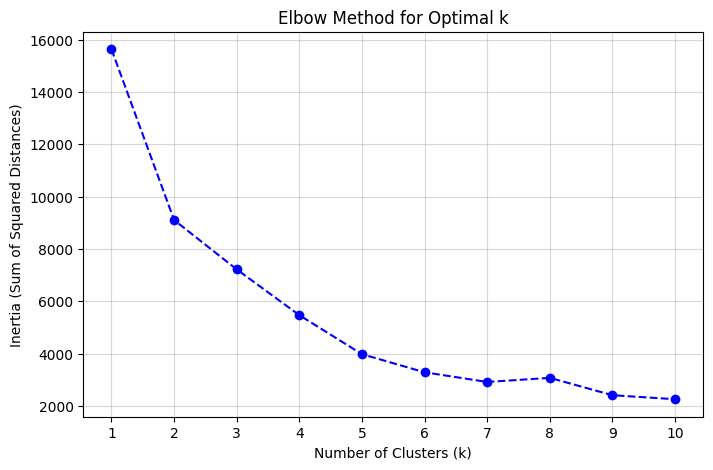

Elbow Method: year_season_features
Model 'kmeans1' saved to 'saved_models\kmeans1.pkl'.
Model 'kmeans2' saved to 'saved_models\kmeans2.pkl'.
Model 'kmeans3' saved to 'saved_models\kmeans3.pkl'.
Model 'kmeans4' saved to 'saved_models\kmeans4.pkl'.
Model 'kmeans5' saved to 'saved_models\kmeans5.pkl'.
Model 'kmeans6' saved to 'saved_models\kmeans6.pkl'.
Model 'kmeans7' saved to 'saved_models\kmeans7.pkl'.
Model 'kmeans8' saved to 'saved_models\kmeans8.pkl'.
Model 'kmeans9' saved to 'saved_models\kmeans9.pkl'.
Model 'kmeans10' saved to 'saved_models\kmeans10.pkl'.


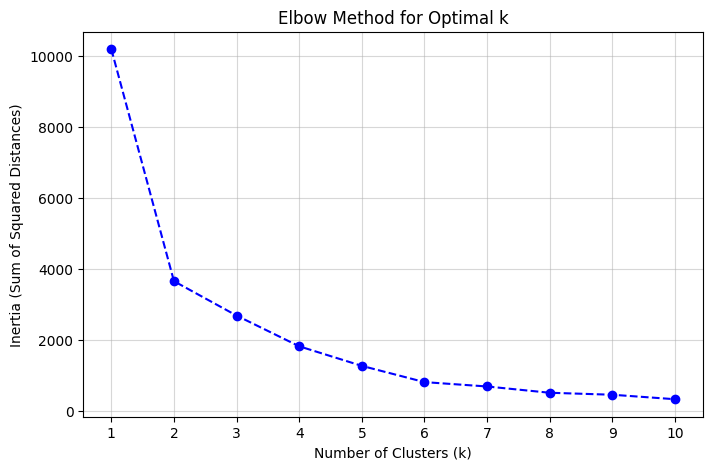

In [104]:
for dataset_name, data in datasets.items(): 
    print(f"Elbow Method: {dataset_name}")
    elbow_method(data, max_k=10)

KNN METHOD

KNN Method with min_samples= 6: features
Model 'knn6' saved to 'saved_models\knn6.pkl'.


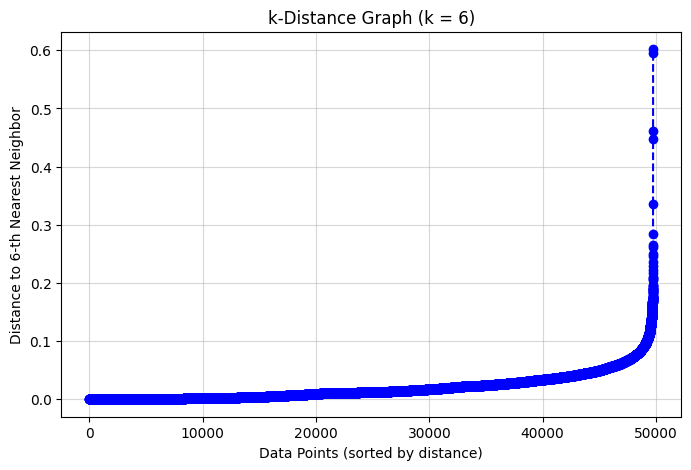

KNN Method with min_samples= 3: year_season_features
Model 'knn3' saved to 'saved_models\knn3.pkl'.


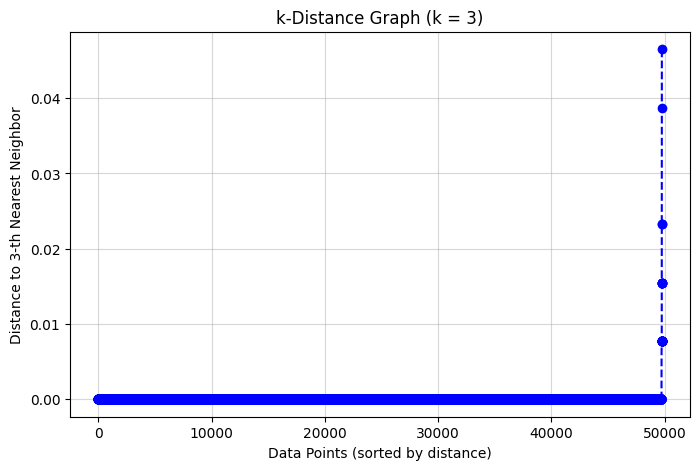

In [105]:

for dataset_name, data in datasets.items():
    print(f"KNN Method with min_samples= {data.shape[1]+1}: {dataset_name}")
    find_eps(data,data.shape[1]+1)



KNN Method with min_samples= 10: features
Model 'knn10' saved to 'saved_models\knn10.pkl'.


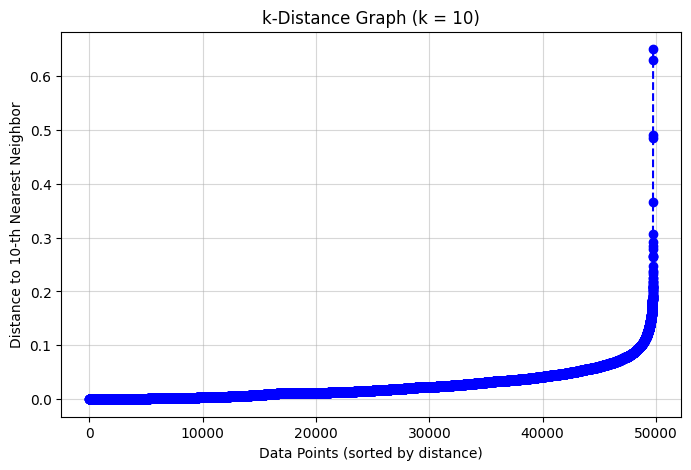

KNN Method with min_samples= 4: year_season_features
Model 'knn4' saved to 'saved_models\knn4.pkl'.


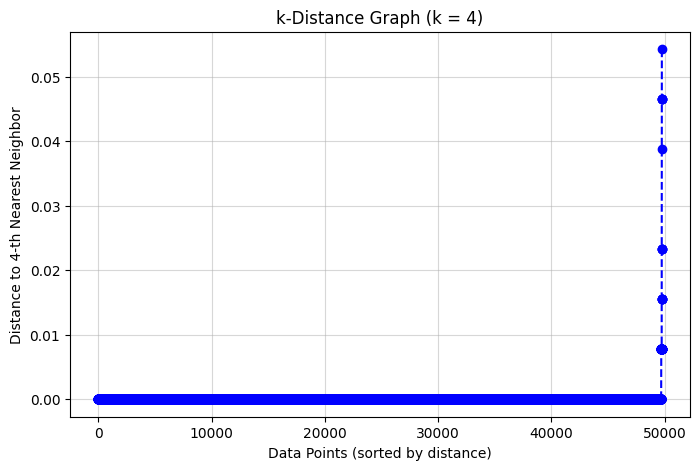

In [106]:

for dataset_name, data in datasets.items():
    print(f"KNN Method with min_samples= {data.shape[1]*2}: {dataset_name}")
    find_eps(data,data.shape[1]*2)

Clustering

In [107]:
def visualize_clustering(data, labels, cluster_name, cluster_centers, title="PCA Visualization"):
    """
    Visualizes a dataset in 2D or 3D using PCA, and also displays a heatmap of cluster centers.

    Parameters:
        data (array-like or DataFrame): The dataset to reduce and visualize (features only).
        labels (array-like, optional): Labels for coloring the data points (e.g., cluster or class labels).
        cluster_name (array-like, optional): Cluster labels used for calculating cluster centers.
        cluster_centers (array-like or DataFrame): The cluster centers in the original feature space.
        title (str): The title for the plot. Default is "PCA Visualization".

    Returns:
        None: Displays a 2D or 3D scatter plot and a heatmap.
    """
    print(f"Plot Title: {title}")
    
    # Determine n_components based on the number of features
    n_components = 2 if data.shape[1] == 2 else 3
    pca = PCA(n_components=n_components)

    # Fit PCA to the data and transform it
    pca_result = pca.fit_transform(data)

    # Explained variance ratio
    explained_variance = pca.explained_variance_ratio_
    print(f"Explained Variance Ratios ({n_components} Components):", explained_variance)
    print("Total Explained Variance:", sum(explained_variance))

    # Calculate cluster centers in PCA-transformed space
    cluster_centers_pca=None
    if cluster_centers is not None:
        cluster_centers_pca = pca.transform(cluster_centers)

    # Plot based on n_components
    if n_components == 2:
        # Create 2D scatter plot
        plt.figure(figsize=(10, 7))
        scatter = plt.scatter(
            pca_result[:, 0], pca_result[:, 1],
            c=labels, cmap='viridis', s=50, alpha=0.7, edgecolor='k'
        )
        if cluster_centers_pca is not None:
            plt.scatter(
                cluster_centers_pca[:, 0], cluster_centers_pca[:, 1],
                c='red', marker='X', s=200, label='Cluster Centers'
            )
        plt.title(title, fontsize=14)
        plt.xlabel(f"PC1 ({explained_variance[0]:.2%})")
        plt.ylabel(f"PC2 ({explained_variance[1]:.2%})")
        if labels is not None:
            cbar = plt.colorbar(scatter)
            cbar.set_label('Labels')
        plt.legend()
        plt.show()

    else:
        # Create 3D scatter plot
        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(
            pca_result[:, 0], pca_result[:, 1], pca_result[:, 2],
            c=labels, cmap='viridis', s=50, alpha=0.7, edgecolor='k'
        )
        if cluster_centers_pca is not None:
            ax.scatter(
                cluster_centers_pca[:, 0], cluster_centers_pca[:, 1], cluster_centers_pca[:, 2],
                c='red', marker='X', s=200, label='Cluster Centers'
            )
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(f"PC1 ({explained_variance[0]:.2%})")
        ax.set_ylabel(f"PC2 ({explained_variance[1]:.2%})")
        ax.set_zlabel(f"PC3 ({explained_variance[2]:.2%})")
        if labels is not None:
            cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
            cbar.set_label('Labels')
        ax.legend()
        plt.show()


    if cluster_centers is not None:
        # Heatmap of cluster means
        plt.figure(figsize=(12, 8))
        sns.heatmap(cluster_centers, annot=True, cmap='coolwarm', fmt=".2f")
        plt.title('Mean Feature Values for Each Cluster')
        plt.xlabel('Features')
        plt.ylabel('Clusters')
        plt.show()


In [108]:
# لیست برای ذخیره ارزیابی‌ها
evaluation_results = []

# تابعی برای اجرای خوشه‌بندی و ارزیابی
def run_clustering(data, algorithm, params):
    # استانداردسازی داده‌ها

    if algorithm == "KMeans":
        kmeans = KMeans(**params, random_state=42)
        labels = kmeans.fit_predict(data)
        score = silhouette_score(data, labels)
        db_score = davies_bouldin_score(data, labels)

        for _,k in params.items():
            models_dict={
            f"kmeans{k}":kmeans
            }
        

        # Save the models
        save_models(models_dict)
        return labels, score, db_score,kmeans
    
    elif algorithm == "DBSCAN":
        dbscan = DBSCAN(**params)
        labels = dbscan.fit_predict(data)
        if len(set(labels)) > 1:  # اگر بیش از یک خوشه وجود داشت
            score = silhouette_score(data, labels)
            db_score = davies_bouldin_score(data, labels)
        else:
            score, db_score = -1, -1  # اگر خوشه‌بندی مناسب نبود
        
        for _,eps in params.items():
            models_dict={
            f"dbscan{eps}":dbscan
            }
            break

        # Save the models
        save_models(models_dict)
        return labels, score, db_score



In [109]:
import matplotlib.pyplot as plt

def plot_genre_counts(df,data, cluster, genre_column, cluster_column,clustername="", top_n=10):
    """
    Bar plots the counts of genres in a specific cluster.

    Parameters:
    - data: pandas DataFrame containing the data.
    - cluster: The cluster number to filter by.
    - genre_column: The column name representing genres.
    - cluster_column: The column name representing cluster assignments.
    
    Returns:
    - A bar plot of genre counts for the specified cluster.
    """
    # Filter data for the specific cluster
    cluster_data = df[data[cluster_column] == cluster]
    
    # Count genres in the filtered cluster
    genre_counts = cluster_data[genre_column].value_counts().head(top_n)
    
    # Plot the genre counts as a bar chart
    plt.figure(figsize=(10, 6))
    genre_counts.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Genre Counts for Cluster {cluster} representing {clustername}', fontsize=14)
    plt.xlabel('Genres', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


In [110]:
def analyze_and_plot_clusters(
    data, cluster_column, release_year_column, release_season_column, genre_column, feature_columns, title="Cluster Analysis"
):
    """
    Analyze and plot patterns in clusters based on release year and season.

    Parameters:
        data (DataFrame): The dataset containing the clustering results and relevant features.
        cluster_column (str): The column containing cluster labels.
        release_year_column (str): The column containing the release year.
        release_season_column (str): The column containing the release season.
        genre_column (str): The column containing movie genres or styles.
        feature_columns (list of str): The columns containing numeric features for pattern analysis.
        title (str): The title for the overall analysis.

    Returns:
        None: Displays plots of patterns and feature analysis.
    """

   
    
    

    data['year_season'] = data[release_year_column].astype(str) + " - " + data[release_season_column]



    
    for cluster in data[cluster_column].unique():
        # Count genre occurrences per year-season-cluster
        data_cluster=data[data[cluster_column]==cluster]
        genre_distribution =data_cluster.groupby(['year_season', genre_column]).size().reset_index(name='count')

        # Filter for max count per year_season
        genre_distribution = genre_distribution.loc[genre_distribution.groupby('year_season')['count'].idxmax()]

        genre_distribution=genre_distribution.sample(n=min(genre_distribution.shape[0],10))

        
        # Plot the distribution of genres
        plt.figure(figsize=(12, 8))
        sns.barplot(
            data=genre_distribution,
            x='year_season',
            y='count',
            hue=genre_column,
            dodge=True
        )
        plt.title(f'Distribution of Genres by Year and Season CLUSTER : {cluster}', fontsize=14)
        plt.xlabel('Year-Season', fontsize=12)
        plt.ylabel('Count of Movies', fontsize=12)
        plt.xticks(rotation=45, fontsize=10)
        plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
        plt.tight_layout()
        plt.show()

    


In [111]:
df_cleaned['release_year_int'] = df_cleaned['release_year'].astype(int)
df_cleaned['release_season_int'] = df_cleaned['release_season_encoded'].astype(int)

    # Concatenate year and season to create 'year_season' in the format YYYYN
df_cleaned['year_season_num'] = df_cleaned['release_year'].astype(str) + df_cleaned['release_season_int'].astype(str)

In [112]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_linear_budget_per_cluster(df,cluster):
    # Ensure 'year_season' is treated as an integer
    
    df['year_season_num'] = df['year_season_num'].astype(int)
    
    # Group by 'year_season' and 'cluster' to calculate the total budget
    budget_data = df.groupby(['year_season_num', cluster])['budget'].sum().reset_index()

    # Pivot the dataframe to get clusters as columns and 'year_season' as rows
    pivot_df = budget_data.pivot(index='year_season_num', columns=cluster, values='budget')

    # Plotting
    pivot_df.plot(kind='line', marker='o', figsize=(10, 6))

    # Customizing plot
    plt.title('Linear Budget Per Cluster by Year Season')
    plt.xlabel('Year Season (YYYYN)')
    plt.ylabel('Total Budget')
    plt.legend(title='Cluster')
    plt.xticks(rotation=45)
    plt.grid(True)

    # Show plot
    plt.tight_layout()
    plt.show()


Processing dataset: features
Model 'kmeans2' saved to 'saved_models\kmeans2.pkl'.
Samples from each KMeans cluster:

Cluster 0:
Cluster Variance for overview_similarity: 0.005176957353831387


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['KMEANS']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,vote_average,budget
33773,Alla ricerca dell'idolo artico,Animation,Unknown,No Language,Short,Summer,0.000,0.0
21454,Glitch,Animation,When a normal meal takes a turn for the surrea...,English,Short,Summer,0.000,0.0
33308,Worlds Collided - The Season Two - Part Two,"Animation, Adventure, Family, Drama","After the events of the first season, Zoey sta...",Portuguese,Short,Summer,0.000,0.0
33438,Ruled Surface,Animation,A hypnotic series of lines made from embroider...,English,Short,Winter,0.000,0.0
28232,Jack and Jill,Animation,One of four computer animated short films in t...,English,Short,Summer,0.000,0.0
22654,Died In The Wool,Animation,An Aesop’s Film Fables cartoon.,No Language,Short,Summer,0.000,0.0
32303,Aura Battler Dunbine Memorial,"Animation, Adventure, Science Fiction",Recaps of Aura Battler Dunbine originally rele...,Japanese,Short,Summer,0.000,0.0
2579,Digimon Adventure tri. Part 4: Loss,"Animation, Adventure, Action","Upon arriving at the Digital World after the ""...",Japanese,Standard,Winter,6.854,0.0
36437,Dalmatians 101,"Family, Documentary, Animation",Bonus short on the 101 Dalmatians Diamond Edit...,English,Short,Winter,0.000,0.0
14721,About Animal And People,Animation,A story about animal cruelty,No Language,Short,Winter,6.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS
0,0.498641,0.666667,0.233444,0.231405,0.965532,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0
12,0.518004,1.000000,0.233444,0.231405,0.961594,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0
16,0.507174,1.000000,0.233444,0.390083,0.987202,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0


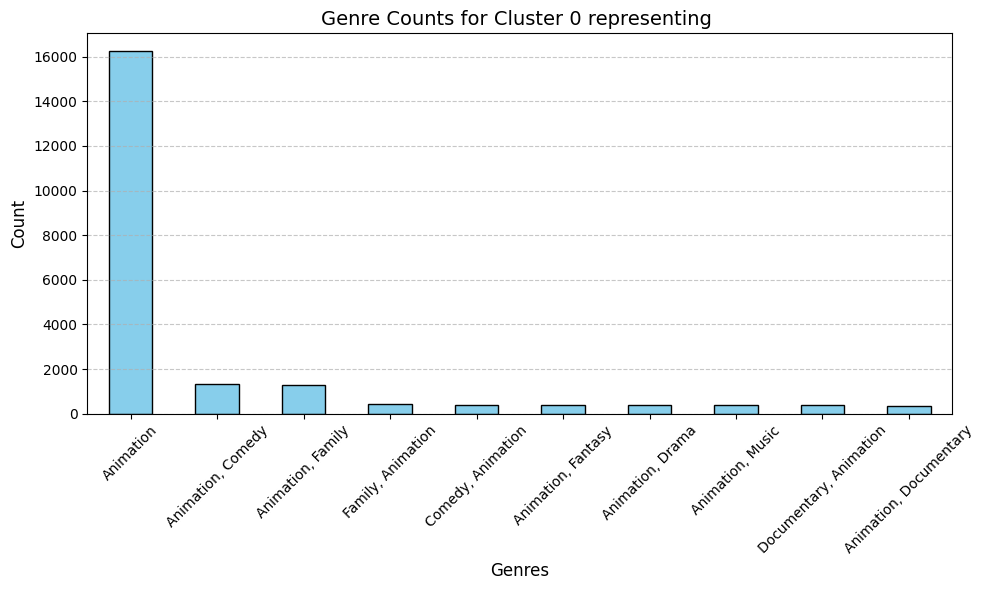


Cluster 1:
Cluster Variance for overview_similarity: 0.0038769926815583524


,title,genres,overview,spoken_languages,runtime_category,release_season,vote_average,budget
22983,Dwarfism,Animation,"A story about small ambitions, a small person.",No Language,Short,Spring,0.0,0.0
3529,Fate/Grand Order the Movie: Divine Realm Of Th...,"Animation, Action, Adventure, History, Drama, ...",Part two of Fate/Grand Order: Shinsei Entaku R...,Japanese,Short,Spring,6.0,0.0
41649,Strawberry Shortcake: Berry Brick Road,Animation,Strawberry Shortcake and her friends journey o...,English,Standard,Spring,0.0,0.0
46347,Alone Together,"Documentary, Animation",How one doctor’s family is navigating COVID-19,No Language,Short,Spring,0.0,0.0
624,A Shaun the Sheep Movie: Farmageddon,"Comedy, Animation, Family",When an alien with amazing powers crash-lands ...,English,Standard,Fall,6.9,0.0
12689,The Chinaman,"Comedy, Animation",Max Fleischer considers hiring a new cartoonis...,No Language,Short,Spring,7.0,0.0
40886,Around the Lake,Animation,This short animated film was written and direc...,French,Short,Spring,0.0,0.0
9758,La Balançoire,Animation,Praxinoscope animation of two children playing...,No Language,Short,Spring,4.5,0.0
31448,His Last Legs,Animation,A Judge Rummy short.,English,Short,Spring,0.0,0.0
47753,Engineer Fedorovich,"Documentary, Animation",My grandmother is 96 years old. She dreamed of...,Russian,Short,Fall,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS
1,0.518004,0.333333,0.233444,0.231405,0.940685,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1
3,0.470063,0.000000,0.233444,0.449587,0.992498,1
5,0.577550,0.000000,0.233444,0.231405,0.969747,1
6,0.518004,0.000000,0.900000,0.231405,0.976711,1
8,0.516890,0.000000,0.233444,0.505785,0.957682,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1
11,0.514278,0.000000,0.233444,0.231405,0.944390,1
14,0.503875,0.000000,0.233444,0.231405,0.931199,1
19,0.577550,0.000000,0.233444,0.231405,0.966440,1


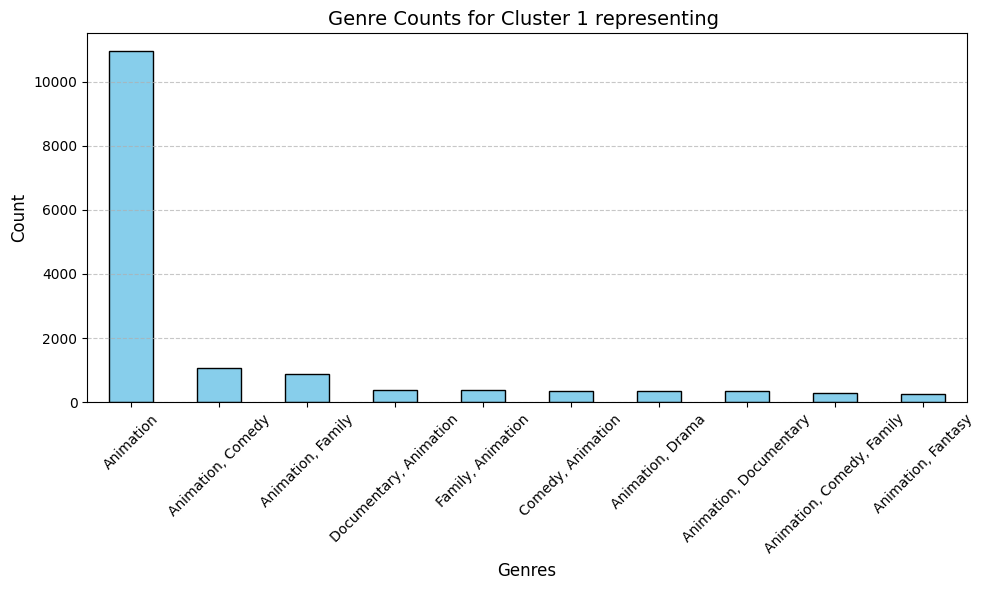

KMeans with k=2 | Silhouette Score: 0.391, DB Index: 1.113, clusters ;2
Plot Title: KMeans Clustering on features with k=2
Explained Variance Ratios (3 Components): [0.69007607 0.1464073  0.10978708]
Total Explained Variance: 0.9462704517476562


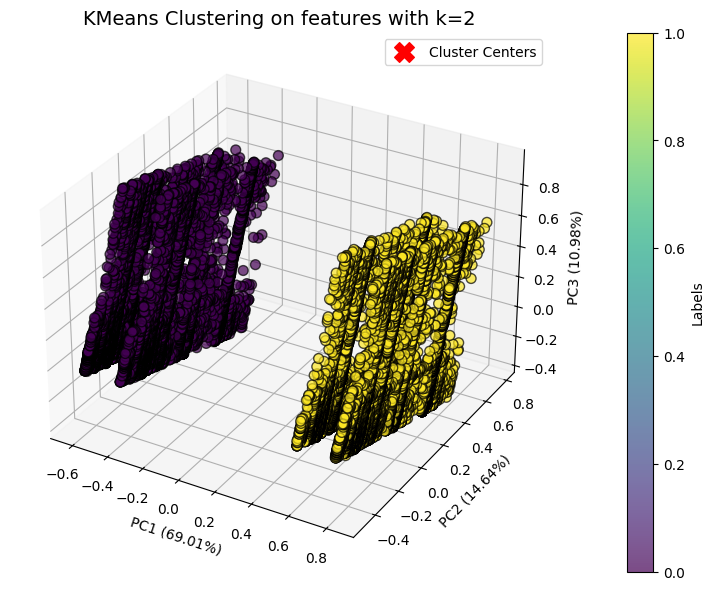

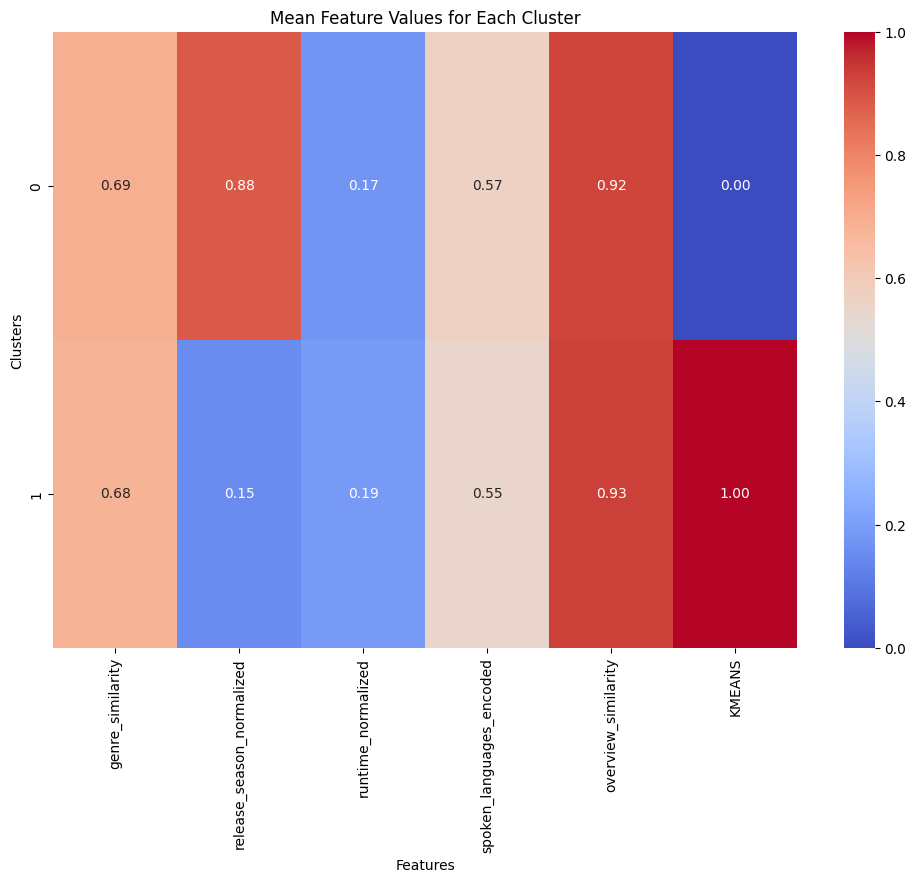

Model 'dbscan0.09' saved to 'saved_models\dbscan0.09.pkl'.
Model 'dbscan0.09' saved to 'saved_models\dbscan0.09.pkl'.
Model 'dbscan0.09' saved to 'saved_models\dbscan0.09.pkl'.
Model 'dbscan0.1' saved to 'saved_models\dbscan0.1.pkl'.
Model 'dbscan0.1' saved to 'saved_models\dbscan0.1.pkl'.
Model 'dbscan0.1' saved to 'saved_models\dbscan0.1.pkl'.
Model 'dbscan0.2' saved to 'saved_models\dbscan0.2.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:
Cluster Variance for overview_similarity: 0.0724334001209151


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
44159,Excellencies,Animation,Excellencies...,No Language,Short,Spring,Spring,0.0,0.0
16373,Ayas,"Animation, Family",Turkish animated film.,Turkish,Standard,Fall,Fall,5.0,0.0
23116,The Transporters,Animation,The Transporters,No Language,Standard,Winter,Winter,0.0,0.0
11366,Masameer: Taharyat Kalb,Animation,A short movie from the popular series,Arabic,Standard,Spring,Spring,7.7,0.0
33509,Happy new year from Al Gore,"Comedy, Animation",^{§&+≠€\_/99/,No Language,Short,Fall,Fall,0.0,0.0
31571,PINK BxxCH CLUB,"Animation, Horror, Music",#PINKBITCHCLUB,Japanese,Short,Fall,Fall,0.0,0.0
24513,I'm Dusya,Animation,I am Dusya.,Russian,Short,Fall,Fall,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
11366,0.776370,0.333333,0.466667,0.013223,0.710308,1,-1
16373,0.634904,0.000000,0.911111,0.983471,0.622815,1,-1
23116,0.776370,1.000000,0.833333,0.823140,0.118911,0,-1
24513,0.776370,0.000000,0.011111,0.877686,0.000000,1,-1
31571,0.514288,0.000000,0.011111,0.720661,0.164605,1,-1
33509,0.616669,0.000000,0.011111,0.823140,0.283248,1,-1
44159,0.776370,0.333333,0.111111,0.823140,0.155368,1,-1


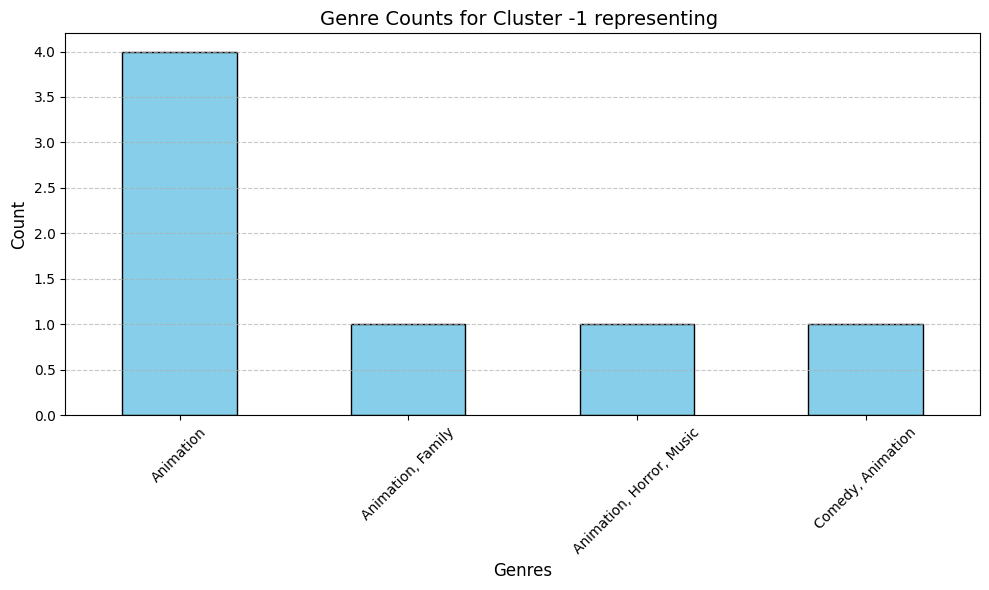


Cluster 0:
Cluster Variance for overview_similarity: 0.003856067765396


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
4381,Wind,Animation,An animated short about the daily life of peop...,No Language,Short,Summer,Summer,6.4,0.0
46887,"He Was Not Ill, Only Unhappy","Animation, Comedy",Poor little dear! This time our little Snookum...,No Language,Short,Summer,Summer,0.0,0.0
41840,Maps: Legendary Space Wanderers,"Animation, Science Fiction, Adventure, Drama",High School student Gen and his girlfriend Osh...,Japanese,Standard,Summer,Summer,0.0,0.0
30727,Oppai no Ouja 48,Animation,Unknown,"English, Japanese",Short,Summer,Summer,0.0,0.0
33175,"Goodbye, People",Animation,The story is about a boy who is looking for a ...,Russian,Short,Summer,Summer,0.0,0.0
47319,Bird Symphony,"Animation, Music",This CinemaScope Terrytoon presents a symphony...,English,Short,Summer,Summer,0.0,0.0
3776,Our Lady of the Sphere,"Animation, Fantasy",Animation using cutout animation to craft a bi...,No Language,Short,Summer,Summer,5.0,0.0
14536,Brother Brat,"Animation, Comedy","A ""Rosie the Riveter"" type is in need of a bab...",English,Short,Summer,Summer,7.0,0.0
12083,Stationery,Animation,A woman must find paperclips for a report to b...,English,Short,Summer,Summer,4.0,0.0
13361,Donkey Kong Country: The Legend of the Crystal...,Animation,"It's the wildest, hairiest, most fur-ocious Do...",English,Standard,Summer,Summer,4.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
0,0.498641,0.666667,0.233444,0.231405,0.965532,0,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0,0
20,0.488804,0.666667,0.233444,0.231405,0.985556,0,0
23,0.516890,0.666667,0.233444,0.231405,0.971339,0,0


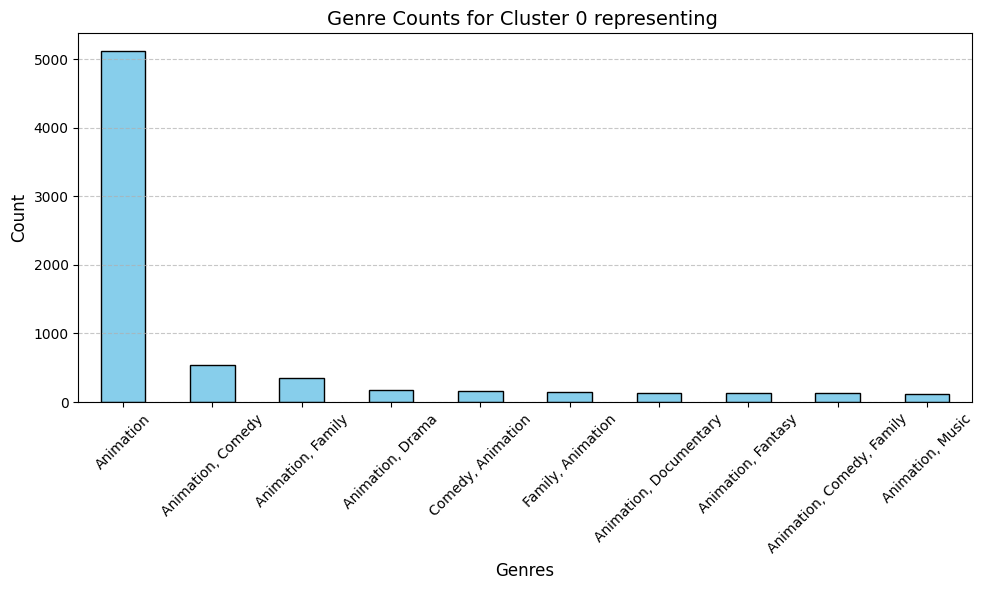


Cluster 1:
Cluster Variance for overview_similarity: 0.004255284329889616


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
28181,Inside the Digi-Tale,"Animation, Comedy","This is me, Fernanda Goshdarlin (ferry for sho...",English,Short,Spring,Spring,0.000,0.0
5586,Snow Excuse,Animation,"Speedy Gonzales, living in the snowy mountains...",English,Short,Spring,Spring,4.900,0.0
25711,True Tail - Pilot Animatic,"Animation, Fantasy, Adventure","It follows the adventures of a young kitten, n...",English,Short,Spring,Spring,0.000,0.0
11694,Running Lights,"Animation, Drama, Family",This is a story about the eternal miracle of l...,No Language,Short,Spring,Spring,6.500,0.0
8038,As Novas Aventuras da Turma da Mônica,"Animation, Adventure, Comedy, Family","Embarking on an exciting journey, the Monica g...",Portuguese,Standard,Spring,Spring,6.400,0.0
1801,Free Jimmy,"Animation, Comedy","Four stoners, five vegans, three mobsters, fou...","English, Norwegian",Standard,Spring,Spring,5.218,0.0
5499,Bottle,Animation,A transoceanic conversation between two charac...,No Language,Short,Spring,Spring,7.000,0.0
24430,Balance and Swing,Animation,A woman grows.,English,Short,Spring,Spring,0.000,0.0
46397,POP JUNKIE,Animation,"TV shows, manga, music, movies, plays, pop sta...","English, Japanese",Short,Spring,Spring,0.000,0.0
18500,Bugs and Daffy: The Wartime Cartoons,"Documentary, War, Animation",Leonard Maltin introduces us to and takes us b...,English,Standard,Spring,Spring,8.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
1,0.518004,0.333333,0.233444,0.231405,0.940685,1,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1,1
21,0.518004,0.333333,0.900000,0.231405,0.958418,1,1
22,0.514278,0.333333,0.233444,0.231405,0.951925,1,1
27,0.501385,0.333333,0.233444,0.231405,0.940977,1,1
33,0.518004,0.333333,0.955556,0.279339,0.977272,1,1
39,0.518004,0.333333,0.233444,0.231405,0.989882,1,1
47,0.501385,0.333333,0.233444,0.231405,0.943472,1,1
58,0.602897,0.333333,0.955556,0.720661,0.931030,1,1


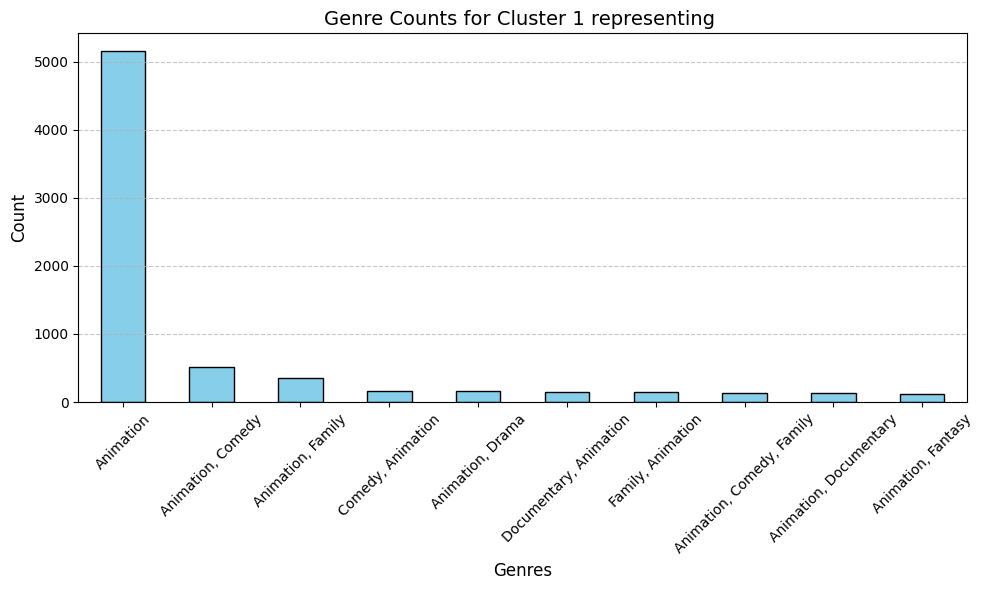


Cluster 2:
Cluster Variance for overview_similarity: 0.003327554627924643


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
3897,Bratz: Passion 4 Fashion - Diamondz,"Family, Animation, Adventure","Bratz girls Cloe, Jade, Sasha, and Yasmin driv...",English,Standard,Fall,Fall,5.75,0.0
5146,Odor of the Day,"Animation, Comedy, Family","On a cold winter's day, a stray dog is looking...",English,Short,Fall,Fall,6.10,0.0
43126,Try to Fly,"Animation, Comedy, Drama",When a baby owl is pushed from the nest by her...,English,Short,Fall,Fall,0.00,0.0
8646,Granny's Sexual Life,"Animation, Documentary",A trip into grandma's intimate life shows the ...,Slovenian,Short,Fall,Fall,6.80,0.0
30080,"Goodbye, Drama!",Animation,"A poetic film about love, solitude, and emotio...",No Language,Short,Fall,Fall,0.00,0.0
16600,Liquid Love,"Documentary, Animation, Comedy",A critique of liquid love through sarcasm and ...,Spanish,Short,Fall,Fall,2.00,0.0
3795,Mickey's Parrot,Animation,A parrot belonging to an escaped killer washes...,English,Short,Fall,Fall,5.80,0.0
32697,L'étincelle,Animation,"A flame is looking for friendship, but he migh...",English,Short,Fall,Fall,0.00,0.0
16267,A Cycle of Cloud and Rain,Animation,An anthropomorphic cloud shares how it achieve...,Tagalog,Short,Fall,Fall,9.00,0.0
32430,Little Talks,Animation,A series of moments and conversations from tra...,English,Short,Fall,Fall,0.00,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
3,0.470063,0.0,0.233444,0.449587,0.992498,1,2
5,0.577550,0.0,0.233444,0.231405,0.969747,1,2
6,0.518004,0.0,0.900000,0.231405,0.976711,1,2
8,0.516890,0.0,0.233444,0.505785,0.957682,1,2
11,0.514278,0.0,0.233444,0.231405,0.944390,1,2
14,0.503875,0.0,0.233444,0.231405,0.931199,1,2
19,0.577550,0.0,0.233444,0.231405,0.966440,1,2
24,0.518004,0.0,0.233444,0.231405,0.992412,1,2
25,0.518004,0.0,0.233444,0.231405,0.969172,1,2
28,0.477516,0.0,0.233444,0.231405,0.954954,1,2


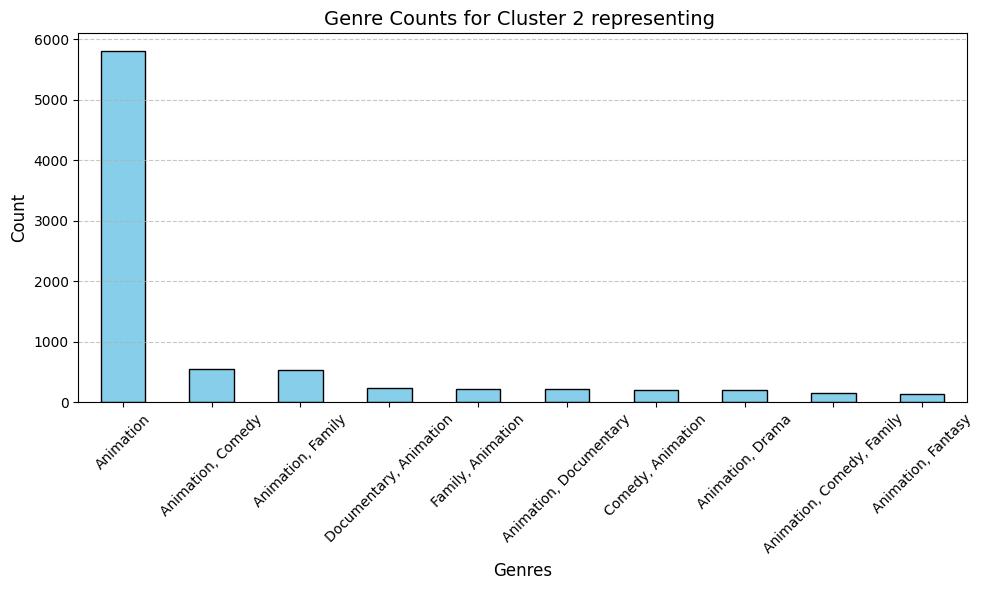


Cluster 3:
Cluster Variance for overview_similarity: 0.005801798751055971


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
35169,Moutons,"Animation, Family",Unknown,French,Short,Winter,Winter,0.000,0.0
25958,Listener Kids Sunday School POP,"Animation, Music, Family",Vol 2 is here! 1. This Is The Day That The Lo...,English,Short,Winter,Winter,0.000,0.0
45965,Sister and Brother,Animation,A sister and brother dream of the same adventu...,No Language,Short,Winter,Winter,0.000,0.0
15940,Thomas & Friends: Hooray For Thomas & Other Ad...,"Animation, Family",PEEP! PEEP! You're invited to the celebration ...,English,Short,Winter,Winter,10.000,0.0
18107,The Train Gang,Animation,Theatrical short made for Canadian Tire Corpor...,No Language,Short,Winter,Winter,5.000,0.0
28987,Homomania,Animation,"""in a few minutes we are presented with the wh...",Spanish,Short,Winter,Winter,0.000,0.0
3045,The Secret Adventures of Tom Thumb,"Animation, Science Fiction, Adventure, Horror",A boy born the size of a small doll is kidnapp...,English,Standard,Winter,Winter,6.625,0.0
49518,Carnalis,Animation,"Look at your hand from really close, choose a ...",Polish,Short,Winter,Winter,0.000,0.0
20765,Pandora in the Crimson Shell: Ghost Urn,"Action, Animation, Comedy, Science Fiction",In an age when large-scale natural disasters f...,Japanese,Standard,Winter,Winter,7.000,0.0
31942,Happy Drinking Birds,Animation,An Animated Short Film by Pacific Data Images.,No Language,Short,Winter,Winter,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
12,0.518004,1.0,0.233444,0.231405,0.961594,0,3
16,0.507174,1.0,0.233444,0.390083,0.987202,0,3
36,0.517672,1.0,0.233444,0.231405,0.981990,0,3
56,0.501385,1.0,0.233444,0.231405,0.952731,0,3
62,0.602897,1.0,0.233444,0.231405,0.959721,0,3
63,0.602897,1.0,0.922222,0.231405,0.935813,0,3
71,0.488804,1.0,0.233444,0.449587,0.973661,0,3
76,0.535771,1.0,0.822222,0.231405,0.983711,0,3
80,0.501385,1.0,0.866667,0.231405,0.946982,0,3
83,0.532320,1.0,0.233444,0.231405,0.960244,0,3


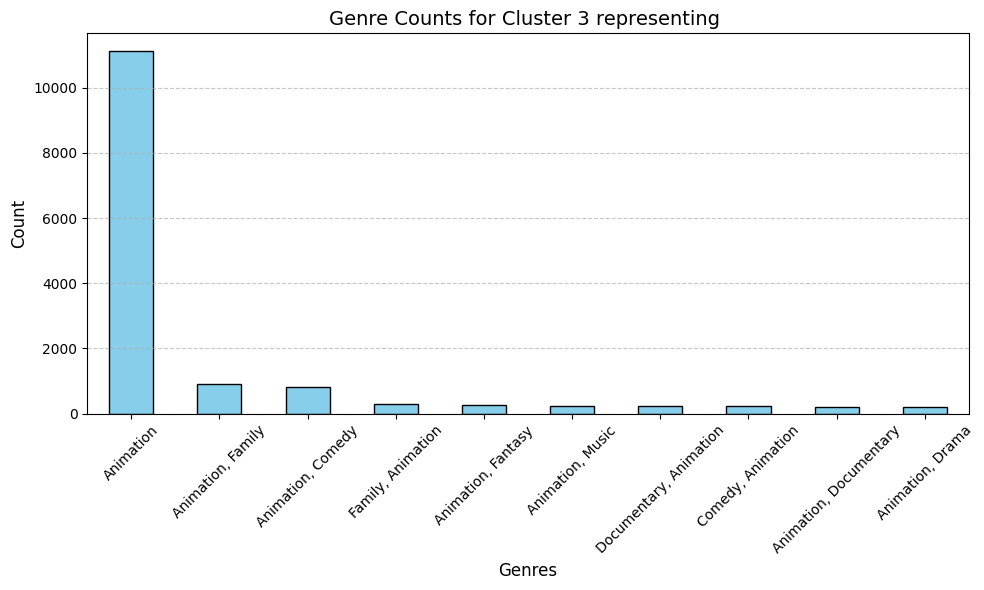

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.2, min_samples=6 | Silhouette Score: 0.214, DB Index: 2.067 ,clusters : 5
Plot Title: DBSCAN Clustering on features (eps=0.2, min_samples=6)
Explained Variance Ratios (3 Components): [0.72261149 0.18749451 0.0434576 ]
Total Explained Variance: 0.9535635929728434


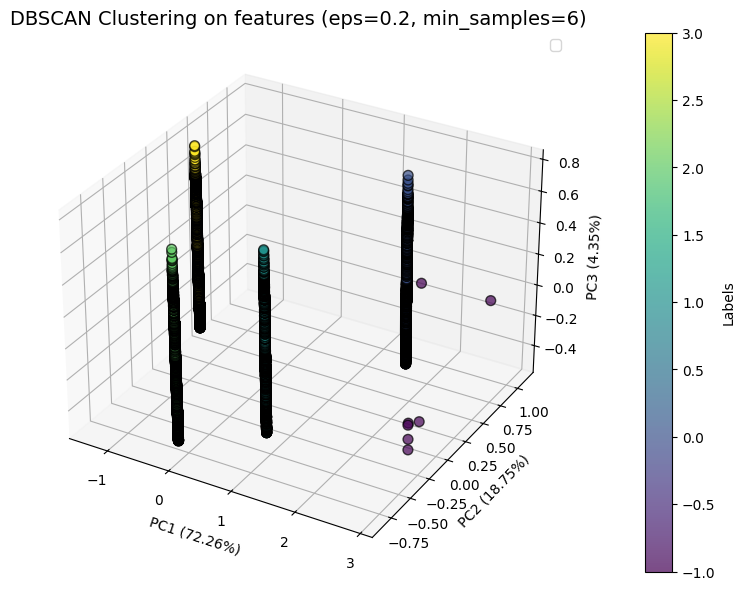

Model 'dbscan0.2' saved to 'saved_models\dbscan0.2.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:
Cluster Variance for overview_similarity: 0.07410333112274704


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
33509,Happy new year from Al Gore,"Comedy, Animation",^{§&+≠€\_/99/,No Language,Short,Fall,Fall,0.0,0.0
28638,Kahey - a Certain Captain's Life,Animation,An obscure film by dogakoba,No Language,Standard,Summer,Summer,0.0,0.0
23116,The Transporters,Animation,The Transporters,No Language,Standard,Winter,Winter,0.0,0.0
16373,Ayas,"Animation, Family",Turkish animated film.,Turkish,Standard,Fall,Fall,5.0,0.0
24513,I'm Dusya,Animation,I am Dusya.,Russian,Short,Fall,Fall,0.0,0.0
31571,PINK BxxCH CLUB,"Animation, Horror, Music",#PINKBITCHCLUB,Japanese,Short,Fall,Fall,0.0,0.0
44159,Excellencies,Animation,Excellencies...,No Language,Short,Spring,Spring,0.0,0.0
11366,Masameer: Taharyat Kalb,Animation,A short movie from the popular series,Arabic,Standard,Spring,Spring,7.7,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
11366,0.776370,0.333333,0.466667,0.013223,0.710308,1,-1
16373,0.634904,0.000000,0.911111,0.983471,0.622815,1,-1
23116,0.776370,1.000000,0.833333,0.823140,0.118911,0,-1
24513,0.776370,0.000000,0.011111,0.877686,0.000000,1,-1
28638,0.776370,0.666667,0.833333,0.823140,0.603673,0,-1
31571,0.514288,0.000000,0.011111,0.720661,0.164605,1,-1
33509,0.616669,0.000000,0.011111,0.823140,0.283248,1,-1
44159,0.776370,0.333333,0.111111,0.823140,0.155368,1,-1


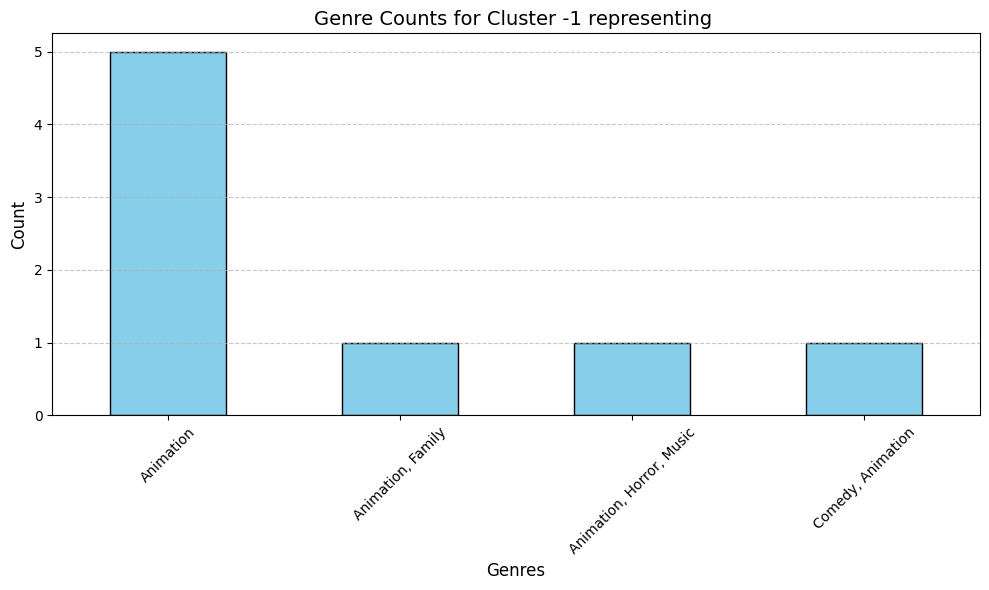


Cluster 0:
Cluster Variance for overview_similarity: 0.003845687963809986


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
18966,Prayer ''Our Father'',Animation,The small girl read a great Christian prayer,Russian,Short,Summer,Summer,6.000,0.0
8108,I'm Going Out for Cigarettes,Animation,Twelve-year-old Jonathan lives with his sister...,French,Short,Summer,Summer,6.200,0.0
13093,Bluehilda,"Animation, Adventure, Comedy, Fantasy",Bluehilda is raring to get out into the real w...,English,Short,Summer,Summer,8.500,0.0
27914,Who Will Pay the Bill?,Animation,Three experts provide deep insights into a hig...,German,Short,Summer,Summer,0.000,0.0
24699,Legend of Butlar,Animation,"An old Chinese legend tells the story of how, ...",Mandarin,Standard,Summer,Summer,0.000,0.0
27276,Listen to Me!,"Animation, Comedy",A little dog wants attention.,English,Short,Summer,Summer,0.000,0.0
8106,Little Quentin,Animation,This film was developed with the support from ...,No Language,Short,Summer,Summer,7.100,0.0
10396,The Artist's Dreams,Animation,An animated dachshund fools his live-action cr...,English,Short,Summer,Summer,5.200,0.0
7274,Aikatsu Stars! The Movie,Animation,With the intention of appearing in an event on...,Japanese,Standard,Summer,Summer,5.357,0.0
19523,Symphony in August: Shibuya 2002-2003,"Drama, Animation",Unknown,Japanese,Short,Summer,Summer,6.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
0,0.498641,0.666667,0.233444,0.231405,0.965532,0,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0,0
20,0.488804,0.666667,0.233444,0.231405,0.985556,0,0
23,0.516890,0.666667,0.233444,0.231405,0.971339,0,0


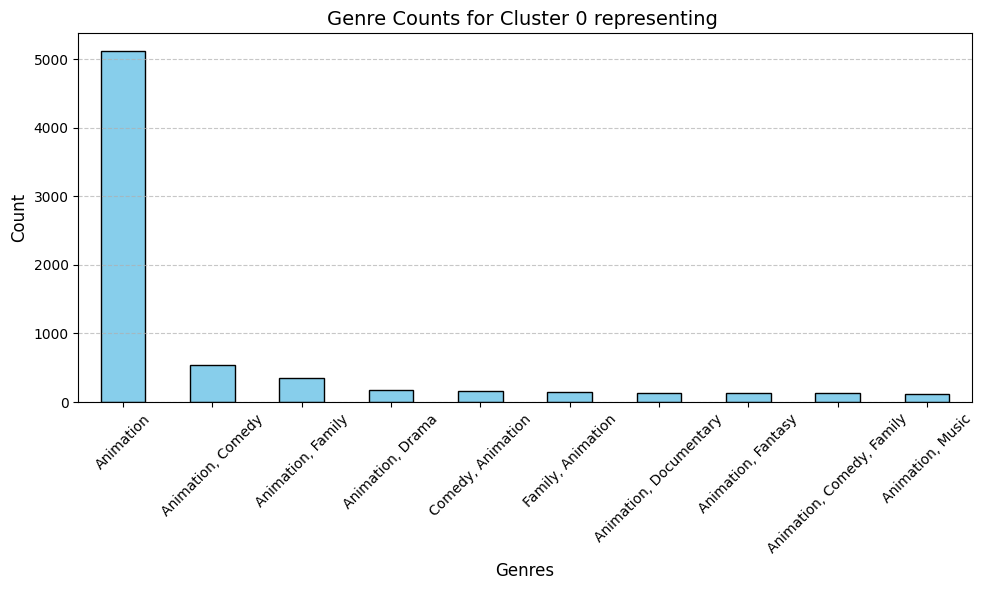


Cluster 1:
Cluster Variance for overview_similarity: 0.004255284329889616


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
27168,A Thief's Legacy,Animation,A thief in her dying bed.,English,Short,Spring,Spring,0.0,0.0
40875,The Town Musicians of Bremen,Animation,A donkey has grown old and weak after having w...,No Language,Short,Spring,Spring,0.0,0.0
45439,Tintin et la SGM,Animation,This short animated advertising cartoon promot...,French,Short,Spring,Spring,0.0,0.0
39452,Hupikék törpikék 10: A komisz trükkök doboza,Animation,Unknown,No Language,Short,Spring,Spring,0.0,0.0
31009,Rosario,Animation,Unknown,No Language,Short,Spring,Spring,0.0,0.0
35064,Thomas and Friends: Up Up & Away!,"Family, Animation",Thomas and Percy have a special Special as the...,No Language,Standard,Spring,Spring,0.0,0.0
28181,Inside the Digi-Tale,"Animation, Comedy","This is me, Fernanda Goshdarlin (ferry for sho...",English,Short,Spring,Spring,0.0,0.0
49480,Serial Parallels,"Animation, Documentary",This experimental animation approaches Hong Ko...,No Language,Short,Spring,Spring,0.0,0.0
14438,Woody and the Beanstalk,Animation,Woody Woodpecker inserted into the classic fai...,English,Short,Spring,Spring,8.0,0.0
4898,No Parking Hare,"Animation, Comedy",A construction worker wants to blast Bugs out ...,English,Short,Spring,Spring,6.5,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
1,0.518004,0.333333,0.233444,0.231405,0.940685,1,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1,1
21,0.518004,0.333333,0.900000,0.231405,0.958418,1,1
22,0.514278,0.333333,0.233444,0.231405,0.951925,1,1
27,0.501385,0.333333,0.233444,0.231405,0.940977,1,1
33,0.518004,0.333333,0.955556,0.279339,0.977272,1,1
39,0.518004,0.333333,0.233444,0.231405,0.989882,1,1
47,0.501385,0.333333,0.233444,0.231405,0.943472,1,1
58,0.602897,0.333333,0.955556,0.720661,0.931030,1,1


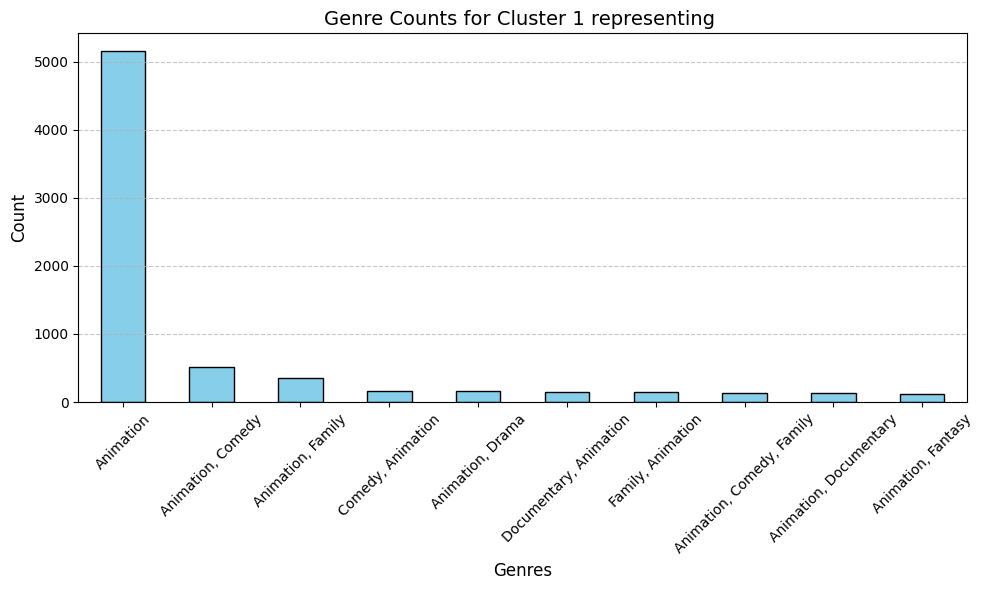


Cluster 2:
Cluster Variance for overview_similarity: 0.003327554627924643


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
32390,Attention! … Painting,"Documentary, Animation",Intended as a documentation of Polish artist a...,No Language,Short,Fall,Fall,0.0,0.0
10438,Dinner Time,"Comedy, Animation",Dinner Time is noted as the first sound cartoo...,English,Short,Fall,Fall,4.2,0.0
7797,Of Rice and Hen,Animation,"Miss Prissy, the slow-witted hen, sets out to ...",English,Short,Fall,Fall,5.7,0.0
23209,Take Him Down,"Animation, Comedy",Respawn! It’s for suckers.,English,Short,Fall,Fall,0.0,0.0
19765,The Anxiety Hound,Animation,"Leif is male dog, but his senile owner thinks ...",Swedish,Short,Fall,Fall,7.0,0.0
20440,Pitchin' Woo at the Zoo,"Animation, Comedy","Popeye takes Olive to the zoo, where she's spo...",English,Short,Fall,Fall,10.0,0.0
33711,Lullaby,Animation,A young family lives in a mountainous area nea...,Kazakh,Short,Fall,Fall,0.0,0.0
15119,Hermie & Friends: A Fruitcake Christmas,"Family, Animation",It's Christmastime in the garden and Hermie an...,No Language,Standard,Fall,Fall,7.5,0.0
48888,Bube Maises,Animation,A daughter uses postcards to re-create past mo...,Hebrew,Short,Fall,Fall,0.0,0.0
35254,Eden,Animation,A shepherd named Youzeck travels with his flut...,Polish,Standard,Fall,Fall,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
3,0.470063,0.0,0.233444,0.449587,0.992498,1,2
5,0.577550,0.0,0.233444,0.231405,0.969747,1,2
6,0.518004,0.0,0.900000,0.231405,0.976711,1,2
8,0.516890,0.0,0.233444,0.505785,0.957682,1,2
11,0.514278,0.0,0.233444,0.231405,0.944390,1,2
14,0.503875,0.0,0.233444,0.231405,0.931199,1,2
19,0.577550,0.0,0.233444,0.231405,0.966440,1,2
24,0.518004,0.0,0.233444,0.231405,0.992412,1,2
25,0.518004,0.0,0.233444,0.231405,0.969172,1,2
28,0.477516,0.0,0.233444,0.231405,0.954954,1,2


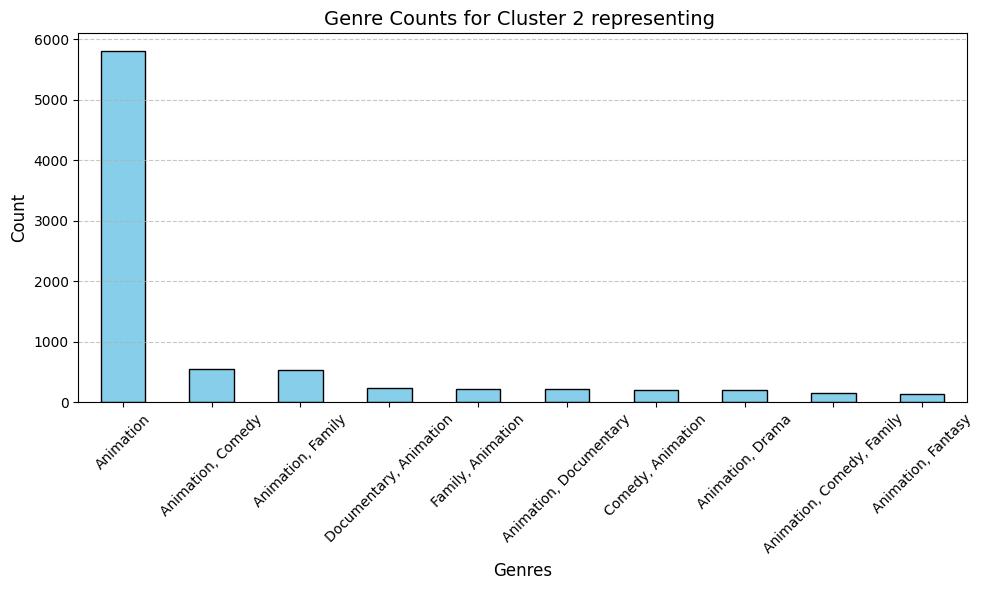


Cluster 3:
Cluster Variance for overview_similarity: 0.005801798751055971


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
37672,The Underground Movie,Animation,Everyone has wondered what it would be like to...,No Language,Short,Winter,Winter,0.000,0.0
41054,A Crushed World,Animation,"The experiences of a paper character crumpled,...",No Language,Short,Winter,Winter,0.000,0.0
26399,Alfred Jarry - Superfreak,Animation,"About the controversial French author, poet, a...",Swedish,Short,Winter,Winter,0.000,0.0
16430,There Goes Tomoe!,"Thriller, Animation, Action, Drama, Romance",The title character of Tomoe ga Yuku! (Tomoe W...,Japanese,Standard,Winter,Winter,5.500,0.0
25744,Max Trax,Animation,An Animated Short Film by Pacific Data Images.,No Language,Short,Winter,Winter,0.000,0.0
2388,Night Music,Animation,"Part of Three Hand-Painted Films, Night Music ...",No Language,Short,Winter,Winter,5.436,0.0
10817,Bobolink Pink,Animation,The Pink Panther tries to teach a small bird t...,English,Short,Winter,Winter,5.700,0.0
39055,WordWorld: My Fuzzy Valentine,"Family, Animation",My Fuzzy Valentine: When SHEEP decides she wan...,No Language,Short,Winter,Winter,0.000,0.0
15526,3 3ast 3 3urious,"Animation, Comedy",An animated parody of the first two F&F movies...,No Language,Short,Winter,Winter,6.000,0.0
44731,About Buka,Animation,"""About Buka"" by animator Nina Shorina, famous ...",No Language,Short,Winter,Winter,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
12,0.518004,1.0,0.233444,0.231405,0.961594,0,3
16,0.507174,1.0,0.233444,0.390083,0.987202,0,3
36,0.517672,1.0,0.233444,0.231405,0.981990,0,3
56,0.501385,1.0,0.233444,0.231405,0.952731,0,3
62,0.602897,1.0,0.233444,0.231405,0.959721,0,3
63,0.602897,1.0,0.922222,0.231405,0.935813,0,3
71,0.488804,1.0,0.233444,0.449587,0.973661,0,3
76,0.535771,1.0,0.822222,0.231405,0.983711,0,3
80,0.501385,1.0,0.866667,0.231405,0.946982,0,3
83,0.532320,1.0,0.233444,0.231405,0.960244,0,3


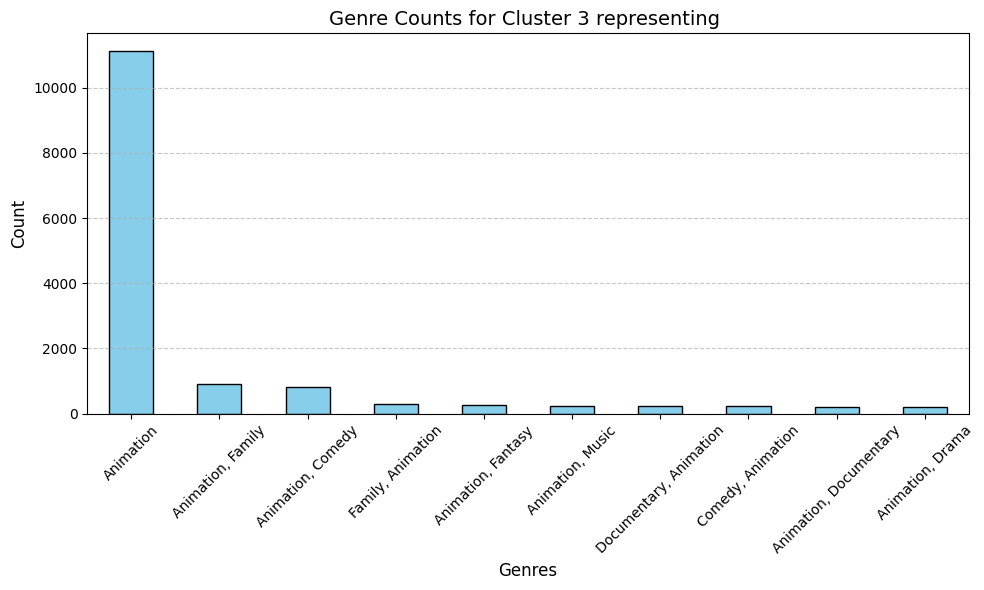

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.2, min_samples=10 | Silhouette Score: 0.661, DB Index: 0.710 ,clusters : 5
Plot Title: DBSCAN Clustering on features (eps=0.2, min_samples=10)
Explained Variance Ratios (3 Components): [0.72262193 0.1874885  0.04345551]
Total Explained Variance: 0.9535659401267886


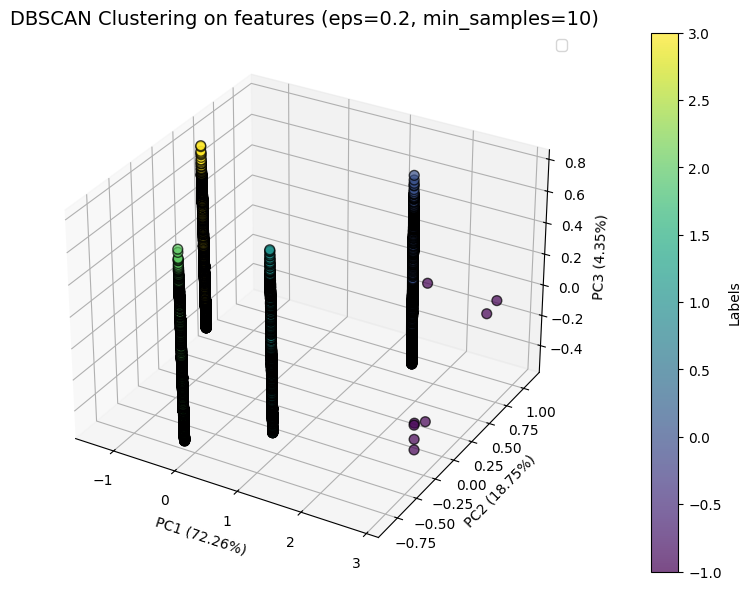

Model 'dbscan0.2' saved to 'saved_models\dbscan0.2.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:
Cluster Variance for overview_similarity: 0.07410333112274704


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
16373,Ayas,"Animation, Family",Turkish animated film.,Turkish,Standard,Fall,Fall,5.0,0.0
23116,The Transporters,Animation,The Transporters,No Language,Standard,Winter,Winter,0.0,0.0
44159,Excellencies,Animation,Excellencies...,No Language,Short,Spring,Spring,0.0,0.0
31571,PINK BxxCH CLUB,"Animation, Horror, Music",#PINKBITCHCLUB,Japanese,Short,Fall,Fall,0.0,0.0
33509,Happy new year from Al Gore,"Comedy, Animation",^{§&+≠€\_/99/,No Language,Short,Fall,Fall,0.0,0.0
24513,I'm Dusya,Animation,I am Dusya.,Russian,Short,Fall,Fall,0.0,0.0
11366,Masameer: Taharyat Kalb,Animation,A short movie from the popular series,Arabic,Standard,Spring,Spring,7.7,0.0
28638,Kahey - a Certain Captain's Life,Animation,An obscure film by dogakoba,No Language,Standard,Summer,Summer,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
11366,0.776370,0.333333,0.466667,0.013223,0.710308,1,-1
16373,0.634904,0.000000,0.911111,0.983471,0.622815,1,-1
23116,0.776370,1.000000,0.833333,0.823140,0.118911,0,-1
24513,0.776370,0.000000,0.011111,0.877686,0.000000,1,-1
28638,0.776370,0.666667,0.833333,0.823140,0.603673,0,-1
31571,0.514288,0.000000,0.011111,0.720661,0.164605,1,-1
33509,0.616669,0.000000,0.011111,0.823140,0.283248,1,-1
44159,0.776370,0.333333,0.111111,0.823140,0.155368,1,-1


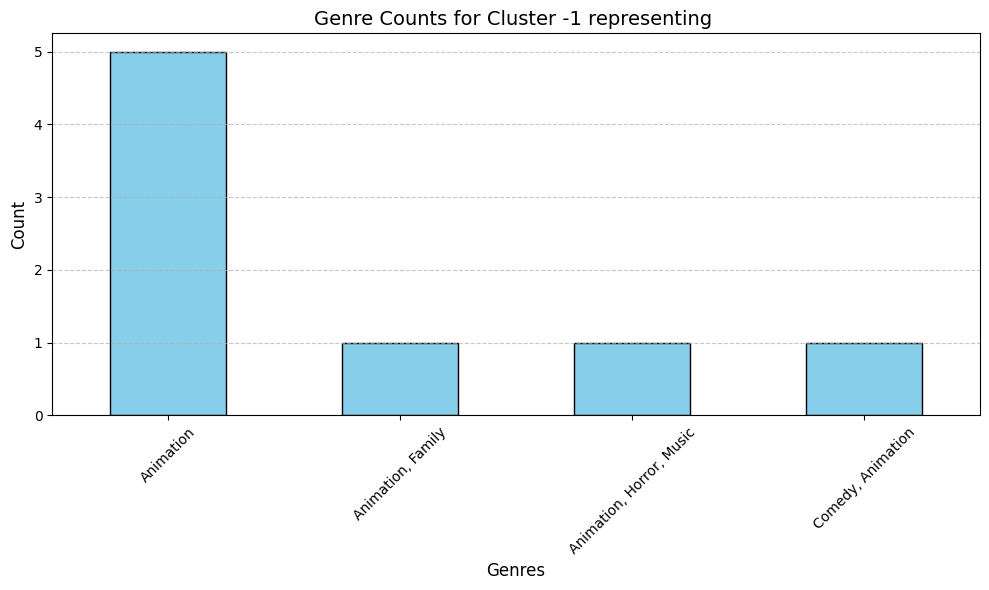


Cluster 0:
Cluster Variance for overview_similarity: 0.003845687963809986


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
31892,VOLTA,Animation,VOLTA is an impressive short - made entirely i...,No Language,Short,Summer,Summer,0.0,0.0
9319,Hiyokoi,"Animation, Romance",Nishiyama Hiyori is a really shy and short (on...,Japanese,Short,Summer,Summer,5.1,0.0
20444,Deposit for the Courier,"Action, Animation, Science Fiction, Thriller","The story line, set with in the year 2050, rev...",English,Short,Summer,Summer,5.0,0.0
41872,The very best of Bugs Bunny,"Family, Animation",Unknown,"Spanish, English",Short,Summer,Summer,0.0,0.0
46159,Tosca,Animation,Based on an old Russian folk song. This film w...,No Language,Short,Summer,Summer,0.0,0.0
966,Robot Chicken: Star Wars,"Animation, Comedy, Science Fiction, Action, TV...","A series of 30 sketches, following the hilario...","German, English",Short,Summer,Summer,7.2,0.0
39929,Not So Quiet,"Animation, War",Oswald the Rabbit is a WWI private charged wit...,English,Short,Summer,Summer,0.0,0.0
35301,One D,Animation,A brief adventure tale set in a one dimensiona...,English,Short,Summer,Summer,0.0,0.0
21180,Beware of Trains,Animation,A woman with extreme anxiety is devoured by fo...,English,Short,Summer,Summer,0.0,0.0
28737,Open,Animation,"Chico, the main character, moves from a distan...",Korean,Short,Summer,Summer,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
0,0.498641,0.666667,0.233444,0.231405,0.965532,0,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0,0
20,0.488804,0.666667,0.233444,0.231405,0.985556,0,0
23,0.516890,0.666667,0.233444,0.231405,0.971339,0,0


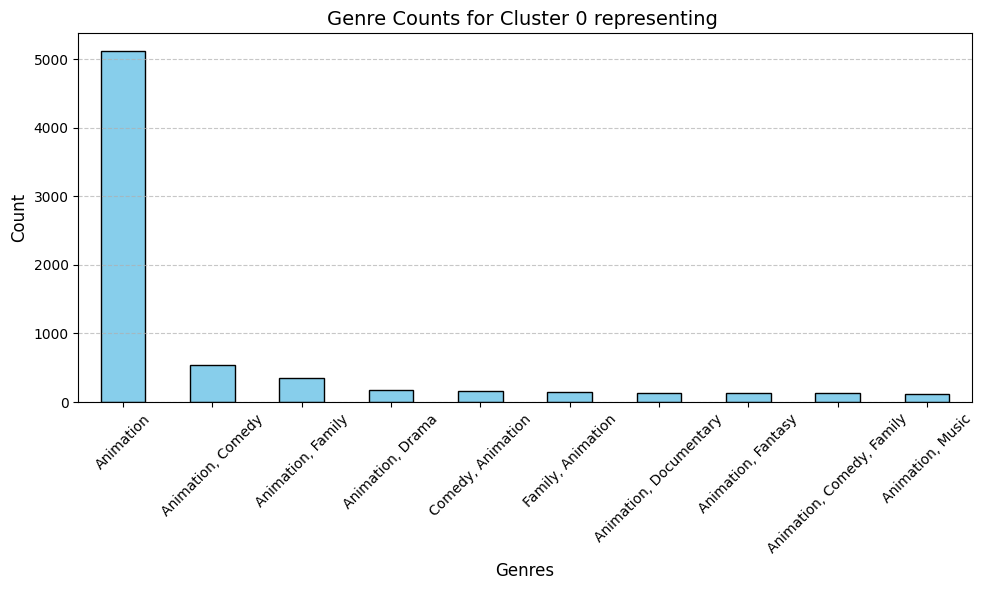


Cluster 1:
Cluster Variance for overview_similarity: 0.004255284329889616


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
34151,Foka the Handiman,Animation,The blacksmith Foka accidentally saves the pri...,Russian,Short,Spring,Spring,0.0,0.0
31654,上官海铃,"Animation, Drama",Unknown,No Language,Short,Spring,Spring,0.0,0.0
38350,Swimmer Take All,Animation,Popeye and Bluto are in a swimming race across...,English,Short,Spring,Spring,0.0,0.0
15573,White Box: Act II,"Animation, Mystery","A pony grasps the minimal world around them, a...",English,Short,Spring,Spring,9.0,0.0
33469,Space Camper Chicchi,Animation,Unknown,Japanese,Short,Spring,Spring,0.0,0.0
41649,Strawberry Shortcake: Berry Brick Road,Animation,Strawberry Shortcake and her friends journey o...,English,Standard,Spring,Spring,0.0,0.0
34993,"Don't Lose, Makendo!",Animation,Makenko used to be a normal boy—until he was k...,Japanese,Short,Spring,Spring,0.0,0.0
31217,The Red Balloon,Animation,A person holding a red baloon loses it to the ...,English,Short,Spring,Spring,0.0,0.0
20761,The Yellow Stork,Animation,The film is based on an ancient Chinese fairy ...,Russian,Short,Spring,Spring,6.0,0.0
48010,Black Hole Apocalypse,Animation,Short animation by Anchi Shen and Jiayu Hu,Mandarin,Short,Spring,Spring,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
1,0.518004,0.333333,0.233444,0.231405,0.940685,1,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1,1
21,0.518004,0.333333,0.900000,0.231405,0.958418,1,1
22,0.514278,0.333333,0.233444,0.231405,0.951925,1,1
27,0.501385,0.333333,0.233444,0.231405,0.940977,1,1
33,0.518004,0.333333,0.955556,0.279339,0.977272,1,1
39,0.518004,0.333333,0.233444,0.231405,0.989882,1,1
47,0.501385,0.333333,0.233444,0.231405,0.943472,1,1
58,0.602897,0.333333,0.955556,0.720661,0.931030,1,1


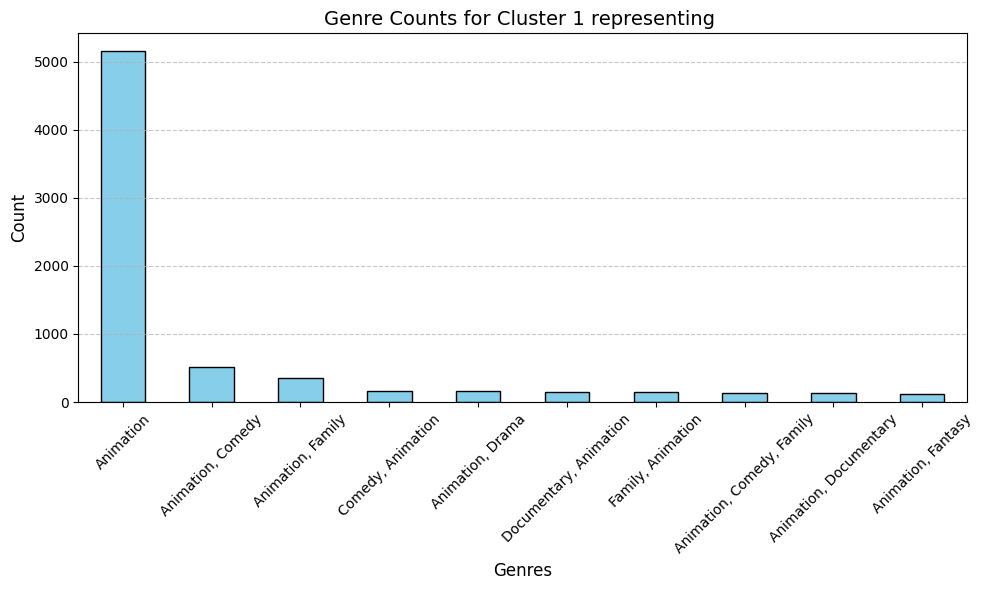


Cluster 2:
Cluster Variance for overview_similarity: 0.003327554627924643


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
16420,Theourgia,"Animation, Horror","Before history, God was defeated by the Prince...",No Language,Short,Fall,Fall,1.000,0.0
33758,Lupin III: Non-Stop Rendezvous,"Animation, Adventure, Comedy, Crime",Set before the meeting of Lupin and Rebecca. R...,Japanese,Short,Fall,Fall,0.000,0.0
39139,Rock 'N Learn: Letter Sounds,"Family, Animation",Energetic music and fun games build excitement...,No Language,Standard,Fall,Fall,0.000,0.0
41482,Hound for Pound,Animation,A Famous Studios cartoon.,English,Short,Fall,Fall,0.000,0.0
1019,Chico & Rita,"Animation, Music, Romance",Chico is a young piano player with big dreams....,"Spanish, English, French",Short,Fall,Fall,7.210,0.0
43687,Soul City,"Animation, Music",Unknown,English,Short,Fall,Fall,0.000,0.0
10427,Winnie the Pooh Discovers the Seasons,"Animation, Family",Christopher Robin gives Winnie the Pooh a cale...,English,Short,Fall,Fall,7.000,0.0
33635,Lumen,Animation,Lumen is a 2D animation that combines digital ...,No Language,Short,Fall,Fall,0.000,0.0
11359,Goldie Locks and the Three Bears,Animation,Goldie Locks and the Three Bears was a 1922 La...,No Language,Short,Fall,Fall,3.300,0.0
2890,The Cow,"Animation, Drama",Animated short based on the story of the same ...,Russian,Short,Fall,Fall,7.088,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
3,0.470063,0.0,0.233444,0.449587,0.992498,1,2
5,0.577550,0.0,0.233444,0.231405,0.969747,1,2
6,0.518004,0.0,0.900000,0.231405,0.976711,1,2
8,0.516890,0.0,0.233444,0.505785,0.957682,1,2
11,0.514278,0.0,0.233444,0.231405,0.944390,1,2
14,0.503875,0.0,0.233444,0.231405,0.931199,1,2
19,0.577550,0.0,0.233444,0.231405,0.966440,1,2
24,0.518004,0.0,0.233444,0.231405,0.992412,1,2
25,0.518004,0.0,0.233444,0.231405,0.969172,1,2
28,0.477516,0.0,0.233444,0.231405,0.954954,1,2


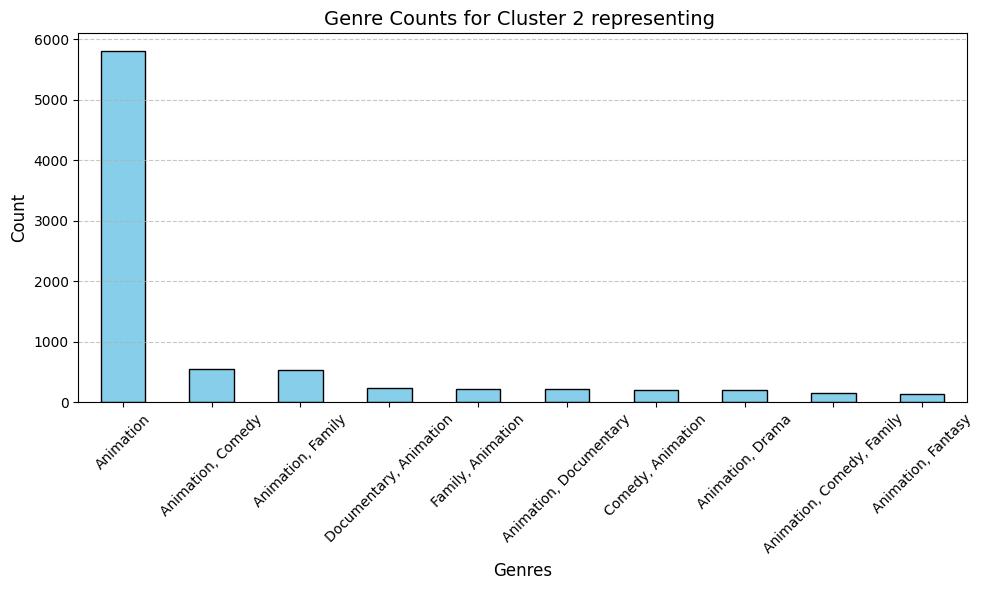


Cluster 3:
Cluster Variance for overview_similarity: 0.005801798751055971


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
14335,Evolution,"Animation, Fantasy",Test footage for an uncompleted Ray Harryhause...,English,Short,Winter,Winter,6.0,0.0
4975,"The Tale of Fedot, the Shooter","Family, Animation, Adventure, Comedy",The king decided to bring a soldier to a nervo...,Russian,Standard,Winter,Winter,7.0,0.0
49733,Die Schmierkobolde,Animation,Henkel ad by Pinschewer.,No Language,Short,Winter,Winter,0.0,0.0
22293,Sapnis,"Animation, Family",Unknown,No Language,Short,Winter,Winter,0.0,0.0
40519,Svengali's Cat,Animation,A hypnotist cat charms a sweet young mouse fem...,English,Short,Winter,Winter,0.0,0.0
47715,The Gulf,Animation,Animated short about communication.,English,Short,Winter,Winter,0.0,0.0
48440,The GMod Paranormal,"Horror, Comedy, Animation",Three paranormal investigators inspect the Out...,English,Short,Winter,Winter,0.0,0.0
21664,Three Quickies,Animation,A naughty animation.,No Language,Short,Winter,Winter,0.0,0.0
49390,Rabbit Tailor,Animation,Rabbit Tailor tells a story about a rabbit ta...,Mandarin,Short,Winter,Winter,0.0,0.0
34737,The Waves,"Drama, Animation",An artist returns to his work after suffering ...,English,Short,Winter,Winter,0.0,651.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
12,0.518004,1.0,0.233444,0.231405,0.961594,0,3
16,0.507174,1.0,0.233444,0.390083,0.987202,0,3
36,0.517672,1.0,0.233444,0.231405,0.981990,0,3
56,0.501385,1.0,0.233444,0.231405,0.952731,0,3
62,0.602897,1.0,0.233444,0.231405,0.959721,0,3
63,0.602897,1.0,0.922222,0.231405,0.935813,0,3
71,0.488804,1.0,0.233444,0.449587,0.973661,0,3
76,0.535771,1.0,0.822222,0.231405,0.983711,0,3
80,0.501385,1.0,0.866667,0.231405,0.946982,0,3
83,0.532320,1.0,0.233444,0.231405,0.960244,0,3


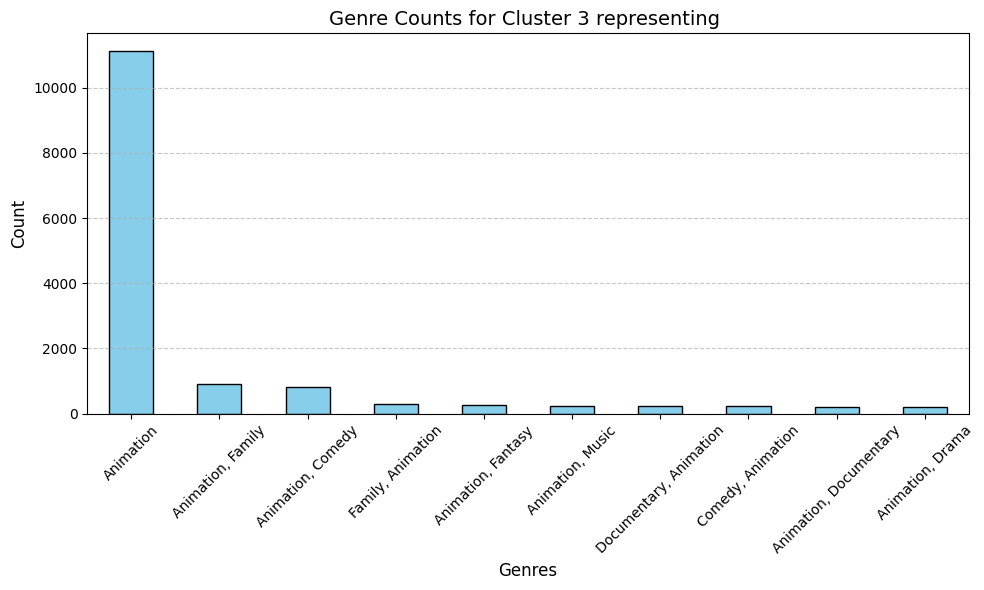

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.2, min_samples=15 | Silhouette Score: 0.662, DB Index: 0.677 ,clusters : 5
Plot Title: DBSCAN Clustering on features (eps=0.2, min_samples=15)
Explained Variance Ratios (3 Components): [0.72262193 0.1874885  0.04345551]
Total Explained Variance: 0.9535659401267856


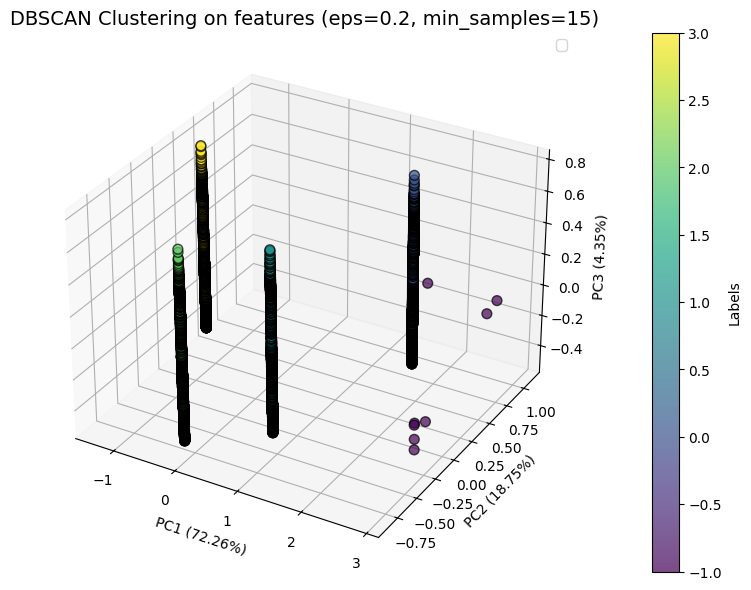

Model 'dbscan0.3' saved to 'saved_models\dbscan0.3.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:
Cluster Variance for overview_similarity: 0.07410333112274704


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
16373,Ayas,"Animation, Family",Turkish animated film.,Turkish,Standard,Fall,Fall,5.0,0.0
31571,PINK BxxCH CLUB,"Animation, Horror, Music",#PINKBITCHCLUB,Japanese,Short,Fall,Fall,0.0,0.0
24513,I'm Dusya,Animation,I am Dusya.,Russian,Short,Fall,Fall,0.0,0.0
11366,Masameer: Taharyat Kalb,Animation,A short movie from the popular series,Arabic,Standard,Spring,Spring,7.7,0.0
28638,Kahey - a Certain Captain's Life,Animation,An obscure film by dogakoba,No Language,Standard,Summer,Summer,0.0,0.0
44159,Excellencies,Animation,Excellencies...,No Language,Short,Spring,Spring,0.0,0.0
33509,Happy new year from Al Gore,"Comedy, Animation",^{§&+≠€\_/99/,No Language,Short,Fall,Fall,0.0,0.0
23116,The Transporters,Animation,The Transporters,No Language,Standard,Winter,Winter,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
11366,0.776370,0.333333,0.466667,0.013223,0.710308,1,-1
16373,0.634904,0.000000,0.911111,0.983471,0.622815,1,-1
23116,0.776370,1.000000,0.833333,0.823140,0.118911,0,-1
24513,0.776370,0.000000,0.011111,0.877686,0.000000,1,-1
28638,0.776370,0.666667,0.833333,0.823140,0.603673,0,-1
31571,0.514288,0.000000,0.011111,0.720661,0.164605,1,-1
33509,0.616669,0.000000,0.011111,0.823140,0.283248,1,-1
44159,0.776370,0.333333,0.111111,0.823140,0.155368,1,-1


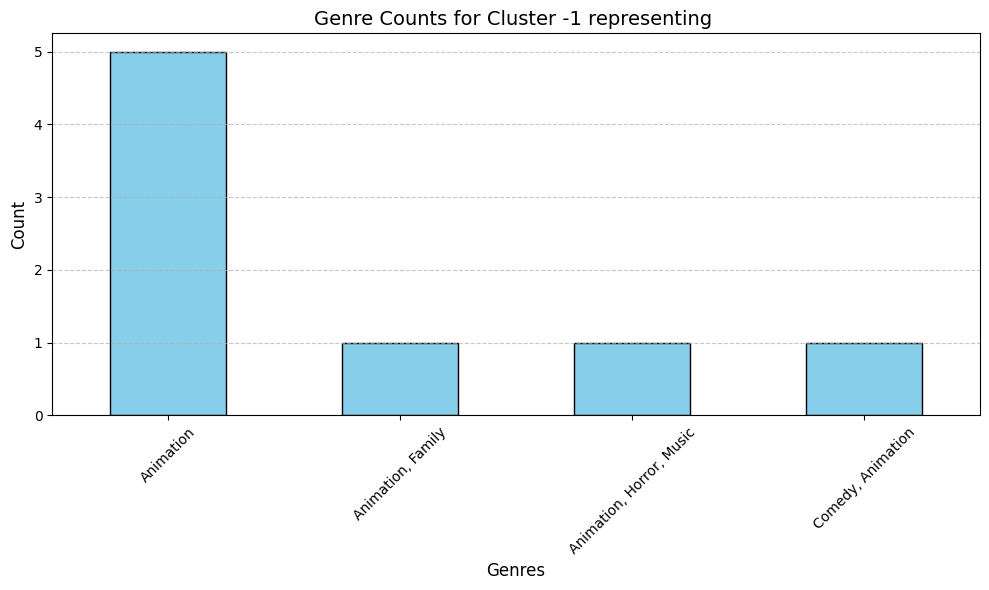


Cluster 0:
Cluster Variance for overview_similarity: 0.003845687963809986


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
2184,Monster Island,"Animation, Adventure, Family, Comedy",Young Lucas finds out he's not really a human ...,Spanish,Standard,Summer,Summer,5.255,0.0
327,The Black Cauldron,"Animation, Adventure, Family, Fantasy",Taran is an assistant pigkeeper with boyish dr...,"English, Arabic, Portuguese",Standard,Summer,Summer,6.436,25000000.0
306,A Whisker Away,"Animation, Drama, Romance, Fantasy","Miyo ""Muge"" Sasaki is a peculiar second-year j...",Japanese,Short,Summer,Summer,7.910,0.0
40406,Ice Carnival,Animation,The tortoise and hare boys argue who would win...,English,Short,Summer,Summer,0.000,0.0
27932,The Cold Steel,Animation,An animated short subject created by Paul Terr...,No Language,Short,Summer,Summer,0.000,0.0
1554,Summer Days with Coo,"Animation, Comedy, Romance","A small, lone Kappa miraculously survives over...",Japanese,Short,Summer,Summer,7.788,0.0
30185,Itchy,Animation,itchy itchy paper teevee lets tune in,English,Short,Summer,Summer,0.000,0.0
32731,Till Eulenspiegel und der Bäcker von Braunschweig,Animation,Unknown,German,Short,Summer,Summer,0.000,0.0
34722,Lucky Luke 4 - Vejen Til Oklahoma,Animation,Unknown,"Norwegian, Danish",Short,Summer,Summer,0.000,0.0
36978,Happy,Animation,Happiness is just a state of mind although mis...,German,Short,Summer,Summer,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
0,0.498641,0.666667,0.233444,0.231405,0.965532,0,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0,0
20,0.488804,0.666667,0.233444,0.231405,0.985556,0,0
23,0.516890,0.666667,0.233444,0.231405,0.971339,0,0


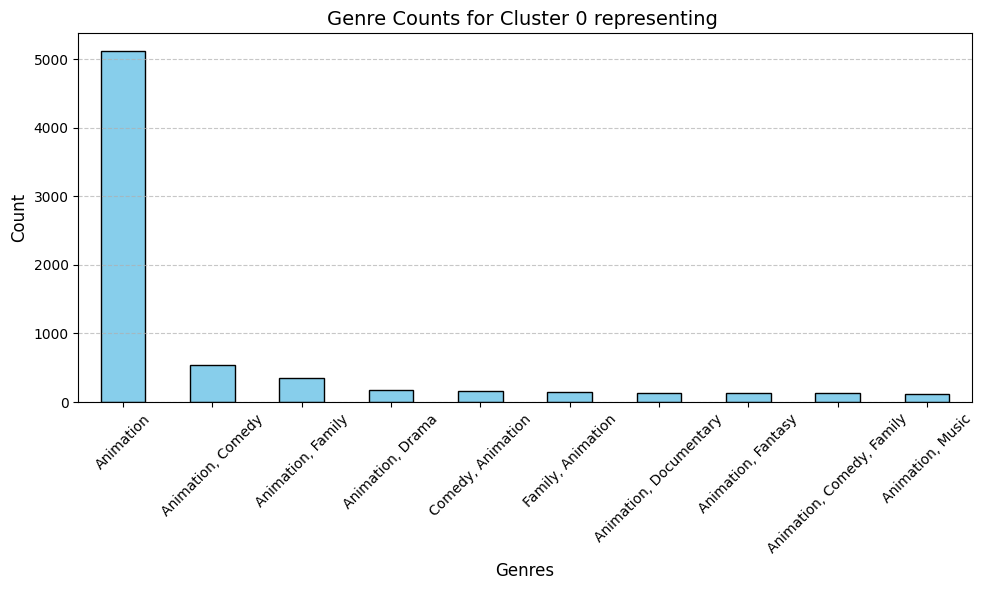


Cluster 1:
Cluster Variance for overview_similarity: 0.004255284329889616


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
42587,The Cat in the Cap,Animation,An animated short-form adaptation of Dr. Seuss...,Russian,Short,Spring,Spring,0.0,0.0
15437,SIMETRIA,Animation,Unknown,No Language,Short,Spring,Spring,9.0,0.0
29977,Composer Isaac Schwartz. Circus,Animation,Unknown,Russian,Short,Spring,Spring,0.0,0.0
15341,The Shadow Within Me,Animation,Leon meets his shadow. The time has come for c...,Swedish,Short,Spring,Spring,2.0,0.0
42070,Oswald - The Birthday Cake,Animation,Oswald volunteers to make a special birthday c...,No Language,Standard,Spring,Spring,0.0,0.0
32966,Chuck Webber's Land of Abusement,"Animation, Comedy",A 35mm cut-out animated infomercial for the wo...,English,Short,Spring,Spring,0.0,0.0
39959,Shimajiro and Fufu's Great Adventure: Save the...,"Family, Animation, Fantasy",Shimajiro to Fufu no Daibōken: Sukue! Nanairo ...,"Japanese, Mandarin, Korean",Standard,Spring,Spring,0.0,0.0
37916,ハネムーン Hanemun Honeymoon,Animation,A honeymoon in Japan gets examined microscopic...,No Language,Short,Spring,Spring,0.0,0.0
48939,A Child's Garden of Verses,Animation,"A young boy, confined to his bed, uses his ima...",English,Short,Spring,Spring,0.0,0.0
7043,Private Eye Pooch,Animation,Woody is prisoner at a taxidermy school but wh...,English,Short,Spring,Spring,6.3,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
1,0.518004,0.333333,0.233444,0.231405,0.940685,1,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1,1
21,0.518004,0.333333,0.900000,0.231405,0.958418,1,1
22,0.514278,0.333333,0.233444,0.231405,0.951925,1,1
27,0.501385,0.333333,0.233444,0.231405,0.940977,1,1
33,0.518004,0.333333,0.955556,0.279339,0.977272,1,1
39,0.518004,0.333333,0.233444,0.231405,0.989882,1,1
47,0.501385,0.333333,0.233444,0.231405,0.943472,1,1
58,0.602897,0.333333,0.955556,0.720661,0.931030,1,1


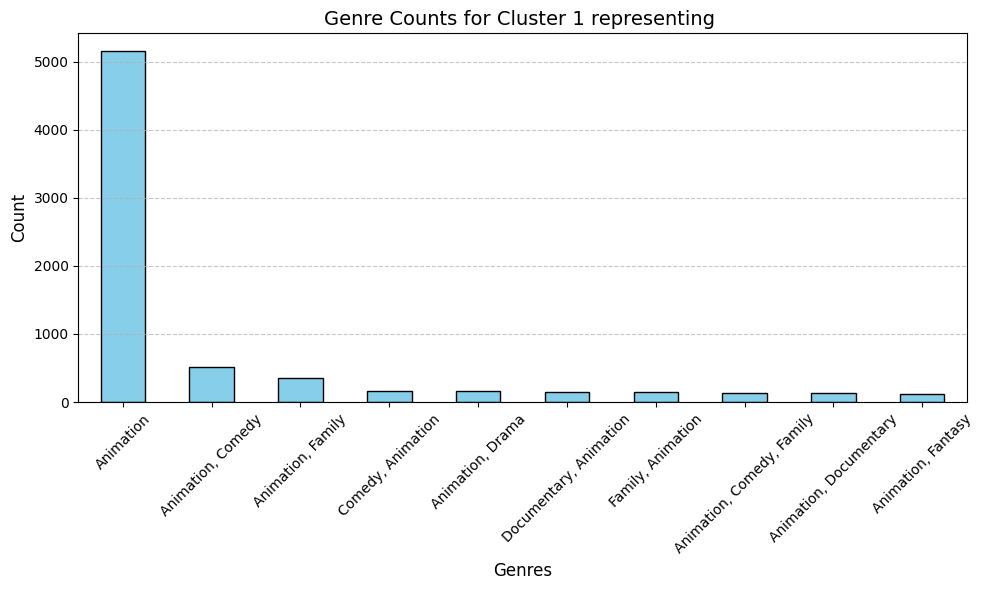


Cluster 2:
Cluster Variance for overview_similarity: 0.003327554627924643


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
42467,Amy the Squirrel: A Walk in the Park,"Animation, Comedy",Amy goes out for a walk before walk while many...,No Language,Short,Fall,Fall,0.000,0.0
11710,Casper's Spree Under the Sea,Animation,Casper is kicked out of the Society of Ghosts ...,English,Short,Fall,Fall,6.700,0.0
4698,Tatsumi,"Animation, History, Drama",Animated film based on the life and stories of...,Japanese,Short,Fall,Fall,6.281,800.0
17449,Jesa,"Documentary, Animation",Jesa is a Korean tradition honoring one's ance...,Korean,Short,Fall,Fall,7.000,0.0
12414,"Mocland, The Legend of Aloma","Animation, Science Fiction, Fantasy","On the Planet Moc, the límbar is the equivalen...",Spanish,Standard,Fall,Fall,4.800,0.0
36833,The Penguin Who Couldn’t Swim,"Animation, Drama",An animation about a disabled penguin who live...,English,Short,Fall,Fall,0.000,0.0
49102,Brave Nazar,Animation,"The idler Nazar, who only used to count flies ...",Armenian,Short,Fall,Fall,0.000,0.0
41952,LeapFrog Letter Factory Adventures: Counting o...,"Family, Animation","Selling lemonade to earn money for new books, ...",English,Short,Fall,Fall,0.000,0.0
8856,Bird Brained Donald,"Animation, Family",Donald once again attempts to get a picture of...,No Language,Short,Fall,Fall,6.000,0.0
46781,Accident,Animation,New animated film by Anastasiya Panteleeva.,Russian,Short,Fall,Fall,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
3,0.470063,0.0,0.233444,0.449587,0.992498,1,2
5,0.577550,0.0,0.233444,0.231405,0.969747,1,2
6,0.518004,0.0,0.900000,0.231405,0.976711,1,2
8,0.516890,0.0,0.233444,0.505785,0.957682,1,2
11,0.514278,0.0,0.233444,0.231405,0.944390,1,2
14,0.503875,0.0,0.233444,0.231405,0.931199,1,2
19,0.577550,0.0,0.233444,0.231405,0.966440,1,2
24,0.518004,0.0,0.233444,0.231405,0.992412,1,2
25,0.518004,0.0,0.233444,0.231405,0.969172,1,2
28,0.477516,0.0,0.233444,0.231405,0.954954,1,2


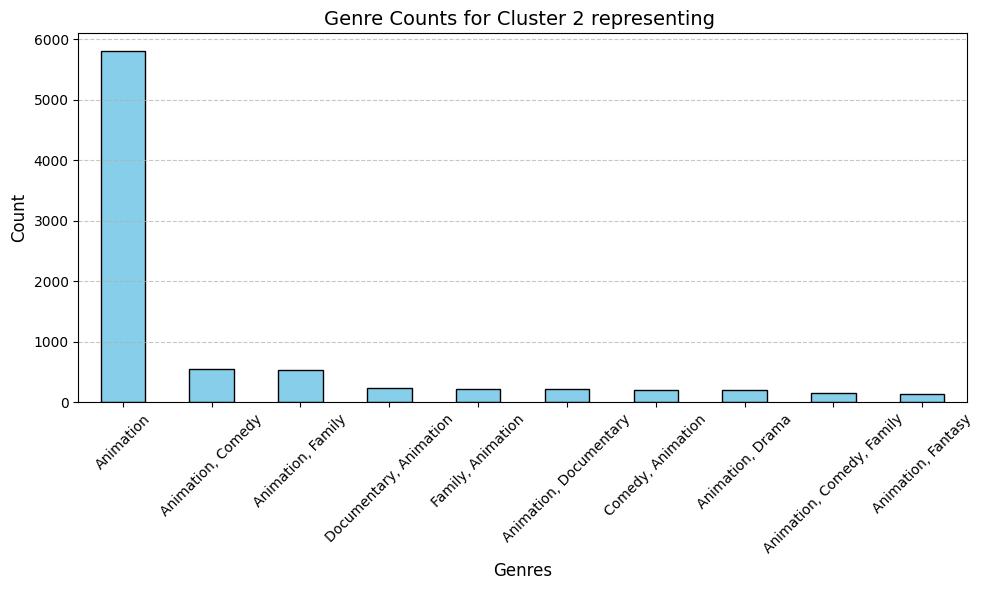


Cluster 3:
Cluster Variance for overview_similarity: 0.005801798751055971


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
11507,Chips,Animation,A study of loneliness and passing away.,No Language,Short,Winter,Winter,6.000,0.0
5317,Arpeggio of Blue Steel -Ars Nova DC-,"Action, Animation, Science Fiction, War",Recap of the Aoki Hagane no Arpeggio: Ars Nova...,Japanese,Short,Winter,Winter,7.615,0.0
21099,Espolio,Animation,A BAFTA award nominated animation based on a p...,English,Short,Winter,Winter,0.000,0.0
368,Batman: Mask of the Phantasm,"Action, Animation, Crime, Mystery","When a powerful criminal, who is connected to ...",English,Standard,Winter,Winter,7.486,6000000.0
28046,Eastern Bloodthirsty Hugo,"Comedy, Animation",The film animation technique of pixilation was...,No Language,Short,Winter,Winter,0.000,0.0
46049,The Fall of the House of Usher,"Animation, Horror, Drama",Animated adaptation of the Poe story.,No Language,Short,Winter,Winter,0.000,0.0
28062,Four Short Films About Noise,Animation,Experimental 90s animation about the racket ar...,English,Short,Winter,Winter,0.000,0.0
1612,Stick Man,"Animation, Family",Stick Man lives in the family tree with his St...,Italian,Short,Winter,Winter,6.792,0.0
178,The Lion King 1½,"Family, Animation, Comedy, Action",Timon the meerkat and Pumbaa the warthog are b...,English,Standard,Winter,Winter,6.579,0.0
35090,The Musical Genius of Mozart McFiddle,Animation,A small dog will do anything to get outside. A...,English,Short,Winter,Winter,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
12,0.518004,1.0,0.233444,0.231405,0.961594,0,3
16,0.507174,1.0,0.233444,0.390083,0.987202,0,3
36,0.517672,1.0,0.233444,0.231405,0.981990,0,3
56,0.501385,1.0,0.233444,0.231405,0.952731,0,3
62,0.602897,1.0,0.233444,0.231405,0.959721,0,3
63,0.602897,1.0,0.922222,0.231405,0.935813,0,3
71,0.488804,1.0,0.233444,0.449587,0.973661,0,3
76,0.535771,1.0,0.822222,0.231405,0.983711,0,3
80,0.501385,1.0,0.866667,0.231405,0.946982,0,3
83,0.532320,1.0,0.233444,0.231405,0.960244,0,3


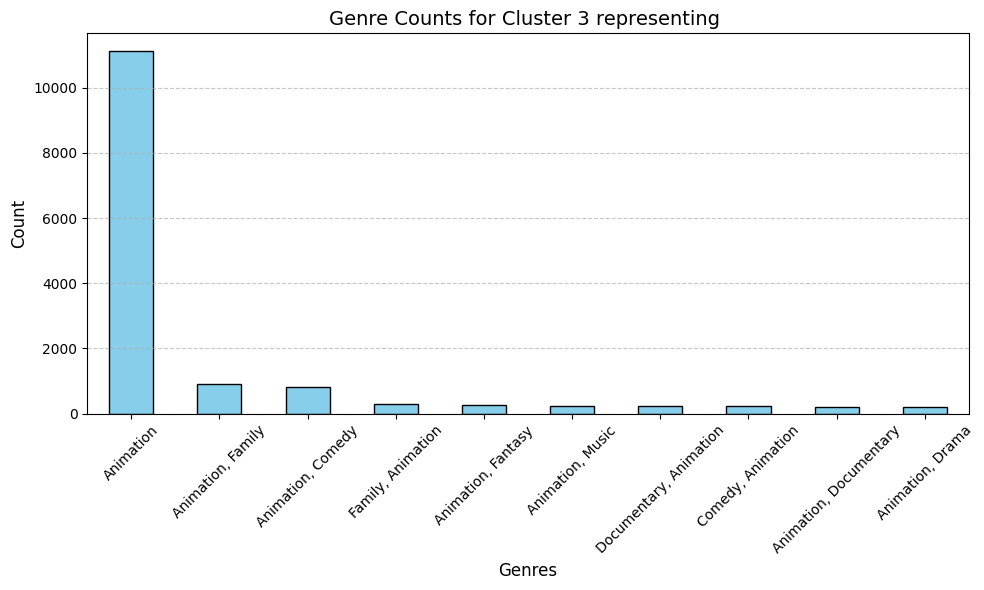

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.3, min_samples=6 | Silhouette Score: 0.662, DB Index: 0.677 ,clusters : 5
Plot Title: DBSCAN Clustering on features (eps=0.3, min_samples=6)
Explained Variance Ratios (3 Components): [0.72262193 0.1874885  0.04345551]
Total Explained Variance: 0.9535659401267889


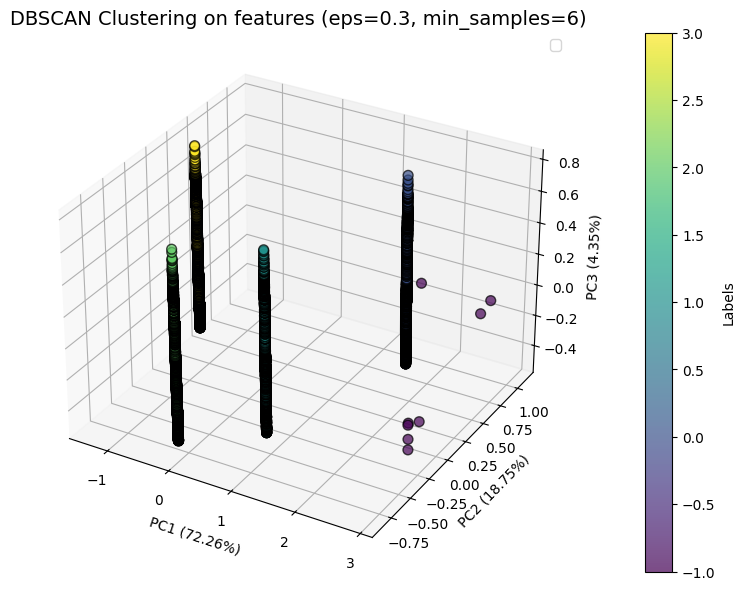

Model 'dbscan0.3' saved to 'saved_models\dbscan0.3.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:
Cluster Variance for overview_similarity: 0.07410333112274704


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
23116,The Transporters,Animation,The Transporters,No Language,Standard,Winter,Winter,0.0,0.0
24513,I'm Dusya,Animation,I am Dusya.,Russian,Short,Fall,Fall,0.0,0.0
11366,Masameer: Taharyat Kalb,Animation,A short movie from the popular series,Arabic,Standard,Spring,Spring,7.7,0.0
28638,Kahey - a Certain Captain's Life,Animation,An obscure film by dogakoba,No Language,Standard,Summer,Summer,0.0,0.0
33509,Happy new year from Al Gore,"Comedy, Animation",^{§&+≠€\_/99/,No Language,Short,Fall,Fall,0.0,0.0
16373,Ayas,"Animation, Family",Turkish animated film.,Turkish,Standard,Fall,Fall,5.0,0.0
31571,PINK BxxCH CLUB,"Animation, Horror, Music",#PINKBITCHCLUB,Japanese,Short,Fall,Fall,0.0,0.0
44159,Excellencies,Animation,Excellencies...,No Language,Short,Spring,Spring,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
11366,0.776370,0.333333,0.466667,0.013223,0.710308,1,-1
16373,0.634904,0.000000,0.911111,0.983471,0.622815,1,-1
23116,0.776370,1.000000,0.833333,0.823140,0.118911,0,-1
24513,0.776370,0.000000,0.011111,0.877686,0.000000,1,-1
28638,0.776370,0.666667,0.833333,0.823140,0.603673,0,-1
31571,0.514288,0.000000,0.011111,0.720661,0.164605,1,-1
33509,0.616669,0.000000,0.011111,0.823140,0.283248,1,-1
44159,0.776370,0.333333,0.111111,0.823140,0.155368,1,-1


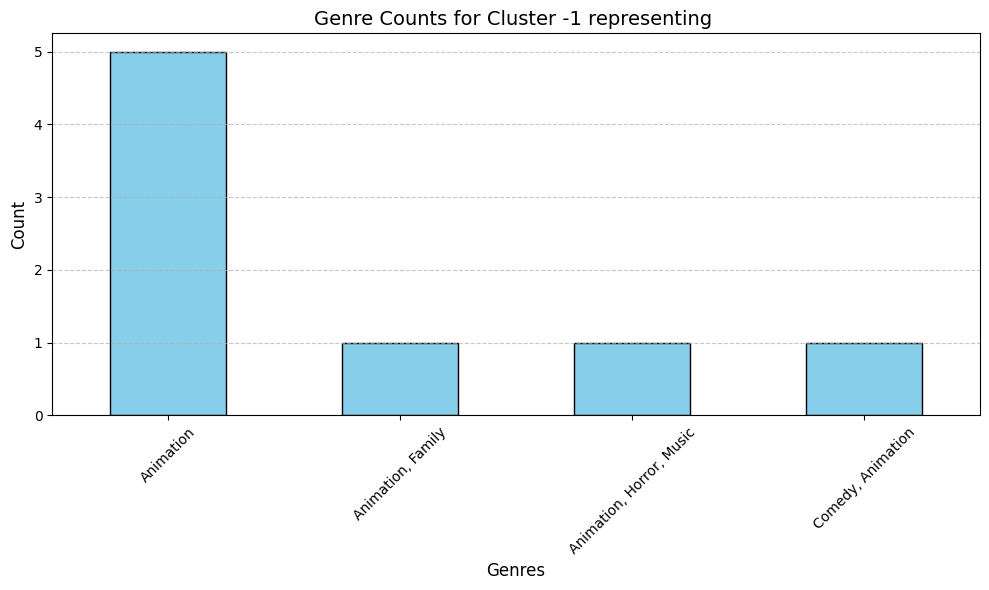


Cluster 0:
Cluster Variance for overview_similarity: 0.003845687963809986


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
35851,"Ни пуха, ни пера","Comedy, Animation",Unknown,Russian,Short,Summer,Summer,0.0,0.0
14557,Super Electromagnetic Machine Voltes V,"Animation, Action, Family",Chōdenji Machine Voltes V (超電磁マシーン ボルテスＶ Chōde...,"English, Italian, Japanese",Short,Summer,Summer,7.2,0.0
3423,The Pointer,"Animation, Family, Comedy",Mickey and Pluto go hunting for quail. Pluto s...,English,Short,Summer,Summer,5.6,0.0
16869,Eleven Cats,"Animation, Family",A gang of eleven cats have stolen a fish and a...,Japanese,Standard,Summer,Summer,7.0,0.0
1763,Vacations in Prostokvashino,Animation,The continuation of the adventures of Fyodor a...,Russian,Short,Summer,Summer,7.5,0.0
20406,Farm Foolery,Animation,Farm Foolery shows farm animals harvesting cro...,English,Short,Summer,Summer,1.0,0.0
27638,Tokyo Twins Athletic Tournament,"Comedy, Animation","Having cleared the preliminaries, twenty-four ...",Japanese,Standard,Summer,Summer,0.0,0.0
31733,End Time and The Trajectories of Ancestors,Animation,End Time and The Trajectories of Ancestors (20...,Cantonese,Short,Summer,Summer,0.0,0.0
12963,Akuemon,"Romance, Animation, Fantasy",A fortuneteller tells Hidari Taisho that he mu...,Japanese,Short,Summer,Summer,8.0,0.0
10520,California Crisis: Gun Salvo,"Adventure, Animation, Science Fiction",Noera is heading to work after drinking all ni...,Japanese,Standard,Summer,Summer,6.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
0,0.498641,0.666667,0.233444,0.231405,0.965532,0,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0,0
20,0.488804,0.666667,0.233444,0.231405,0.985556,0,0
23,0.516890,0.666667,0.233444,0.231405,0.971339,0,0


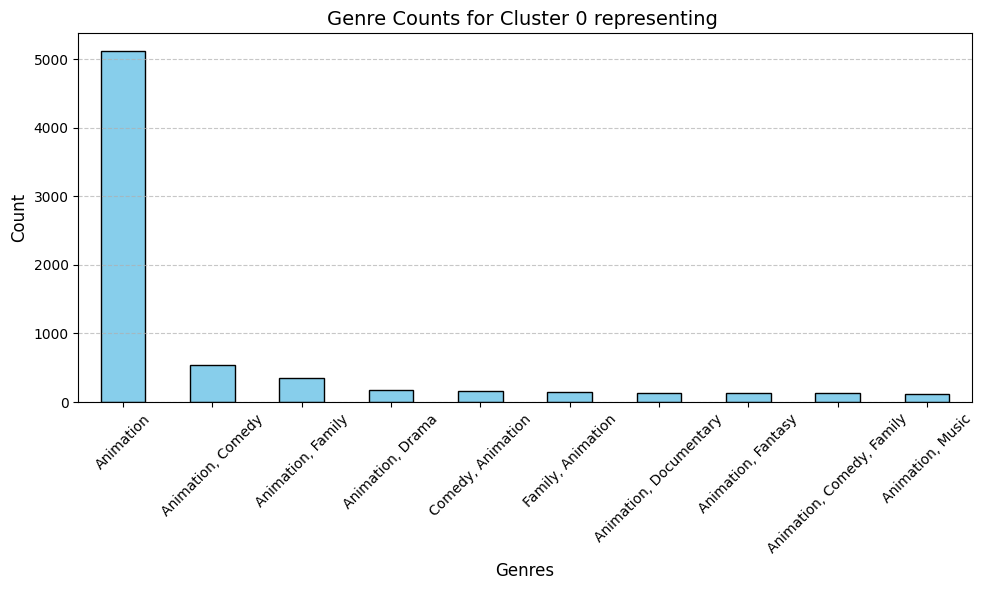


Cluster 1:
Cluster Variance for overview_similarity: 0.004255284329889616


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
10266,Strawberry Shortcake in Big Apple City,"Animation, Family, Fantasy, TV Movie",Strawberry Shortcake in Big Apple City chronic...,English,Short,Spring,Spring,5.5,0.0
34269,Почему слоны?,Animation,Unknown,Russian,Short,Spring,Spring,0.0,0.0
13921,Once Upon a Time,"Animation, Fantasy","We are first presented a cobweb castle, filled...",English,Short,Spring,Spring,6.5,0.0
24472,Hell’s Paradise,"Animation, Action, Adventure, Thriller, Fantasy",A squad of prisoners and their guards are sent...,No Language,Short,Spring,Spring,0.0,0.0
17354,Le Prince serpent,Animation,Unknown,French,Short,Spring,Spring,6.5,0.0
35976,Astons Stone,Animation,The little puppy Aston finds a lonely a cold s...,Swedish,Short,Spring,Spring,0.0,0.0
22934,Shot,Animation,"A person, like any container, needs its own fi...",No Language,Short,Spring,Spring,0.0,0.0
163,Rio 2,"Animation, Adventure, Comedy, Family","It's a jungle out there for Blu, Jewel and the...","English, Portuguese",Short,Spring,Spring,6.5,19546842.5
32880,In The Middle Of Nowhere,Animation,A conversation with three people about their d...,English,Short,Spring,Spring,0.0,0.0
34131,С днем рождения,Animation,Unknown,No Language,Short,Spring,Spring,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
1,0.518004,0.333333,0.233444,0.231405,0.940685,1,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1,1
21,0.518004,0.333333,0.900000,0.231405,0.958418,1,1
22,0.514278,0.333333,0.233444,0.231405,0.951925,1,1
27,0.501385,0.333333,0.233444,0.231405,0.940977,1,1
33,0.518004,0.333333,0.955556,0.279339,0.977272,1,1
39,0.518004,0.333333,0.233444,0.231405,0.989882,1,1
47,0.501385,0.333333,0.233444,0.231405,0.943472,1,1
58,0.602897,0.333333,0.955556,0.720661,0.931030,1,1


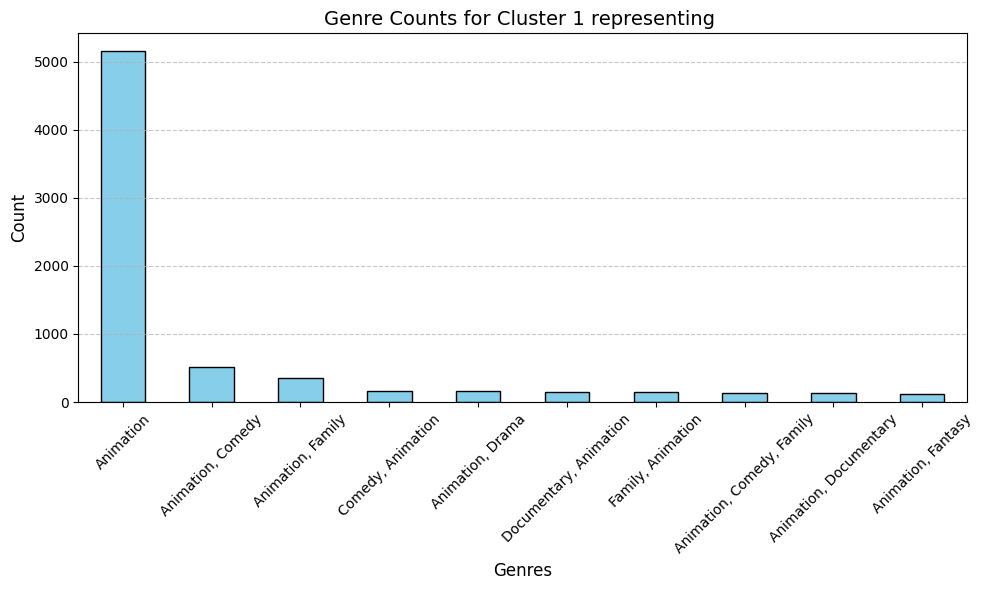


Cluster 2:
Cluster Variance for overview_similarity: 0.003327554627924643


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
47240,Reindeer-scoring in Jukkasjärvi,Animation,Malkon is sent to the dentist while his parent...,Swedish,Short,Fall,Fall,0.000,0.0
3254,Marcel the Shell with Shoes On,"Comedy, Animation",Marcel the shell gives an outline of his life.,English,Short,Fall,Fall,6.207,0.0
44085,Episode 11,Animation,Space hero Hart is captured by enemy robots. H...,Czech,Short,Fall,Fall,0.000,0.0
28231,One Stormy Night with Fred Floaty,Animation,"Inflatable pool toy Fred Floaty, stuck in a tr...",No Language,Short,Fall,Fall,0.000,0.0
42105,The Annotated Field Guide of Ulysses S. Grant,"Documentary, Animation, History, War",Numerous films deal with the American Civil Wa...,English,Standard,Fall,Fall,0.000,0.0
6830,Affairs of the Heart,Animation,A near-abstract animation telling a simple rom...,No Language,Short,Fall,Fall,5.500,0.0
21539,The Passenger,"Drama, Fantasy, Animation",A man wakes up to find himself alone in a trai...,No Language,Short,Fall,Fall,0.000,0.0
46025,Spindrift,Animation,"A girl, more eagle than human, must decide bet...",No Language,Short,Fall,Fall,0.000,0.0
48089,Fukuyama Theater: Summer Secret,"Animation, Comedy, Family, Music, Fantasy",Several short animated mini-stories based on t...,Japanese,Standard,Fall,Fall,0.000,0.0
22376,"The Conscious ""I""",Animation,The planet where artificial intelligence robot...,Korean,Short,Fall,Fall,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
3,0.470063,0.0,0.233444,0.449587,0.992498,1,2
5,0.577550,0.0,0.233444,0.231405,0.969747,1,2
6,0.518004,0.0,0.900000,0.231405,0.976711,1,2
8,0.516890,0.0,0.233444,0.505785,0.957682,1,2
11,0.514278,0.0,0.233444,0.231405,0.944390,1,2
14,0.503875,0.0,0.233444,0.231405,0.931199,1,2
19,0.577550,0.0,0.233444,0.231405,0.966440,1,2
24,0.518004,0.0,0.233444,0.231405,0.992412,1,2
25,0.518004,0.0,0.233444,0.231405,0.969172,1,2
28,0.477516,0.0,0.233444,0.231405,0.954954,1,2


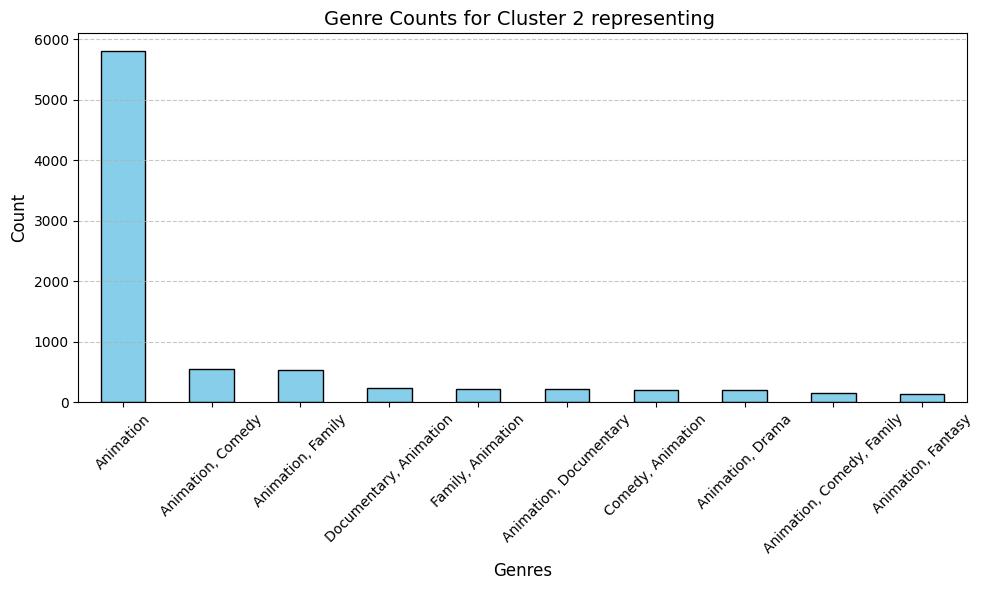


Cluster 3:
Cluster Variance for overview_similarity: 0.005801798751055971


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
29798,X - 1,Animation,"Stop motion animation using bananas, who take ...",English,Short,Winter,Winter,0.0,0.0
14772,Loop,Animation,Sometimes a journey is as much an act of imagi...,No Language,Short,Winter,Winter,5.0,0.0
45013,Luna,Animation,Unknown,No Language,Short,Winter,Winter,0.0,0.0
29122,Carnivore,"Animation, Drama, Horror",Extreme circumstances lead to unusual behavior...,Swedish,Short,Winter,Winter,0.0,0.0
11448,The Hunchback of Notre-Dame,"Animation, Family, TV Movie","This is an adaptation of the novel ""The Hunchb...",English,Standard,Winter,Winter,3.3,0.0
31257,Laff Riot,"Animation, Comedy, TV Movie",Pitch pilot for the scrapped Looney Tunes series.,English,Short,Winter,Winter,0.0,0.0
15449,Next life,Animation,Why is there something instead of nothing? Pro...,French,Short,Winter,Winter,9.0,0.0
31671,I Miss Her,"Animation, Horror",With a marriage built on regret and the suppre...,English,Short,Winter,Winter,0.0,0.0
46878,Bottleneck,Animation,"A factory worker works with monotonous work, b...",No Language,Short,Winter,Winter,0.0,0.0
21660,The Dragonflies,Animation,"In 1910, an English couple goes to their vacat...",No Language,Short,Winter,Winter,0.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
12,0.518004,1.0,0.233444,0.231405,0.961594,0,3
16,0.507174,1.0,0.233444,0.390083,0.987202,0,3
36,0.517672,1.0,0.233444,0.231405,0.981990,0,3
56,0.501385,1.0,0.233444,0.231405,0.952731,0,3
62,0.602897,1.0,0.233444,0.231405,0.959721,0,3
63,0.602897,1.0,0.922222,0.231405,0.935813,0,3
71,0.488804,1.0,0.233444,0.449587,0.973661,0,3
76,0.535771,1.0,0.822222,0.231405,0.983711,0,3
80,0.501385,1.0,0.866667,0.231405,0.946982,0,3
83,0.532320,1.0,0.233444,0.231405,0.960244,0,3


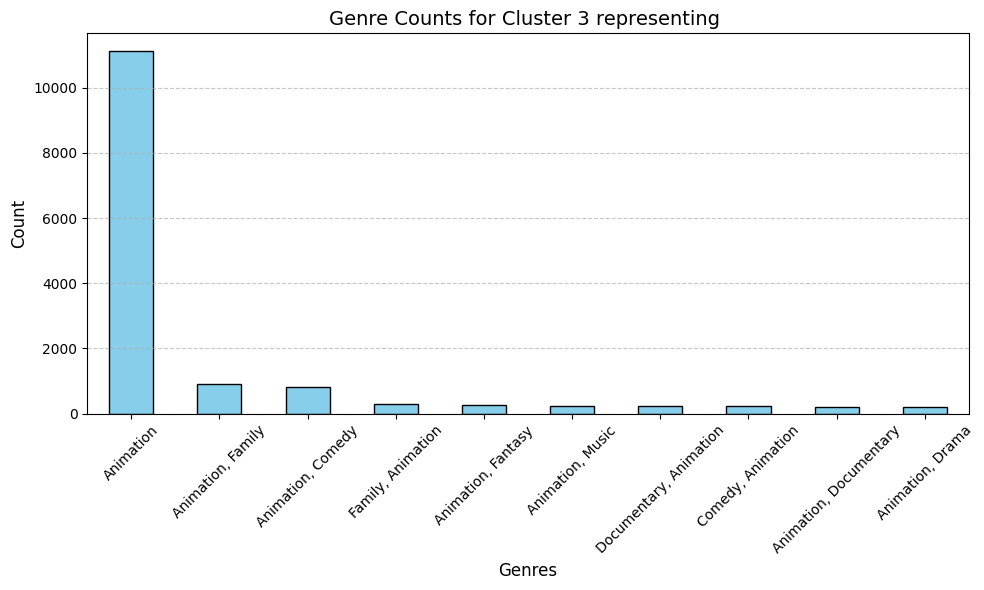

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.3, min_samples=10 | Silhouette Score: 0.662, DB Index: 0.677 ,clusters : 5
Plot Title: DBSCAN Clustering on features (eps=0.3, min_samples=10)
Explained Variance Ratios (3 Components): [0.72262193 0.1874885  0.04345551]
Total Explained Variance: 0.9535659401267877


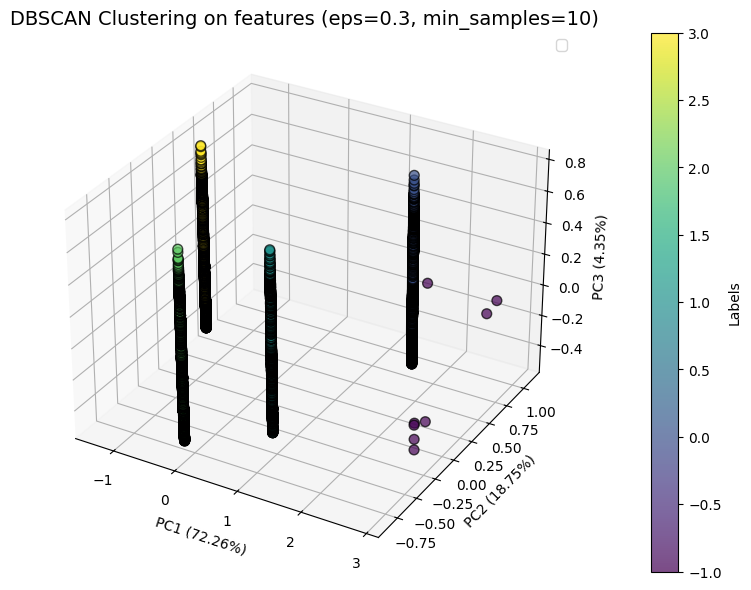

Model 'dbscan0.3' saved to 'saved_models\dbscan0.3.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:
Cluster Variance for overview_similarity: 0.07410333112274704


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
33509,Happy new year from Al Gore,"Comedy, Animation",^{§&+≠€\_/99/,No Language,Short,Fall,Fall,0.0,0.0
28638,Kahey - a Certain Captain's Life,Animation,An obscure film by dogakoba,No Language,Standard,Summer,Summer,0.0,0.0
24513,I'm Dusya,Animation,I am Dusya.,Russian,Short,Fall,Fall,0.0,0.0
31571,PINK BxxCH CLUB,"Animation, Horror, Music",#PINKBITCHCLUB,Japanese,Short,Fall,Fall,0.0,0.0
44159,Excellencies,Animation,Excellencies...,No Language,Short,Spring,Spring,0.0,0.0
23116,The Transporters,Animation,The Transporters,No Language,Standard,Winter,Winter,0.0,0.0
11366,Masameer: Taharyat Kalb,Animation,A short movie from the popular series,Arabic,Standard,Spring,Spring,7.7,0.0
16373,Ayas,"Animation, Family",Turkish animated film.,Turkish,Standard,Fall,Fall,5.0,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
11366,0.776370,0.333333,0.466667,0.013223,0.710308,1,-1
16373,0.634904,0.000000,0.911111,0.983471,0.622815,1,-1
23116,0.776370,1.000000,0.833333,0.823140,0.118911,0,-1
24513,0.776370,0.000000,0.011111,0.877686,0.000000,1,-1
28638,0.776370,0.666667,0.833333,0.823140,0.603673,0,-1
31571,0.514288,0.000000,0.011111,0.720661,0.164605,1,-1
33509,0.616669,0.000000,0.011111,0.823140,0.283248,1,-1
44159,0.776370,0.333333,0.111111,0.823140,0.155368,1,-1


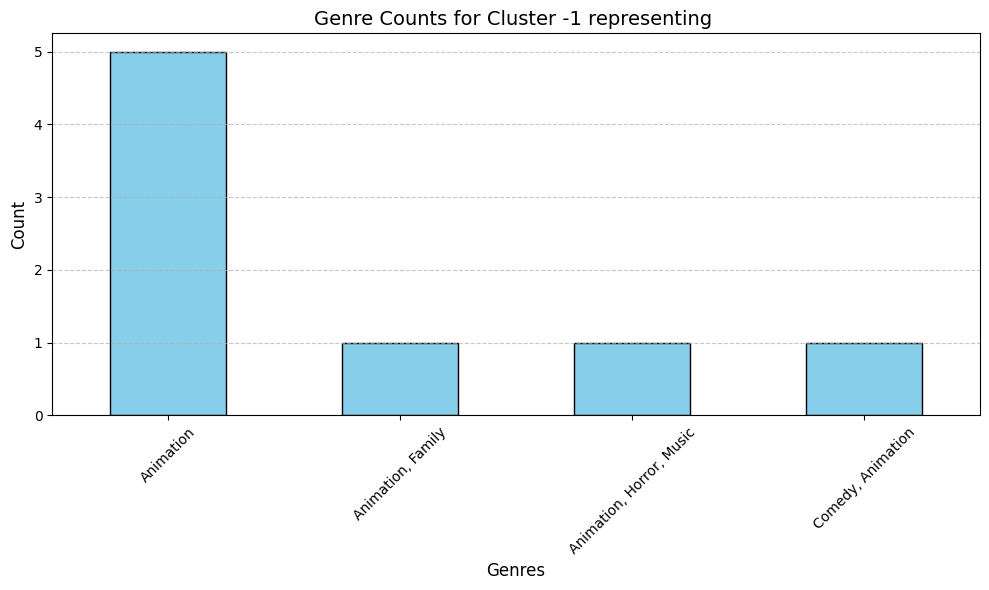


Cluster 0:
Cluster Variance for overview_similarity: 0.003845687963809986


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
23066,The Line,Animation,"At dusk, Belfast murals come to life and trans...",French,Short,Summer,Summer,0.000,0.0
10865,Minimikim,Animation,Unknown,Hebrew,Short,Summer,Summer,7.500,0.0
2030,Street of Crocodiles,"Animation, Fantasy","A puppet, newly released from his strings, exp...",No Language,Short,Summer,Summer,6.413,0.0
25645,Stabby,"Animation, Comedy",A hermit crab with an obsession for shiny obje...,No Language,Short,Summer,Summer,0.000,0.0
37096,Sapling,Animation,A young little griffin attempts to grow a tree...,No Language,Short,Summer,Summer,0.000,0.0
23740,Forgive,Animation,Two friends get into an argument and stop talk...,Czech,Short,Summer,Summer,0.000,0.0
47438,Broken Things,Animation,A lonely young child grows up in an isolated f...,Hungarian,Short,Summer,Summer,0.000,0.0
18462,Coraline: The Making of 'Coraline',"Documentary, Animation",A look at the complexities and intricacies of ...,English,Short,Summer,Summer,5.000,0.0
11081,Goodness Newness Oldness Badness,Animation,New stuff is good stuff and old stuff is bad s...,English,Short,Summer,Summer,4.300,0.0
7121,Magister Negi Magi: Anime Final,"Action, Animation, Adventure, Fantasy","The story is centred around Negi Springfield, ...",Japanese,Standard,Summer,Summer,7.200,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
0,0.498641,0.666667,0.233444,0.231405,0.965532,0,0
4,0.560842,0.666667,0.233444,0.231405,0.984513,0,0
7,0.577679,0.666667,0.988889,0.231405,0.959402,0,0
10,0.554247,0.666667,0.233444,0.266116,0.977161,0,0
13,0.602897,0.666667,0.233444,0.720661,0.945213,0,0
15,0.577550,0.666667,0.233444,0.231405,0.962403,0,0
17,0.577550,0.666667,0.233444,0.449587,0.950539,0,0
18,0.518004,0.666667,0.233444,0.375207,0.977620,0,0
20,0.488804,0.666667,0.233444,0.231405,0.985556,0,0
23,0.516890,0.666667,0.233444,0.231405,0.971339,0,0


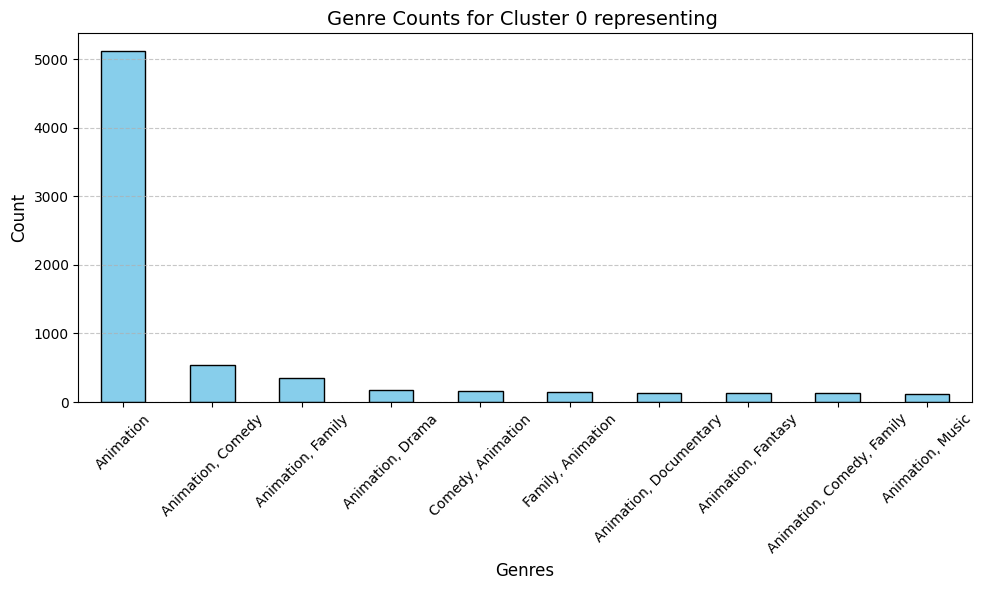


Cluster 1:
Cluster Variance for overview_similarity: 0.004255284329889616


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
24582,Followers,Animation,Brief plasticine story of blindly following th...,No Language,Short,Spring,Spring,0.000,0.0
38244,The Sky Is Falling,Animation,The fox convinces the duck that the sky is fal...,English,Short,Spring,Spring,0.000,0.0
22978,Some of the Things That Remind Me of Him,Animation,The girl recalls the events associated with he...,Russian,Short,Spring,Spring,0.000,0.0
6759,Toonstone,"Action, Animation, Comedy",The story takes place in 1870 in the Wild West...,No Language,Standard,Spring,Spring,8.188,0.0
15622,Sherlock Holmes and I,Animation,The film is an animated parody of the Sherlock...,Russian,Short,Spring,Spring,6.000,0.0
29565,The Legend of Goldhorn,Animation,A hunter heads out to the mountains to mend hi...,Slovenian,Short,Spring,Spring,0.000,0.0
1998,Dolphin Boy,"Animation, Adventure, Fantasy, Comedy","When a plane crashes at sea, dolphins rescue a...","English, Russian",Standard,Spring,Spring,6.392,0.0
3828,The Shooting of Dan McGoo,"Animation, Comedy","Dangerous Dan McGoo (Droopy) faces the wolf, a...",English,Short,Spring,Spring,6.600,0.0
14974,The Dawn of Better Living,Animation,Produced for Westinghouse Electric,English,Short,Spring,Spring,4.000,0.0
31152,Head Over Heels,"Family, Animation",A pair of socks that are madly in love get sep...,English,Short,Spring,Spring,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
1,0.518004,0.333333,0.233444,0.231405,0.940685,1,1
2,0.634904,0.333333,0.233444,0.231405,0.952792,1,1
9,0.501385,0.333333,1.000000,0.231405,0.958689,1,1
21,0.518004,0.333333,0.900000,0.231405,0.958418,1,1
22,0.514278,0.333333,0.233444,0.231405,0.951925,1,1
27,0.501385,0.333333,0.233444,0.231405,0.940977,1,1
33,0.518004,0.333333,0.955556,0.279339,0.977272,1,1
39,0.518004,0.333333,0.233444,0.231405,0.989882,1,1
47,0.501385,0.333333,0.233444,0.231405,0.943472,1,1
58,0.602897,0.333333,0.955556,0.720661,0.931030,1,1


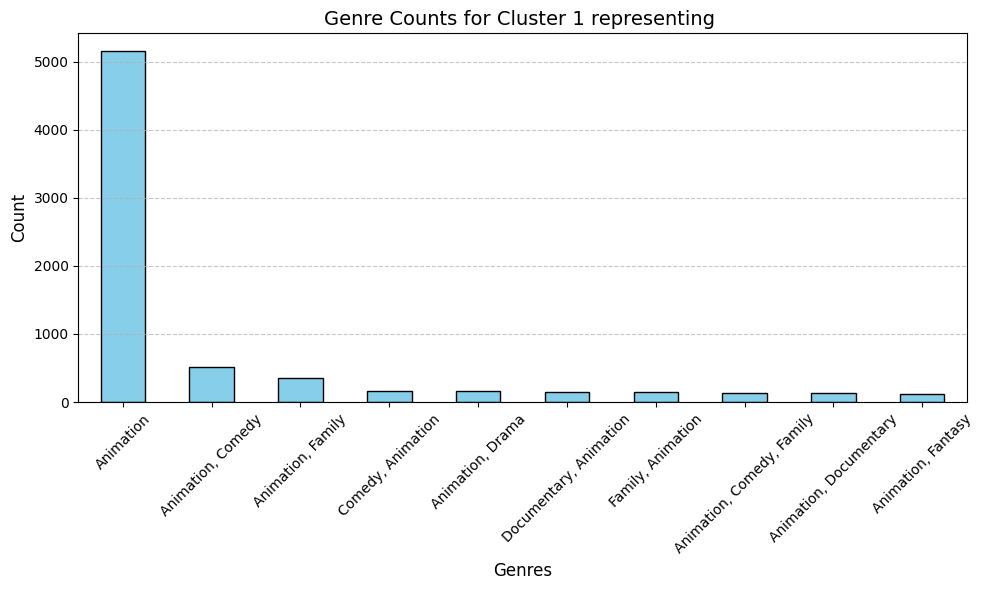


Cluster 2:
Cluster Variance for overview_similarity: 0.003327554627924643


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9489,Hiss and Make Up,"Animation, Comedy","An old woman has a cat, a dog, and a canary. T...",English,Short,Fall,Fall,7.200,0.0
4786,Infernal Symphony,Animation,The chance encounter between a rebel devil and...,French,Short,Fall,Fall,5.938,0.0
39134,Elemi,"Animation, Romance","The silent scandal of a utility pole, secretly...",Japanese,Standard,Fall,Fall,0.000,0.0
33127,Table Manners,"Animation, Comedy",'Three creatures go in search of food in the w...,English,Short,Fall,Fall,0.000,0.0
17994,Justice League Of Pornstar Heroes: (Animated C...,Animation,When a great ecil threatens porn's very existe...,English,Short,Fall,Fall,10.000,0.0
16186,"Good Night, Mr. Ted","Animation, Drama, Fantasy","When night falls and the Boogeyman appears, Mr...",No Language,Short,Fall,Fall,8.000,0.0
8548,Hanazuki: Full of Treasures,"Animation, Fantasy, Science Fiction, Family",Hanazuki tries to get a treasure back from the...,English,Short,Fall,Fall,8.800,0.0
9027,Age of the Great Dinosaurs,"Animation, Adventure, TV Movie",A UFO transports three children back to the pr...,Japanese,Standard,Fall,Fall,4.400,0.0
18343,Tapir Tape 3 - Cry for Help,Animation,Cardiac arrest is no joke – or is it? Cardiac ...,No Language,Short,Fall,Fall,4.500,0.0
28,Aladdin,"Animation, Family, Adventure, Fantasy, Romance",Princess Jasmine grows tired of being forced t...,English,Short,Fall,Fall,7.645,28000000.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
3,0.470063,0.0,0.233444,0.449587,0.992498,1,2
5,0.577550,0.0,0.233444,0.231405,0.969747,1,2
6,0.518004,0.0,0.900000,0.231405,0.976711,1,2
8,0.516890,0.0,0.233444,0.505785,0.957682,1,2
11,0.514278,0.0,0.233444,0.231405,0.944390,1,2
14,0.503875,0.0,0.233444,0.231405,0.931199,1,2
19,0.577550,0.0,0.233444,0.231405,0.966440,1,2
24,0.518004,0.0,0.233444,0.231405,0.992412,1,2
25,0.518004,0.0,0.233444,0.231405,0.969172,1,2
28,0.477516,0.0,0.233444,0.231405,0.954954,1,2


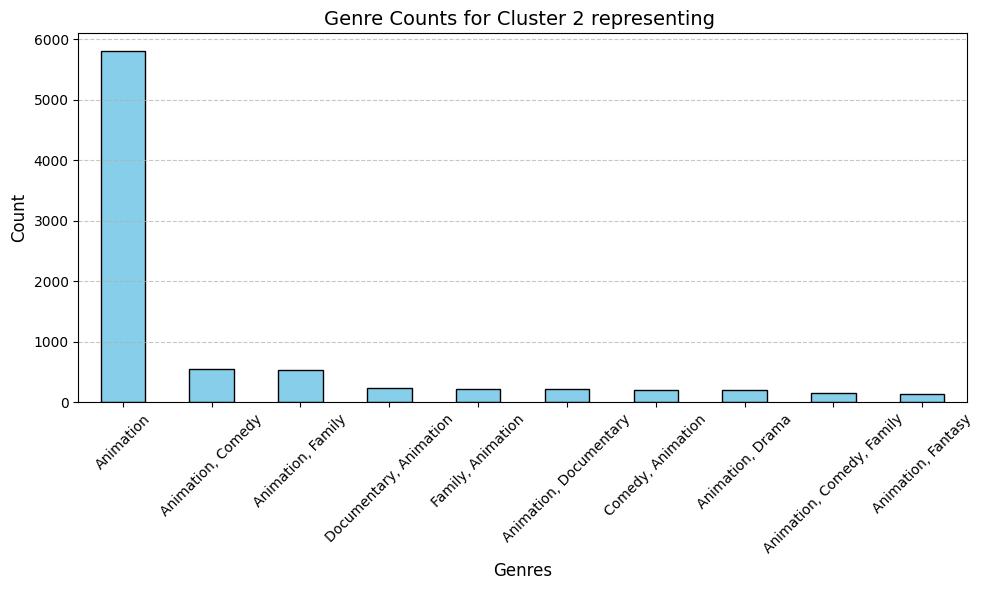


Cluster 3:
Cluster Variance for overview_similarity: 0.005801798751055971


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
28925,Endzeit,Animation,Animated movie by Bruno Sukrow.,German,Short,Winter,Winter,0.000,0.0
32756,One Day in China,Animation,Animated short.,No Language,Short,Winter,Winter,0.000,0.0
11054,Hoshi of the Girls' Garden,"Animation, Comedy",Unknown,Japanese,Short,Winter,Winter,7.333,0.0
44165,A Horse Tale,Animation,An Oswald the Lucky Rabbit cartoon.,English,Short,Winter,Winter,0.000,0.0
14672,Муми-дол: Всё дело в шляпе,Animation,Unknown,Russian,Short,Winter,Winter,4.800,0.0
48859,Roll 'em Lola,Animation,A short animated feature which Fred Burns crea...,No Language,Short,Winter,Winter,0.000,0.0
2861,This Magnificent Cake!,"Animation, History, Comedy, Drama, Mystery","In 1885, Africa is a succulent cake destined t...","Dutch, French",Standard,Winter,Winter,6.529,0.0
40687,Isle of Caprice,"Animation, Comedy, Family",The setting: two South Sea islands. On one: a ...,English,Short,Winter,Winter,0.000,0.0
7269,Coo of The Far Seas,"Animation, Adventure","After a storm hits their island, Yusuke (drivi...",Japanese,Short,Winter,Winter,6.667,0.0
41512,Getting Ahead,Animation,The film consists of many maxims appearing on ...,English,Short,Winter,Winter,0.000,0.0


,genre_similarity,release_season_normalized,runtime_normalized,spoken_languages_encoded,overview_similarity,KMEANS,DBSCAN
12,0.518004,1.0,0.233444,0.231405,0.961594,0,3
16,0.507174,1.0,0.233444,0.390083,0.987202,0,3
36,0.517672,1.0,0.233444,0.231405,0.981990,0,3
56,0.501385,1.0,0.233444,0.231405,0.952731,0,3
62,0.602897,1.0,0.233444,0.231405,0.959721,0,3
63,0.602897,1.0,0.922222,0.231405,0.935813,0,3
71,0.488804,1.0,0.233444,0.449587,0.973661,0,3
76,0.535771,1.0,0.822222,0.231405,0.983711,0,3
80,0.501385,1.0,0.866667,0.231405,0.946982,0,3
83,0.532320,1.0,0.233444,0.231405,0.960244,0,3


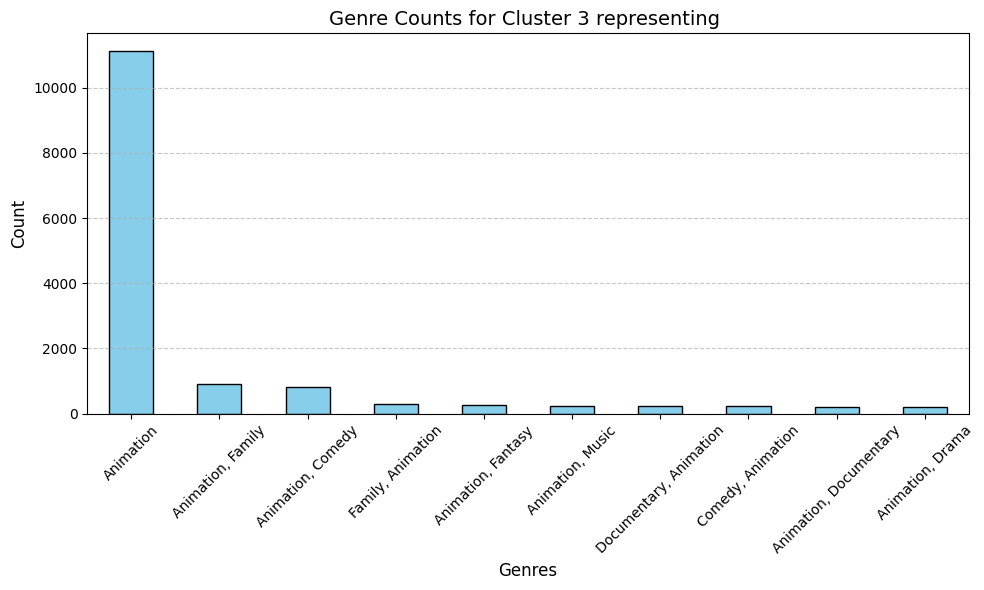

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.3, min_samples=15 | Silhouette Score: 0.662, DB Index: 0.677 ,clusters : 5
Plot Title: DBSCAN Clustering on features (eps=0.3, min_samples=15)
Explained Variance Ratios (3 Components): [0.72262193 0.1874885  0.04345551]
Total Explained Variance: 0.9535659401267857


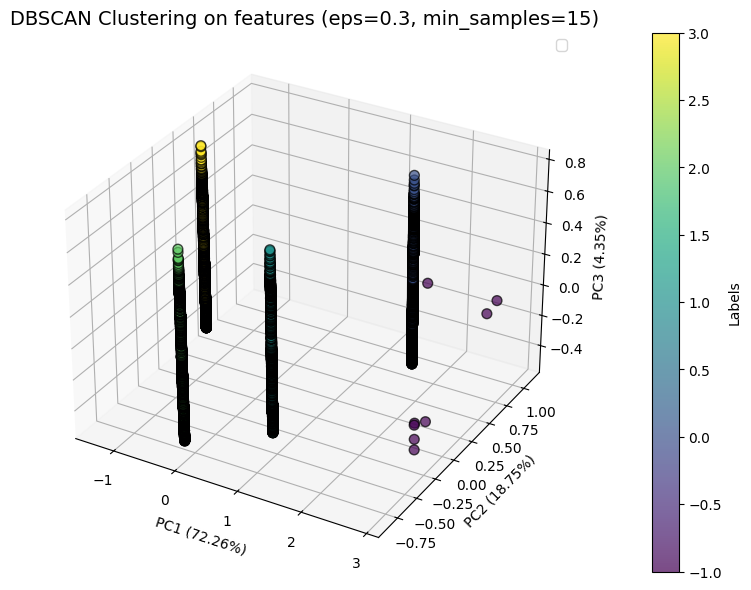

Processing dataset: year_season_features
Model 'kmeans2' saved to 'saved_models\kmeans2.pkl'.
Samples from each KMeans cluster:

Cluster 0:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['KMEANS']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,vote_average,budget
21819,Ananse's Farm,Animation,Ananse is a spider with a heart full of concer...,No Language,Short,Winter,0.000,0.0
264,From Up on Poppy Hill,"Animation, Drama",Two high schoolers find hope as they fight to ...,Japanese,Short,Summer,7.539,22000000.0
31781,BNP: les Temps modernes,Animation,An engineer is sitting at his desk designing a...,No Language,Short,Summer,0.000,0.0
16788,Go! Samurai,"Action, Animation",Animated short by Keiichiro Kimura about a sin...,No Language,Short,Summer,3.000,0.0
22404,Złoty colt,Animation,Unknown,Polish,Short,Winter,0.000,0.0
2678,Mouse in Manhattan,"Animation, Comedy",Jerry Mouse gets tired of living the country l...,English,Short,Summer,7.026,0.0
37736,Boys,Animation,Boys is made with traditional stop motion pupp...,No Language,Short,Winter,0.000,0.0
19800,The Gravedigger,"Horror, Fantasy, Animation","Inspired by popular cult, O COVEIRO is part li...",Portuguese,Short,Winter,9.000,0.0
5663,One Droopy Knight,"Animation, Comedy, Family",Sir Droopalot and Sir Butchalot (Droopy and Bu...,English,Short,Winter,6.500,0.0
39633,Boo Ribbon Winner,Animation,"Molasses, an overweight greyhound, is racing r...",English,Short,Winter,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS
0,0.914729,0.666667,0
4,0.860465,0.666667,0
7,0.751938,0.666667,0
10,0.852713,0.666667,0
12,0.922481,1.000000,0
13,0.806202,0.666667,0
15,0.875969,0.666667,0
16,0.937984,1.000000,0
17,0.875969,0.666667,0
18,0.844961,0.666667,0


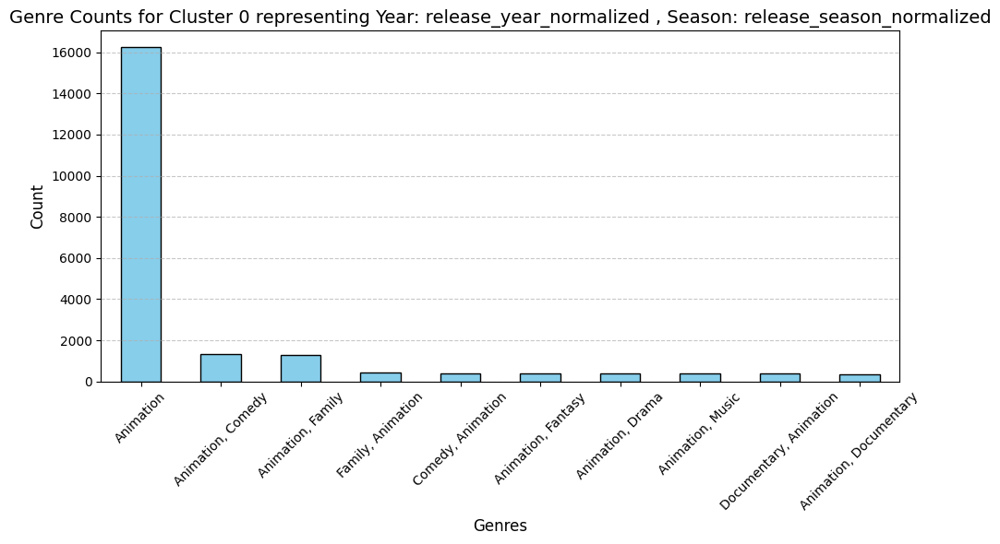


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,vote_average,budget
41135,Insect Poetry,Animation,Stop-motion animation illustrates nature-theme...,English,Short,Fall,0.0,0.0
21717,Mina and the Count: Interlude with a Vampire,Animation,A vampire count must entertain a little girl f...,English,Short,Fall,0.0,0.0
45167,Boilermaker,Animation,Seeking to perfect the recipe for the perfect ...,Estonian,Short,Fall,0.0,0.0
42990,The Bear Hunter,"Animation, Drama",A hunter who lives in the mountain knows the b...,Japanese,Short,Fall,0.0,0.0
12483,A. D.,Animation,Unknown,English,Short,Spring,7.0,0.0
14748,Dear Tutu: The T-Rex In Operation,"Animation, Comedy",The naughty and cute members of the Tyrannosau...,Mandarin,Standard,Fall,10.0,0.0
48120,Busou Shoujotai: Blade Briders The Animation,Animation,"In the late 21st century, humankind came under...",Japanese,Short,Fall,0.0,0.0
24531,Goldberg Devices,Animation,"""Goldberg devices"" are a set of useless and ab...",Russian,Short,Fall,0.0,0.0
32393,Tabula Rasa,Animation,The figure of the singer Björk seamlessly tran...,No Language,Short,Fall,0.0,0.0
38524,Goodbye Mister De Vries,"Animation, Drama",Mister De Vries (93) sits at his window awaiti...,No Language,Short,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS
1,0.868217,0.333333,1
2,0.821705,0.333333,1
3,0.930233,0.000000,1
5,0.806202,0.000000,1
6,0.759690,0.000000,1
8,0.829457,0.000000,1
9,0.806202,0.333333,1
11,0.899225,0.000000,1
14,0.906977,0.000000,1
19,0.790698,0.000000,1


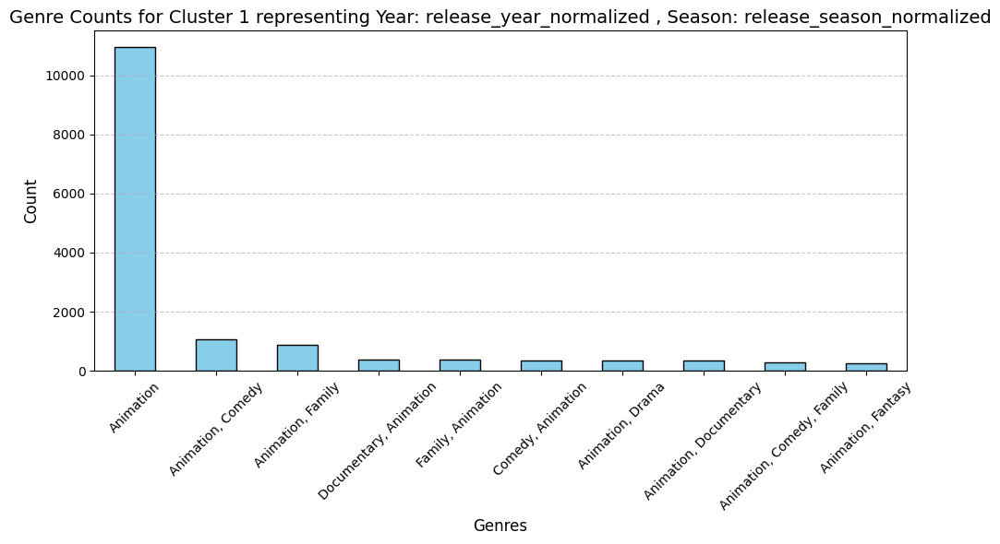

KMeans with k=2 | Silhouette Score: 0.572, DB Index: 0.684, clusters ;2
Plot Title: KMeans Clustering on year_season_features with k=2
Explained Variance Ratios (3 Components): [0.8582266  0.10499661 0.03677679]
Total Explained Variance: 1.0


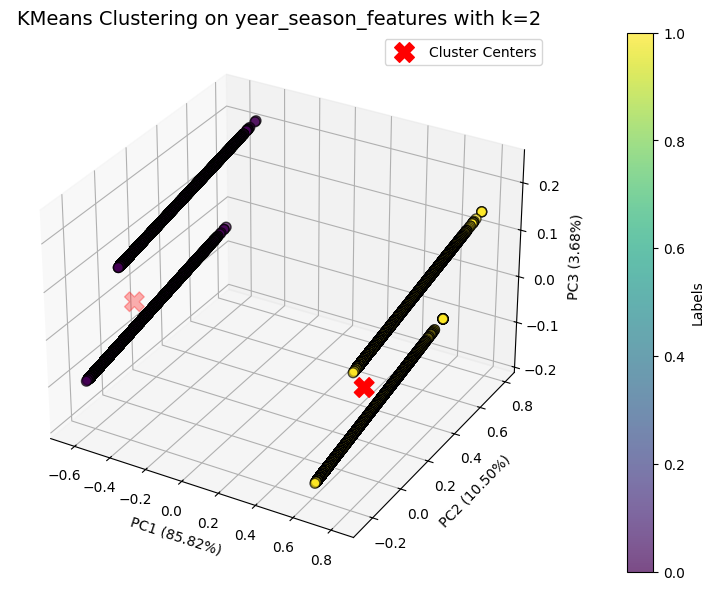

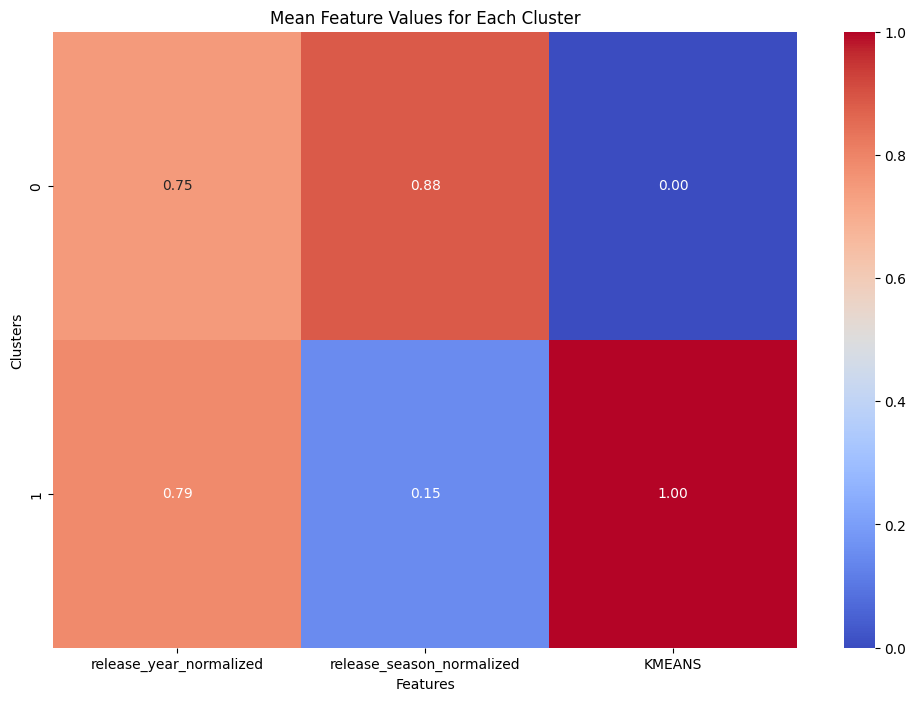

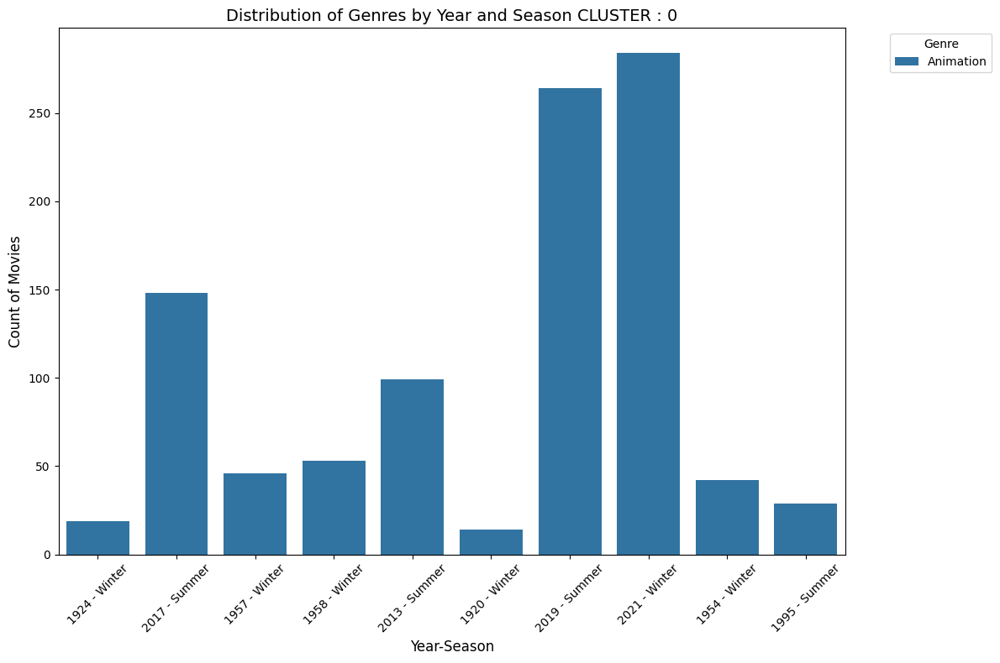

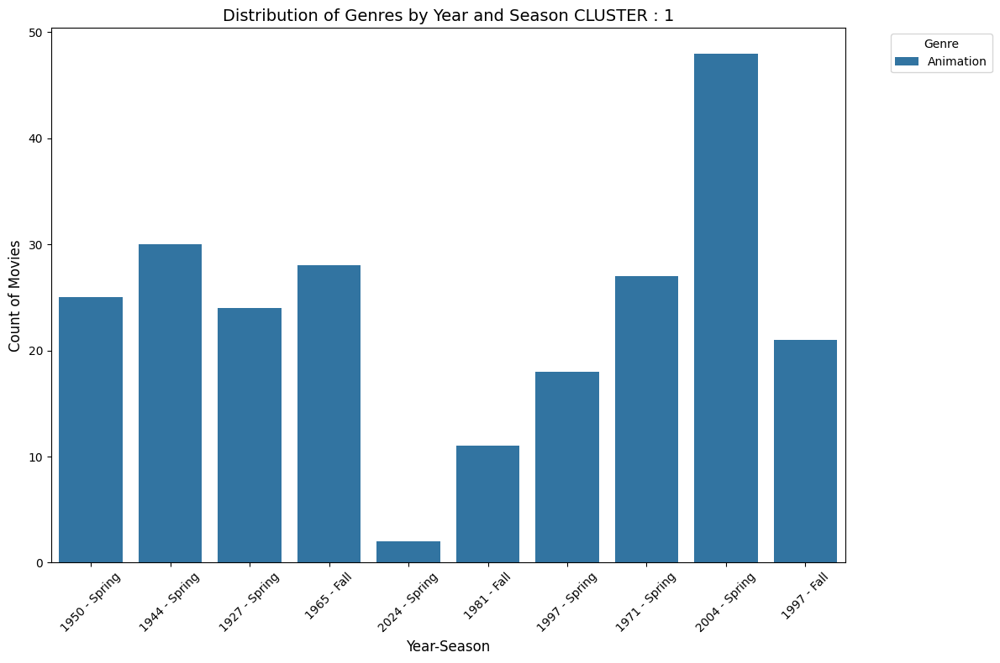

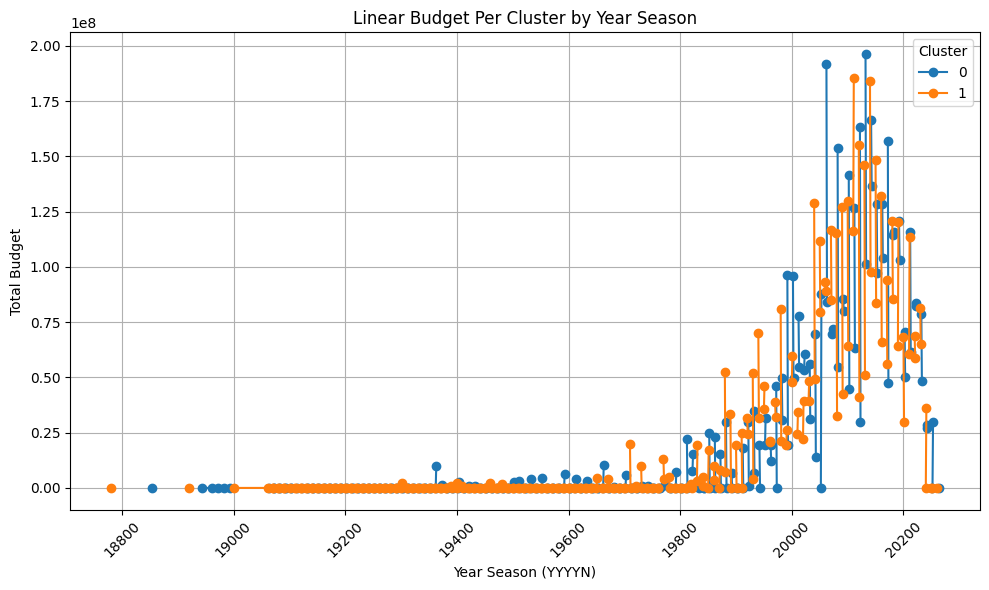

Model 'dbscan0.014' saved to 'saved_models\dbscan0.014.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
19961,Rosalie and Her Phonograph,"Fantasy, Comedy, Animation",A jolly housekeeper brings new meaning to the ...,French,Short,Fall,Fall,4.000,0.0
1716,Poor Pierrot,"Comedy, Animation","One night, Arlequin comes to see his lover Col...",French,Short,Fall,Fall,6.029,0.0
1992,The Enchanted Drawing,"Animation, Comedy, Fantasy",A cartoonist defies reality when he draws obje...,No Language,Short,Fall,Fall,6.423,0.0
3329,L'Homme Machine,Animation,Animated stick drawings representing a man wal...,No Language,Short,Winter,Winter,4.696,0.0
6252,Clown and His Dogs,Animation,Short film of 300 individually painted images.,No Language,Short,Fall,Fall,4.700,0.0
10898,Guillaume Tell,"Animation, Comedy",Unknown,No Language,Short,Summer,Summer,5.000,0.0
1672,The Cameraman's Revenge,Animation,A jilted husband takes his revenge by filming ...,No Language,Short,Fall,Fall,7.198,0.0
21814,Road Hogs in Toyland,Animation,It's a stop-motion film of various toy cars en...,English,Short,Fall,Fall,0.000,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
4984,Matches: An Appeal,Animation,A thirty-second long stop-motion animated piec...,No Language,Short,Winter,Winter,4.200,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.000000,1,-1
1716,0.015504,0.000000,1,-1
1992,0.062016,0.000000,1,-1
2365,0.023256,1.000000,0,-1
3329,0.007752,1.000000,0,-1
4984,0.054264,1.000000,0,-1
6252,0.015504,0.000000,1,-1
6767,0.015504,0.000000,1,-1
10494,0.023256,1.000000,0,-1
10898,0.031008,0.666667,0,-1


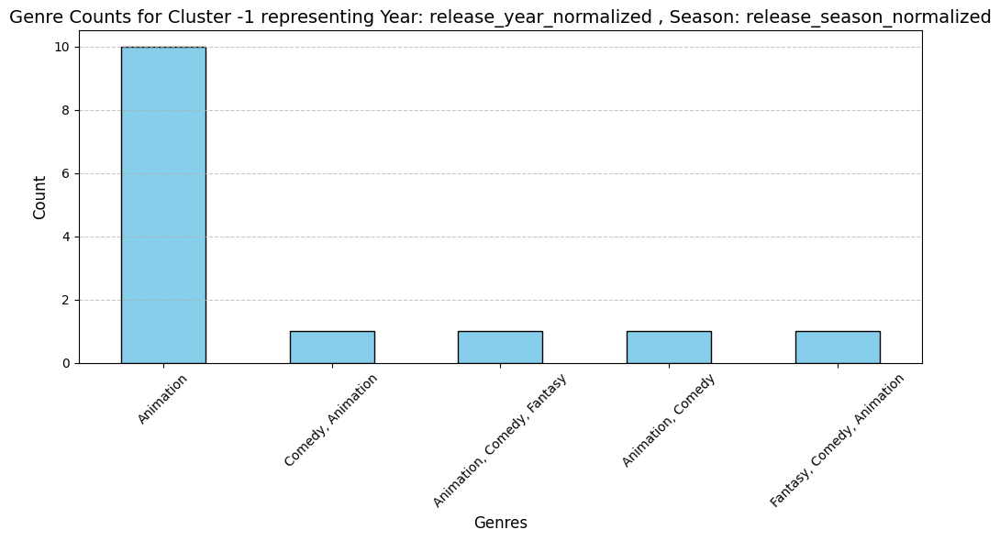


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
6754,Egghead Rides Again,"Comedy, Animation, Western, Family","City dweller Egghead dreams of being a cowboy,...",English,Short,Summer,Summer,6.2,0.0
23736,Stinky in the Dark Forest,Animation,Stinky is born from a flower in the middle of ...,No Language,Short,Summer,Summer,0.0,0.0
14289,What's Happening to Me?,Animation,The answers to some of the world's most embarr...,English,Short,Summer,Summer,6.0,0.0
32772,Nana Dee,Animation,"As years go by in an ordinary house, its only ...",English,Short,Summer,Summer,0.0,0.0
47463,Journey,Animation,A man dreams of getting into other person's mi...,Czech,Short,Summer,Summer,0.0,0.0
42451,From My Desert,Animation,​Temperature: 21. Humidity: 55 %. Optimum cond...,English,Short,Summer,Summer,0.0,0.0
22114,Twinkle 4 You,"Music, Animation",Twinkle 4 You is the first concert featuring o...,Japanese,Short,Summer,Summer,0.0,0.0
38903,"The Baby-Goat, Who Counted up to Ten","Animation, Family",Unknown,Russian,Short,Summer,Summer,0.0,0.0
14589,Doing Impossikible Stunts,"Animation, Comedy",Mystery Pictures is looking for a stunt man. S...,English,Short,Summer,Summer,6.0,0.0
34874,Go! Anpanman: Dokin-chan's Doki Doki Calendar,"Animation, Family",Dokin-chan sings and dances on a big stage wit...,Japanese,Standard,Summer,Summer,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


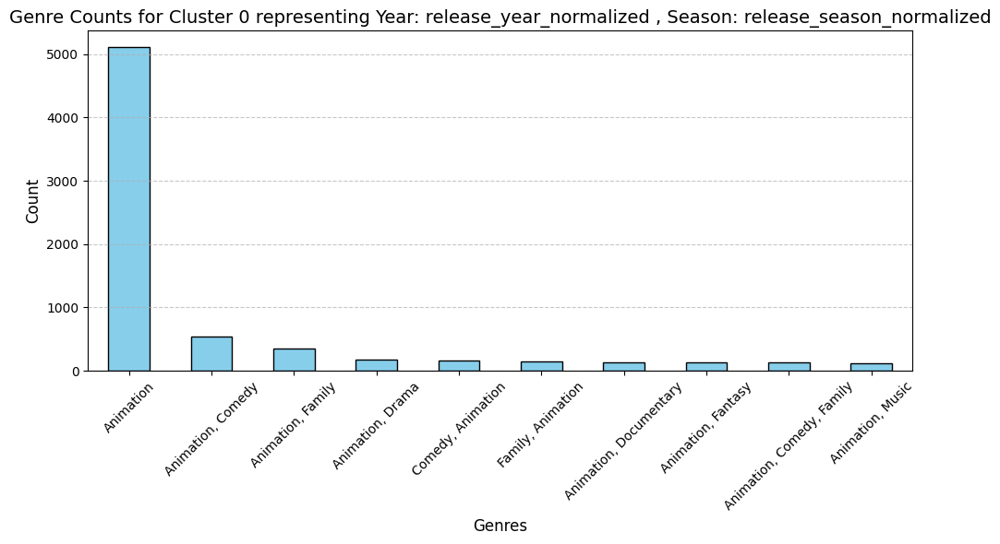


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
12276,Clay Pride: Being Clay in America,"Animation, Comedy","Steve Thompson, age 31, introduces himself to ...",English,Short,Spring,Spring,6.000,0.0
5066,UFO Robot Grendizer vs. Great Mazinger,"Animation, Action, Adventure, Science Fiction",Alien invaders take over Great Mazinger who is...,Japanese,Short,Spring,Spring,5.929,0.0
46671,Aviation,Animation,New animated film by Anastasiya Kiseleva.,Russian,Short,Spring,Spring,0.000,0.0
11951,Nightingales in December,Animation,This metaphorical surrealist tale is an allusi...,No Language,Short,Spring,Spring,6.300,0.0
48261,Vicious Cycle,Animation,If you have ever felt stuck on a hamster wheel...,No Language,Short,Spring,Spring,0.000,0.0
46267,Candy Can,Animation,A vulnerable boy works very hard to escape fro...,Romanian,Short,Spring,Spring,0.000,0.0
11399,Kings of Power 4 Billion %,"Action, Animation",The planet is being rained on by countless tro...,English,Short,Spring,Spring,6.000,0.0
23030,Over the Locked Door,Animation,"In a small Russian town, life goes on as usual...",Russian,Short,Spring,Spring,0.000,0.0
19530,Thomas & Friends: Together on the Tracks,"Family, Animation",Thomas &amp; Friends return with six brand new...,English,Standard,Spring,Spring,10.000,0.0
23301,Pot-pourri,Animation,A selection of publicity clips mounted togethe...,English,Short,Spring,Spring,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


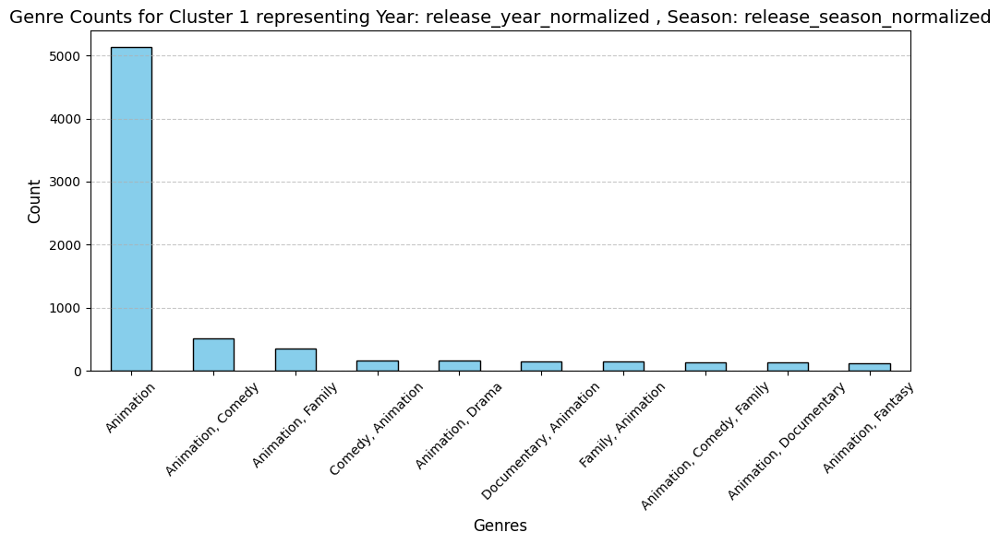


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
710,We're Back! A Dinosaur's Story,"Animation, Science Fiction, Family",Captain New Eyes travels back in time and feed...,English,Standard,Fall,Fall,6.004,0.0
37832,The Mouse 7 - Why am I in the world,"Family, Animation",Unknown,German,Standard,Fall,Fall,0.000,0.0
44515,407 Days,"Animation, Drama","Paul Junior Casimir, better known as Lintho, i...",Haitian; Haitian Creole,Short,Fall,Fall,0.000,0.0
35205,Le Voyage de Tom Pouce,"Animation, Adventure",Unknown,No Language,Short,Fall,Fall,0.000,0.0
33647,Sandwich With,Animation,Sandwiches are different. And everyone can fin...,No Language,Short,Fall,Fall,0.000,0.0
46414,#WombStories,Animation,Our #wombstories​ are never simple. But all of...,No Language,Short,Fall,Fall,0.000,0.0
16716,Sea You,Animation,Would you feel it? Would you know it? Travel b...,No Language,Short,Fall,Fall,6.000,0.0
6441,The Oddsockeaters,"Adventure, Family, Animation","Oddsockeaters are small invisible creatures, r...",Czech,Standard,Fall,Fall,5.778,0.0
40110,Bird of Prey,"Western, Animation","In a desolate desert, two desperados prepare f...",No Language,Short,Fall,Fall,0.000,0.0
25523,Horizon,Animation,Horizon is an intimate story about the sea in ...,Croatian,Short,Fall,Fall,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


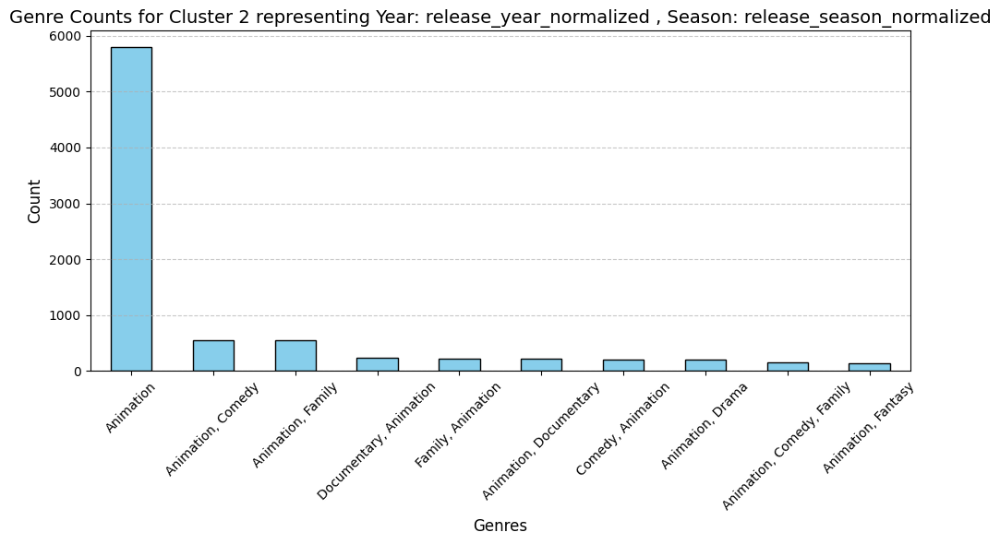


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
3872,Broken Toys,Animation,"A sailor doll, thrown into a toy dump, rallies...",No Language,Short,Winter,Winter,6.5,29905.0
35726,Как несли стол,Animation,Unknown,Russian,Short,Winter,Winter,0.0,0.0
3246,Moose Hunters,Animation,Goofy (front) and Donald (rear) are dressed in...,"English, Italian",Short,Winter,Winter,6.1,0.0
42947,Organic,Animation,"Joy, vitality, and a steampunk organ. A perfec...",English,Short,Winter,Winter,0.0,0.0
4500,Bunyan and Babe,"Adventure, Animation, Comedy, Family, Fantasy","Travis and his sister, Whitney, visit their gr...",English,Standard,Winter,Winter,6.0,0.0
45407,The Invisible String,Animation,Short animation by Eri Kinoshita,No Language,Short,Winter,Winter,0.0,0.0
7273,The Lightning Rod Thief,Animation,Winner of the grand prize at the 1946 Venice B...,French,Short,Winter,Winter,6.4,0.0
33306,Benny's Biggest Battle,"Animation, Family",The Conductor assigns Benny the Bear to take c...,English,Short,Winter,Winter,0.0,0.0
45373,Caterpillar,Animation,The world has overflown with too much material...,No Language,Short,Winter,Winter,0.0,0.0
18785,Animated Motion: Part 1,"Animation, Documentary",The first part of this series by Norman McLare...,English,Short,Winter,Winter,7.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


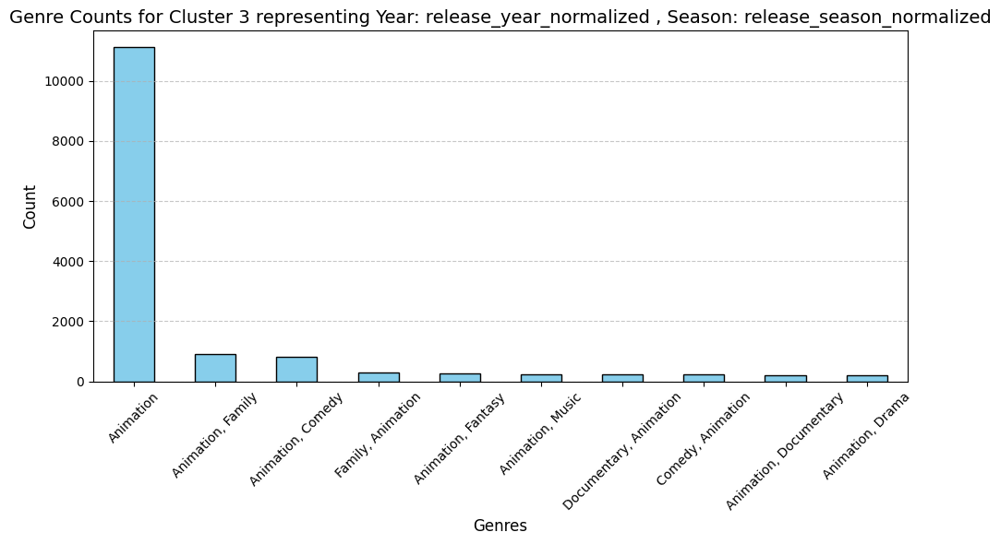


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
13272,The Four Little Tailors,"Romance, Fantasy, Comedy, Animation","The opening scene is in a tailor's shop, showi...",No Language,Short,Summer,Summer,4.000,0.0
13271,Petit Faust,"Animation, Fantasy",The various parts of Faust are played by puppets.,No Language,Short,Summer,Summer,5.500,0.0
5767,The Happy Microbes,"Comedy, Animation",A scientist has acquired a microscope and is s...,No Language,Short,Summer,Summer,4.900,0.0
44454,The Magic Fountain Pen,Animation,Unknown,English,Short,Summer,Summer,0.000,0.0
9418,The Twelve Labors of Hercules,"Adventure, Animation, Fantasy",A cut-out animation depicting the Twelve Labou...,No Language,Short,Summer,Summer,5.800,0.0
13274,Comic Mutations,Animation,An old and learned doctor discovers the secret...,No Language,Short,Summer,Summer,5.000,0.0
8113,Lightning Sketches,"Comedy, Animation",An illustrator draws some sketches at lightnin...,No Language,Short,Summer,Summer,3.800,0.0
14628,TR's Arrival in Africa,"Comedy, Animation","African animals, including a lookout monkey, a...","English, No Language",Short,Summer,Summer,5.000,0.0
14682,Tale of the Ark,"Fantasy, Animation","A child dreams of the Bible tale, reenacted by...",No Language,Short,Summer,Summer,4.500,0.0
1486,Fantasmagorie,Animation,"An animated film by French auteur Émile Cohl, ...",No Language,Short,Summer,Summer,6.611,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,4
5767,0.093023,0.666667,0,4
8113,0.077519,0.666667,0,4
9418,0.100775,0.666667,0,4
13271,0.100775,0.666667,0,4
13272,0.100775,0.666667,0,4
13274,0.093023,0.666667,0,4
14628,0.093023,0.666667,0,4
14682,0.093023,0.666667,0,4
44454,0.093023,0.666667,0,4


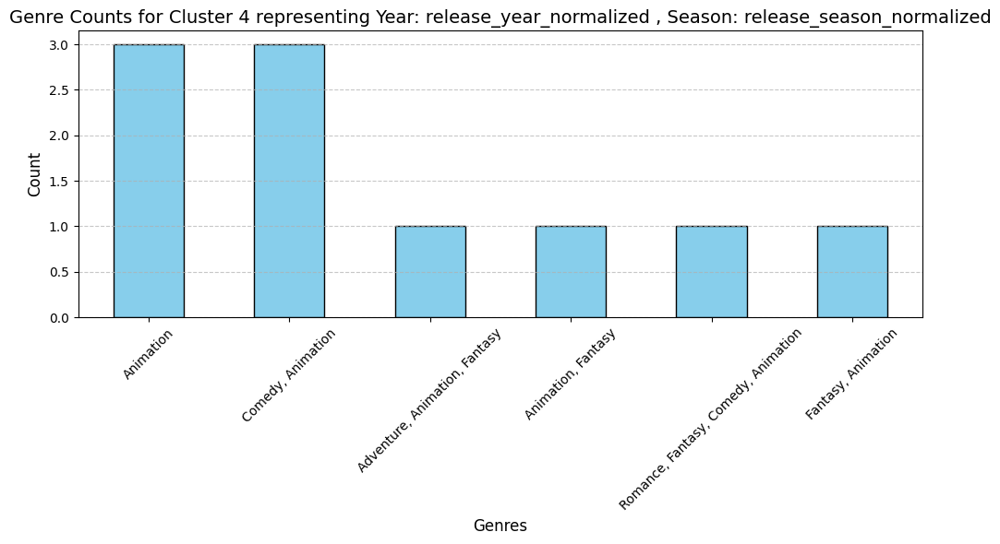


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
17842,Animated Cotton,Animation,It might not take you long to cotton on to the...,No Language,Short,Fall,Fall,4.0,0.0
6830,Affairs of the Heart,Animation,A near-abstract animation telling a simple rom...,No Language,Short,Fall,Fall,5.5,0.0
5138,Drama at the Puppets' House,"Comedy, Animation, Crime",For a short comedy of rare merit this subject ...,No Language,Short,Fall,Fall,6.2,0.0
9882,The Magic Hoop,"Fantasy, Animation",Émile Cohl mixes live-action and stop-motion a...,No Language,Short,Fall,Fall,4.8,0.0
2248,The Electric Hotel,"Fantasy, Animation",An enthusiastic young couple is astounded with...,No Language,Short,Fall,Fall,6.1,0.0
12679,The Sorcerer's Scissors,"Animation, Fantasy","A mix of spectacle, animation and dance, the f...",No Language,Short,Fall,Fall,7.0,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.4,0.0
5010,The Puppet's Nightmare,"Comedy, Animation","A nightmare, sketched out upon a living blackb...",No Language,Short,Fall,Fall,5.8,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2248,0.085271,0.0,1,5
5010,0.085271,0.0,1,5
5138,0.085271,0.0,1,5
6830,0.093023,0.0,1,5
8477,0.085271,0.0,1,5
9882,0.085271,0.0,1,5
12679,0.077519,0.0,1,5
17842,0.093023,0.0,1,5


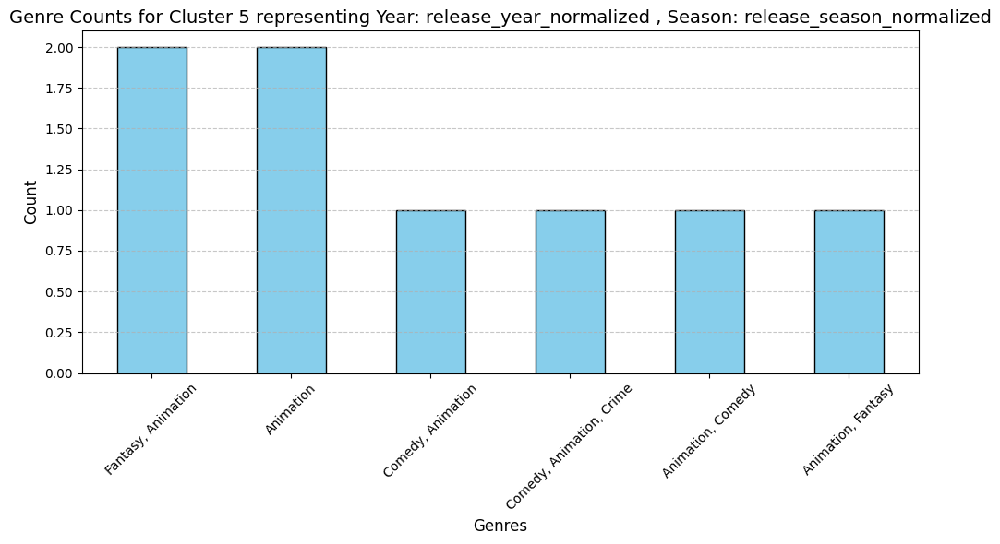


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
8508,L'Équilibriste,Animation,Praxinoscope animation of a child laying down ...,No Language,Short,Spring,Spring,4.200,0.0
9756,Le Trapèze,Animation,Praxinoscope animation of a man spinning aroun...,No Language,Short,Spring,Spring,5.000,0.0
9757,La Charmeuse,Animation,Praxinoscope animation of a girl charming a fl...,No Language,Short,Spring,Spring,5.000,0.0
9779,The Aquarium,Animation,"Praxinoscope reel, Series 1, number 1",No Language,Short,Spring,Spring,3.250,0.0
4025,The Musician Monkey,Animation,A pre-cinematograph colour animation of the mo...,No Language,Short,Spring,Spring,6.048,153.0
9758,La Balançoire,Animation,Praxinoscope animation of two children playing...,No Language,Short,Spring,Spring,4.500,0.0
9759,Le Fumeur,Animation,Praxinoscope animation of a man sitting backwa...,No Language,Short,Spring,Spring,4.250,0.0
4592,The Magic Rosette,Animation,Praxinoscope strip of a shifting rosette. Seri...,No Language,Short,Spring,Spring,5.583,0.0
8487,Dancing on the Rope,Animation,Early Praxinoscope strip showing a girl dancin...,No Language,Short,Spring,Spring,4.200,0.0
11786,Les Scieurs de Long,Animation,Praxinoscope animation of two workers sawing w...,No Language,Short,Spring,Spring,2.333,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,6
4592,0.0,0.333333,1,6
7015,0.0,0.333333,1,6
7018,0.0,0.333333,1,6
8487,0.0,0.333333,1,6
8508,0.0,0.333333,1,6
9755,0.0,0.333333,1,6
9756,0.0,0.333333,1,6
9757,0.0,0.333333,1,6
9758,0.0,0.333333,1,6


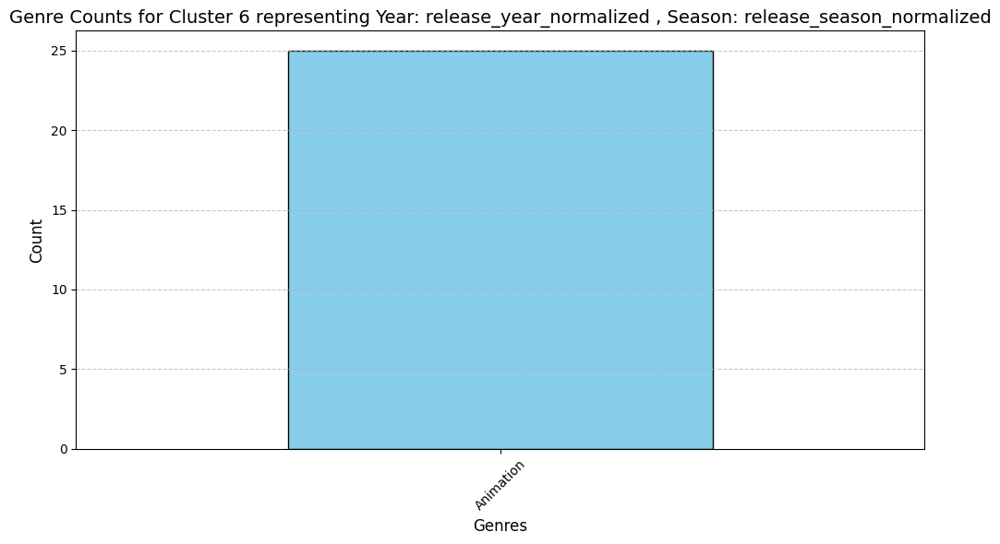

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.014, min_samples=6 | Silhouette Score: 0.432, DB Index: 1.138 ,clusters : 8
Plot Title: DBSCAN Clustering on year_season_features (eps=0.014, min_samples=6)
Explained Variance Ratios (3 Components): [0.76816759 0.19840104 0.02639648]
Total Explained Variance: 0.9929651053150125


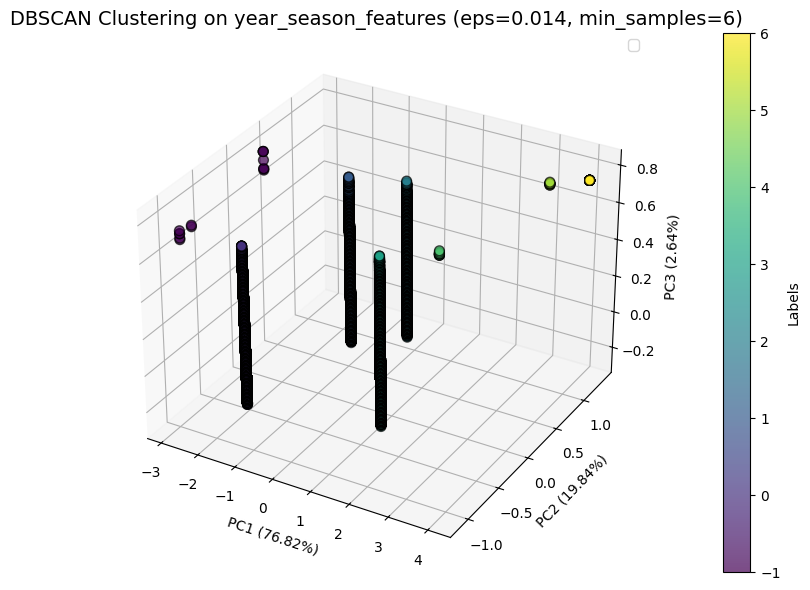

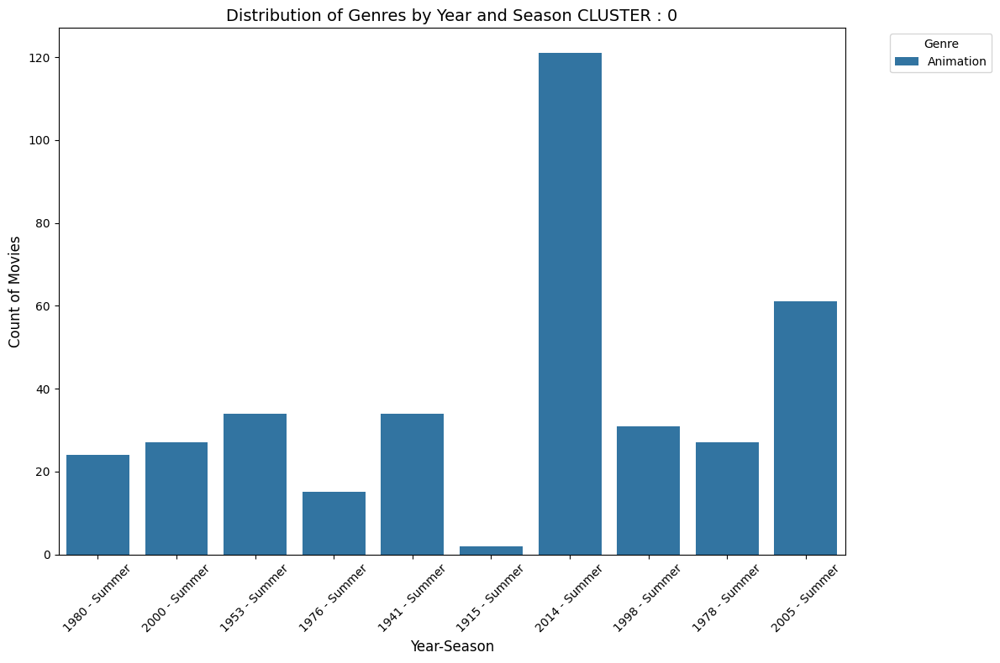

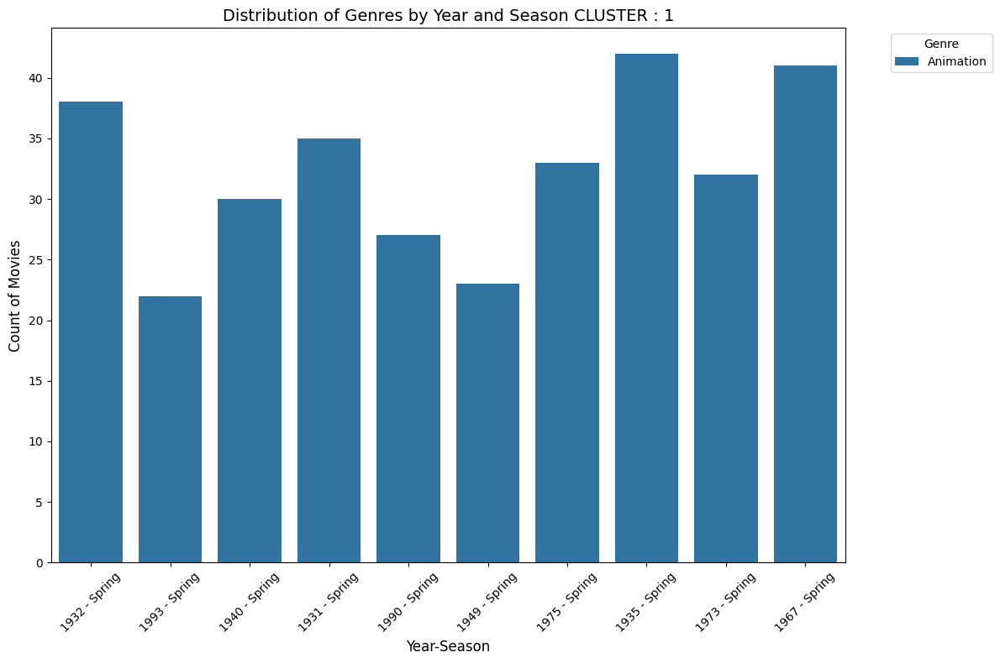

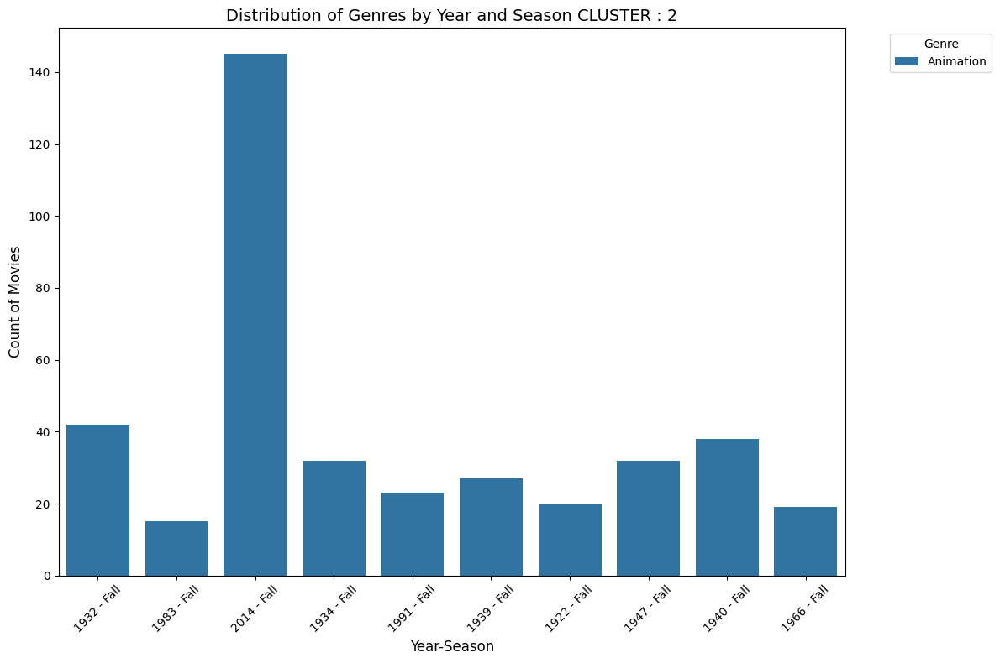

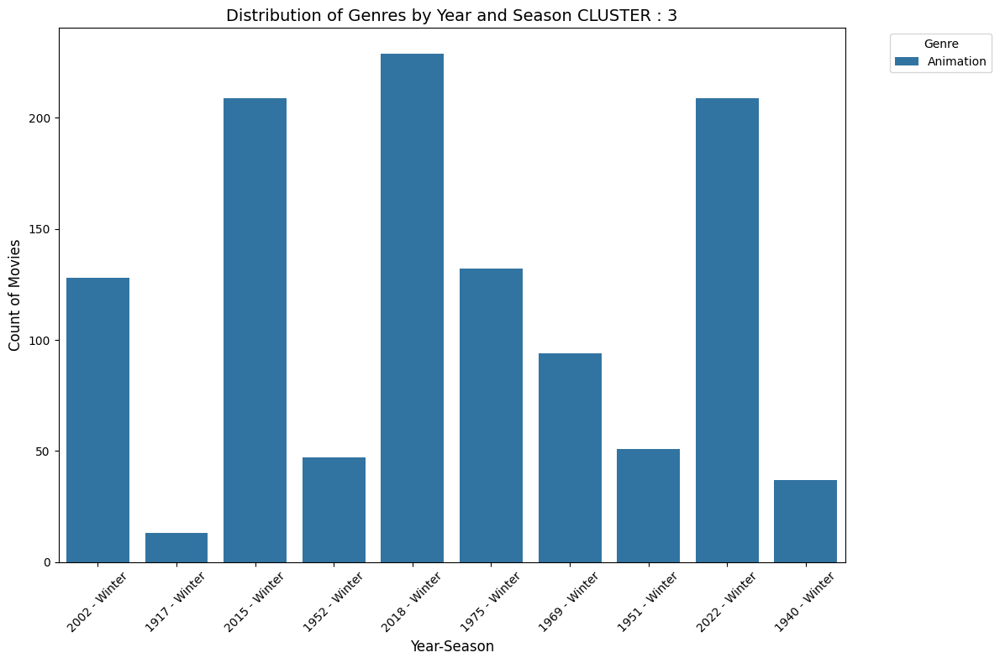

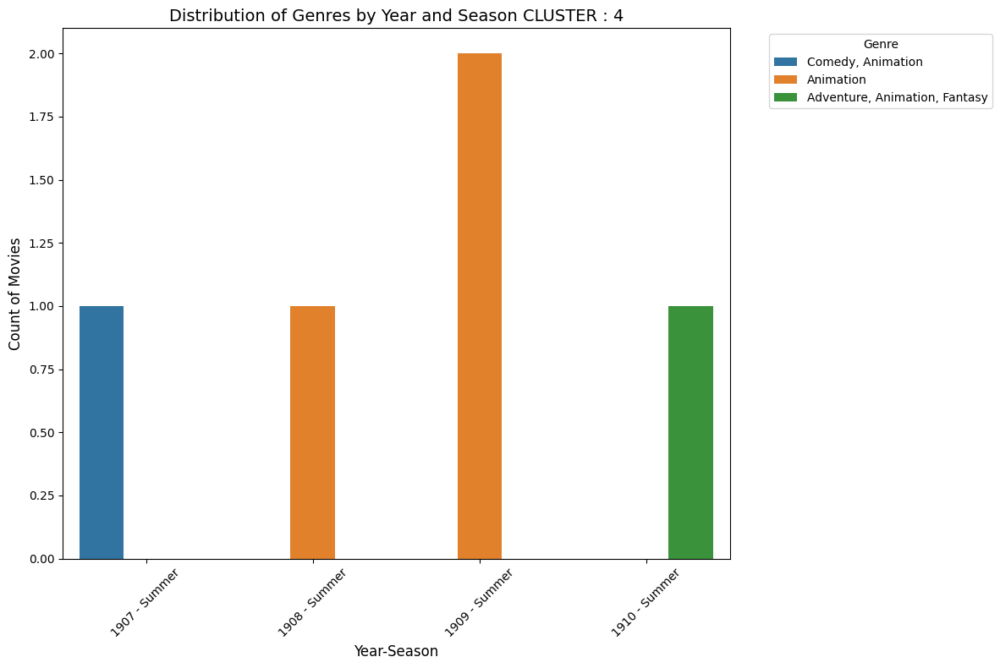

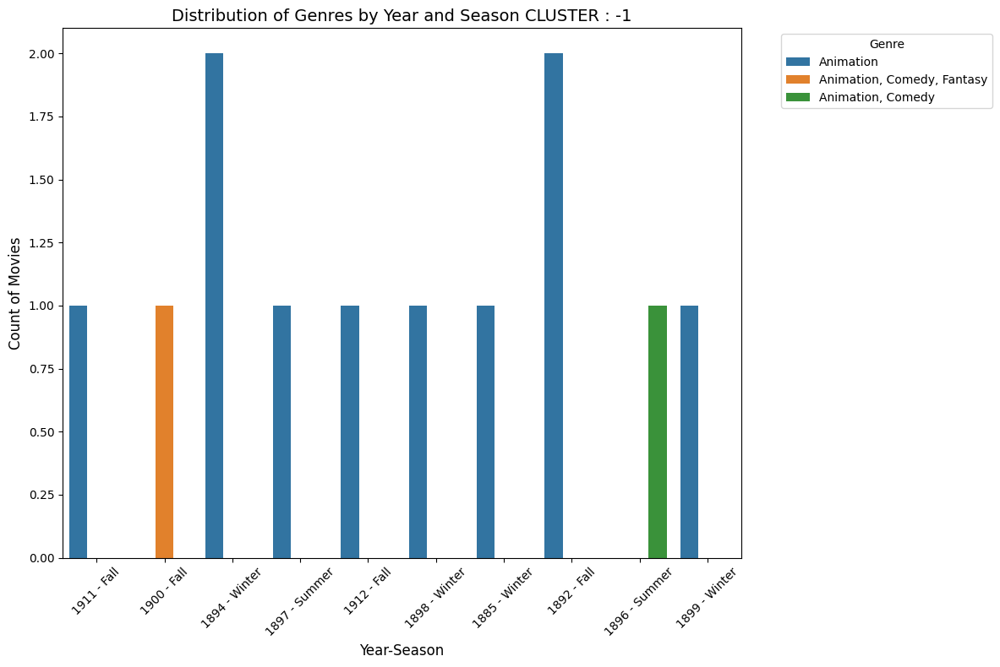

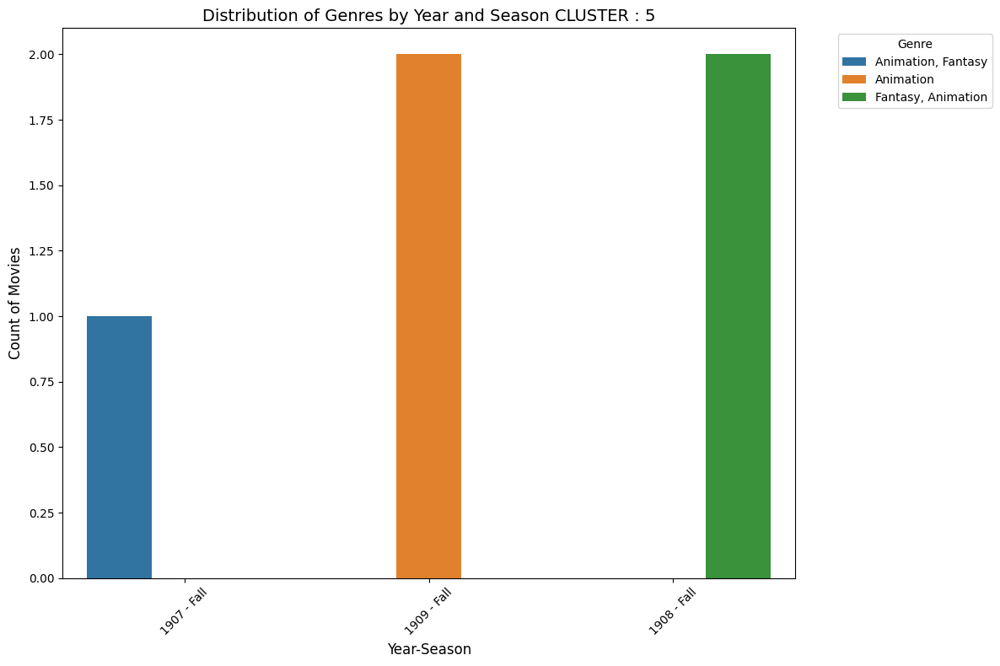

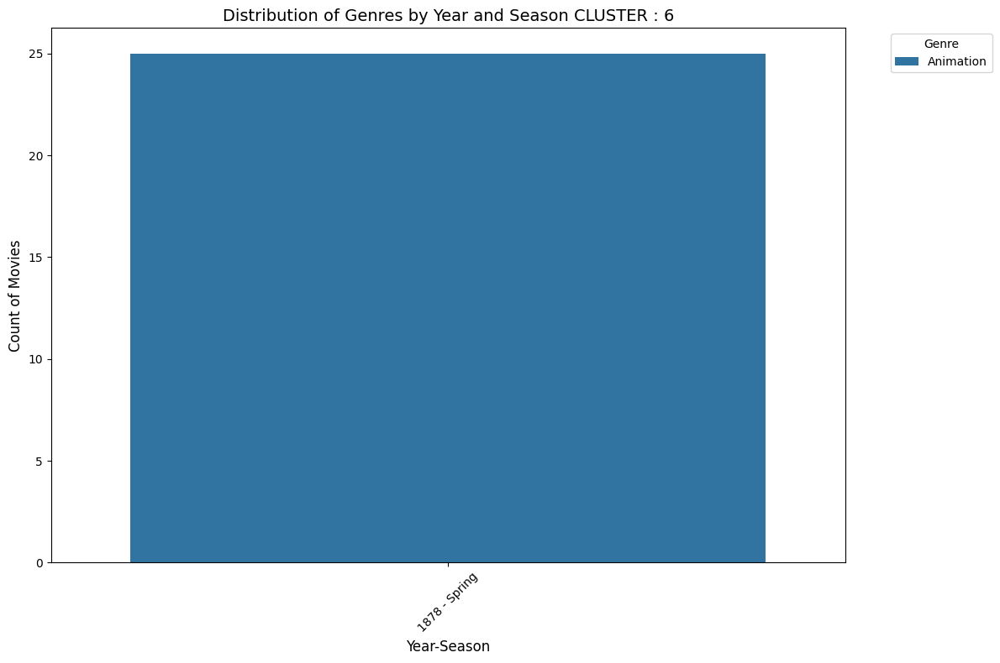

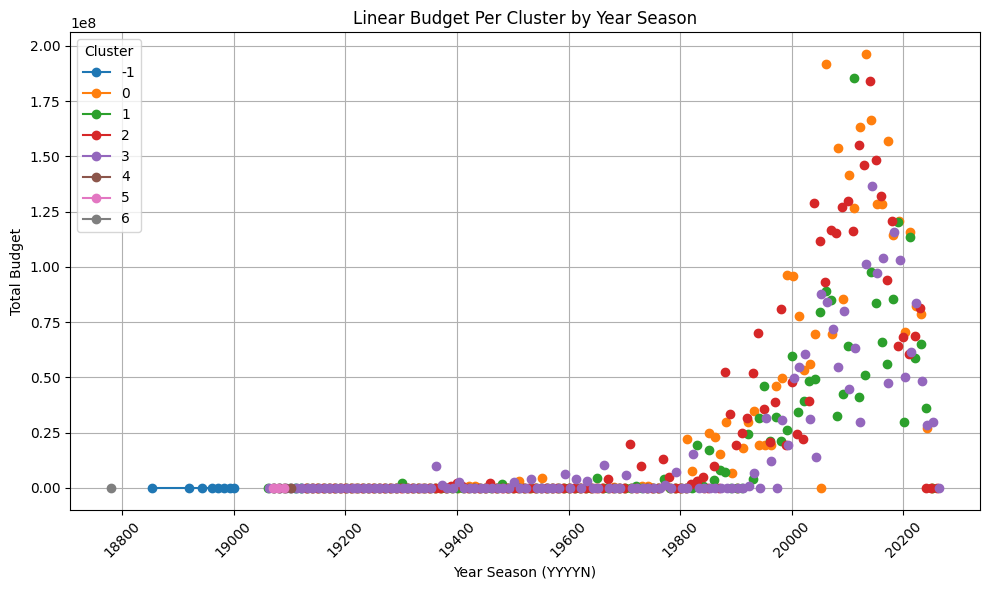

Model 'dbscan0.014' saved to 'saved_models\dbscan0.014.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9418,The Twelve Labors of Hercules,"Adventure, Animation, Fantasy",A cut-out animation depicting the Twelve Labou...,No Language,Short,Summer,Summer,5.800,0.0
5767,The Happy Microbes,"Comedy, Animation",A scientist has acquired a microscope and is s...,No Language,Short,Summer,Summer,4.900,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
13271,Petit Faust,"Animation, Fantasy",The various parts of Faust are played by puppets.,No Language,Short,Summer,Summer,5.500,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.400,0.0
13274,Comic Mutations,Animation,An old and learned doctor discovers the secret...,No Language,Short,Summer,Summer,5.000,0.0
14428,Le premier cigare,Animation,Unknown,No Language,Short,Summer,Summer,4.500,0.0
22645,Untitled Fire Lord Zuko Project,"Animation, Fantasy",A spin-off of the animated series Avatar: The ...,No Language,Short,Fall,Fall,0.000,0.0
13272,The Four Little Tailors,"Romance, Fantasy, Comedy, Animation","The opening scene is in a tailor's shop, showi...",No Language,Short,Summer,Summer,4.000,0.0
10898,Guillaume Tell,"Animation, Comedy",Unknown,No Language,Short,Summer,Summer,5.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,-1
1672,0.116279,0.000000,1,-1
1716,0.015504,0.000000,1,-1
1992,0.062016,0.000000,1,-1
2248,0.085271,0.000000,1,-1
2365,0.023256,1.000000,0,-1
2367,0.069767,0.333333,1,-1
3329,0.007752,1.000000,0,-1
4984,0.054264,1.000000,0,-1
5010,0.085271,0.000000,1,-1


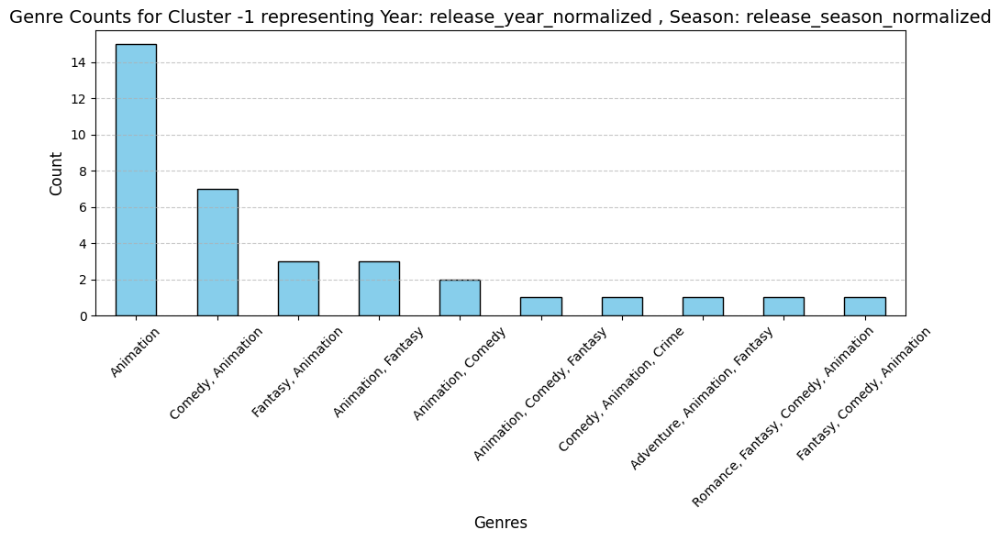


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
15017,Tatakae!! Ramenman (Movie),"Animation, Adventure, Action",Theatrical film of the anime series Tatakae!! ...,Japanese,Short,Summer,Summer,8.000,0.0
44338,Gimpel Beynish Goes to America,"Animation, Documentary",Have you ever wondered how extremely difficult...,English,Short,Summer,Summer,0.000,0.0
46490,Funtastic Children's Favourites,Animation,Over two hours of bumper fun with all your fav...,No Language,Short,Summer,Summer,0.000,0.0
30173,Brüderchen Winter,Animation,"Three children, Spring, Summer and Autumn, won...",German,Short,Summer,Summer,0.000,0.0
7183,Appleseed XIII: Tartaros,"Science Fiction, Animation","Following World War V, a global-scale conflict...",Japanese,Standard,Summer,Summer,5.857,0.0
2189,Gulliver Returns,"Animation, Adventure, Fantasy",World traveler and adventurer Gulliver is invi...,English,Standard,Summer,Summer,6.482,2500000.0
10999,Conni and the Cat,Animation,Conni's adorable but mischievous cat Mau follo...,"English, German",Standard,Summer,Summer,5.000,0.0
40527,The Silver Streak,Animation,A Terrytoons cartoon released 20 July 1945. Mi...,English,Short,Summer,Summer,0.000,0.0
25709,Lost Cat,Animation,This short follows a cat that wants to find a ...,English,Short,Summer,Summer,0.000,0.0
49186,Welcome to Paradiso (City in the Sea),"Animation, Music","Paradiso, the release from Chino Amobi, was on...",English,Short,Summer,Summer,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


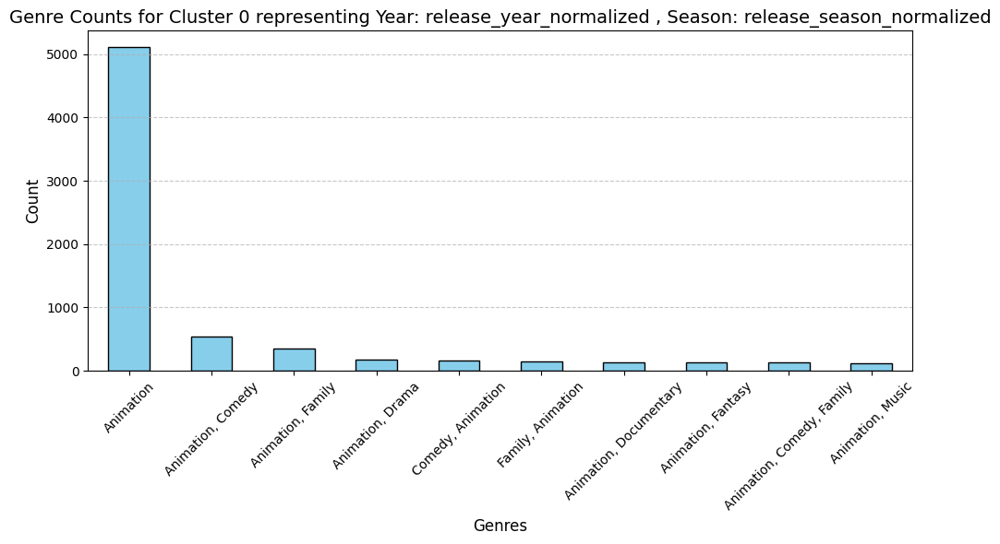


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
16236,The Little Boat that Wanted to Fly,Animation,A story about a boat that wanted to fly.,Russian,Short,Spring,Spring,7.000,0.0
38505,The Captain's Pup,Animation,The mangiest pup at Pete's Pooch Palace catche...,English,Short,Spring,Spring,0.000,0.0
23018,Varokaa heikkoa jäätä,Animation,A children's winter safety PSA starring the Pi...,Finnish,Short,Spring,Spring,0.000,0.0
644,Ice Age: The Great Egg-Scapade,"Adventure, Animation, Comedy, Family, TV Movie",A harried prehistoric bird mother entrusts her...,English,Short,Spring,Spring,6.391,0.0
27887,Tiger Mask (1970),"Animation, Adventure, Action","Naoto Date, also known as Tiger Mask, betrayed...",Japanese,Standard,Spring,Spring,0.000,0.0
19489,Hydee and the Hytops,"Animation, Family, Music","Hydee and her band enter the ""So Stellar"" tale...",English,Standard,Spring,Spring,10.000,0.0
3648,"Scooby-Doo: Agence toutou risques, vol. 1 : Le...","Animation, Family, Comedy",Unknown,French,Short,Spring,Spring,10.000,0.0
25517,Ходжа Насреддин,"Animation, Comedy, Adventure",Khodzha Nasreddin saves the donkey from the he...,Russian,Short,Spring,Spring,0.000,0.0
14665,Winx Club 20,Animation,Na DVD-ju so naslednje risanke: Zadnji trenute...,No Language,Standard,Spring,Spring,8.000,0.0
39850,Laughing Gas,Animation,Flip is a dentist. A walrus in the waiting roo...,English,Short,Spring,Spring,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


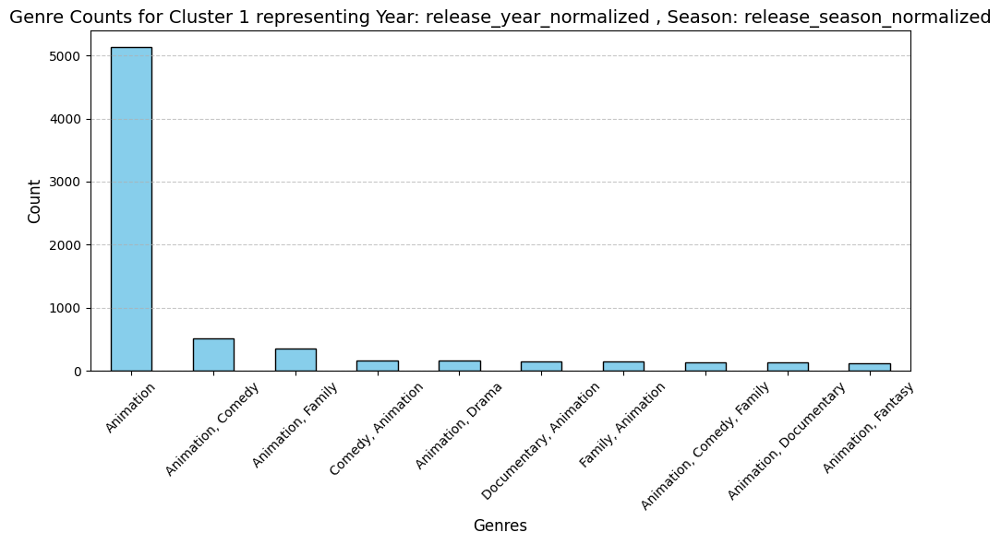


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
41990,The Crowd Snores,Animation,A Walter Lantz Pooch the Pup cartoon released ...,English,Short,Fall,Fall,0.00,0.0
36424,McLaren's Negatives,"Animation, Documentary","An intimate look at cinematographic creation, ...",English,Short,Fall,Fall,0.00,0.0
9697,Gaslight,"Animation, Comedy",Gaslight is a CG-animated short comedy about a...,English,Short,Fall,Fall,6.75,0.0
44470,Are we Living in a Simulation?,Animation,Is our reality a detailed computer simulation?...,English,Short,Fall,Fall,0.00,0.0
7456,The Little Lion Hunter,Animation,"Out hunting in the jungle with his spear, Afri...",English,Short,Fall,Fall,6.30,0.0
551,Barbie: The Princess & The Popstar,"Family, Animation",Tori is a blonde princess who is bored of livi...,English,Standard,Fall,Fall,7.10,0.0
37522,Cupcake,Animation,"High energy, freestyle jazz scatting skips alo...",English,Short,Fall,Fall,0.00,0.0
13577,Take the X Train,"Animation, Comedy, Science Fiction",Ishihara Toru is an everyday guy with an on-an...,Japanese,Standard,Fall,Fall,4.00,0.0
5120,"Life Is a Circus, Charlie Brown",Animation,"When the circus comes to town, Snoopy naturall...",English,Short,Fall,Fall,5.80,0.0
11295,Day 40,"Animation, Comedy",In this animated retelling of the Noah's Ark s...,English,Short,Fall,Fall,6.00,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


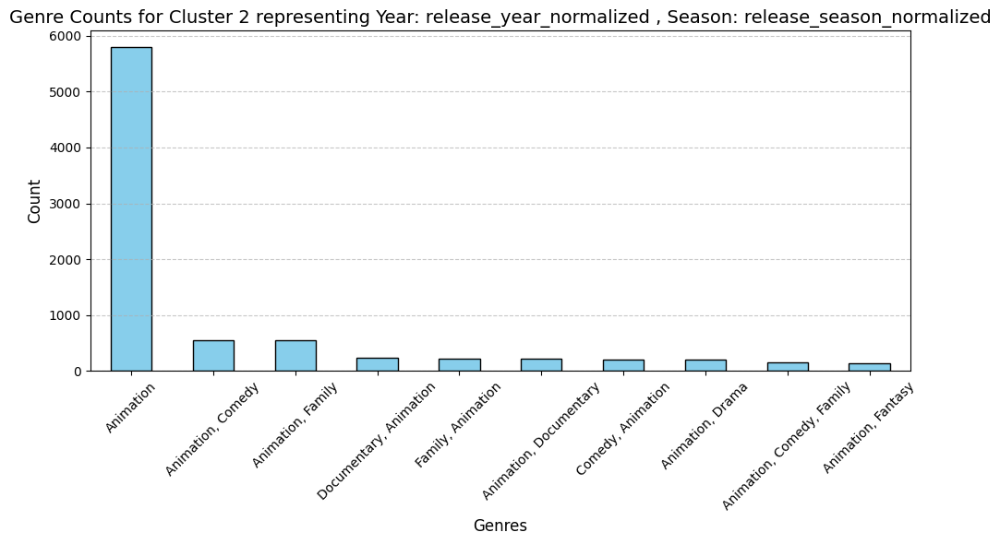


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
21530,Patch Mah Britches,Animation,A Barney Google cartoon.,English,Short,Winter,Winter,0.000,0.0
923,The Boss Baby: Christmas Bonus,"Animation, Family, Adventure",Christmas Eve takes a twisty turn when the Bos...,English,Standard,Winter,Winter,6.785,0.0
38150,Pigeon Holed,Animation,"Homer Pigeon's eyesight is pretty bad, so he g...",English,Short,Winter,Winter,0.000,0.0
16292,Marbles,Animation,A little girl's marbles lead to a fascinating ...,No Language,Short,Winter,Winter,8.000,0.0
13414,Canada Vignettes: News Canada,Animation,Historical events are related through the medi...,English,Short,Winter,Winter,6.000,0.0
19892,t.o.m.,Animation,The journey of a young boy.,English,Short,Winter,Winter,5.000,0.0
10367,Bride of Resistor,Animation,Mr. Resistor tries to catch himself a woman.,English,Short,Winter,Winter,8.000,0.0
46501,The Last Matador,Animation,"Once upon a time, there lived an old matador i...",English,Short,Winter,Winter,0.000,0.0
23924,Tetarape,Animation,Abstract animation by Boris Labbé,Japanese,Short,Winter,Winter,0.000,0.0
18130,Kakania,Animation,A rapid-fire look at life in the city through ...,English,Short,Winter,Winter,6.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


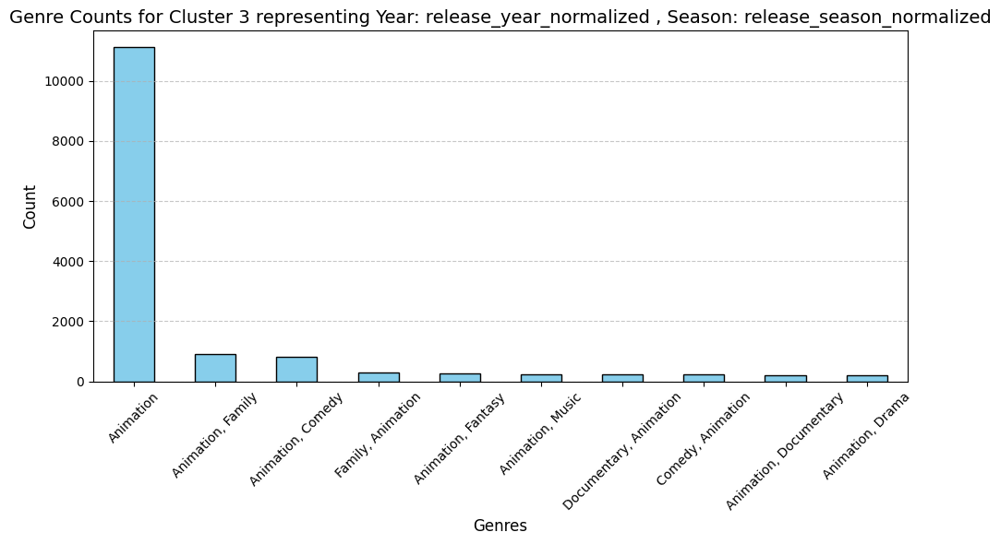


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
13143,Le Moulin à Eau,Animation,Praxinoscope animation of the water mill. Seri...,No Language,Short,Spring,Spring,3.500,0.0
9866,Les Chiens Savants,Animation,Praxinoscope animation of a boy holding a hoop...,No Language,Short,Spring,Spring,4.500,0.0
9859,Le Rotisseur,Animation,Praxinoscope animation of a chef rotating meat...,No Language,Short,Spring,Spring,4.750,0.0
9857,Les Bulles de Savon,Animation,Praxinoscope animation of a girl in a blue dre...,No Language,Short,Spring,Spring,4.750,0.0
4025,The Musician Monkey,Animation,A pre-cinematograph colour animation of the mo...,No Language,Short,Spring,Spring,6.048,153.0
7018,"Zim, Boum, Boum",Animation,Praxinoscope animation of a green-suited boy w...,No Language,Short,Spring,Spring,4.125,0.0
9755,Les Papillons,Animation,Praxinoscope animation of a butterfly flutteri...,No Language,Short,Spring,Spring,4.000,0.0
9758,La Balançoire,Animation,Praxinoscope animation of two children playing...,No Language,Short,Spring,Spring,4.500,0.0
11559,Les Clowns,Animation,Praxinoscope animation of clowns dancing with ...,No Language,Short,Spring,Spring,3.333,0.0
4592,The Magic Rosette,Animation,Praxinoscope strip of a shifting rosette. Seri...,No Language,Short,Spring,Spring,5.583,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,4
4592,0.0,0.333333,1,4
7015,0.0,0.333333,1,4
7018,0.0,0.333333,1,4
8487,0.0,0.333333,1,4
8508,0.0,0.333333,1,4
9755,0.0,0.333333,1,4
9756,0.0,0.333333,1,4
9757,0.0,0.333333,1,4
9758,0.0,0.333333,1,4


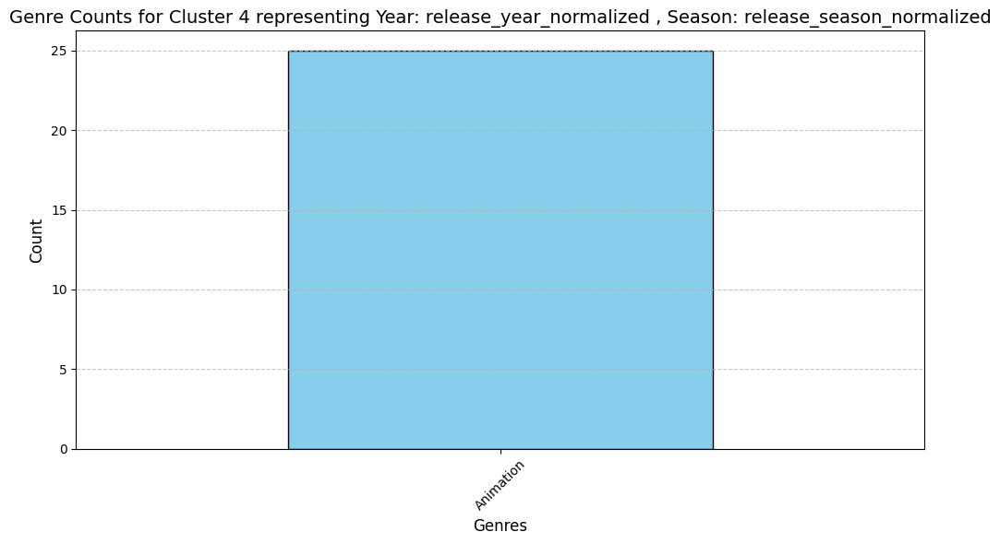

DBSCAN with eps=0.014, min_samples=10 | Silhouette Score: 0.835, DB Index: 1.992 ,clusters : 6
Plot Title: DBSCAN Clustering on year_season_features (eps=0.014, min_samples=10)
Explained Variance Ratios (3 Components): [0.76769838 0.19875961 0.0265096 ]
Total Explained Variance: 0.9929675893190614


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


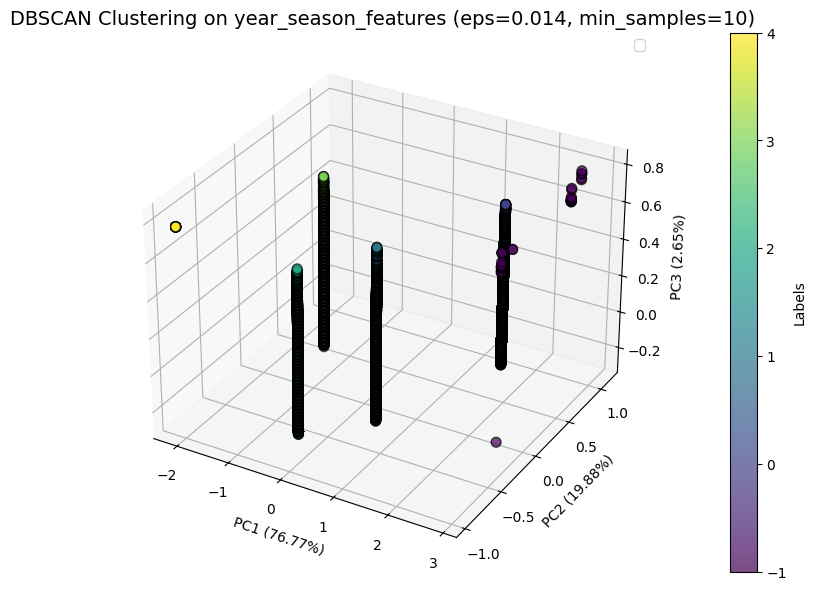

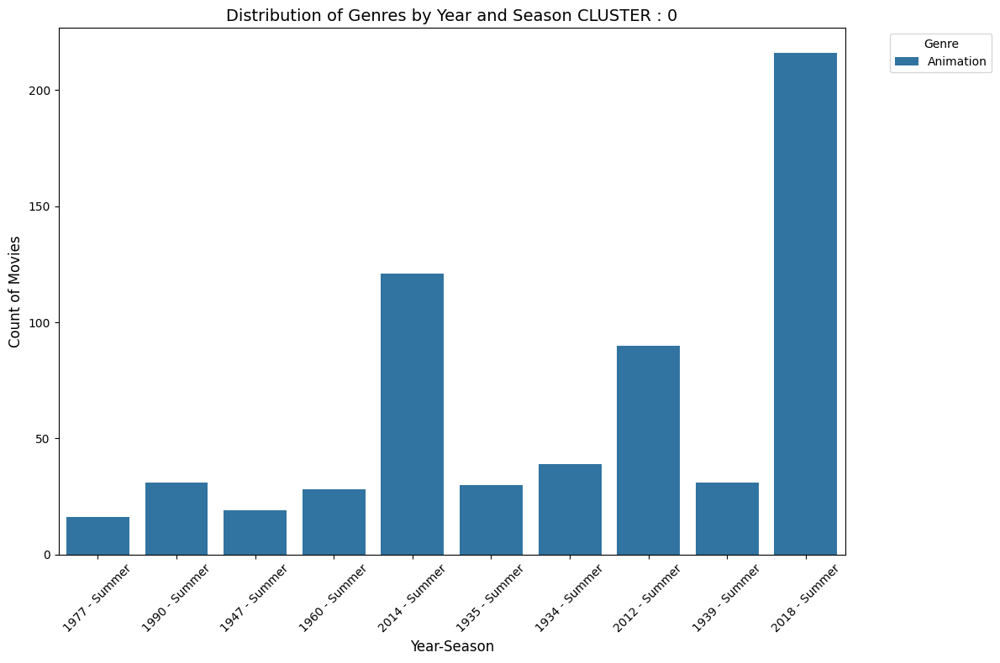

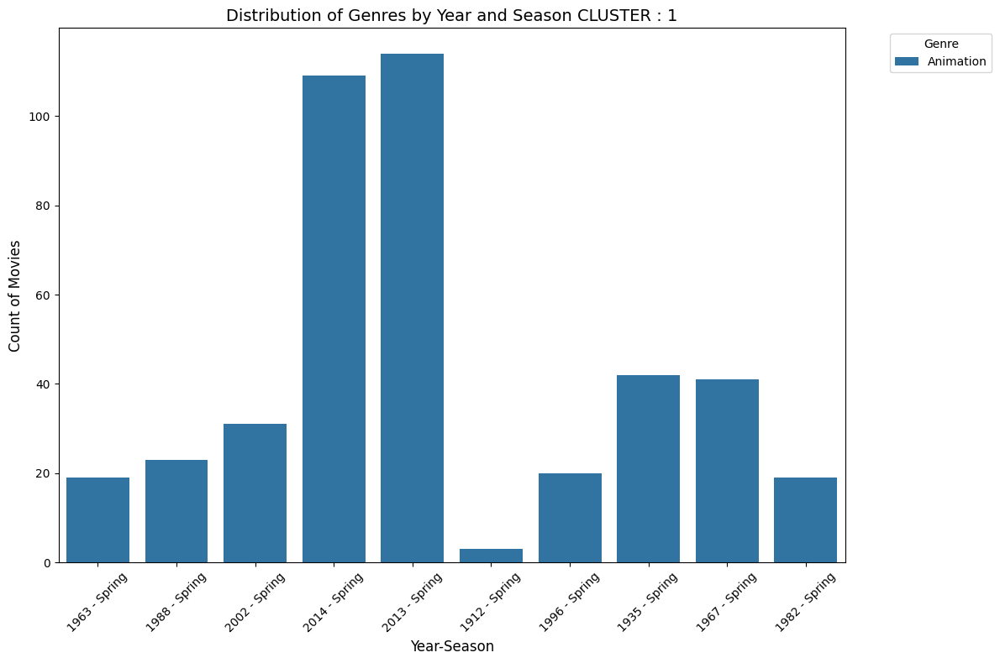

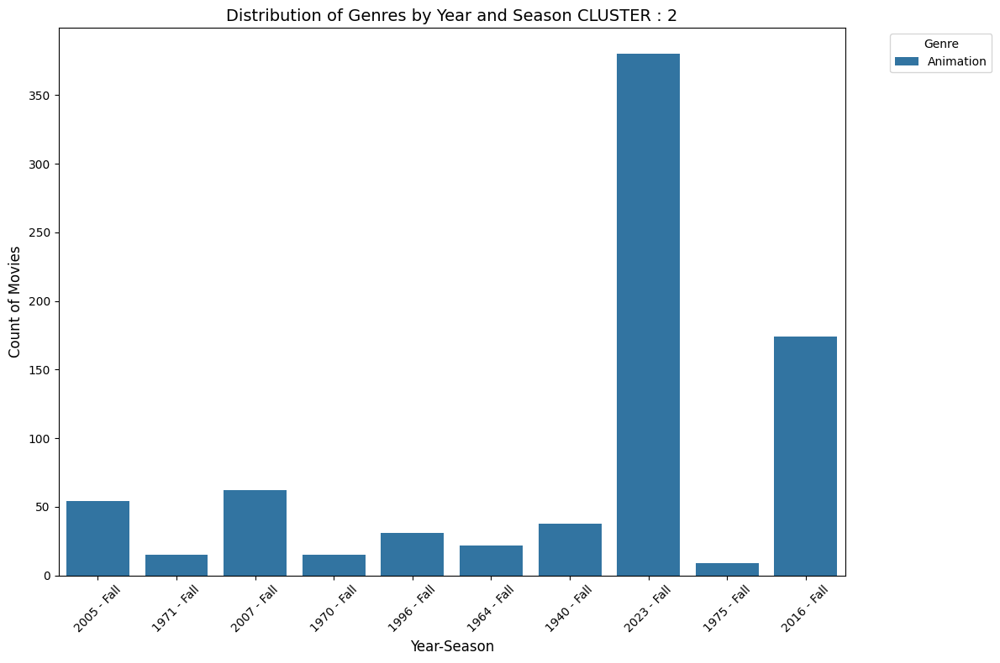

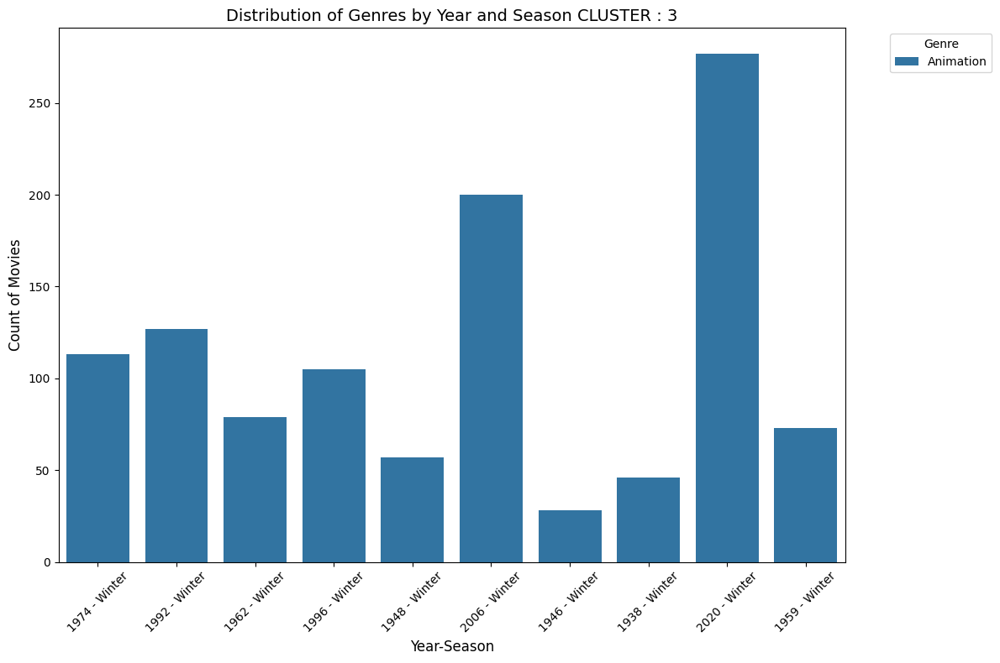

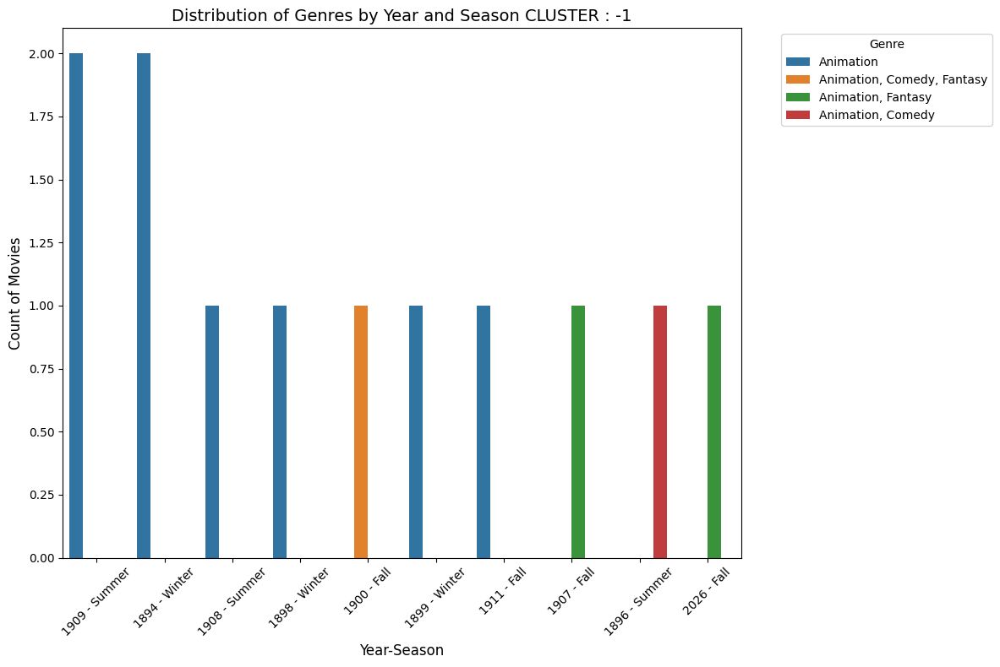

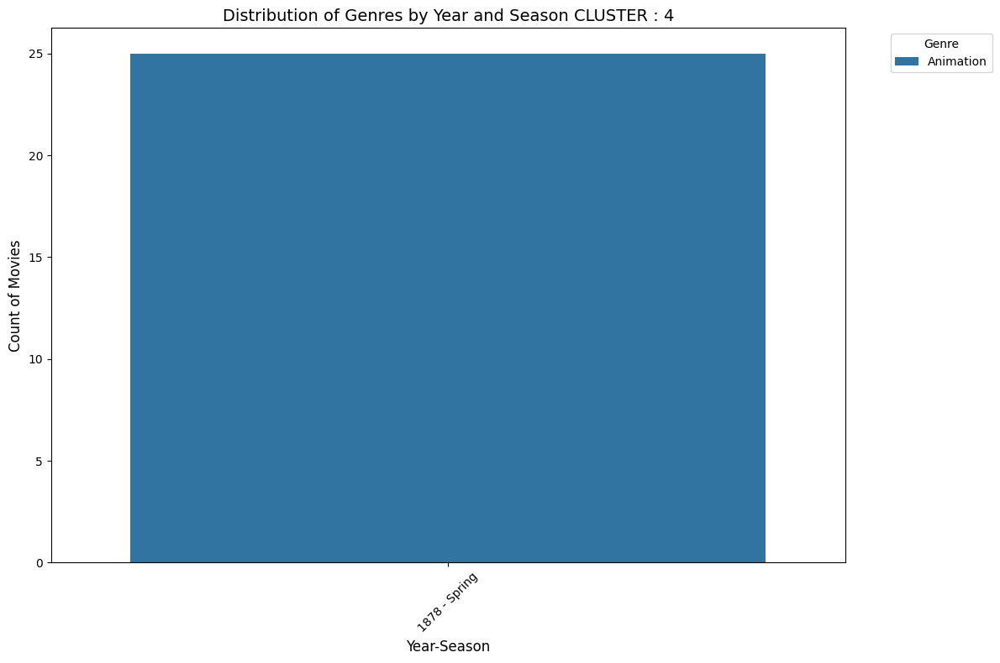

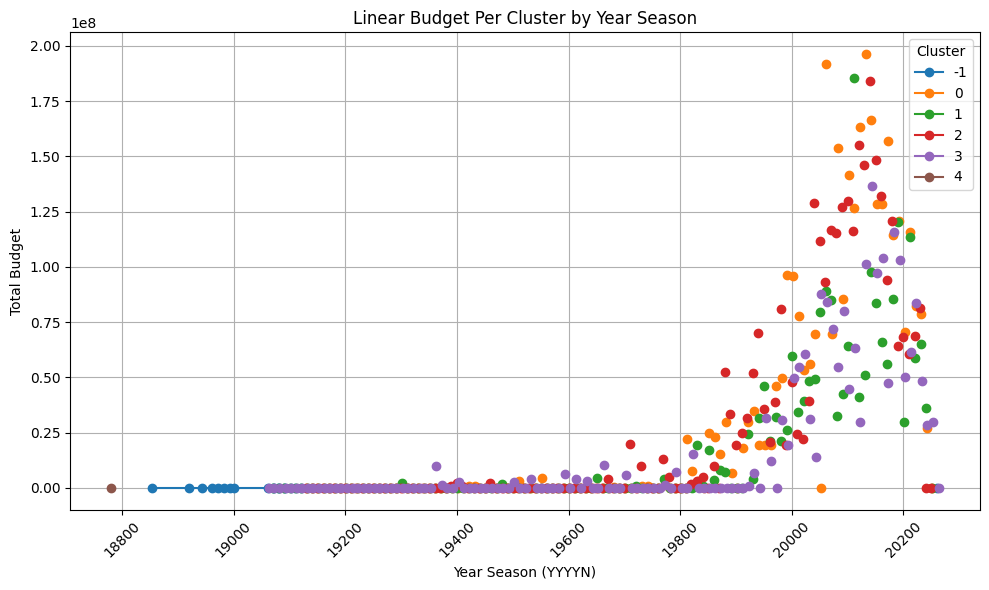

Model 'dbscan0.014' saved to 'saved_models\dbscan0.014.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
2367,Humorous Phases of Funny Faces,"Comedy, Animation",A cartoonist draws faces and figures on a blac...,No Language,Short,Spring,Spring,5.819,0.0
8113,Lightning Sketches,"Comedy, Animation",An illustrator draws some sketches at lightnin...,No Language,Short,Summer,Summer,3.800,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
46884,Poor Little Chap He Was Only Dreaming,"Animation, Comedy","When ""Snookums"" started to cry, Da-da thought ...",No Language,Short,Spring,Spring,0.000,0.0
5767,The Happy Microbes,"Comedy, Animation",A scientist has acquired a microscope and is s...,No Language,Short,Summer,Summer,4.900,0.0
21814,Road Hogs in Toyland,Animation,It's a stop-motion film of various toy cars en...,English,Short,Fall,Fall,0.000,0.0
13447,Bewitched Matches,"Fantasy, Animation",Three girls seeking to have their fortunes tol...,No Language,Short,Spring,Spring,5.000,0.0
13274,Comic Mutations,Animation,An old and learned doctor discovers the secret...,No Language,Short,Summer,Summer,5.000,0.0
1992,The Enchanted Drawing,"Animation, Comedy, Fantasy",A cartoonist defies reality when he draws obje...,No Language,Short,Fall,Fall,6.423,0.0
5010,The Puppet's Nightmare,"Comedy, Animation","A nightmare, sketched out upon a living blackb...",No Language,Short,Fall,Fall,5.800,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,-1
1672,0.116279,0.000000,1,-1
1716,0.015504,0.000000,1,-1
1992,0.062016,0.000000,1,-1
2248,0.085271,0.000000,1,-1
2365,0.023256,1.000000,0,-1
2367,0.069767,0.333333,1,-1
3329,0.007752,1.000000,0,-1
3978,0.077519,0.333333,1,-1
4984,0.054264,1.000000,0,-1


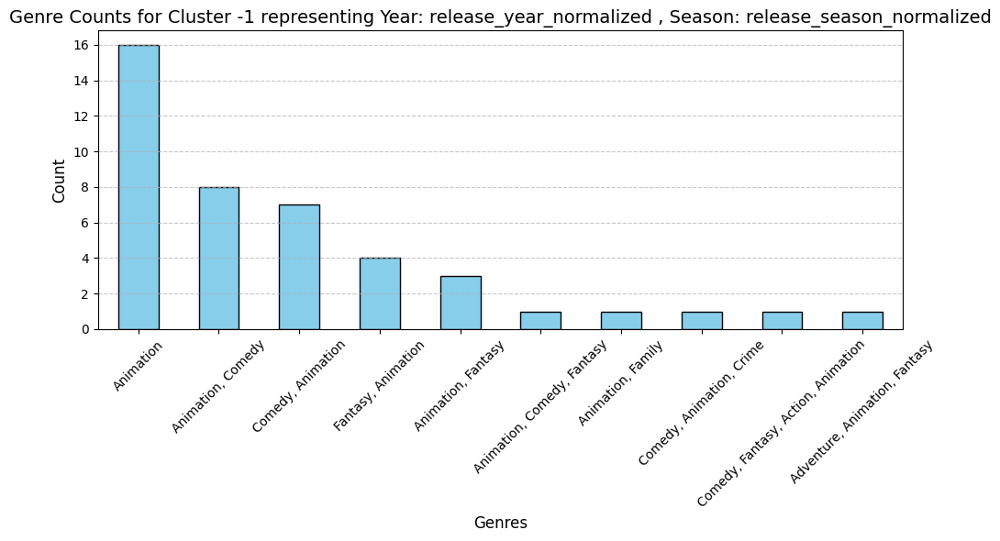


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
45938,Millennium Hour,"Animation, Fantasy","After an unknown apocalypse, our small protago...",English,Short,Summer,Summer,0.000,0.0
20890,Osobennyy,"Animation, Adventure, Family",Sashka is a normal boy from a small provincial...,Russian,Standard,Summer,Summer,1.000,22000.0
14119,Trolls: Tiny Diamond Goes Back to School,"Animation, Comedy","In this exclusive original short film, journey...",No Language,Short,Summer,Summer,7.000,0.0
7849,A Highly Committed Film,Animation,Animated short film.,Polish,Short,Summer,Summer,7.167,0.0
18950,Gunther,"Comedy, Animation",Gunther's journey to find out who he is contin...,English,Short,Summer,Summer,7.000,0.0
5718,Captain Morten and the Spider Queen,"Animation, Adventure","Morten, a ten-year-old boy, is shrunk to the s...",English,Standard,Summer,Summer,4.800,0.0
20139,Magic Wonderland,Animation,"From her island home to the North Pole, a youn...","Mandarin, English, Italian",Short,Summer,Summer,7.000,0.0
32017,越打越响,Animation,Unknown,No Language,Short,Summer,Summer,0.000,0.0
17567,A - B,Animation,A top view of the A seats. We can hear the mur...,Polish,Short,Summer,Summer,5.000,0.0
4918,Soar,"Animation, Family, Fantasy",A precocious young girl makes a new friend whe...,English,Short,Summer,Summer,6.300,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


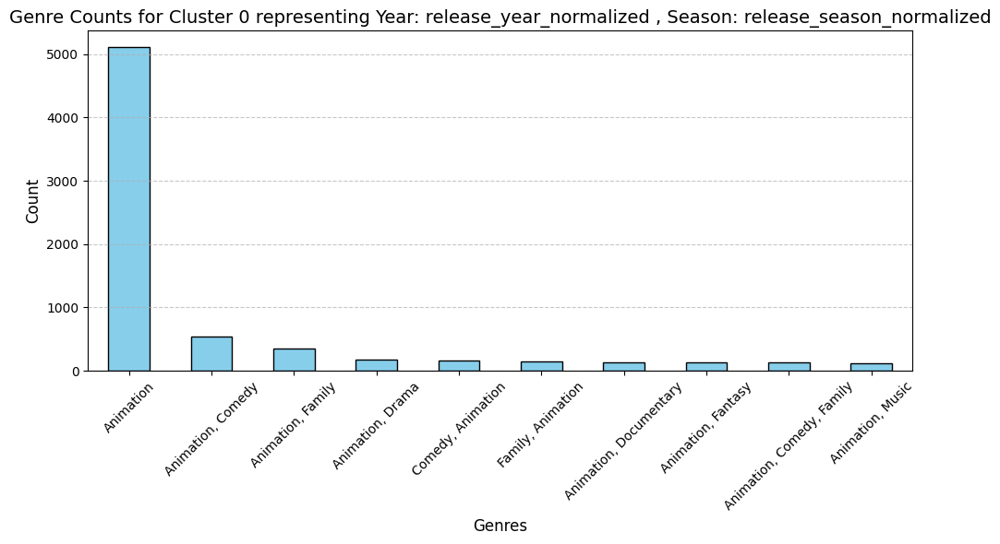


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
24826,Circo,"Comedy, Animation",A sequence of short humorous gags.,Portuguese,Short,Spring,Spring,0.000,0.0
34580,Friday the 13th,Animation,Percy the Cat informs Little Roquefort the Mou...,English,Short,Spring,Spring,0.000,0.0
3012,Princess of the Sun,Animation,"In Ancient Egypt, during the monotheistic regi...",French,Standard,Spring,Spring,6.656,0.0
13280,Prisoner of Zenda,"Animation, Adventure, Comedy",The King of Ruritania is kidnapped by his sche...,English,Standard,Spring,Spring,4.000,0.0
33129,"Fortunes, an experimental comedy","Comedy, Animation",Unknown,English,Short,Spring,Spring,0.000,0.0
44594,Camouflage,Animation,A dystopian thriller about office clerk Amouf ...,English,Short,Spring,Spring,0.000,440000.0
43812,Sex Pistols,"Comedy, Drama, Fantasy, Romance, Animation",The premise of the story is that 30% of humans...,Japanese,Standard,Spring,Spring,0.000,0.0
18116,Atmosphere Man,"Animation, Science Fiction",Unknown,Mandarin,Short,Spring,Spring,5.000,0.0
10619,Urs,"Adventure, Animation, Drama","For many years, Urs has had to look after his ...",German,Short,Spring,Spring,7.000,0.0
42372,Floyd,"Comedy, Animation",A tennis ball dreams of being a famous Wimbled...,English,Short,Spring,Spring,0.000,1000.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


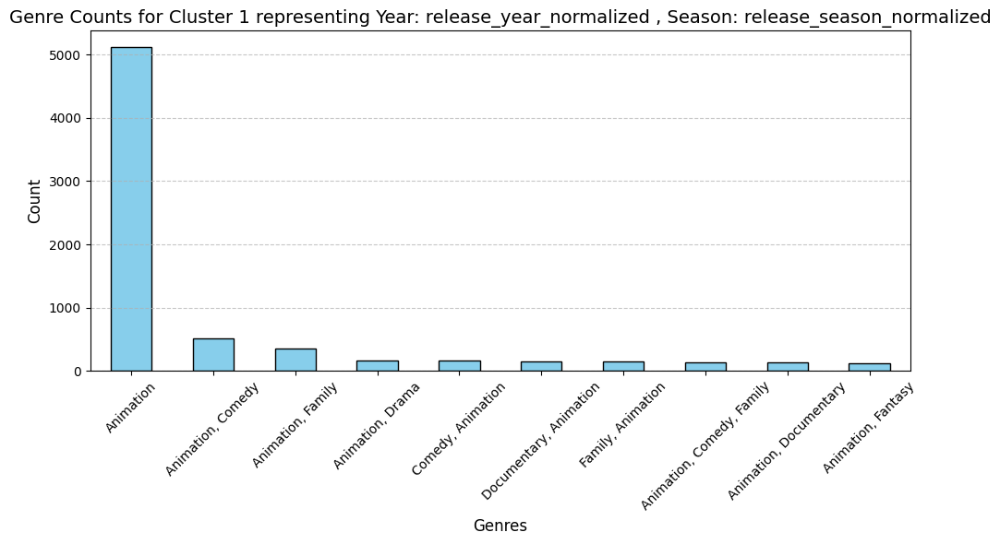


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
47738,Crypto (Animated Short),"Animation, Horror",Animated short,English,Short,Fall,Fall,0.0,0.0
14504,The Mandrake,"Animation, Fantasy","Herman, a farmer content to live out his life ...",English,Short,Fall,Fall,7.0,0.0
37907,Assembly,Animation,A flatbed editing table is snapped on. A woman...,No Language,Short,Fall,Fall,0.0,0.0
42375,Smoke's Last Thought,Animation,A wisp of smoke rises through Los Angeles whil...,No Language,Short,Fall,Fall,0.0,0.0
43529,Toriko: Jump Super Anime Tour 2009 Special,"Action, Adventure, Animation, Fantasy",Special shown at the Jump Super Anime Tour in ...,Japanese,Short,Fall,Fall,0.0,0.0
42693,Poetry reading with Gazlene Membrane in Columb...,Animation,"Part of a larger exhibition entitled ""Columbin...",No Language,Short,Fall,Fall,0.0,0.0
35285,Bomb,Animation,A container filled with explosive or incendiar...,No Language,Short,Fall,Fall,0.0,0.0
12343,Pidge,"Animation, Comedy",A suicidal pigeon contemplates existence.,English,Short,Fall,Fall,5.5,0.0
19709,Love of Kemeko,Animation,A man is continually stalked by a small woman ...,Japanese,Short,Fall,Fall,4.0,0.0
24014,Asperger a los 21,Animation,Unknown,Spanish,Short,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


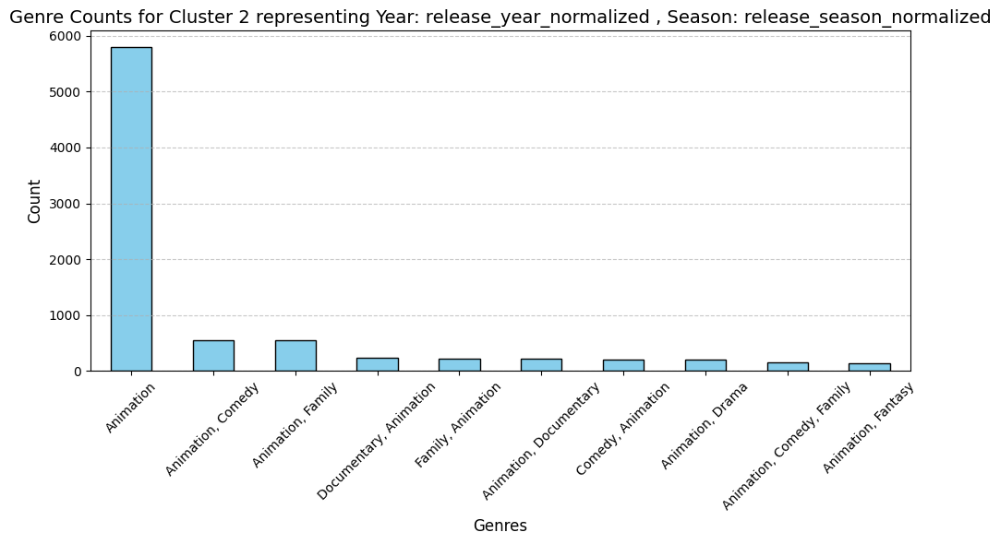


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
12529,No More Mr. Nice Guy,Animation,A claymation short that parodies 80s action fl...,English,Short,Winter,Winter,5.0,0.0
18770,Ever Been Had?,"Comedy, Animation",This cartoon from the Great War of 1914-18 isn...,English,Short,Winter,Winter,5.0,0.0
17925,D'Lírio - Lua Turquesa,Animation,Unknown,Portuguese,Short,Winter,Winter,8.0,55.0
21812,Doodlebug Circus,Animation,"Mr. Bug is at it again, romancing the pretty b...",English,Short,Winter,Winter,0.0,0.0
6425,Fake,"Animation, Crime, Mystery, Comedy, Romance",Meet Dee Laytner and his half-Japanese partner...,Japanese,Standard,Winter,Winter,5.0,0.0
18433,Fanboy,"Animation, Comedy",Two kids in superhero costumes purchase their ...,English,Short,Winter,Winter,10.0,0.0
19845,La vengeance des esprits,"Horror, Animation, Comedy",Grotesque animated spirits punish a disbelieve...,No Language,Short,Winter,Winter,4.0,0.0
39649,The Billy Goat's Whiskers,Animation,A goat annoys Farmer Al Falfa and Puddy the Pu...,English,Short,Winter,Winter,0.0,0.0
31501,Raindance,Animation,Animated short.,No Language,Short,Winter,Winter,0.0,0.0
7707,Tortilla Flaps,"Animation, Comedy",A hungry crow intrudes on a party honoring Spe...,English,Short,Winter,Winter,6.3,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


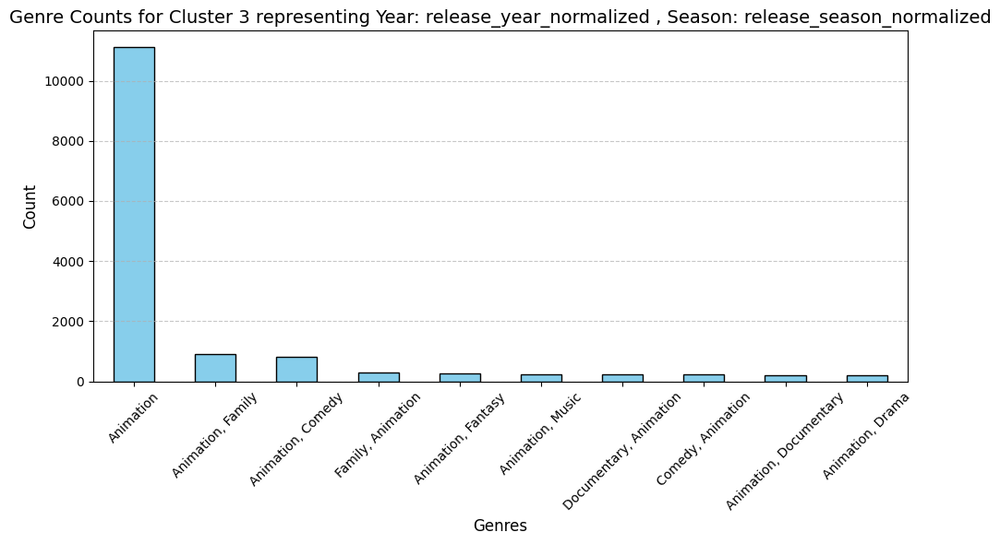


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
10366,Le circuit de l'alcool,Animation,This one is another warning to the French publ...,No Language,Short,Spring,Spring,5.500,0.0
1990,Little Nemo,"Animation, Comedy","Cartoon figures announce, via comic strip ball...",English,Short,Spring,Spring,6.273,0.0
13862,Floral Frameworks,Animation,There have been numerous studies of plants and...,No Language,Short,Spring,Spring,4.500,0.0
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.600,0.0
12281,A Peace of Coal,"Fantasy, Animation",A British trick film with stop-motion animatio...,No Language,Short,Spring,Spring,4.000,0.0
19101,The Master of a Fashionable Game,"Fantasy, Comedy, Animation",The film presents a drawing room meeting of en...,No Language,Short,Spring,Spring,3.000,0.0
13208,Petit Chantecler,Animation,Émile Cohl uses stop-motion animation to tell ...,No Language,Short,Spring,Spring,5.500,0.0
35468,Hänschens Soldaten,"Comedy, Animation",A young boy in a sailor suit plays with three ...,No Language,Short,Spring,Spring,0.000,0.0
6761,The Beautiful Leukanida,"Drama, Animation",Two insects fight over the hand of a beautiful...,No Language,Short,Spring,Spring,6.200,0.0
20582,The Strong Arm Squad of the Future,Animation,The Strong Arm Squad of the Future originated ...,No Language,Short,Spring,Spring,6.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,4
3598,0.100775,0.333333,1,4
6761,0.116279,0.333333,1,4
10366,0.116279,0.333333,1,4
12281,0.100775,0.333333,1,4
12282,0.100775,0.333333,1,4
12593,0.116279,0.333333,1,4
13208,0.100775,0.333333,1,4
13213,0.100775,0.333333,1,4
13217,0.100775,0.333333,1,4


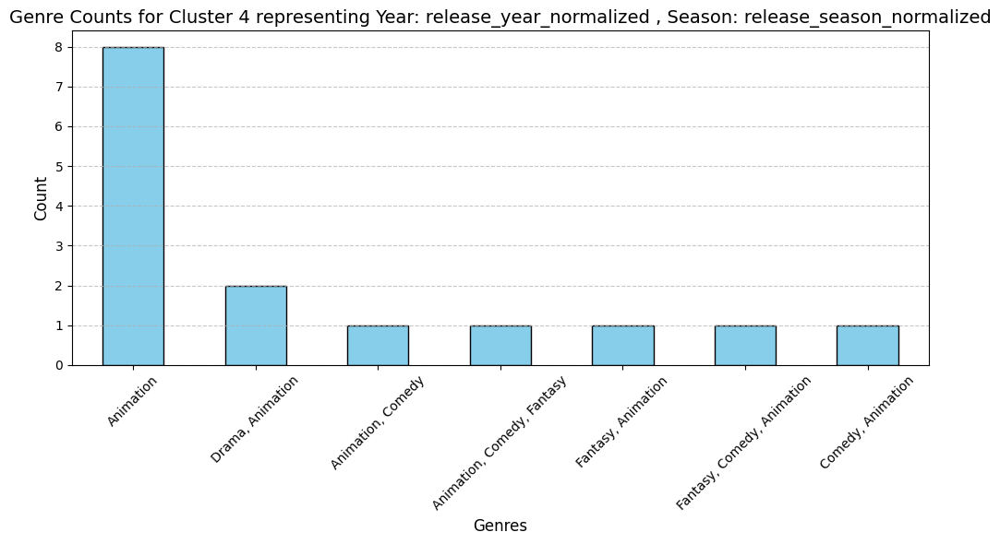


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9853,Le Jongleur,Animation,Praxinoscope animation of a juggler balancing ...,No Language,Short,Spring,Spring,4.250,0.0
9772,Le Steeple-chase,Animation,Praxinoscope animation of an equestrian riding...,No Language,Short,Spring,Spring,4.250,0.0
11786,Les Scieurs de Long,Animation,Praxinoscope animation of two workers sawing w...,No Language,Short,Spring,Spring,2.333,0.0
9866,Les Chiens Savants,Animation,Praxinoscope animation of a boy holding a hoop...,No Language,Short,Spring,Spring,4.500,0.0
9757,La Charmeuse,Animation,Praxinoscope animation of a girl charming a fl...,No Language,Short,Spring,Spring,5.000,0.0
9770,La Nageuse,Animation,Praxinoscope animation of a swimmer. Series 2...,No Language,Short,Spring,Spring,3.750,0.0
9857,Les Bulles de Savon,Animation,Praxinoscope animation of a girl in a blue dre...,No Language,Short,Spring,Spring,4.750,0.0
9759,Le Fumeur,Animation,Praxinoscope animation of a man sitting backwa...,No Language,Short,Spring,Spring,4.250,0.0
8487,Dancing on the Rope,Animation,Early Praxinoscope strip showing a girl dancin...,No Language,Short,Spring,Spring,4.200,0.0
4592,The Magic Rosette,Animation,Praxinoscope strip of a shifting rosette. Seri...,No Language,Short,Spring,Spring,5.583,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,5
4592,0.0,0.333333,1,5
7015,0.0,0.333333,1,5
7018,0.0,0.333333,1,5
8487,0.0,0.333333,1,5
8508,0.0,0.333333,1,5
9755,0.0,0.333333,1,5
9756,0.0,0.333333,1,5
9757,0.0,0.333333,1,5
9758,0.0,0.333333,1,5


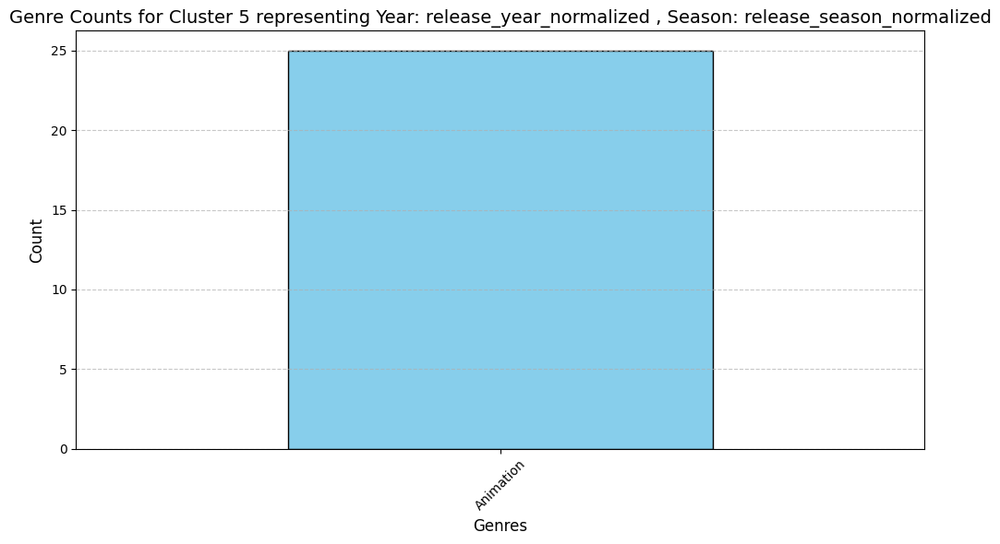


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
39422,Urban Science: To Demonstrate How Spiders Fly,"Animation, Documentary",This charming short film is surprisingly techn...,"No Language, English",Short,Spring,Spring,0.0,0.0
9861,Japanese Fantasy,"Animation, Fantasy",This subject presents a remarkably clever seri...,No Language,Short,Spring,Spring,4.5,0.0
7457,The Chinese Shadows,"Comedy, Animation",At the beginning of this film two women come o...,No Language,Short,Spring,Spring,5.0,0.0
10676,Matrimonial Shoes,Animation,A film about cupid shoes by Émile Cohl.,No Language,Short,Spring,Spring,5.8,0.0
13273,Monsieur Clown Among the Lilliputians,Animation,Stop-motion film from Émile Cohl has a clown w...,No Language,Short,Spring,Spring,4.5,0.0
5753,Spanish Clair de Lune,"Romance, Drama, Fantasy, Animation, Comedy",Two lovers perform a fandango dance. A jealous...,No Language,Short,Spring,Spring,5.7,0.0
11692,The Sculptor's Nightmare,"Comedy, Animation","At a political club, the members debate whose ...",English,Short,Spring,Spring,5.0,0.0
35104,In the Land of Nod,Animation,Children play with their toys while Grandpa do...,English,Short,Spring,Spring,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
5753,0.093023,0.333333,1,6
7457,0.085271,0.333333,1,6
9861,0.093023,0.333333,1,6
10676,0.093023,0.333333,1,6
11692,0.085271,0.333333,1,6
13273,0.093023,0.333333,1,6
35104,0.085271,0.333333,1,6
39422,0.093023,0.333333,1,6


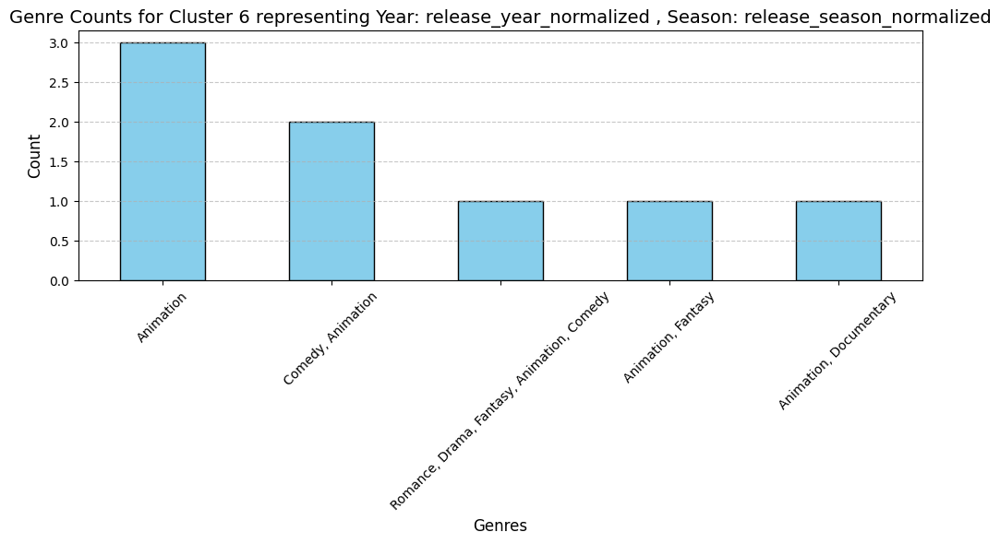

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.014, min_samples=15 | Silhouette Score: 0.781, DB Index: 0.754 ,clusters : 8
Plot Title: DBSCAN Clustering on year_season_features (eps=0.014, min_samples=15)
Explained Variance Ratios (3 Components): [0.76842611 0.19820121 0.02637202]
Total Explained Variance: 0.9929993469064003


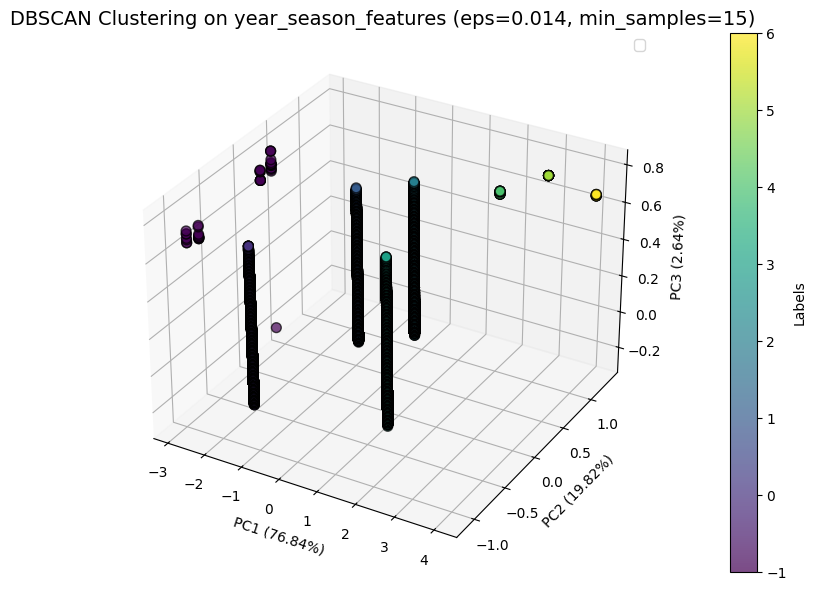

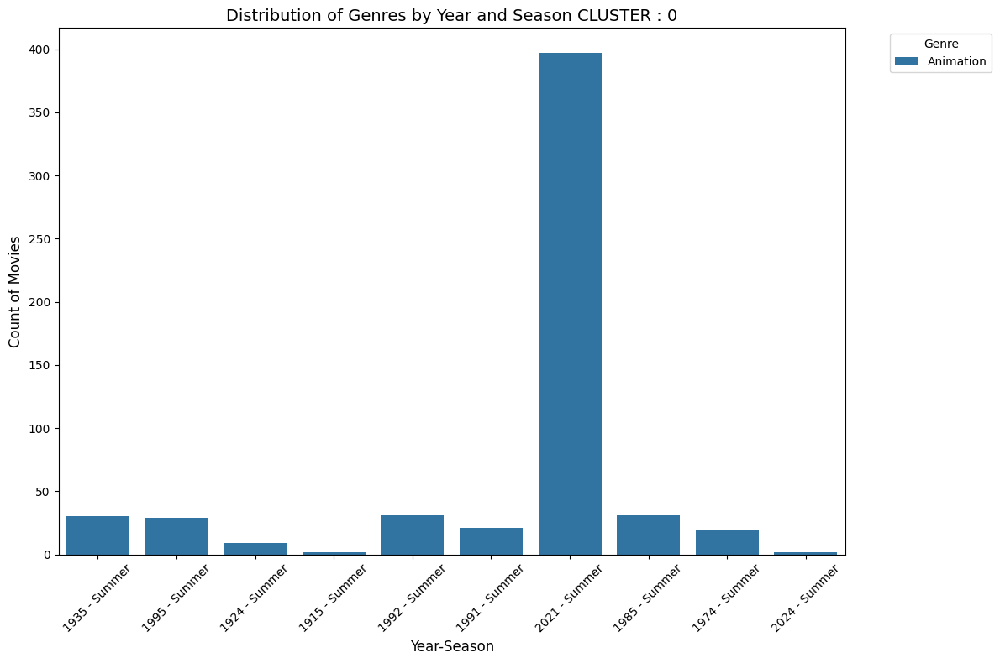

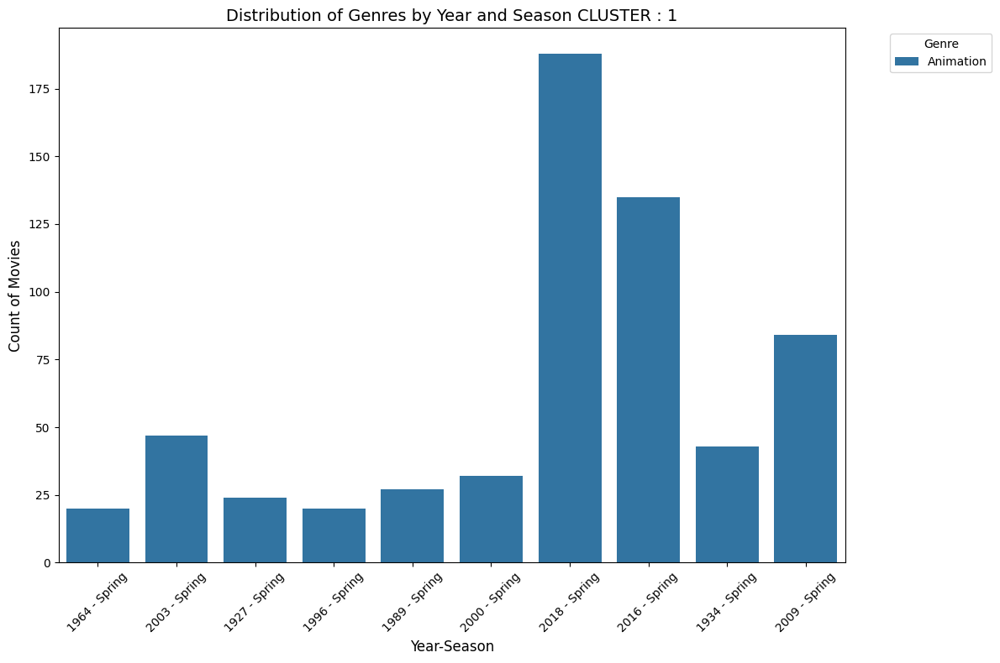

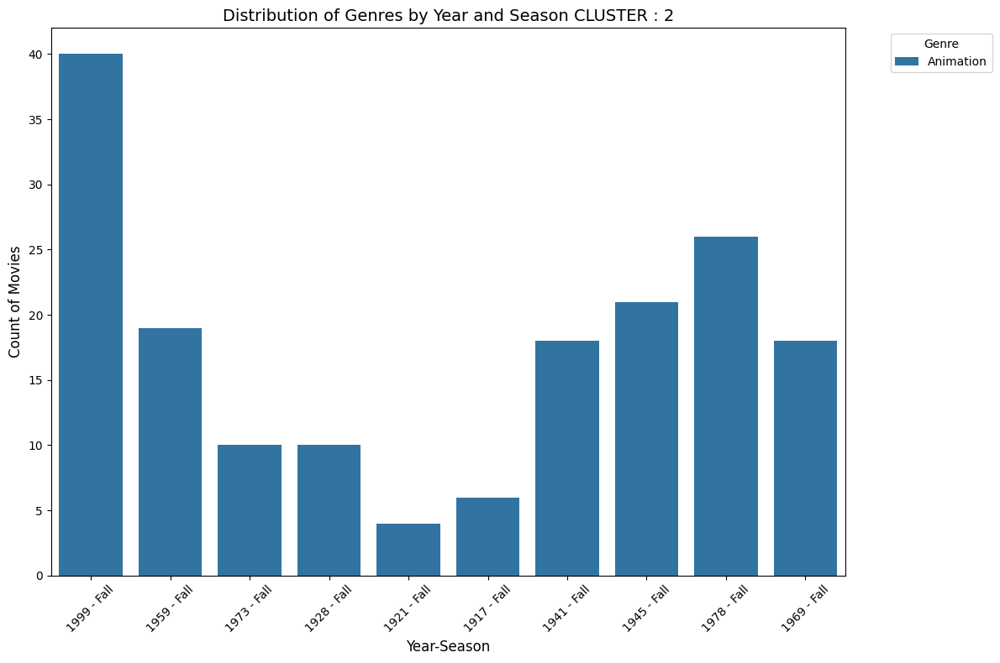

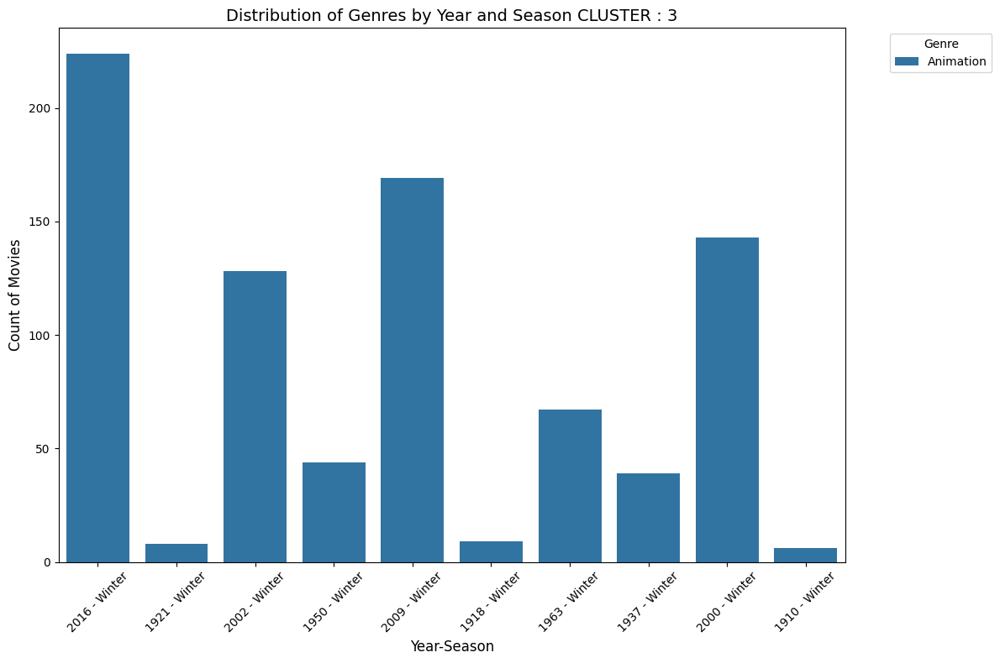

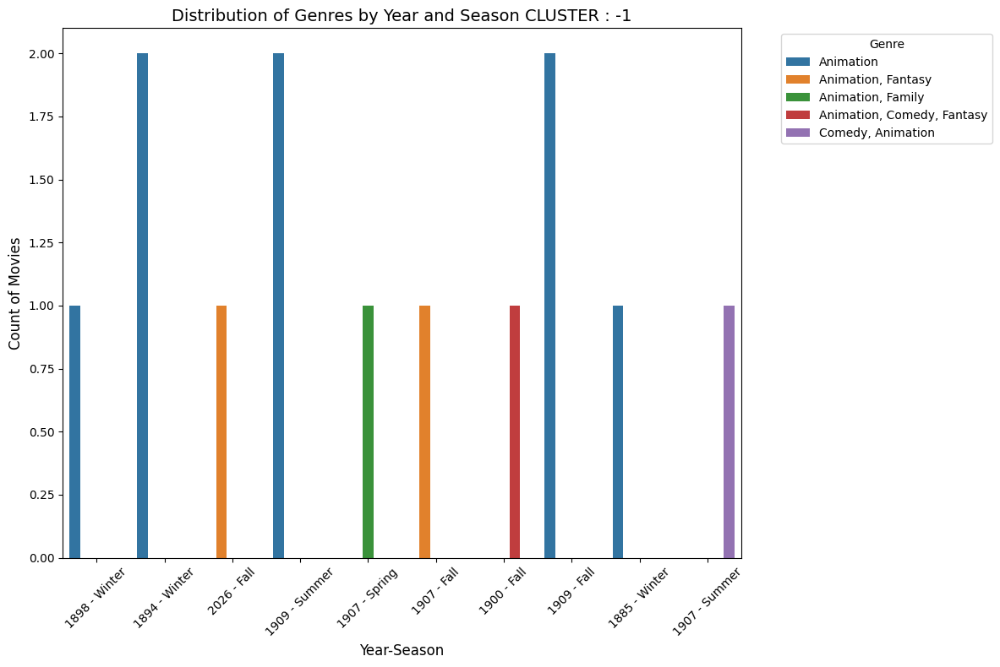

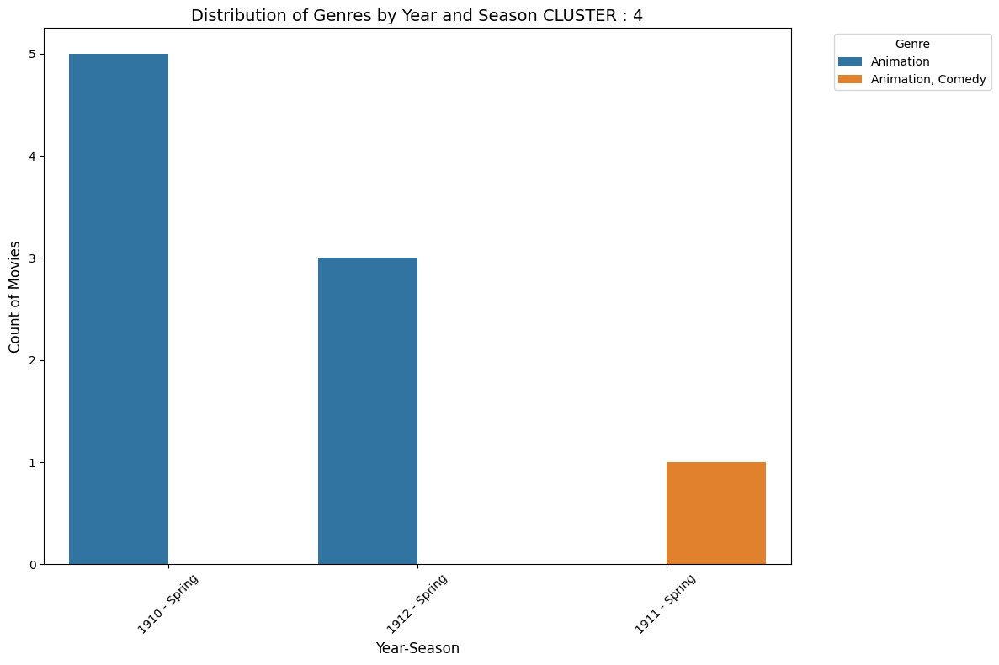

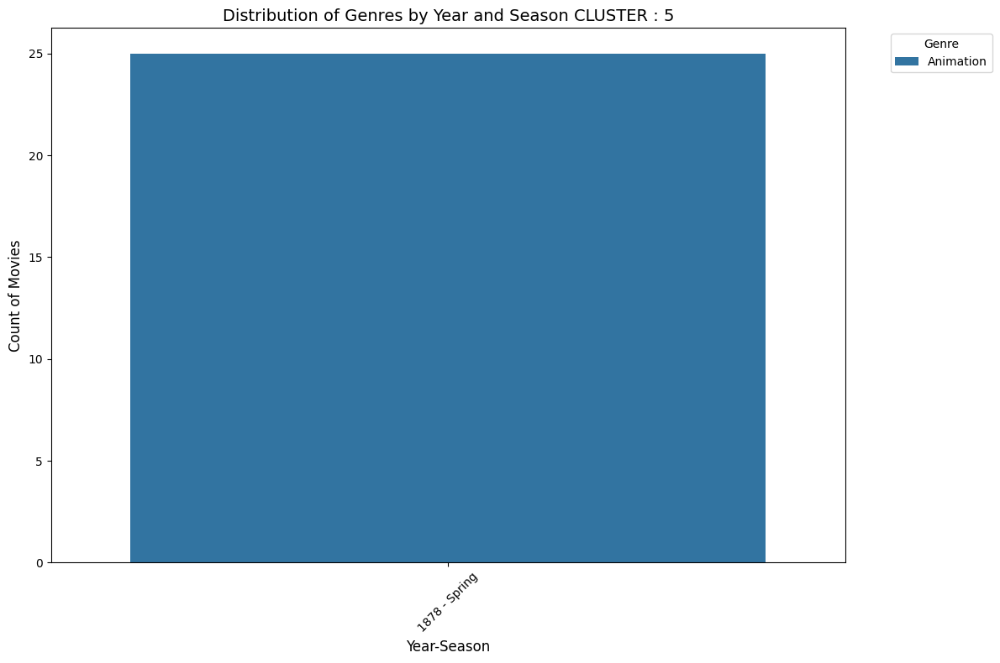

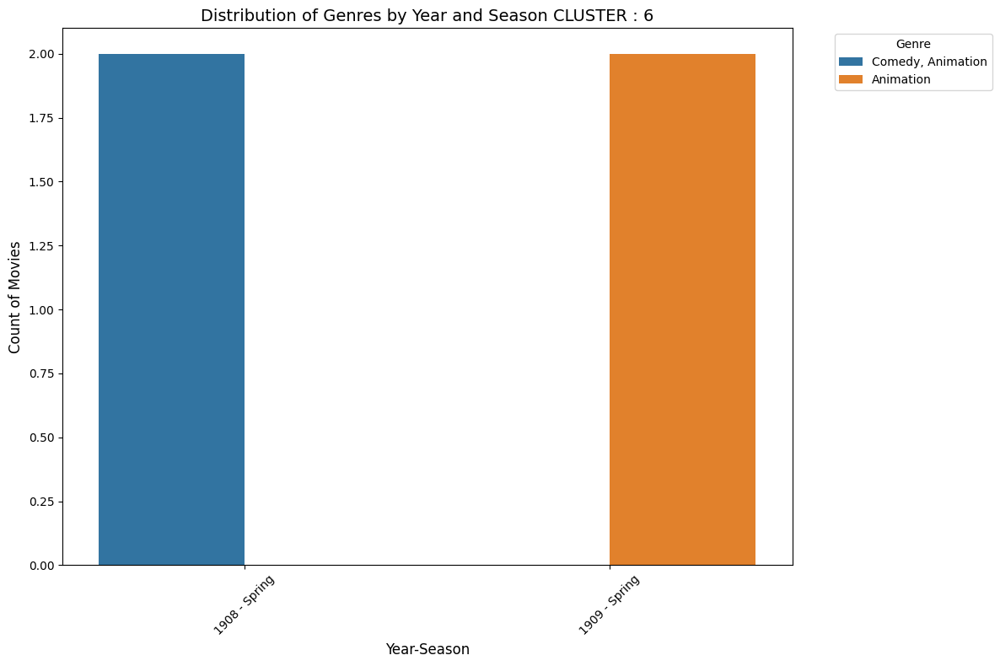

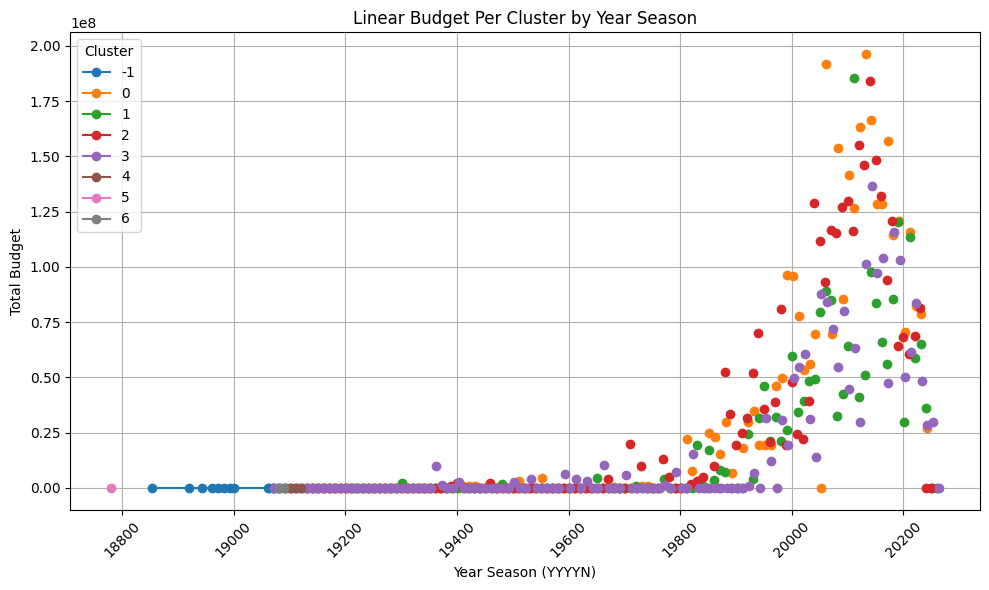

Model 'dbscan0.2' saved to 'saved_models\dbscan0.2.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
22645,Untitled Fire Lord Zuko Project,"Animation, Fantasy",A spin-off of the animated series Avatar: The ...,No Language,Short,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
22645,1.0,0.0,1,-1


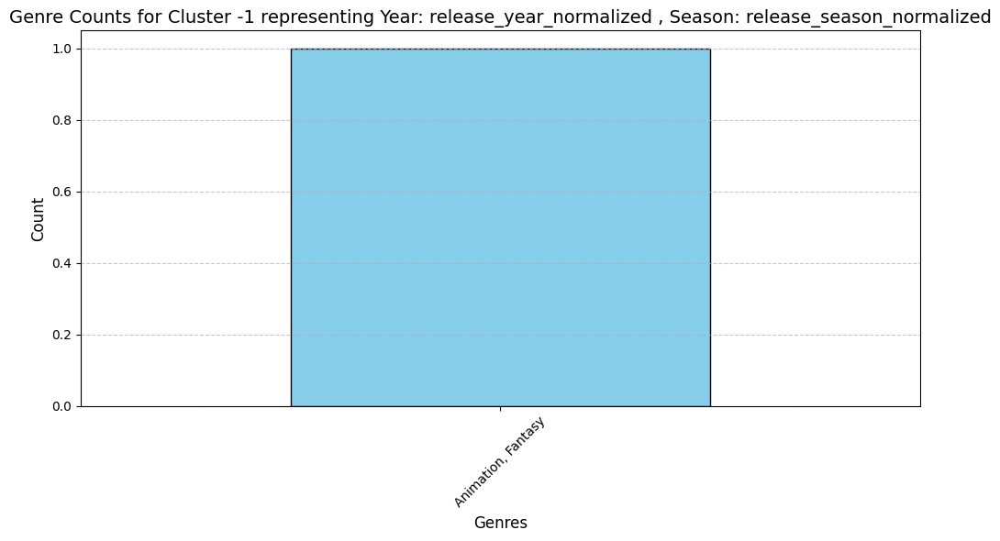


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
8064,The Autobots,"Animation, Adventure, Family, Science Fiction",Unknown,Mandarin,Standard,Summer,Summer,4.000,0.0
32891,The Apology of Albert Batch,Animation,"A cabaret puppet play in a suitcase, as an epi...",English,Short,Summer,Summer,0.000,20000.0
9670,Springtime,Animation,"In this one, Farmer Al Falfa and Henry the Cat...",English,Short,Summer,Summer,8.800,0.0
88,Lilo & Stitch,"Animation, Family","As Stitch, a runaway genetic experiment from a...",English,Standard,Summer,Summer,7.516,19546842.5
27420,Naked Island – Detention,Animation,This ultra-short film proves that walls are re...,English,Short,Summer,Summer,0.000,0.0
18993,A Tangled Tale,Animation,"In this unusual romance, hand-tinted sand beco...",No Language,Short,Summer,Summer,3.000,0.0
14243,Beetle + Bean,Animation,When a small Bean challenges the mighty warrio...,English,Short,Summer,Summer,5.500,0.0
33187,Rest in Piece,Animation,Midyan decides to run away from his war-torn h...,French,Short,Summer,Summer,0.000,0.0
39132,The Astonishing Work of Tezuka Osamu,Animation,Known as the god of manga and the father of an...,No Language,Short,Summer,Summer,0.000,0.0
37544,La Sagra,Animation,"During a train journey, a man remembers the im...",No Language,Short,Summer,Summer,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


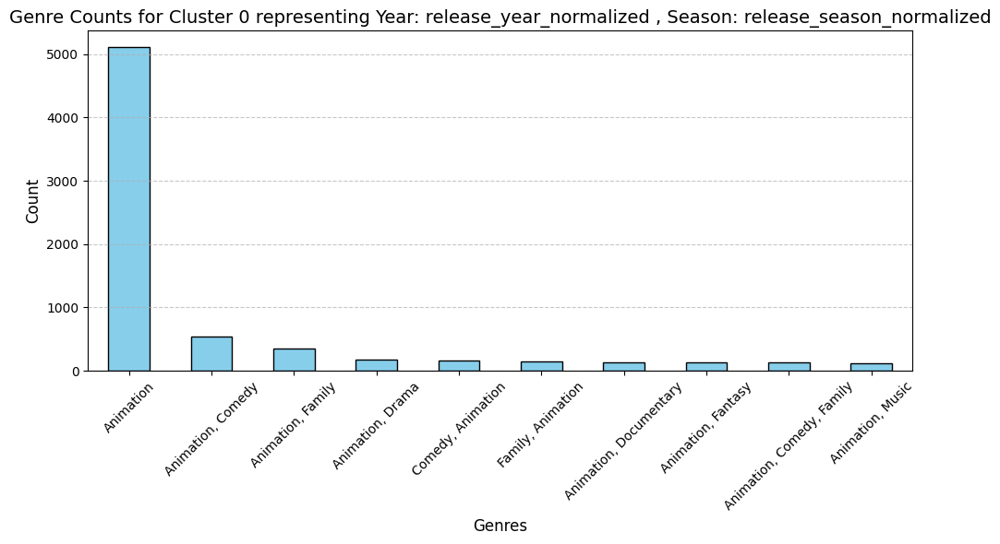


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
42834,Danceplay,"Animation, Music",Traditional moral values and contemporary anim...,No Language,Short,Spring,Spring,0.0,0.0
19275,Mickey Mouse Clubhouse: I Heart Minnie,Animation,"Join Minnie, Daisy and all your Clubhouse pals...","English, Portuguese",Short,Spring,Spring,10.0,0.0
37199,South Forest,Animation,The story about a Palestinian girl who feeds a...,No Language,Short,Spring,Spring,0.0,0.0
33168,Escape,Animation,A film that was originally made for an english...,English,Short,Spring,Spring,0.0,0.0
42369,Tiger and Ox,"Documentary, Animation","In Korean society, divorce and families withou...",Korean,Short,Spring,Spring,0.0,0.0
28111,Rat Snacks,"Comedy, Animation",Follow Brian in his daring quest to overcome h...,English,Short,Spring,Spring,0.0,0.0
29665,Gossamer,Animation,This film was a category nominee at the 2018 A...,No Language,Short,Spring,Spring,0.0,0.0
7693,Fast Buck Duck,"Animation, Comedy, Family",Daffy Duck reads in the local newspaper that a...,English,Short,Spring,Spring,6.2,0.0
18837,Krummel - Billy de bengelbij,"Adventure, Family, Animation",Unknown,Dutch,Short,Spring,Spring,10.0,0.0
38439,The First Swallow,"Animation, Family","The story of a single swallow who, taking a re...",English,Short,Spring,Spring,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


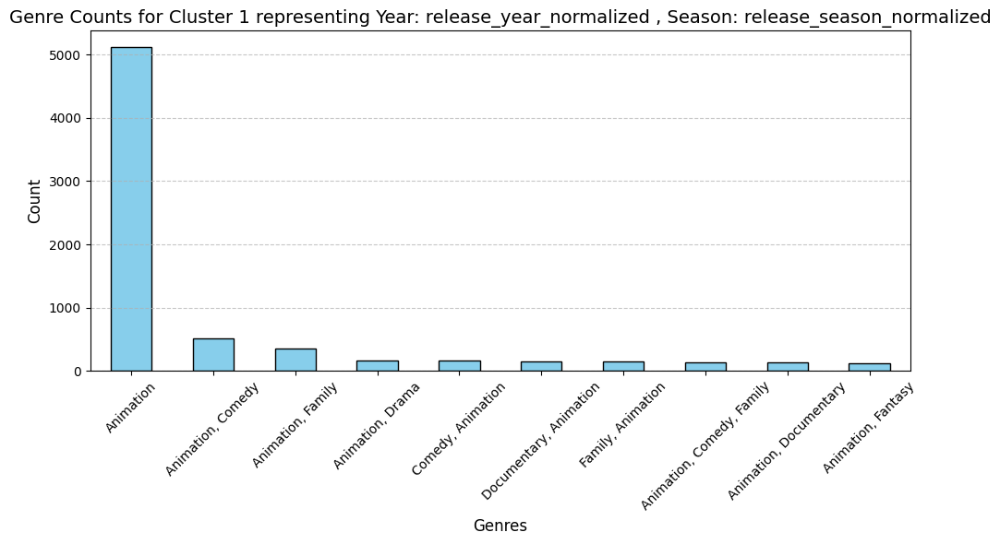


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
47478,İstanbul Muhafızları: Ab-ı Hayat Çesmesi,"Animation, Action, Adventure",Unknown,Turkish,Short,Fall,Fall,0.0,0.0
35969,Cyber,Animation,A short trip on an easychair.,German,Short,Fall,Fall,0.0,0.0
35919,Chateau/Poyet,Animation,The scene is set in front of a French chateau....,No Language,Short,Fall,Fall,0.0,0.0
37775,Heaven’s Countryland - Part 2 of the Death Of ...,Animation,Written + Directed by David OReilly for Adult ...,Korean,Short,Fall,Fall,0.0,0.0
15564,Girl Detective Club,"Comedy, Action, Animation",Our heroine has been kidnapped and her two som...,Japanese,Short,Fall,Fall,1.0,0.0
5967,My Little Pony,"Animation, Fantasy, TV Movie",The story begins as the peaceful ponies of Dre...,English,Short,Fall,Fall,7.0,0.0
4106,Bugs in Love,Animation,Insects have made a playground/carnival out of...,No Language,Short,Fall,Fall,5.4,15927.0
42097,The Other Side,Animation,Unknown,Czech,Short,Fall,Fall,0.0,0.0
45517,Fly With Von Drake,"Animation, Comedy, Adventure",Ludwig Von Drake covers the history of aviatio...,English,Standard,Fall,Fall,0.0,0.0
14309,Scars,"Documentary, Animation",Alex Anna’s body is a canvas: her scars come t...,French,Short,Fall,Fall,8.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


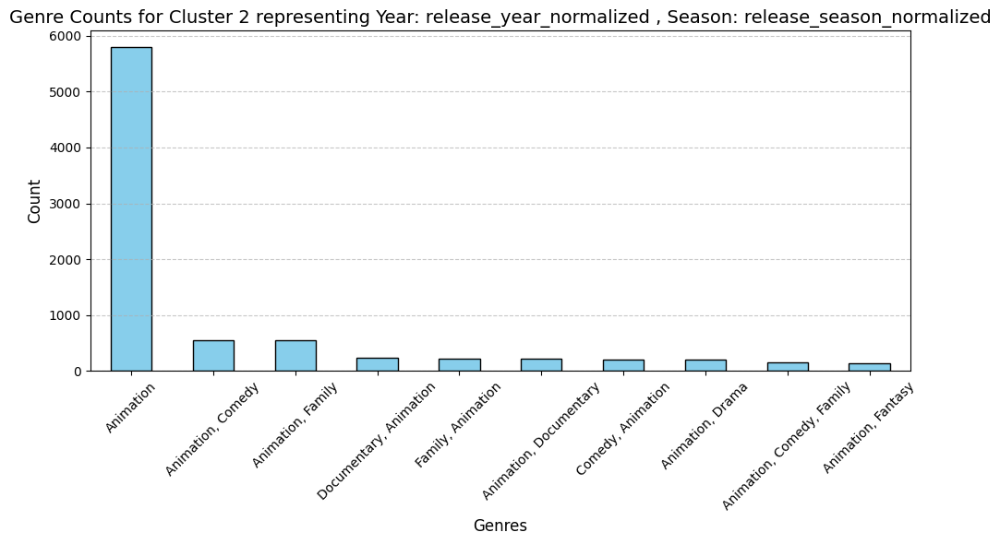


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
25660,Science Please! : Battery,Animation,"A clip in the Science Please! collection, Batt...",English,Short,Winter,Winter,0.000,0.0
14949,Secrets de lac,Animation,Unknown,French,Short,Winter,Winter,7.000,0.0
42225,Stakes,Animation,A wild ironization and deconstruction of the o...,Russian,Short,Winter,Winter,0.000,0.0
43015,in our skin,Animation,In our skin is a film about the beauty of the ...,English,Short,Winter,Winter,0.000,0.0
1161,Hunter x Hunter: Phantom Rouge,"Animation, Adventure, Fantasy, Action","Gon, Killua, Kurapika and Leorio reunite to fa...",Japanese,Short,Winter,Winter,7.117,0.0
46879,The Lion and the Gnat,"Animation, Fantasy",A fable from La Fontaine.,French,Short,Winter,Winter,0.000,0.0
12786,Skylight,Animation,A mock educational film demonstrates the threa...,No Language,Short,Winter,Winter,6.000,0.0
49478,Daddy Cool,Animation,A father goes on a treck with his loved children.,French,Short,Winter,Winter,0.000,0.0
39416,The House-Cat (Felis Vulgaris),Animation,The common house-cat's imagination exceeds rea...,English,Short,Winter,Winter,0.000,0.0
25249,Hyena,Animation,Three men are lost in Africa. Because of the h...,No Language,Short,Winter,Winter,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


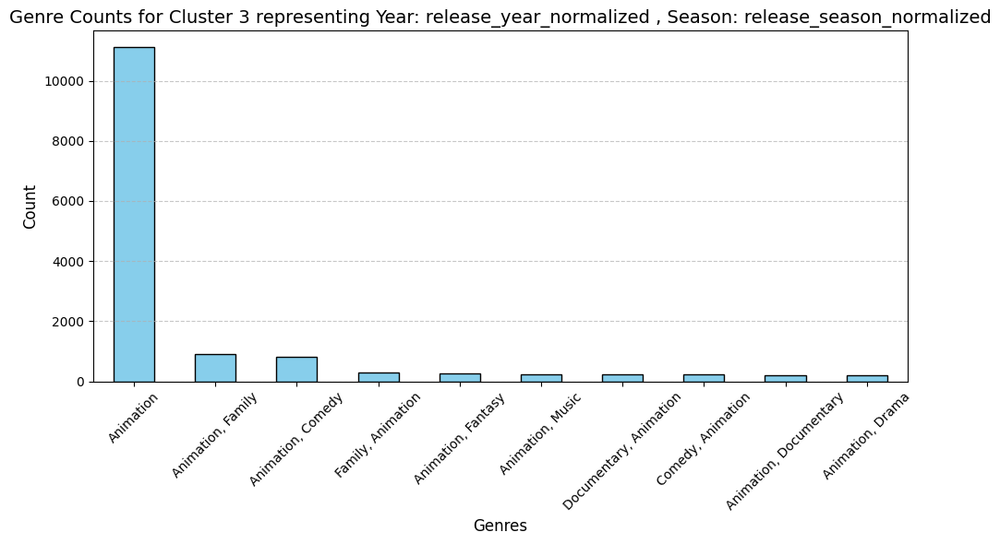


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
14428,Le premier cigare,Animation,Unknown,No Language,Short,Summer,Summer,4.500,0.0
1486,Fantasmagorie,Animation,"An animated film by French auteur Émile Cohl, ...",No Language,Short,Summer,Summer,6.611,0.0
13272,The Four Little Tailors,"Romance, Fantasy, Comedy, Animation","The opening scene is in a tailor's shop, showi...",No Language,Short,Summer,Summer,4.000,0.0
14682,Tale of the Ark,"Fantasy, Animation","A child dreams of the Bible tale, reenacted by...",No Language,Short,Summer,Summer,4.500,0.0
13274,Comic Mutations,Animation,An old and learned doctor discovers the secret...,No Language,Short,Summer,Summer,5.000,0.0
13271,Petit Faust,"Animation, Fantasy",The various parts of Faust are played by puppets.,No Language,Short,Summer,Summer,5.500,0.0
8113,Lightning Sketches,"Comedy, Animation",An illustrator draws some sketches at lightnin...,No Language,Short,Summer,Summer,3.800,0.0
9418,The Twelve Labors of Hercules,"Adventure, Animation, Fantasy",A cut-out animation depicting the Twelve Labou...,No Language,Short,Summer,Summer,5.800,0.0
5767,The Happy Microbes,"Comedy, Animation",A scientist has acquired a microscope and is s...,No Language,Short,Summer,Summer,4.900,0.0
10898,Guillaume Tell,"Animation, Comedy",Unknown,No Language,Short,Summer,Summer,5.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,4
5767,0.093023,0.666667,0,4
8113,0.077519,0.666667,0,4
9418,0.100775,0.666667,0,4
10898,0.031008,0.666667,0,4
13271,0.100775,0.666667,0,4
13272,0.100775,0.666667,0,4
13274,0.093023,0.666667,0,4
14428,0.038760,0.666667,0,4
14628,0.093023,0.666667,0,4


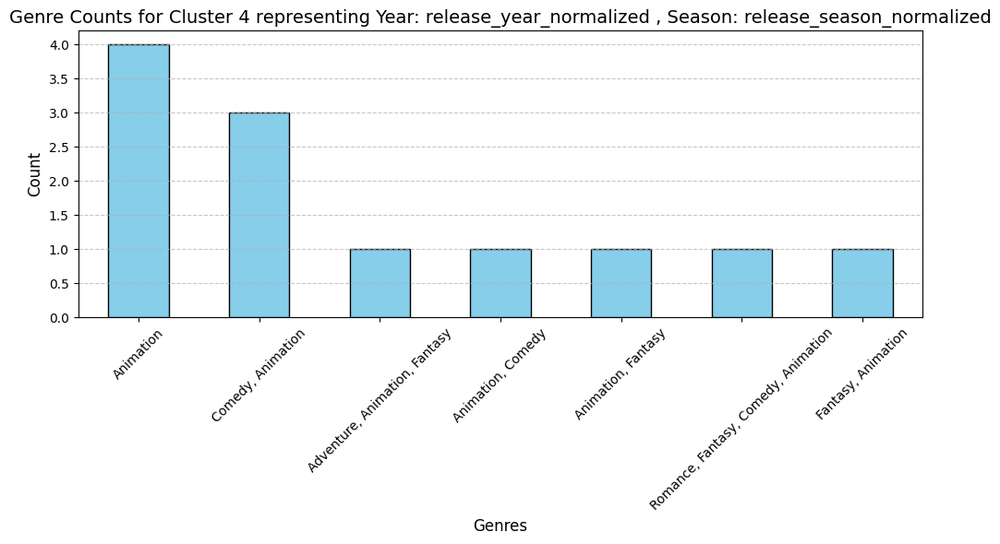


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
6767,A Good Beer,Animation,Unknown,No Language,Short,Fall,Fall,4.000,0.0
21814,Road Hogs in Toyland,Animation,It's a stop-motion film of various toy cars en...,English,Short,Fall,Fall,0.000,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.400,0.0
19961,Rosalie and Her Phonograph,"Fantasy, Comedy, Animation",A jolly housekeeper brings new meaning to the ...,French,Short,Fall,Fall,4.000,0.0
46889,He Loves to Be Amused,"Animation, Comedy",Papa Newlywed and his lovely wife looked up at...,No Language,Short,Fall,Fall,0.000,0.0
5010,The Puppet's Nightmare,"Comedy, Animation","A nightmare, sketched out upon a living blackb...",No Language,Short,Fall,Fall,5.800,0.0
12679,The Sorcerer's Scissors,"Animation, Fantasy","A mix of spectacle, animation and dance, the f...",No Language,Short,Fall,Fall,7.000,0.0
5138,Drama at the Puppets' House,"Comedy, Animation, Crime",For a short comedy of rare merit this subject ...,No Language,Short,Fall,Fall,6.200,0.0
1716,Poor Pierrot,"Comedy, Animation","One night, Arlequin comes to see his lover Col...",French,Short,Fall,Fall,6.029,0.0
17842,Animated Cotton,Animation,It might not take you long to cotton on to the...,No Language,Short,Fall,Fall,4.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.0,1,5
1716,0.015504,0.0,1,5
1992,0.062016,0.0,1,5
2248,0.085271,0.0,1,5
5010,0.085271,0.0,1,5
5138,0.085271,0.0,1,5
6252,0.015504,0.0,1,5
6767,0.015504,0.0,1,5
6830,0.093023,0.0,1,5
8477,0.085271,0.0,1,5


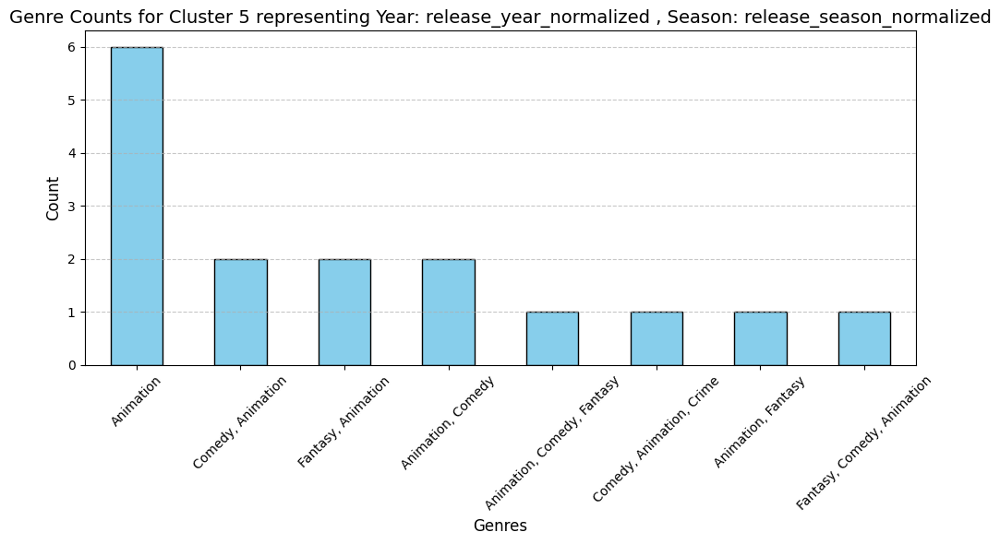


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.6,0.0
20552,"Petites causes, grands effets!","Drama, Animation",French animation from O'Galop is a pretty inte...,No Language,Short,Spring,Spring,4.0,0.0
12281,A Peace of Coal,"Fantasy, Animation",A British trick film with stop-motion animatio...,No Language,Short,Spring,Spring,4.0,0.0
13208,Petit Chantecler,Animation,Émile Cohl uses stop-motion animation to tell ...,No Language,Short,Spring,Spring,5.5,0.0
19101,The Master of a Fashionable Game,"Fantasy, Comedy, Animation",The film presents a drawing room meeting of en...,No Language,Short,Spring,Spring,3.0,0.0
12593,Les Métamorphoses Comiques,Animation,An animation where real life objects turn into...,French,Short,Spring,Spring,5.5,0.0
12282,The Neo-Impressionist Painter,Animation,A painter is seen in his studio with his model...,No Language,Short,Spring,Spring,5.5,0.0
13862,Floral Frameworks,Animation,There have been numerous studies of plants and...,No Language,Short,Spring,Spring,4.5,0.0
10366,Le circuit de l'alcool,Animation,This one is another warning to the French publ...,No Language,Short,Spring,Spring,5.5,0.0
6761,The Beautiful Leukanida,"Drama, Animation",Two insects fight over the hand of a beautiful...,No Language,Short,Spring,Spring,6.2,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,6
3598,0.100775,0.333333,1,6
6761,0.116279,0.333333,1,6
10366,0.116279,0.333333,1,6
12281,0.100775,0.333333,1,6
12282,0.100775,0.333333,1,6
12593,0.116279,0.333333,1,6
13208,0.100775,0.333333,1,6
13213,0.100775,0.333333,1,6
13217,0.100775,0.333333,1,6


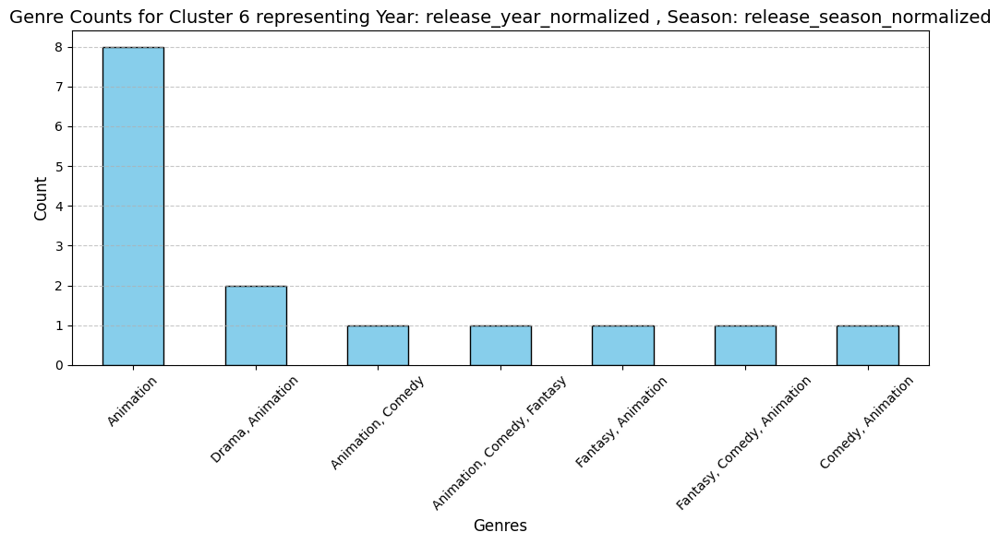


Cluster 7:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
3329,L'Homme Machine,Animation,Animated stick drawings representing a man wal...,No Language,Short,Winter,Winter,4.696,0.0
10494,Un rêve au coin du feu,Animation,It is a short film made by Emile Reynaud,No Language,Short,Winter,Winter,3.333,0.0
16054,Les clowns Price,Animation,Unknown,No Language,Short,Winter,Winter,7.000,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
4984,Matches: An Appeal,Animation,A thirty-second long stop-motion animated piec...,No Language,Short,Winter,Winter,4.200,0.0
24559,Buffon Dance,Animation,Unknown,No Language,Short,Winter,Winter,0.000,0.0
18372,"And the Villain Still Pursued Her, or, the Aut...","Comedy, Animation, Adventure",A writer of tawdry fiction falls asleep at his...,English,Short,Winter,Winter,6.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2365,0.023256,1.0,0,7
3329,0.007752,1.0,0,7
4984,0.054264,1.0,0,7
10494,0.023256,1.0,0,7
16054,0.046512,1.0,0,7
18372,0.069767,1.0,0,7
24559,0.069767,1.0,0,7


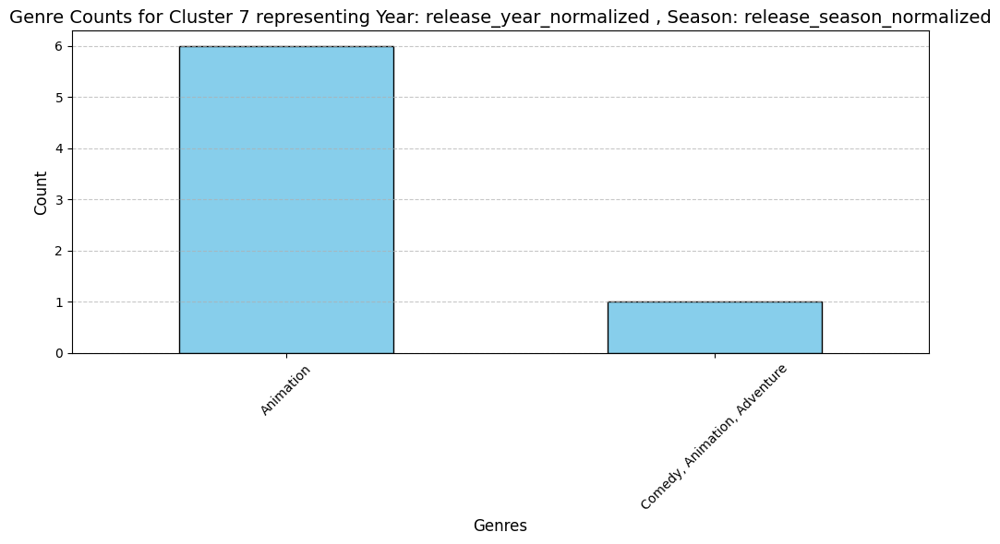


Cluster 8:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
6171,The Pumpkin Race,"Comedy, Fantasy, Action, Animation",Early slapstick short from Louis Feuillade inv...,No Language,Short,Spring,Spring,5.500,0.0
46885,He Loves to Watch the Flight of Time,"Animation, Comedy",Watching the dial of a taxi-cab is like a fall...,No Language,Short,Spring,Spring,0.000,0.0
46884,Poor Little Chap He Was Only Dreaming,"Animation, Comedy","When ""Snookums"" started to cry, Da-da thought ...",No Language,Short,Spring,Spring,0.000,0.0
2367,Humorous Phases of Funny Faces,"Comedy, Animation",A cartoonist draws faces and figures on a blac...,No Language,Short,Spring,Spring,5.819,0.0
46882,Business Must Not Interfere,"Animation, Comedy",This time the trouble is with Snookums and the...,No Language,Short,Spring,Spring,0.000,0.0
5733,Miniature Theatre,"Comedy, Animation","Three young children set up a table, and on th...",No Language,Short,Spring,Spring,5.000,0.0
46881,"When He Wants a Dog, He Wants a Dog","Animation, Comedy",Snookums Newlywed makes acquaintance with a dog.,No Language,Short,Spring,Spring,0.000,0.0
13447,Bewitched Matches,"Fantasy, Animation",Three girls seeking to have their fortunes tol...,No Language,Short,Spring,Spring,5.000,0.0
46883,He Wants What He Wants When He Wants It,"Animation, Comedy","When ""Snookums"" discovered this break in the p...",No Language,Short,Spring,Spring,0.000,0.0
3978,Katsudō Shashin,"Animation, Family",A boy in a cadet's uniform paints a statement ...,No Language,Short,Spring,Spring,5.909,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2367,0.069767,0.333333,1,8
3978,0.077519,0.333333,1,8
5733,0.069767,0.333333,1,8
6171,0.077519,0.333333,1,8
13447,0.124031,0.333333,1,8
46881,0.124031,0.333333,1,8
46882,0.124031,0.333333,1,8
46883,0.124031,0.333333,1,8
46884,0.124031,0.333333,1,8
46885,0.124031,0.333333,1,8


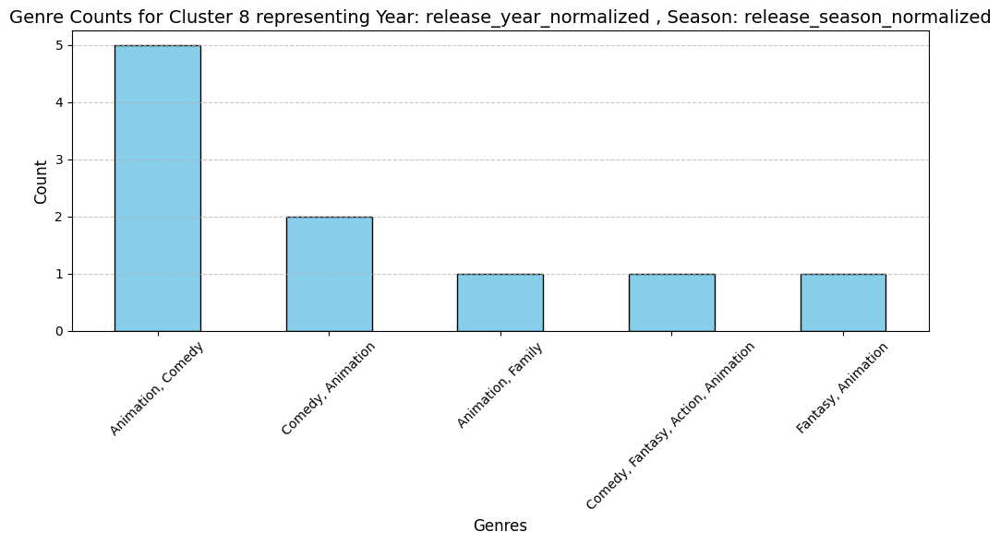


Cluster 9:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9779,The Aquarium,Animation,"Praxinoscope reel, Series 1, number 1",No Language,Short,Spring,Spring,3.250,0.0
7015,Le Jeu de Corde,Animation,Praxinoscope of a girl in a blue dress skippin...,No Language,Short,Spring,Spring,4.625,0.0
8508,L'Équilibriste,Animation,Praxinoscope animation of a child laying down ...,No Language,Short,Spring,Spring,4.200,0.0
9757,La Charmeuse,Animation,Praxinoscope animation of a girl charming a fl...,No Language,Short,Spring,Spring,5.000,0.0
9857,Les Bulles de Savon,Animation,Praxinoscope animation of a girl in a blue dre...,No Language,Short,Spring,Spring,4.750,0.0
9759,Le Fumeur,Animation,Praxinoscope animation of a man sitting backwa...,No Language,Short,Spring,Spring,4.250,0.0
11561,L'Hercule,Animation,Praxinoscope animation of man jugging a iron. ...,No Language,Short,Spring,Spring,3.000,0.0
9772,Le Steeple-chase,Animation,Praxinoscope animation of an equestrian riding...,No Language,Short,Spring,Spring,4.250,0.0
9758,La Balançoire,Animation,Praxinoscope animation of two children playing...,No Language,Short,Spring,Spring,4.500,0.0
11558,Les Petits Valseurs,Animation,Praxinoscope animation of kids dancing. Series...,No Language,Short,Spring,Spring,3.333,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,9
4592,0.0,0.333333,1,9
7015,0.0,0.333333,1,9
7018,0.0,0.333333,1,9
8487,0.0,0.333333,1,9
8508,0.0,0.333333,1,9
9755,0.0,0.333333,1,9
9756,0.0,0.333333,1,9
9757,0.0,0.333333,1,9
9758,0.0,0.333333,1,9


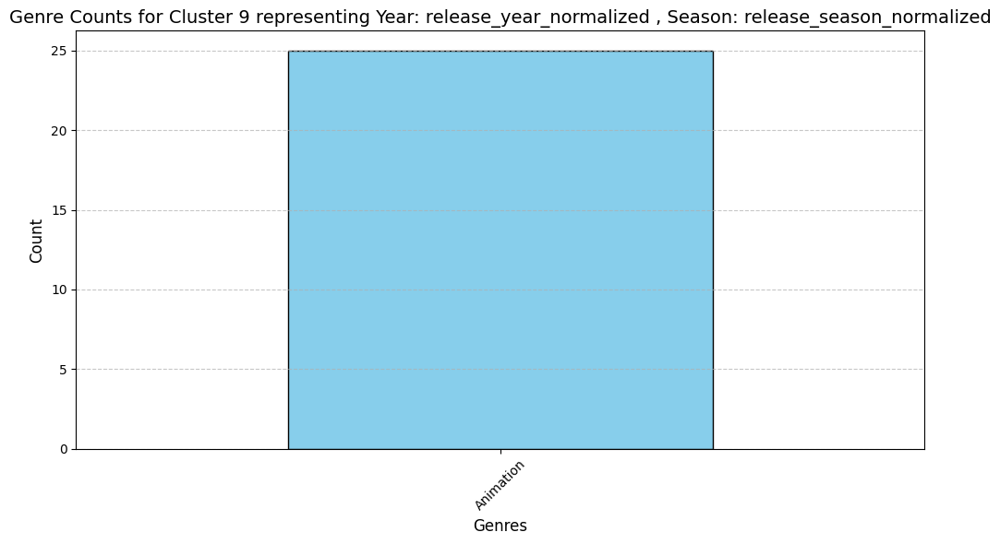


Cluster 10:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
5753,Spanish Clair de Lune,"Romance, Drama, Fantasy, Animation, Comedy",Two lovers perform a fandango dance. A jealous...,No Language,Short,Spring,Spring,5.7,0.0
9861,Japanese Fantasy,"Animation, Fantasy",This subject presents a remarkably clever seri...,No Language,Short,Spring,Spring,4.5,0.0
13273,Monsieur Clown Among the Lilliputians,Animation,Stop-motion film from Émile Cohl has a clown w...,No Language,Short,Spring,Spring,4.5,0.0
35104,In the Land of Nod,Animation,Children play with their toys while Grandpa do...,English,Short,Spring,Spring,0.0,0.0
7457,The Chinese Shadows,"Comedy, Animation",At the beginning of this film two women come o...,No Language,Short,Spring,Spring,5.0,0.0
39422,Urban Science: To Demonstrate How Spiders Fly,"Animation, Documentary",This charming short film is surprisingly techn...,"No Language, English",Short,Spring,Spring,0.0,0.0
11692,The Sculptor's Nightmare,"Comedy, Animation","At a political club, the members debate whose ...",English,Short,Spring,Spring,5.0,0.0
10676,Matrimonial Shoes,Animation,A film about cupid shoes by Émile Cohl.,No Language,Short,Spring,Spring,5.8,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
5753,0.093023,0.333333,1,10
7457,0.085271,0.333333,1,10
9861,0.093023,0.333333,1,10
10676,0.093023,0.333333,1,10
11692,0.085271,0.333333,1,10
13273,0.093023,0.333333,1,10
35104,0.085271,0.333333,1,10
39422,0.093023,0.333333,1,10


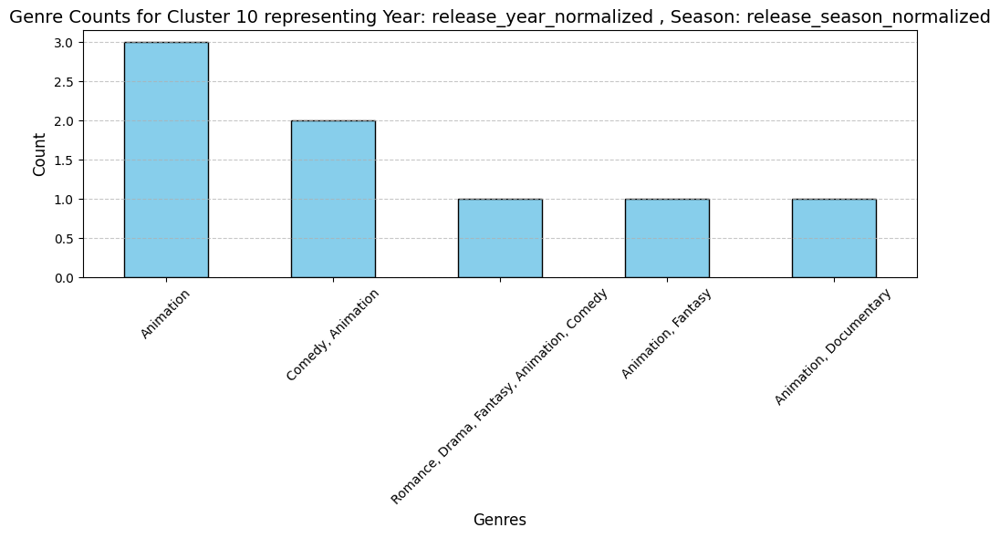

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.2, min_samples=6 | Silhouette Score: 0.826, DB Index: 0.173 ,clusters : 12
Plot Title: DBSCAN Clustering on year_season_features (eps=0.2, min_samples=6)
Explained Variance Ratios (3 Components): [0.77249932 0.19492123 0.02567664]
Total Explained Variance: 0.9930971948059005


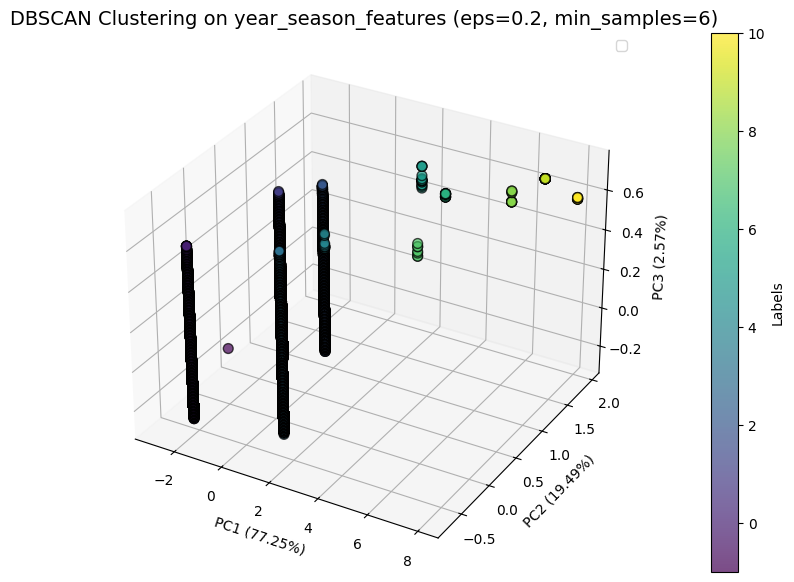

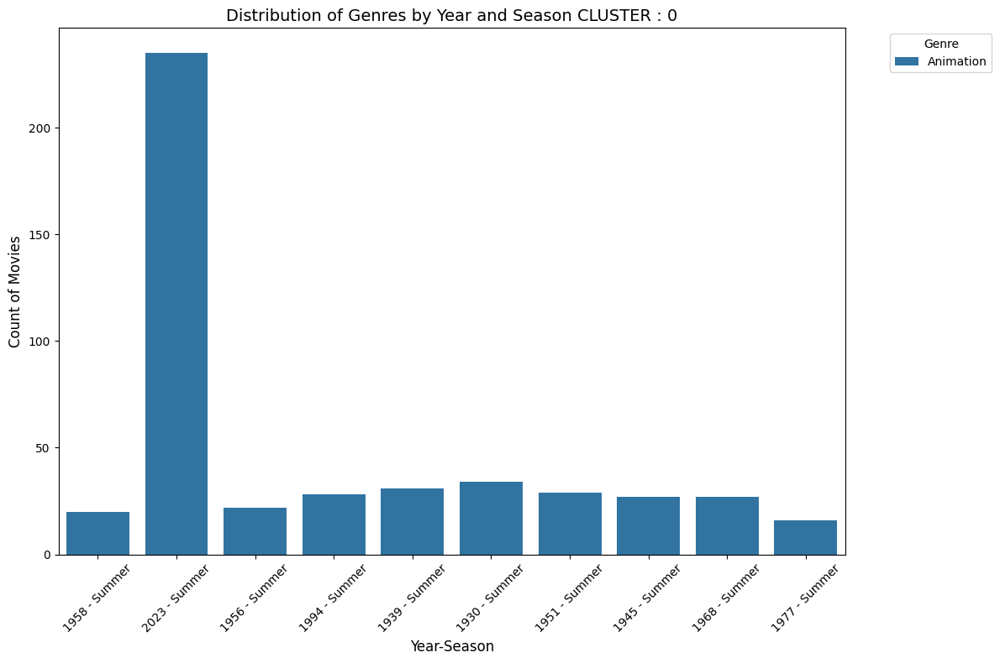

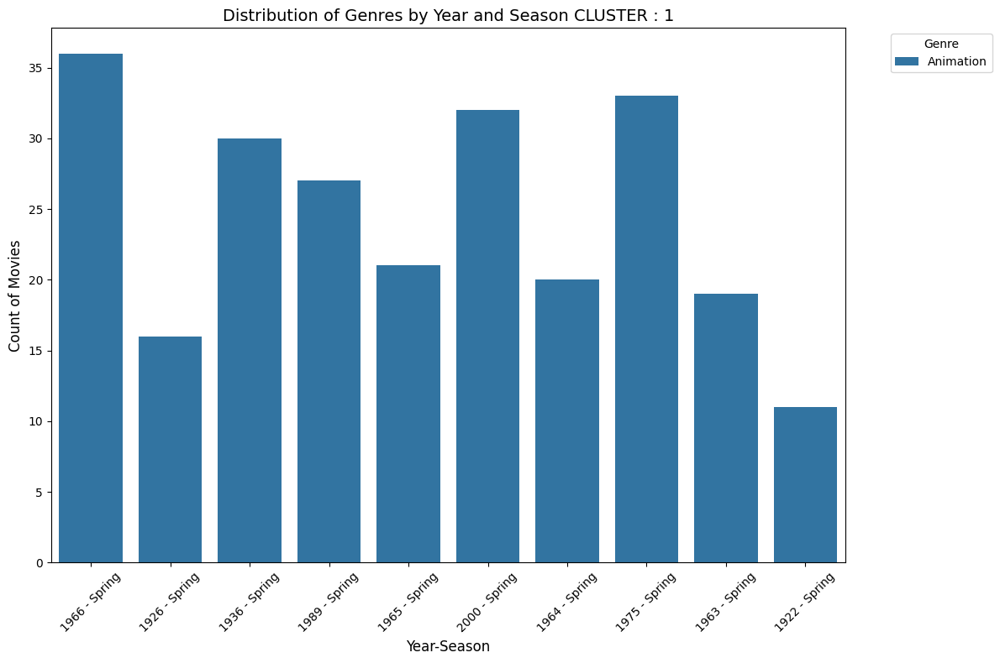

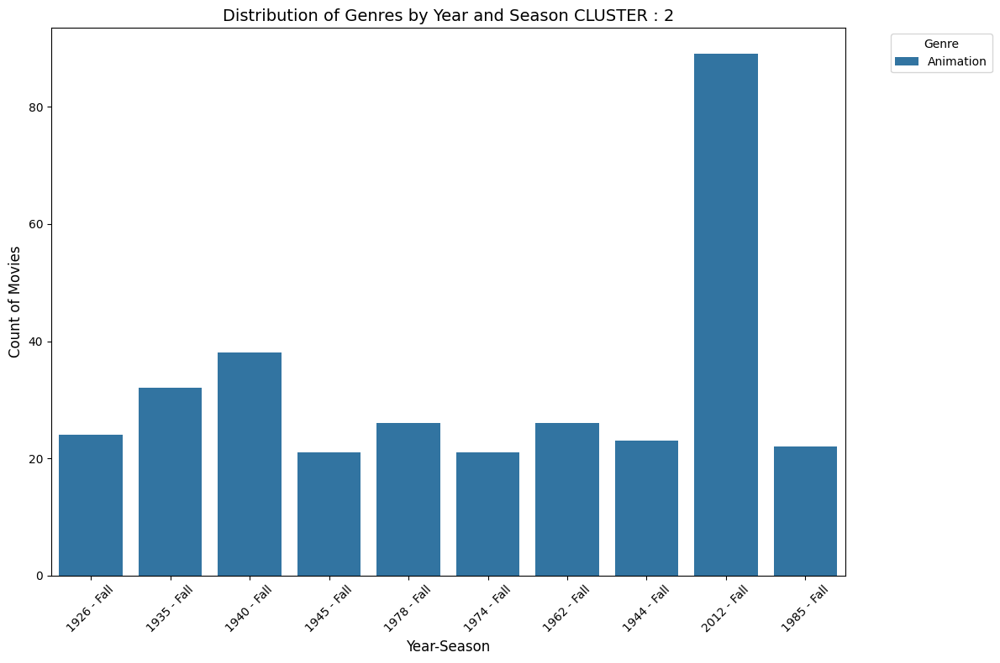

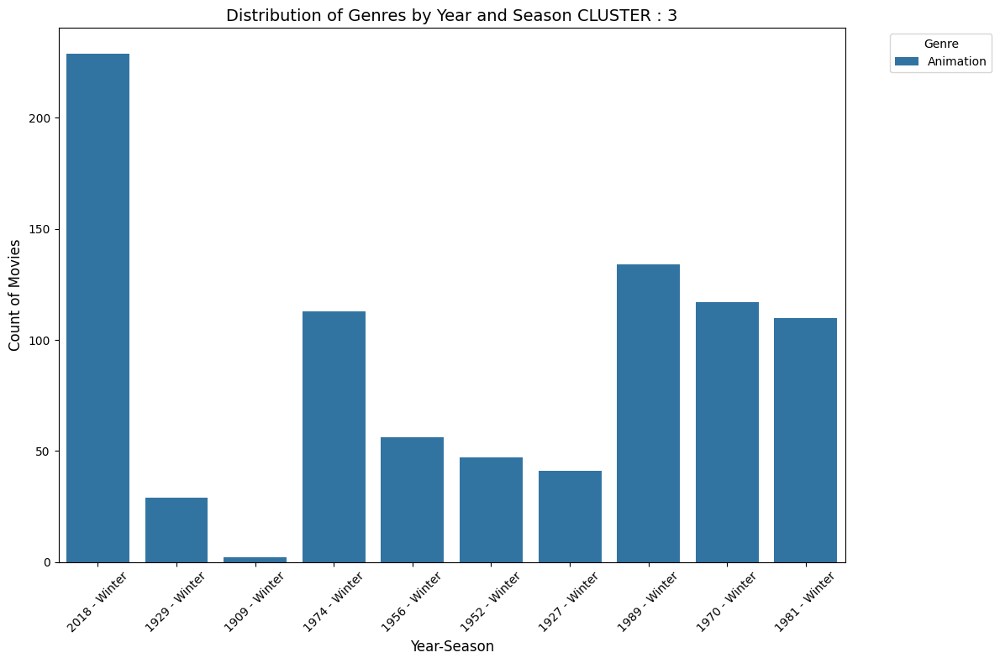

...

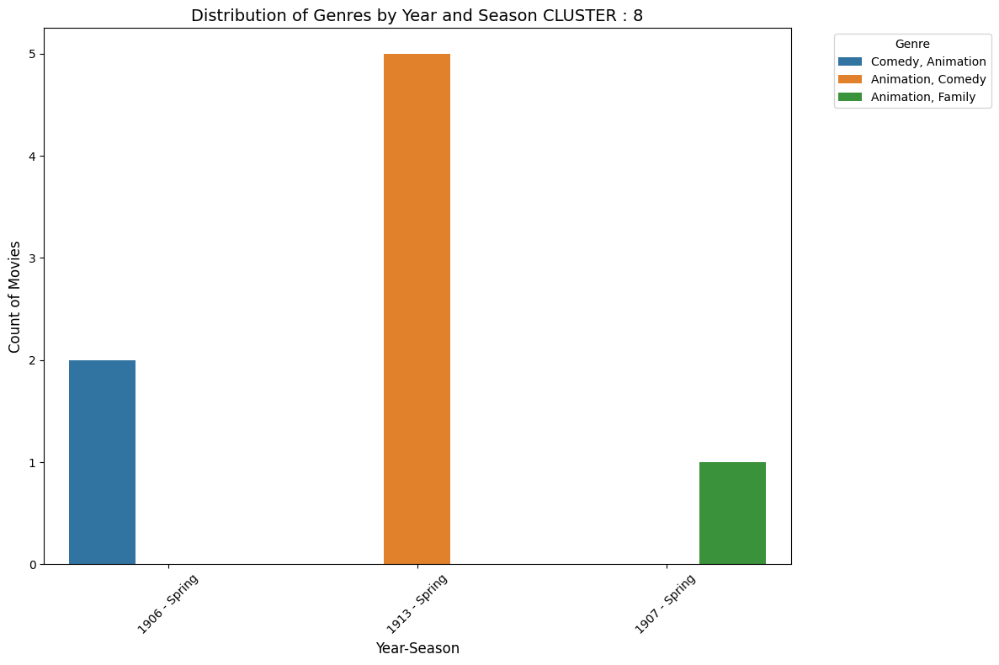

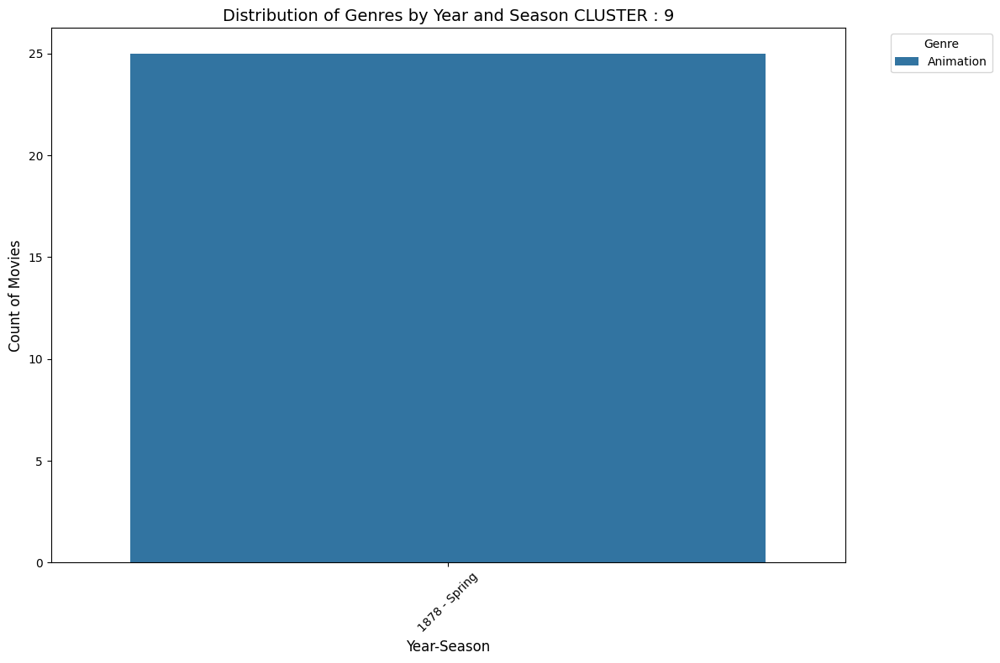

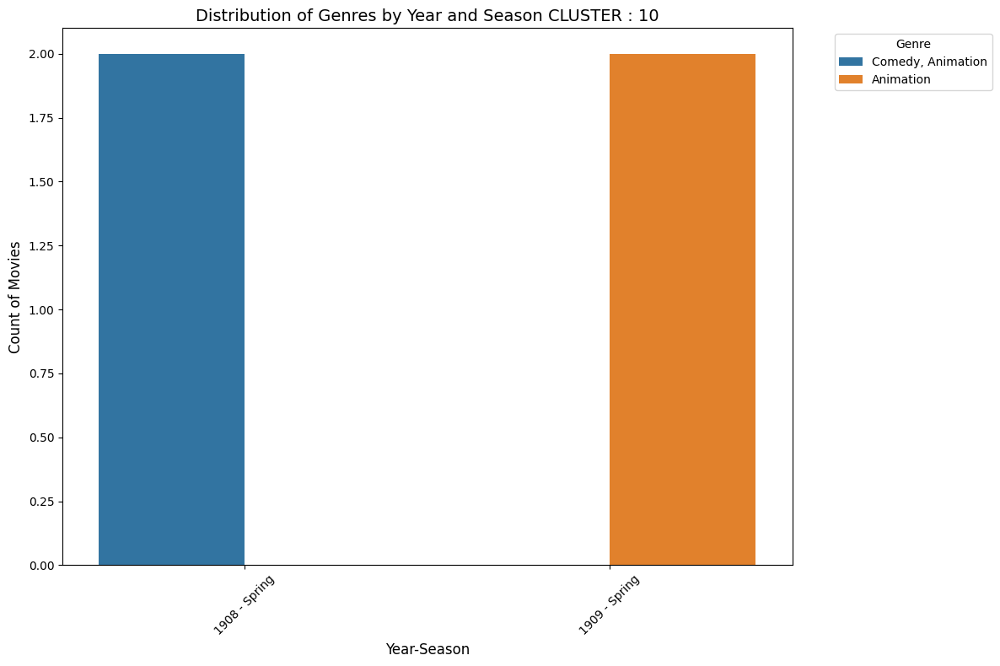

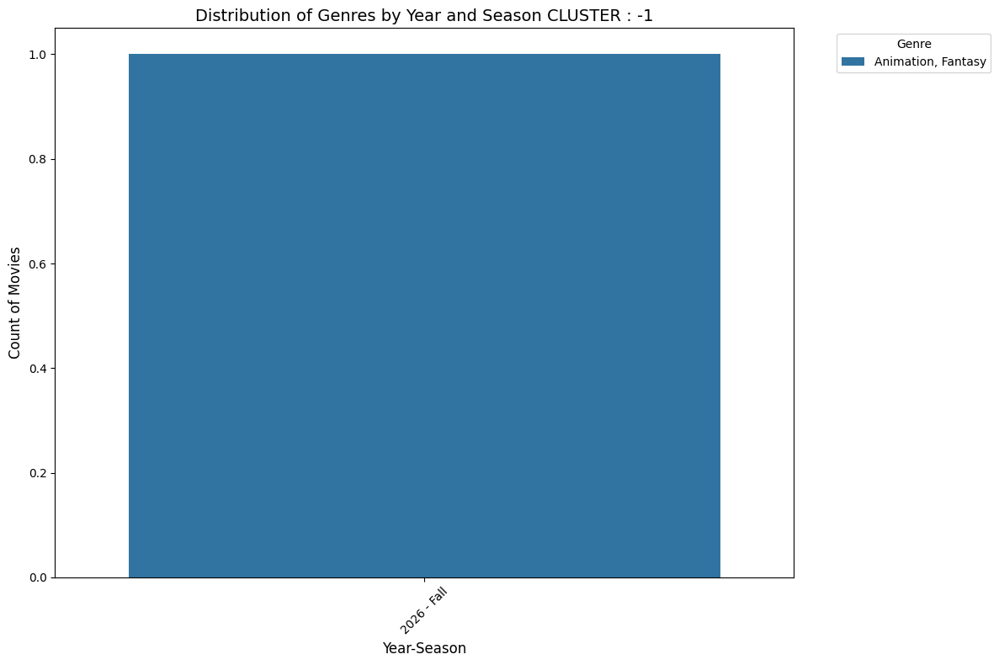

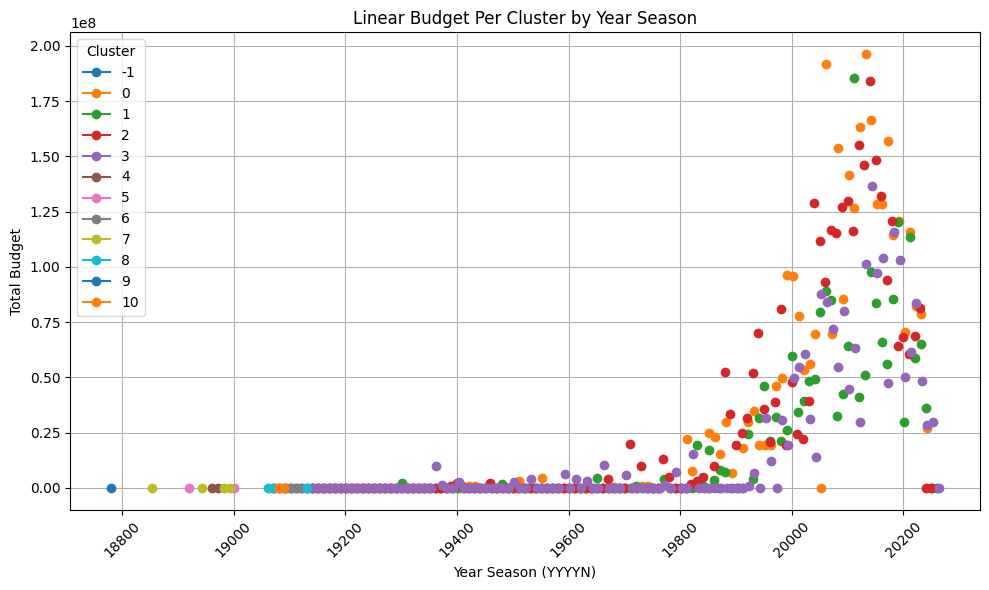

Model 'dbscan0.2' saved to 'saved_models\dbscan0.2.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
11692,The Sculptor's Nightmare,"Comedy, Animation","At a political club, the members debate whose ...",English,Short,Spring,Spring,5.000,0.0
18372,"And the Villain Still Pursued Her, or, the Aut...","Comedy, Animation, Adventure",A writer of tawdry fiction falls asleep at his...,English,Short,Winter,Winter,6.000,0.0
10494,Un rêve au coin du feu,Animation,It is a short film made by Emile Reynaud,No Language,Short,Winter,Winter,3.333,0.0
5753,Spanish Clair de Lune,"Romance, Drama, Fantasy, Animation, Comedy",Two lovers perform a fandango dance. A jealous...,No Language,Short,Spring,Spring,5.700,0.0
4984,Matches: An Appeal,Animation,A thirty-second long stop-motion animated piec...,No Language,Short,Winter,Winter,4.200,0.0
39422,Urban Science: To Demonstrate How Spiders Fly,"Animation, Documentary",This charming short film is surprisingly techn...,"No Language, English",Short,Spring,Spring,0.000,0.0
3329,L'Homme Machine,Animation,Animated stick drawings representing a man wal...,No Language,Short,Winter,Winter,4.696,0.0
10676,Matrimonial Shoes,Animation,A film about cupid shoes by Émile Cohl.,No Language,Short,Spring,Spring,5.800,0.0
16054,Les clowns Price,Animation,Unknown,No Language,Short,Winter,Winter,7.000,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2365,0.023256,1.000000,0,-1
3329,0.007752,1.000000,0,-1
4984,0.054264,1.000000,0,-1
5753,0.093023,0.333333,1,-1
7457,0.085271,0.333333,1,-1
9861,0.093023,0.333333,1,-1
10494,0.023256,1.000000,0,-1
10676,0.093023,0.333333,1,-1
11692,0.085271,0.333333,1,-1
13273,0.093023,0.333333,1,-1


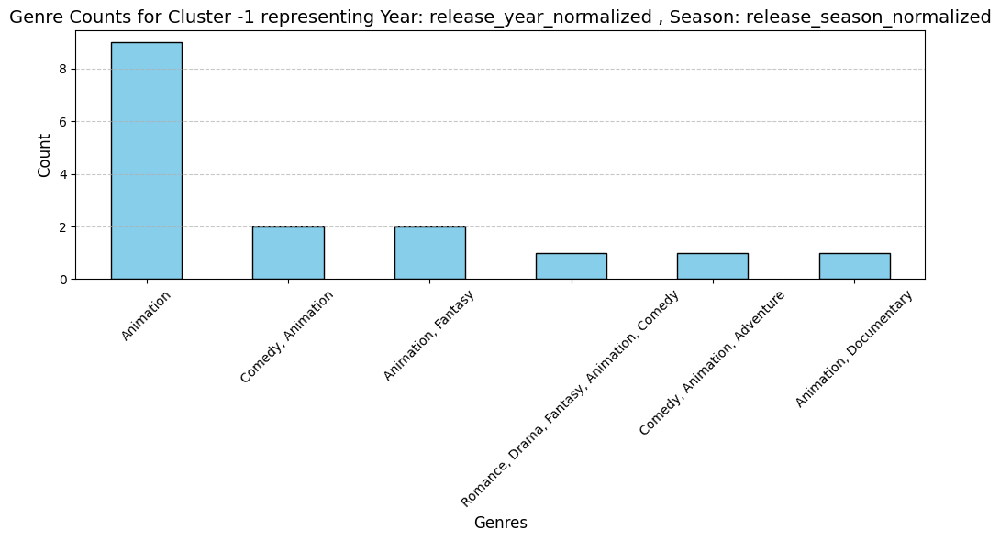


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
25562,No More Dead Friends,Animation,An intimate portrayal of grief after the loss ...,French,Short,Summer,Summer,0.000,0.0
15400,A Kiss In The Darkness,Animation,Just voices in the night or sage advice from t...,English,Short,Summer,Summer,7.000,0.0
45527,The WonderGrove Wizard of Oz,"Animation, Family, Fantasy",Dorothy has anxiety about transitioning from e...,English,Standard,Summer,Summer,0.000,3000000.0
852,Ride Your Wave,"Animation, Romance, Comedy, Drama, Fantasy",Hinako is a surf-loving college student who ha...,Japanese,Short,Summer,Summer,7.621,0.0
44502,Dog,Animation,Tells the story of the death of a dog and the ...,No Language,Short,Summer,Summer,0.000,0.0
881,Green Snake,"Animation, Fantasy, Action, Adventure",While trying to free her sister from Fahai's c...,Mandarin,Short,Summer,Summer,8.300,0.0
32710,A Heathen Benefit,"Animation, Comedy",A Katzenjammer Kids cartoon.,No Language,Short,Summer,Summer,0.000,0.0
31965,Ultromedia Please,Animation,A very helpful tutorial on how to make photos ...,No Language,Short,Summer,Summer,0.000,0.0
46309,Joseito,Animation,"A sunny summer's day, the trembling insides of...",Japanese,Short,Summer,Summer,0.000,0.0
10188,Classical Baby: The Music Show,"Music, Family, Animation",The animal orchestra is warming up and the ani...,No Language,Short,Summer,Summer,7.100,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


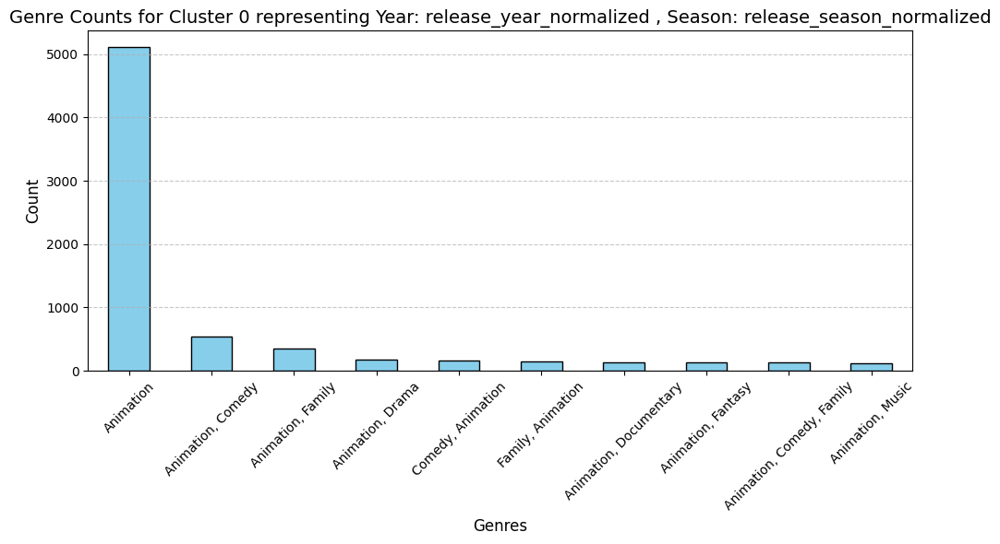


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
16061,Волшебная птица,Animation,Unknown,No Language,Short,Spring,Spring,4.0,0.0
3886,Crazy Over Daisy,"Animation, Comedy","It's the 1890's, and Donald is riding his penn...",English,Short,Spring,Spring,6.1,0.0
26875,One-Act Tragedy,Animation,A Krazy Kat cartoon.,No Language,Short,Spring,Spring,0.0,0.0
4578,She Was an Acrobat's Daughter,"Animation, Comedy","An evening at the local movie theater, includi...",English,Short,Spring,Spring,5.2,0.0
17160,Working!!! Lord of the Takanashi,"Comedy, Romance, Animation",The light-hearted Working!! franchise comes to...,Japanese,Standard,Spring,Spring,10.0,0.0
6058,Mexican Boarders,"Animation, Comedy","Speedy Gonzales' lethargic cousin, Slowpoke Ro...","English, Spanish",Short,Spring,Spring,6.2,0.0
34462,The Secret of the Far Away Island,Animation,"The adventures of the pioneer Petya, the islan...",Russian,Short,Spring,Spring,0.0,0.0
45064,The Cube,Animation,Two gentlemen are having an argument. How heav...,No Language,Short,Spring,Spring,0.0,0.0
35904,Plenty Below Zero,"Comedy, Animation","This entry in Columbia's ""Fox and Crow"" series...",English,Short,Spring,Spring,0.0,0.0
46000,Datacosm,Animation,"At the dawn of the Datacosm, data is planted, ...",English,Short,Spring,Spring,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


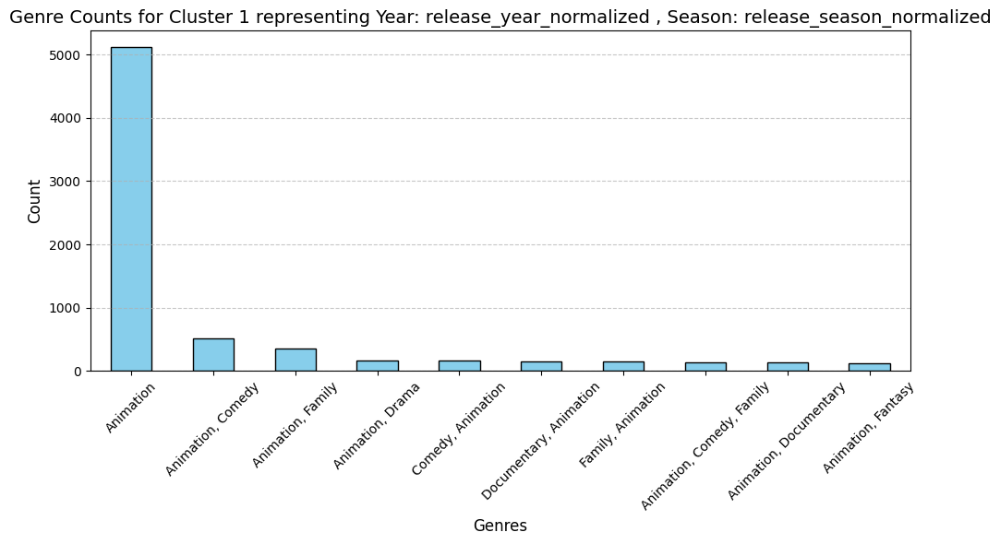


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
22620,Bestias urbanas,Animation,A portrait of the stress of everyday life in a...,Spanish,Short,Fall,Fall,0.000,0.0
39020,BluScenes: The Fractal Plane,"Documentary, Animation",The Fractal Plane by Christopher Ursitti is a ...,No Language,Standard,Fall,Fall,0.000,0.0
19566,Soda Squirt,Animation,"Flip is the owner of a brand new drug store, a...",English,Short,Fall,Fall,1.000,0.0
3635,Rudolph the Red-Nosed Reindeer,"Animation, Family, Fantasy, Music",Rudolph the Red-Nosed Reindeer is a timeless f...,English,Short,Fall,Fall,5.771,0.0
43160,Something To Treasure,Animation,Warm Showers Make Me See Stars.,English,Short,Fall,Fall,0.000,0.0
33567,Midnight Dumplings,Animation,It's ok to ask for help.,English,Short,Fall,Fall,0.000,0.0
2659,Monster High: Fright On!,"Family, Animation, Fantasy",See what happens when the student bodies of an...,English,Standard,Fall,Fall,6.400,0.0
8091,The Dog Hotel,"Animation, Comedy, Mystery","On their way to find Paris, Sture the dog (Has...",Swedish,Standard,Fall,Fall,6.700,0.0
18848,Ludovic - The Snow Gift,"Animation, Family","It's winter in a thatched cottage, home to a f...",French,Short,Fall,Fall,8.000,0.0
2536,Michael Jackson's Halloween,"Animation, Comedy, Family","The one-hour animated special, packed with the...",English,Standard,Fall,Fall,7.952,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


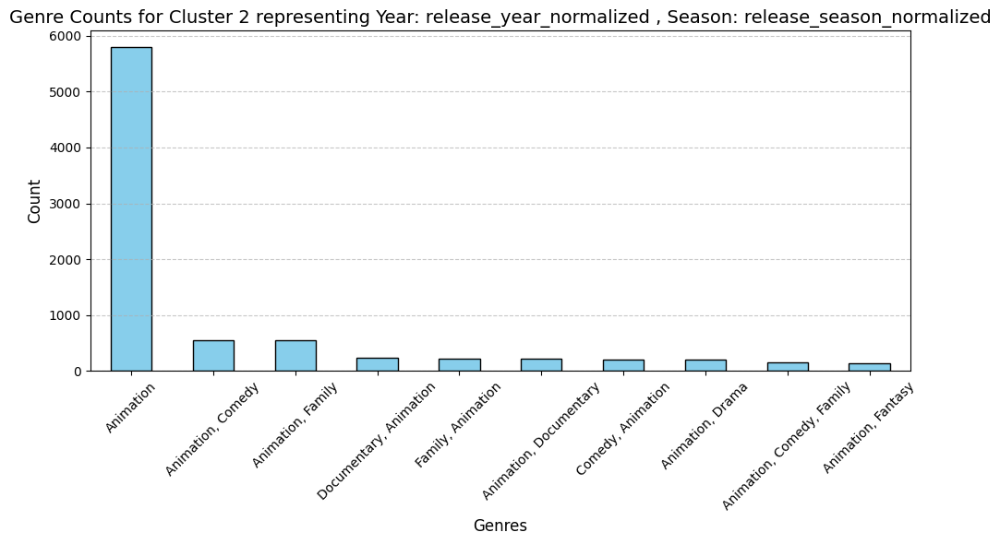


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
27525,Nahualli,Animation,An Aztec priest prepares for a ceremony in hon...,French,Short,Winter,Winter,0.000,0.0
794,Ultimate Avengers: The Movie,"Action, Animation, Family, Adventure, Science ...",When a nuclear missile was fired at Washington...,English,Standard,Winter,Winter,6.760,0.0
2704,Epic Tails,"Animation, Adventure, Fantasy, Family",An adventurous mouse sets off to battle danger...,"Danish, Finnish, French, Norwegian, Swedish",Short,Winter,Winter,6.868,0.0
7937,Valuable Kopeck,Animation,Animated short film dedicated to the redenomin...,Russian,Short,Winter,Winter,4.800,0.0
47776,Christmas Is,"Animation, Family",Benji is upset that he is playing the second s...,English,Short,Winter,Winter,0.000,0.0
35658,Шарик-фонарик,"Animation, Family",Unknown,No Language,Short,Winter,Winter,0.000,0.0
42056,De Vriendelijke Draak,Animation,Unknown,No Language,Short,Winter,Winter,0.000,0.0
47802,Mercury,Animation,A young artist who works as a gallery assistan...,Turkish,Short,Winter,Winter,0.000,0.0
7692,How The Grinch Stole Christmas!,"Animation, Family, Fantasy",This short video features illustrations from t...,English,Short,Winter,Winter,7.300,0.0
19676,Alternative,Animation,An instructive parable that the two principles...,No Language,Short,Winter,Winter,7.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


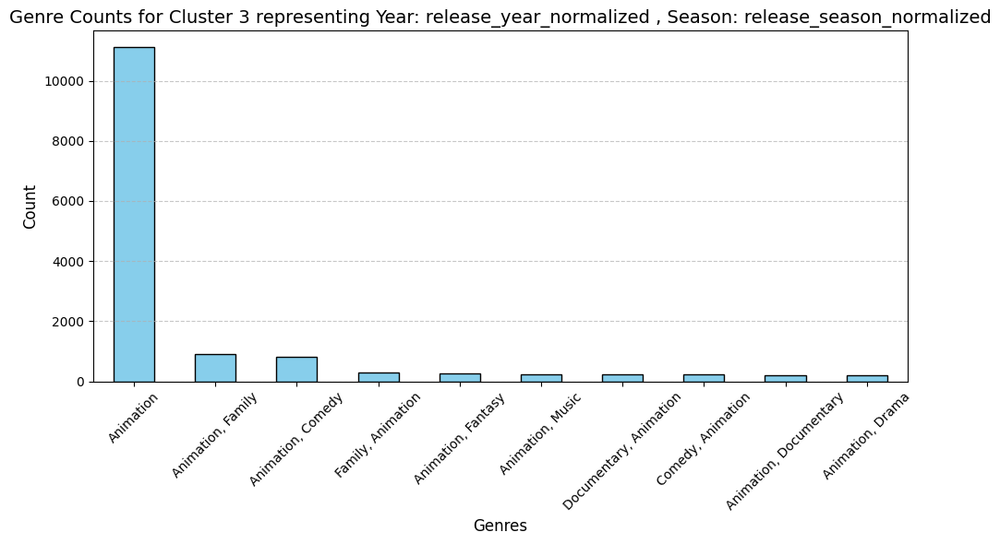


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
14682,Tale of the Ark,"Fantasy, Animation","A child dreams of the Bible tale, reenacted by...",No Language,Short,Summer,Summer,4.500,0.0
13272,The Four Little Tailors,"Romance, Fantasy, Comedy, Animation","The opening scene is in a tailor's shop, showi...",No Language,Short,Summer,Summer,4.000,0.0
8113,Lightning Sketches,"Comedy, Animation",An illustrator draws some sketches at lightnin...,No Language,Short,Summer,Summer,3.800,0.0
13271,Petit Faust,"Animation, Fantasy",The various parts of Faust are played by puppets.,No Language,Short,Summer,Summer,5.500,0.0
9418,The Twelve Labors of Hercules,"Adventure, Animation, Fantasy",A cut-out animation depicting the Twelve Labou...,No Language,Short,Summer,Summer,5.800,0.0
14628,TR's Arrival in Africa,"Comedy, Animation","African animals, including a lookout monkey, a...","English, No Language",Short,Summer,Summer,5.000,0.0
5767,The Happy Microbes,"Comedy, Animation",A scientist has acquired a microscope and is s...,No Language,Short,Summer,Summer,4.900,0.0
1486,Fantasmagorie,Animation,"An animated film by French auteur Émile Cohl, ...",No Language,Short,Summer,Summer,6.611,0.0
10898,Guillaume Tell,"Animation, Comedy",Unknown,No Language,Short,Summer,Summer,5.000,0.0
14428,Le premier cigare,Animation,Unknown,No Language,Short,Summer,Summer,4.500,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,4
5767,0.093023,0.666667,0,4
8113,0.077519,0.666667,0,4
9418,0.100775,0.666667,0,4
10898,0.031008,0.666667,0,4
13271,0.100775,0.666667,0,4
13272,0.100775,0.666667,0,4
13274,0.093023,0.666667,0,4
14428,0.038760,0.666667,0,4
14628,0.093023,0.666667,0,4


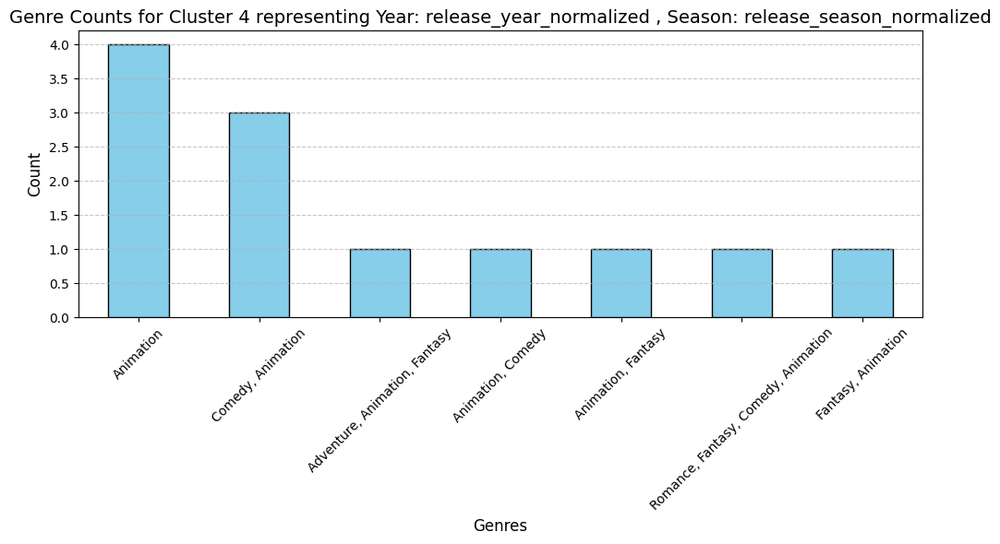


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9882,The Magic Hoop,"Fantasy, Animation",Émile Cohl mixes live-action and stop-motion a...,No Language,Short,Fall,Fall,4.800,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.400,0.0
17842,Animated Cotton,Animation,It might not take you long to cotton on to the...,No Language,Short,Fall,Fall,4.000,0.0
5010,The Puppet's Nightmare,"Comedy, Animation","A nightmare, sketched out upon a living blackb...",No Language,Short,Fall,Fall,5.800,0.0
12679,The Sorcerer's Scissors,"Animation, Fantasy","A mix of spectacle, animation and dance, the f...",No Language,Short,Fall,Fall,7.000,0.0
1672,The Cameraman's Revenge,Animation,A jilted husband takes his revenge by filming ...,No Language,Short,Fall,Fall,7.198,0.0
46889,He Loves to Be Amused,"Animation, Comedy",Papa Newlywed and his lovely wife looked up at...,No Language,Short,Fall,Fall,0.000,0.0
6767,A Good Beer,Animation,Unknown,No Language,Short,Fall,Fall,4.000,0.0
6252,Clown and His Dogs,Animation,Short film of 300 individually painted images.,No Language,Short,Fall,Fall,4.700,0.0
1992,The Enchanted Drawing,"Animation, Comedy, Fantasy",A cartoonist defies reality when he draws obje...,No Language,Short,Fall,Fall,6.423,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.0,1,5
1716,0.015504,0.0,1,5
1992,0.062016,0.0,1,5
2248,0.085271,0.0,1,5
5010,0.085271,0.0,1,5
5138,0.085271,0.0,1,5
6252,0.015504,0.0,1,5
6767,0.015504,0.0,1,5
6830,0.093023,0.0,1,5
8477,0.085271,0.0,1,5


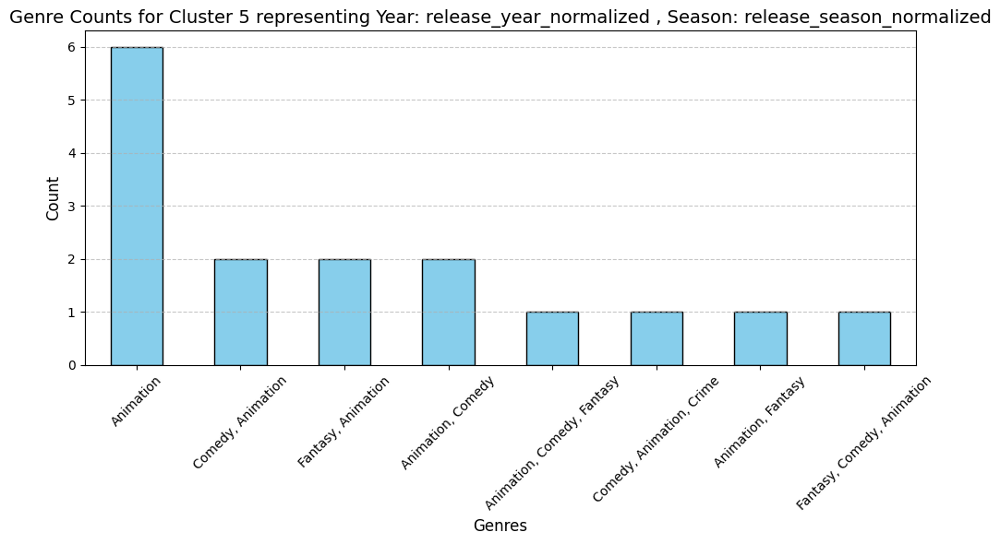


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
12282,The Neo-Impressionist Painter,Animation,A painter is seen in his studio with his model...,No Language,Short,Spring,Spring,5.5,0.0
19101,The Master of a Fashionable Game,"Fantasy, Comedy, Animation",The film presents a drawing room meeting of en...,No Language,Short,Spring,Spring,3.0,0.0
12593,Les Métamorphoses Comiques,Animation,An animation where real life objects turn into...,French,Short,Spring,Spring,5.5,0.0
13208,Petit Chantecler,Animation,Émile Cohl uses stop-motion animation to tell ...,No Language,Short,Spring,Spring,5.5,0.0
10366,Le circuit de l'alcool,Animation,This one is another warning to the French publ...,No Language,Short,Spring,Spring,5.5,0.0
20552,"Petites causes, grands effets!","Drama, Animation",French animation from O'Galop is a pretty inte...,No Language,Short,Spring,Spring,4.0,0.0
20582,The Strong Arm Squad of the Future,Animation,The Strong Arm Squad of the Future originated ...,No Language,Short,Spring,Spring,6.0,0.0
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.6,0.0
13217,The Mysterious Fine Arts,Animation,In this film several objects make paintings on...,No Language,Short,Spring,Spring,5.0,0.0
12281,A Peace of Coal,"Fantasy, Animation",A British trick film with stop-motion animatio...,No Language,Short,Spring,Spring,4.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,6
3598,0.100775,0.333333,1,6
6761,0.116279,0.333333,1,6
10366,0.116279,0.333333,1,6
12281,0.100775,0.333333,1,6
12282,0.100775,0.333333,1,6
12593,0.116279,0.333333,1,6
13208,0.100775,0.333333,1,6
13213,0.100775,0.333333,1,6
13217,0.100775,0.333333,1,6


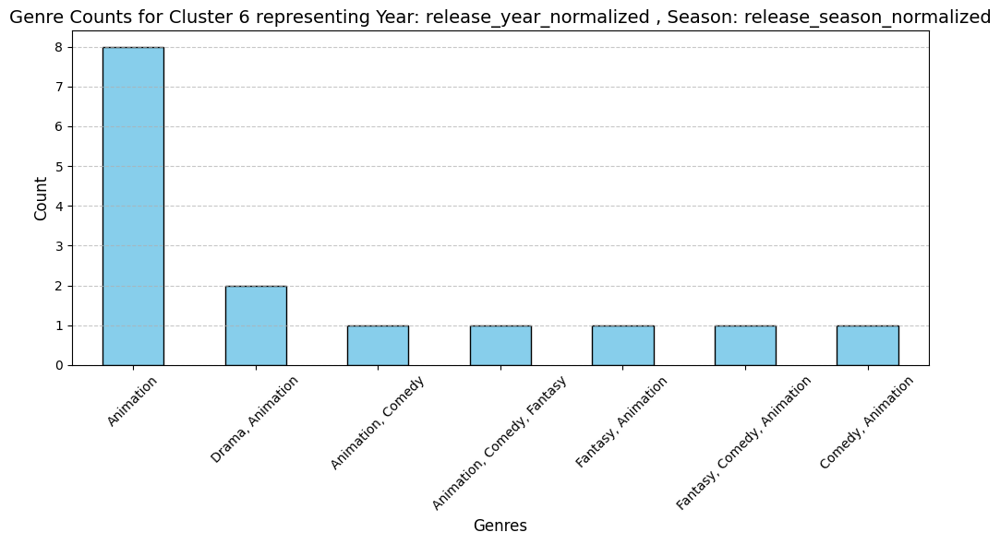


Cluster 7:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
2367,Humorous Phases of Funny Faces,"Comedy, Animation",A cartoonist draws faces and figures on a blac...,No Language,Short,Spring,Spring,5.819,0.0
5733,Miniature Theatre,"Comedy, Animation","Three young children set up a table, and on th...",No Language,Short,Spring,Spring,5.000,0.0
46885,He Loves to Watch the Flight of Time,"Animation, Comedy",Watching the dial of a taxi-cab is like a fall...,No Language,Short,Spring,Spring,0.000,0.0
46883,He Wants What He Wants When He Wants It,"Animation, Comedy","When ""Snookums"" discovered this break in the p...",No Language,Short,Spring,Spring,0.000,0.0
13447,Bewitched Matches,"Fantasy, Animation",Three girls seeking to have their fortunes tol...,No Language,Short,Spring,Spring,5.000,0.0
46884,Poor Little Chap He Was Only Dreaming,"Animation, Comedy","When ""Snookums"" started to cry, Da-da thought ...",No Language,Short,Spring,Spring,0.000,0.0
46882,Business Must Not Interfere,"Animation, Comedy",This time the trouble is with Snookums and the...,No Language,Short,Spring,Spring,0.000,0.0
3978,Katsudō Shashin,"Animation, Family",A boy in a cadet's uniform paints a statement ...,No Language,Short,Spring,Spring,5.909,0.0
6171,The Pumpkin Race,"Comedy, Fantasy, Action, Animation",Early slapstick short from Louis Feuillade inv...,No Language,Short,Spring,Spring,5.500,0.0
46881,"When He Wants a Dog, He Wants a Dog","Animation, Comedy",Snookums Newlywed makes acquaintance with a dog.,No Language,Short,Spring,Spring,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2367,0.069767,0.333333,1,7
3978,0.077519,0.333333,1,7
5733,0.069767,0.333333,1,7
6171,0.077519,0.333333,1,7
13447,0.124031,0.333333,1,7
46881,0.124031,0.333333,1,7
46882,0.124031,0.333333,1,7
46883,0.124031,0.333333,1,7
46884,0.124031,0.333333,1,7
46885,0.124031,0.333333,1,7


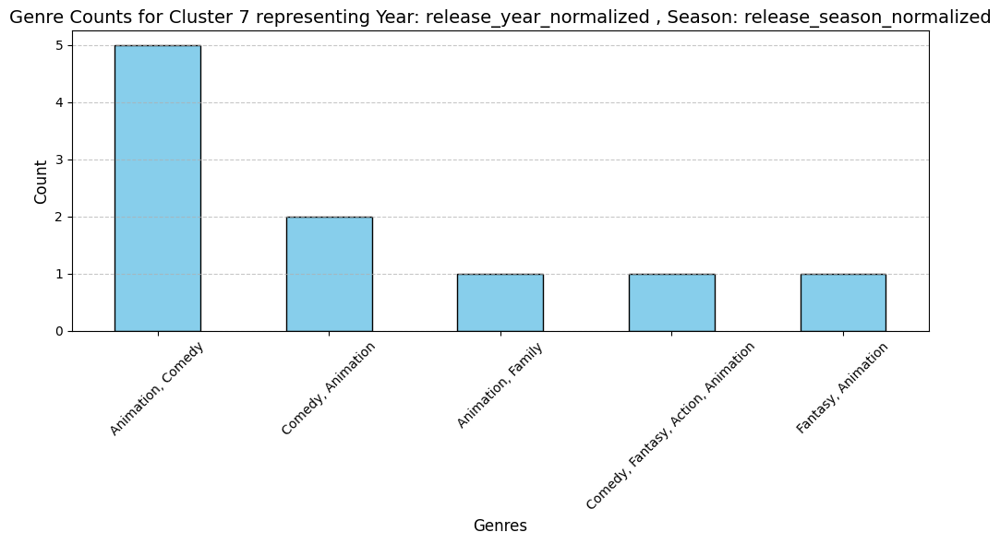


Cluster 8:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
4592,The Magic Rosette,Animation,Praxinoscope strip of a shifting rosette. Seri...,No Language,Short,Spring,Spring,5.583,0.0
8508,L'Équilibriste,Animation,Praxinoscope animation of a child laying down ...,No Language,Short,Spring,Spring,4.200,0.0
9859,Le Rotisseur,Animation,Praxinoscope animation of a chef rotating meat...,No Language,Short,Spring,Spring,4.750,0.0
9866,Les Chiens Savants,Animation,Praxinoscope animation of a boy holding a hoop...,No Language,Short,Spring,Spring,4.500,0.0
4025,The Musician Monkey,Animation,A pre-cinematograph colour animation of the mo...,No Language,Short,Spring,Spring,6.048,153.0
9853,Le Jongleur,Animation,Praxinoscope animation of a juggler balancing ...,No Language,Short,Spring,Spring,4.250,0.0
13143,Le Moulin à Eau,Animation,Praxinoscope animation of the water mill. Seri...,No Language,Short,Spring,Spring,3.500,0.0
11558,Les Petits Valseurs,Animation,Praxinoscope animation of kids dancing. Series...,No Language,Short,Spring,Spring,3.333,0.0
7015,Le Jeu de Corde,Animation,Praxinoscope of a girl in a blue dress skippin...,No Language,Short,Spring,Spring,4.625,0.0
11786,Les Scieurs de Long,Animation,Praxinoscope animation of two workers sawing w...,No Language,Short,Spring,Spring,2.333,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,8
4592,0.0,0.333333,1,8
7015,0.0,0.333333,1,8
7018,0.0,0.333333,1,8
8487,0.0,0.333333,1,8
8508,0.0,0.333333,1,8
9755,0.0,0.333333,1,8
9756,0.0,0.333333,1,8
9757,0.0,0.333333,1,8
9758,0.0,0.333333,1,8


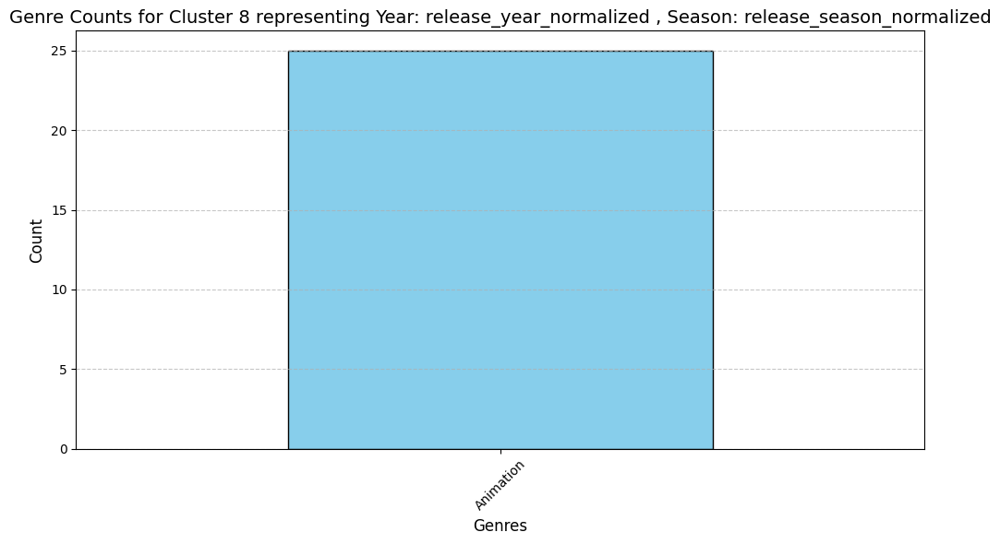

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.2, min_samples=10 | Silhouette Score: 0.815, DB Index: 1.398 ,clusters : 10
Plot Title: DBSCAN Clustering on year_season_features (eps=0.2, min_samples=10)
Explained Variance Ratios (3 Components): [0.77025369 0.19675636 0.02601876]
Total Explained Variance: 0.9930288166039198


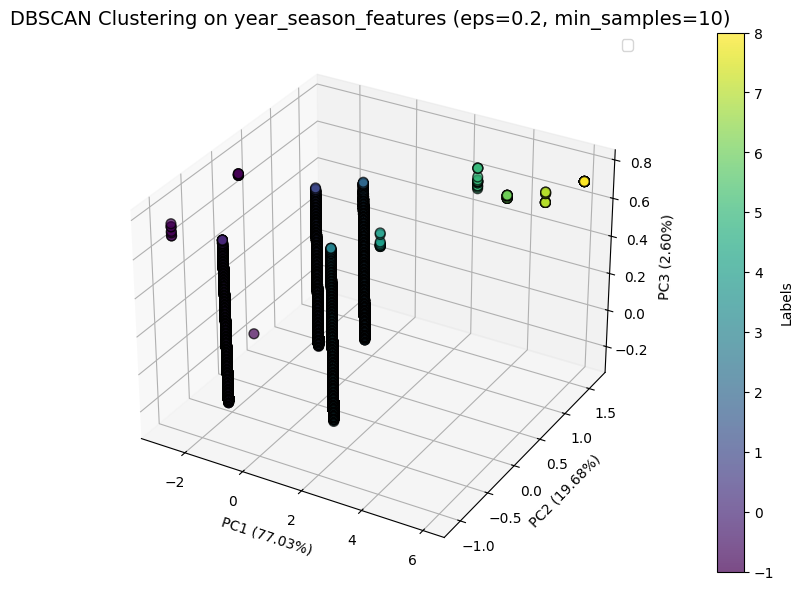

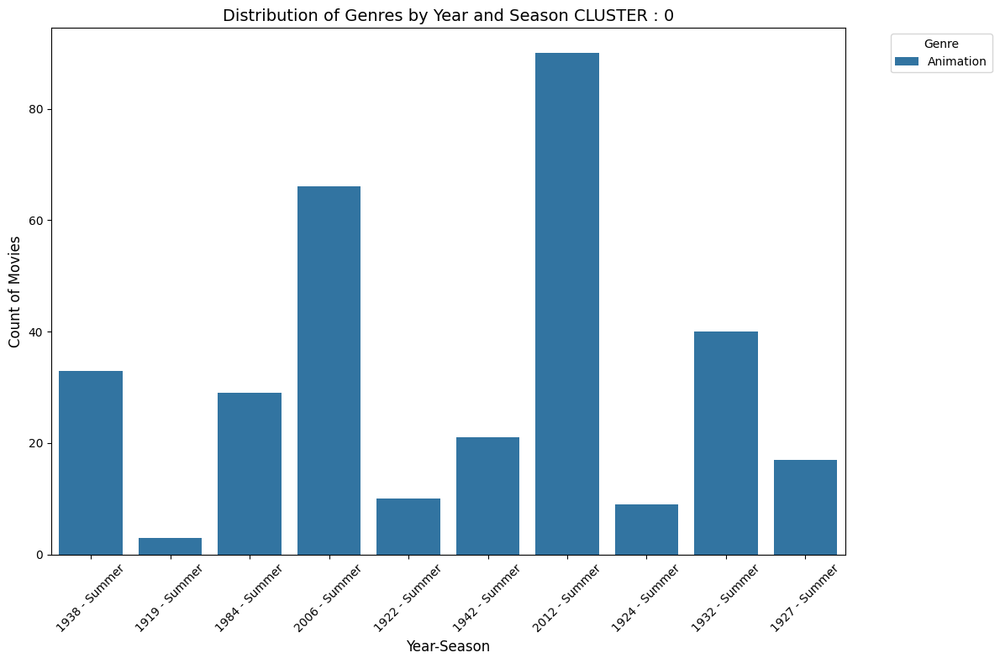

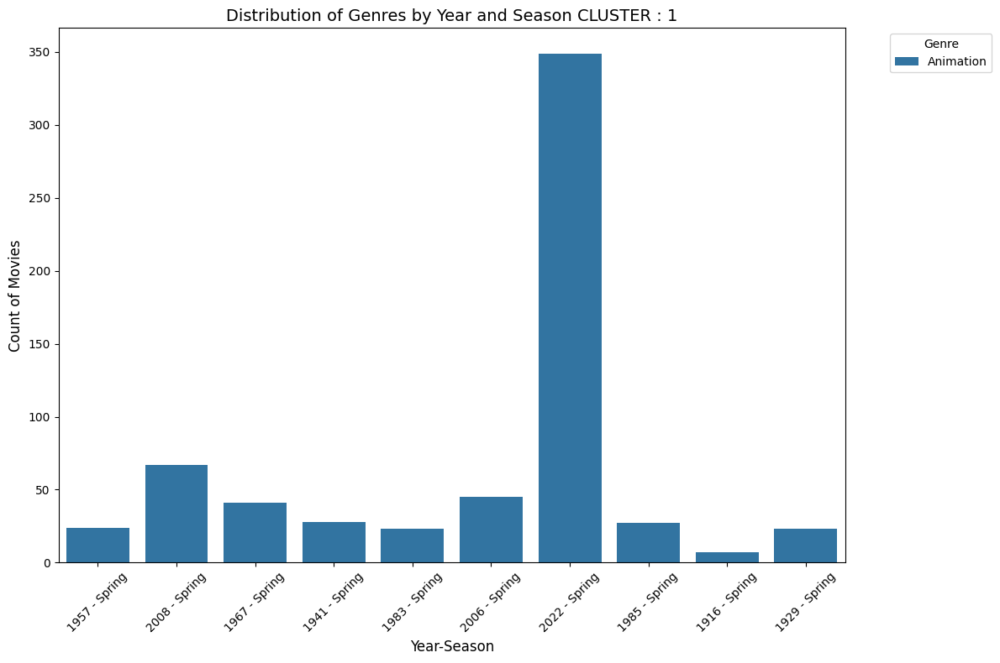

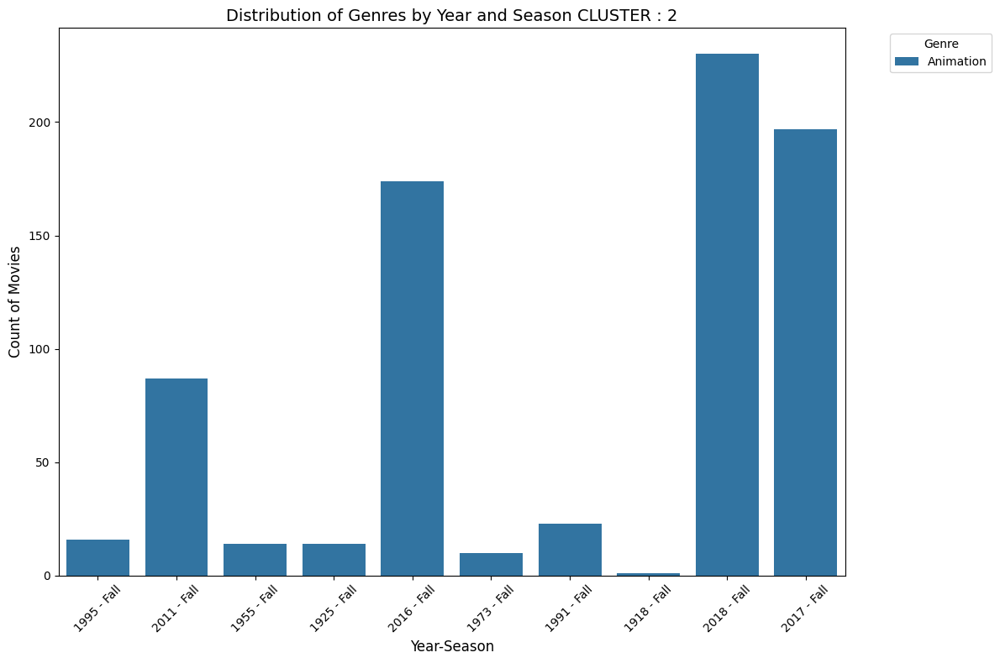

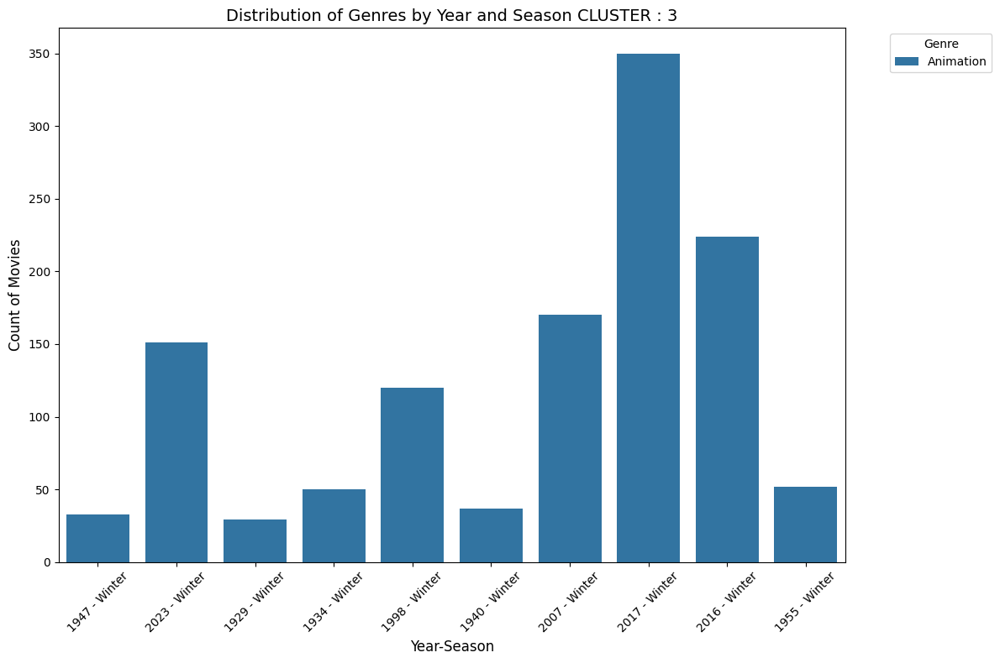

...

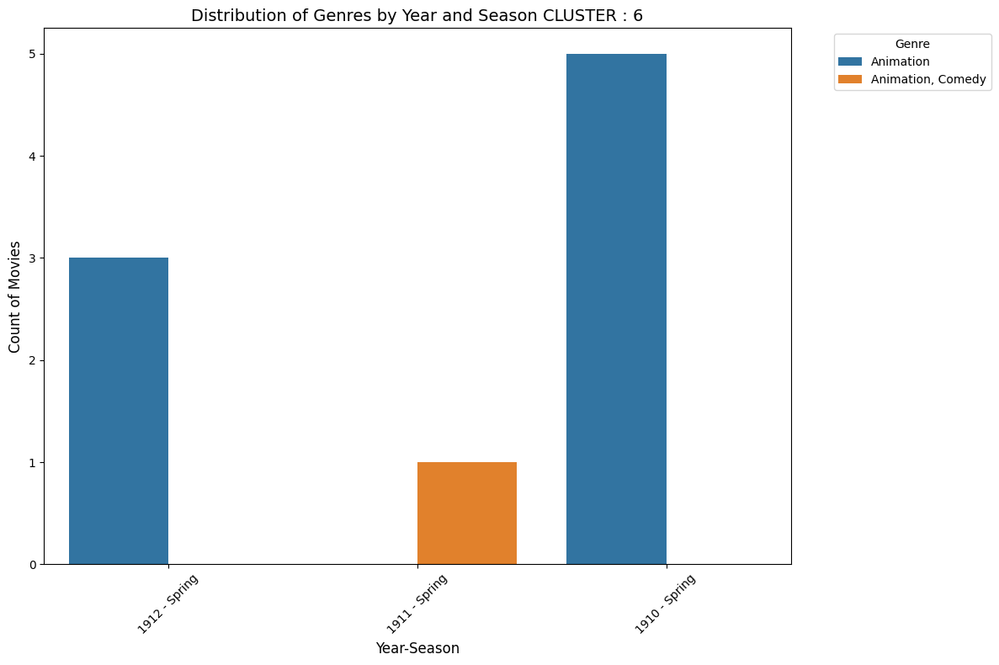

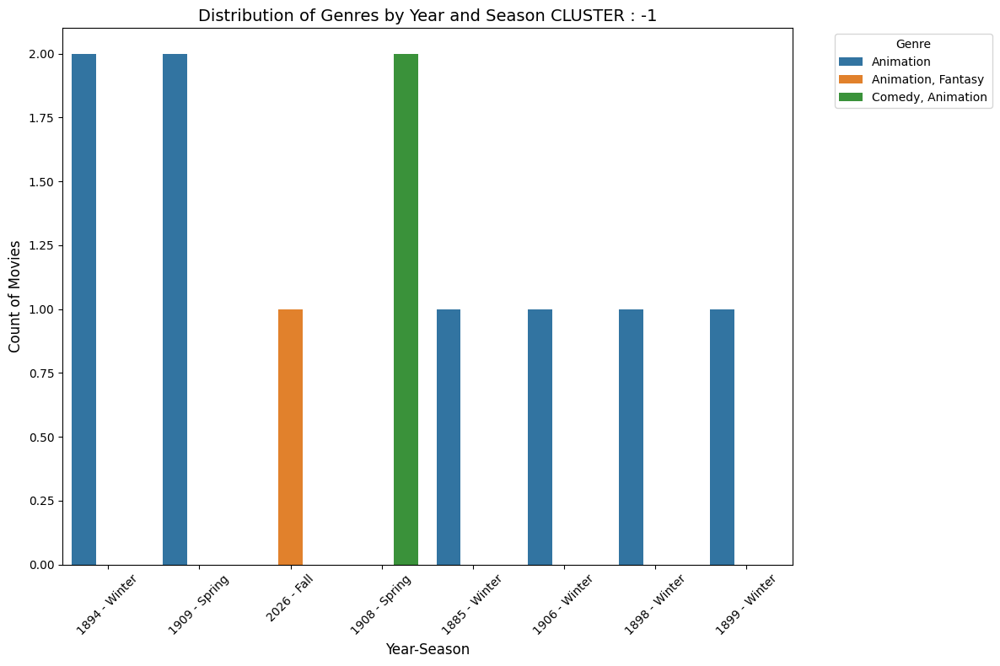

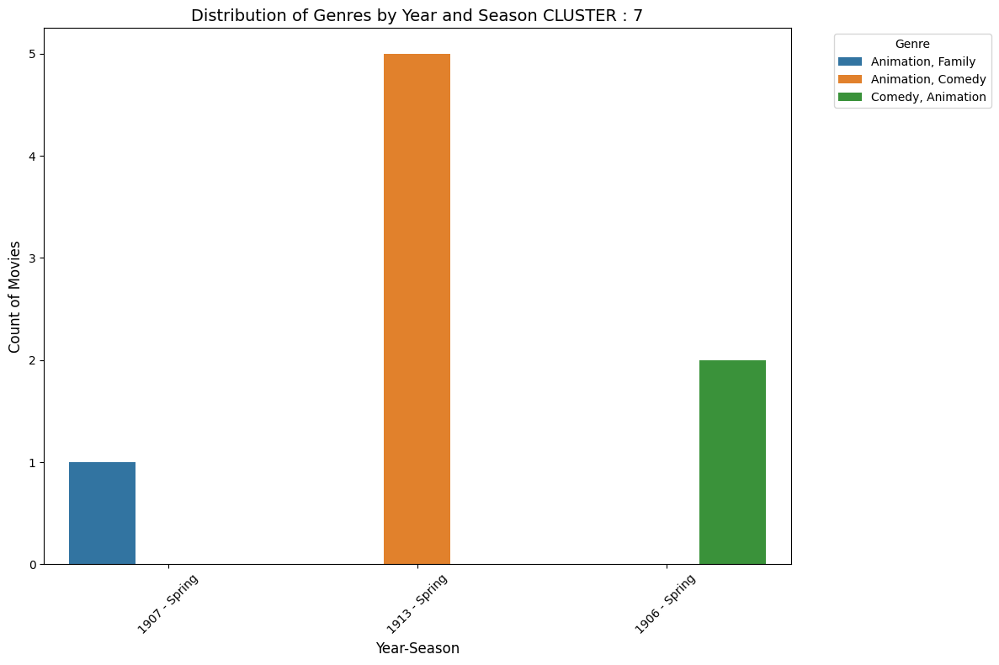

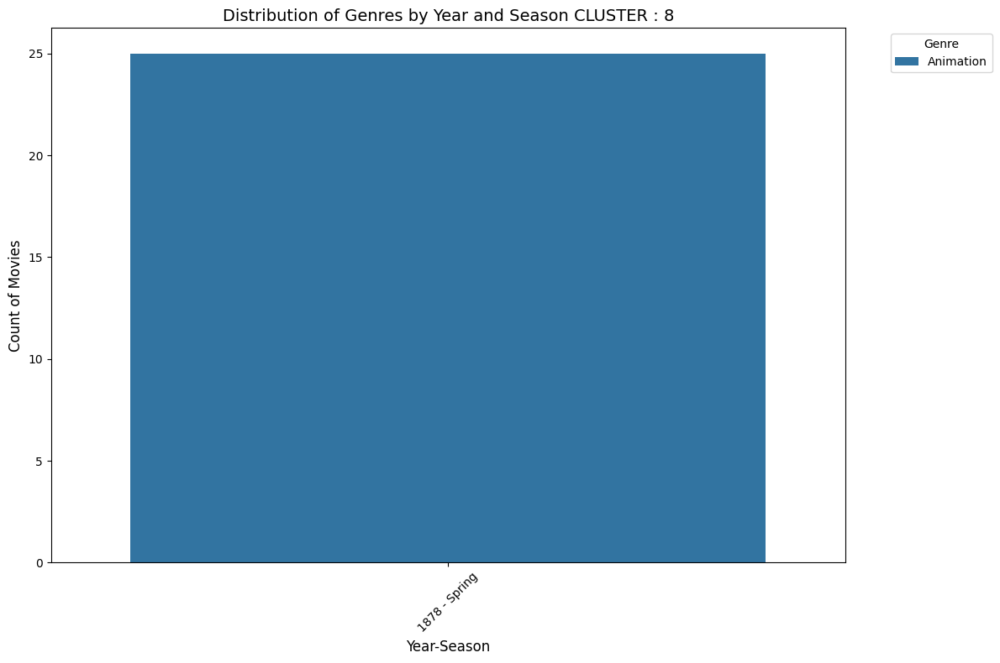

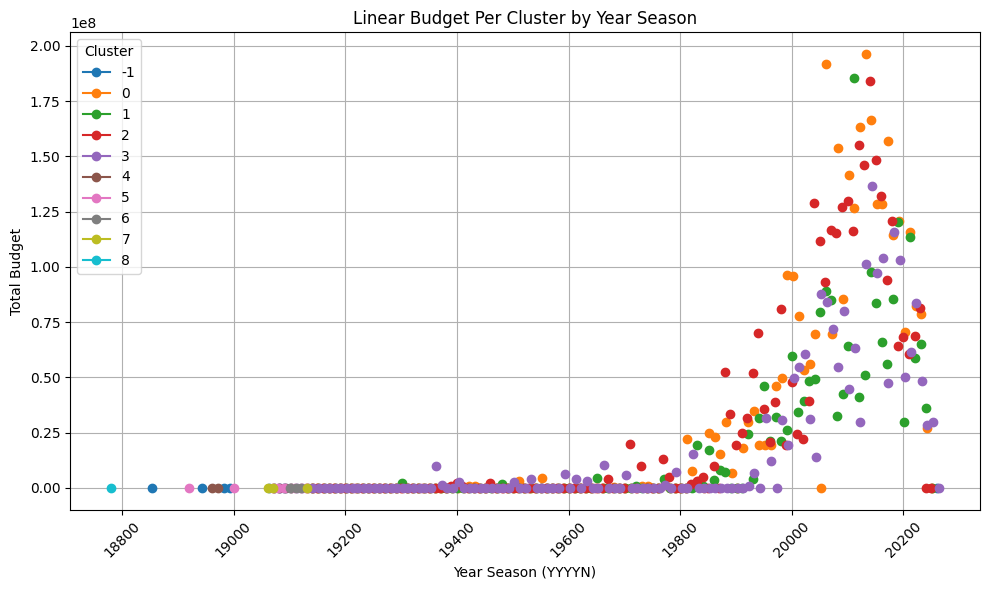

Model 'dbscan0.2' saved to 'saved_models\dbscan0.2.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
14682,Tale of the Ark,"Fantasy, Animation","A child dreams of the Bible tale, reenacted by...",No Language,Short,Summer,Summer,4.500,0.0
1486,Fantasmagorie,Animation,"An animated film by French auteur Émile Cohl, ...",No Language,Short,Summer,Summer,6.611,0.0
7457,The Chinese Shadows,"Comedy, Animation",At the beginning of this film two women come o...,No Language,Short,Spring,Spring,5.000,0.0
35104,In the Land of Nod,Animation,Children play with their toys while Grandpa do...,English,Short,Spring,Spring,0.000,0.0
3329,L'Homme Machine,Animation,Animated stick drawings representing a man wal...,No Language,Short,Winter,Winter,4.696,0.0
39422,Urban Science: To Demonstrate How Spiders Fly,"Animation, Documentary",This charming short film is surprisingly techn...,"No Language, English",Short,Spring,Spring,0.000,0.0
10494,Un rêve au coin du feu,Animation,It is a short film made by Emile Reynaud,No Language,Short,Winter,Winter,3.333,0.0
14428,Le premier cigare,Animation,Unknown,No Language,Short,Summer,Summer,4.500,0.0
14628,TR's Arrival in Africa,"Comedy, Animation","African animals, including a lookout monkey, a...","English, No Language",Short,Summer,Summer,5.000,0.0
4984,Matches: An Appeal,Animation,A thirty-second long stop-motion animated piec...,No Language,Short,Winter,Winter,4.200,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,-1
2365,0.023256,1.000000,0,-1
2367,0.069767,0.333333,1,-1
3329,0.007752,1.000000,0,-1
3978,0.077519,0.333333,1,-1
4984,0.054264,1.000000,0,-1
5733,0.069767,0.333333,1,-1
5753,0.093023,0.333333,1,-1
5767,0.093023,0.666667,0,-1
6171,0.077519,0.333333,1,-1


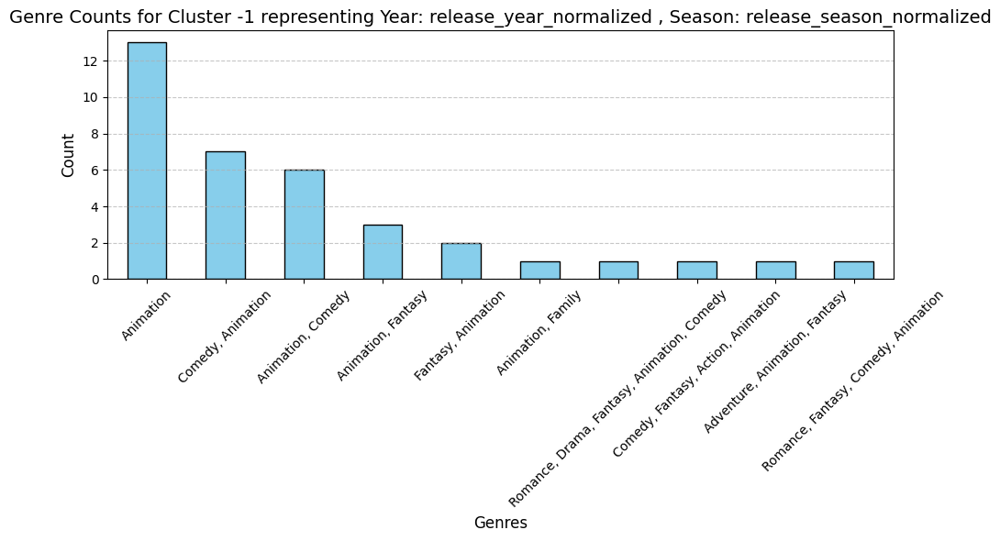


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
25106,New Happy Dad And Son 4：Perfect Dad,"Animation, Family",Unknown,Mandarin,Short,Summer,Summer,0.000,0.0
41217,Smølferne 6 - St. Smølf og dragen,"Animation, Adventure, Family",Unknown,Danish,Short,Summer,Summer,0.000,0.0
8735,Venus,"Animation, Comedy",An erotic comedy in claymation.,Danish,Short,Summer,Summer,5.000,0.0
29174,One More,"Animation, Comedy, Fantasy",During a warm summer day in the middle of the ...,Swedish,Short,Summer,Summer,0.000,0.0
46912,Chanting,Animation,"Channelling Lye and McLaren, de Bruyn continue...",English,Short,Summer,Summer,0.000,0.0
43821,Jù Rén,Animation,A seed is planted. A school of fish washes up ...,No Language,Short,Summer,Summer,0.000,0.0
25019,Kontraste,Animation,Unknown,German,Short,Summer,Summer,0.000,0.0
19151,VeggieTales: LarryBoy in Leggo my Ego!,Animation,Join LarryBoy in his battle against the Alchem...,English,Short,Summer,Summer,10.000,0.0
717,Barbie and the Secret Door,"Animation, Family",It's the ultimate fairytale musical! Barbie st...,English,Standard,Summer,Summer,7.163,0.0
38214,I'll Be Skiing Ya,"Animation, Comedy",Popeye and Olive are on a winter vacation in L...,English,Short,Summer,Summer,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


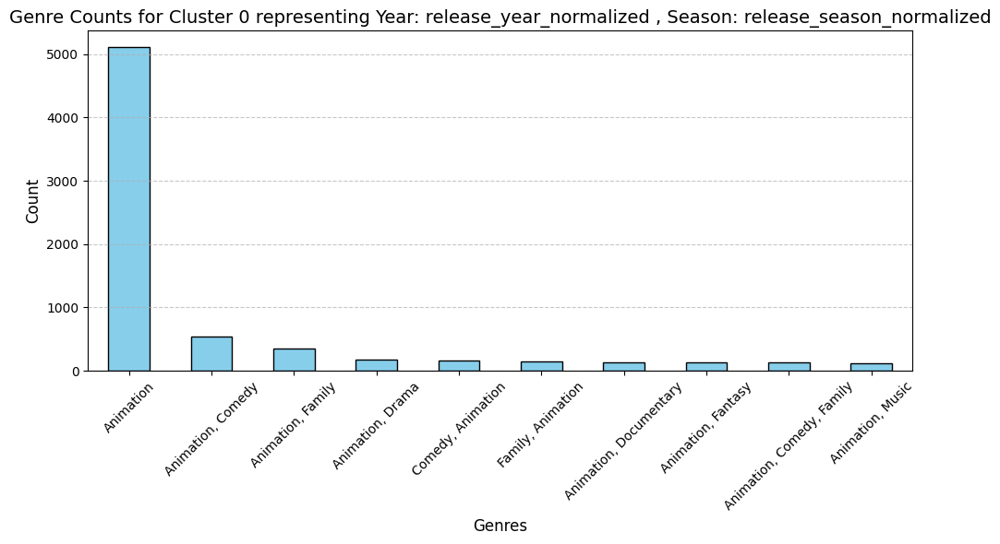


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
48836,The Hypnotist,Animation,After becoming hypnotised Felix decides to try...,No Language,Short,Spring,Spring,0.000,0.0
128,Over the Hedge,"Family, Comedy, Animation",A scheming raccoon fools a mismatched family o...,English,Standard,Spring,Spring,6.544,19546842.5
27442,Electric Sky,"Animation, Family",Small creatures are wandering through the fore...,French,Short,Spring,Spring,0.000,0.0
691,22 vs. Earth,"Family, Comedy, Fantasy, Animation","Set before the events of ‘Soul’, 22 refuses to...",English,Short,Spring,Spring,7.054,0.0
19808,One Minute Puberty,Animation,A great way to describe in a minute what it's ...,No Language,Short,Spring,Spring,5.000,0.0
41971,Musikbussen,Animation,Unknown,Swedish,Short,Spring,Spring,0.000,0.0
17269,What Rhymes With Toxic,Animation,There’s been another toxic spill. For the city...,English,Short,Spring,Spring,9.000,0.0
29865,42 1/2,Animation,"After the war, two friends are together again....",Bosnian,Short,Spring,Spring,0.000,0.0
11969,"Crosby, Columbo, and Vallee","Music, Animation, Comedy",An American Indian boy and girl sing and dance...,English,Short,Spring,Spring,4.200,0.0
29977,Composer Isaac Schwartz. Circus,Animation,Unknown,Russian,Short,Spring,Spring,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


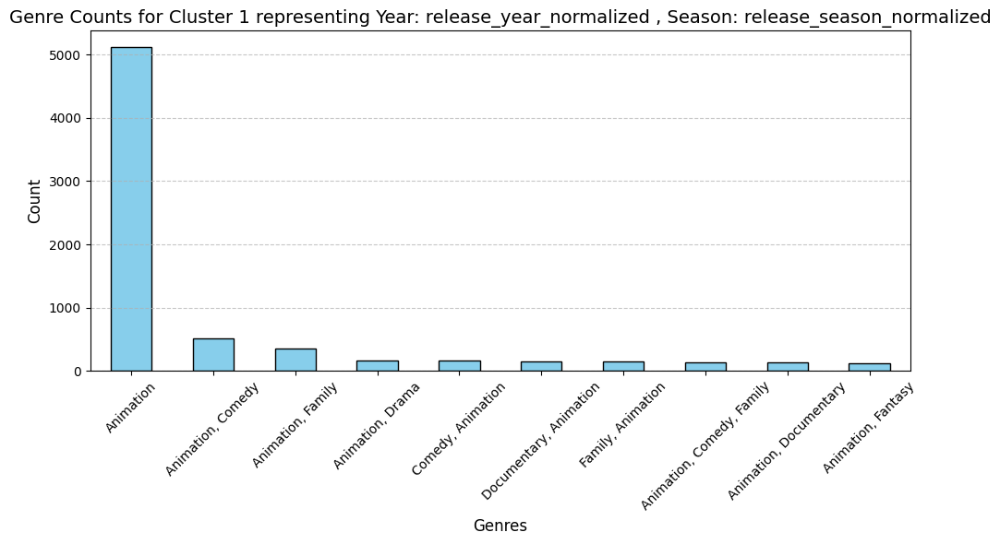


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
13773,Gallopin' Gals,Animation,Time for the big horse race. We drop in on the...,English,Short,Fall,Fall,4.000,0.0
23943,Big Cat,Animation,Sometimes I want to turn into a big cat…,No Language,Short,Fall,Fall,0.000,0.0
38825,Margarita,Animation,Unknown,Spanish,Short,Fall,Fall,0.000,0.0
1172,Welcome to the Club,"Animation, Comedy","Heart set on becoming a princess, Lisa Simpson...",English,Short,Fall,Fall,6.552,0.0
38130,One Funny Knight,Animation,"Herman rescues Princess Genevieve, who has bee...",English,Short,Fall,Fall,0.000,0.0
3186,Special Delivery,"Animation, Comedy, Crime",A hapless husband neglects to clear the icy wa...,English,Short,Fall,Fall,6.700,0.0
21113,Intersect,Animation,This is a visual investigation of the interfac...,No Language,Short,Fall,Fall,0.000,0.0
42675,Le storie che saremo,"Documentary, Animation",From amateur archive footage a 6 episodes film...,"German, Italian",Short,Fall,Fall,0.000,0.0
43756,No Biz Like Shoe Biz,Animation,"In a take-off of Cinderella, Loopy plays ""fair...",English,Short,Fall,Fall,0.000,0.0
36101,Beauty and the Beast,"TV Movie, Animation, Family","In order to save the life of her father, Beaut...",English,Standard,Fall,Fall,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


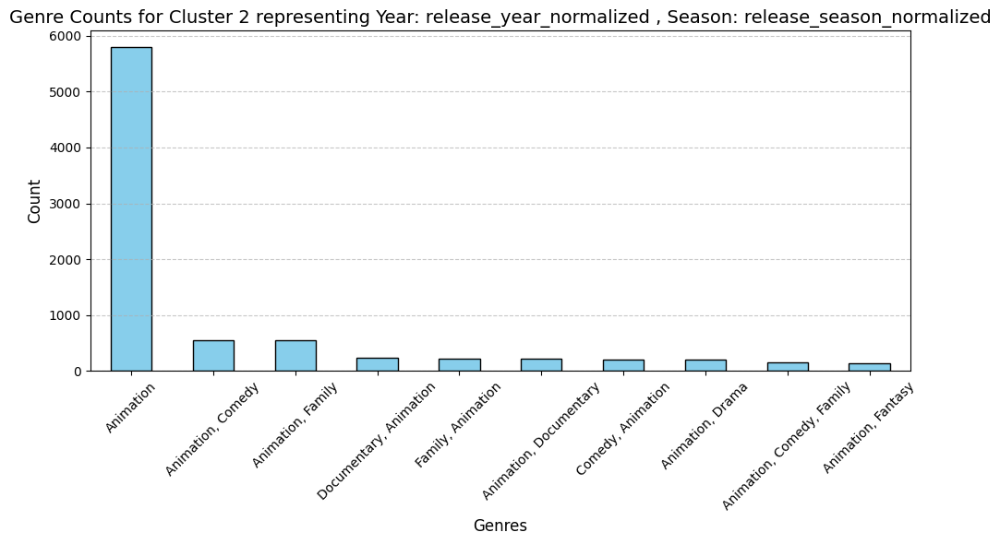


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
34694,Puerta del tiempo,"Family, Animation, Adventure, Science Fiction",Unknown,Spanish,Standard,Winter,Winter,0.0,0.0
39624,Frightday the 13th,Animation,There's good boos tonight: Frightday the 13th....,English,Short,Winter,Winter,0.0,0.0
39843,Rodeo Dough,Animation,This was a Krazy Kat cartoon made for Charles ...,English,Short,Winter,Winter,0.0,0.0
26941,El Tartufo de Hidalgo,Animation,Unknown,Spanish,Short,Winter,Winter,0.0,0.0
15878,Wuzzles: Bulls of a Feather,Animation,The first episode of the television series THE...,English,Short,Winter,Winter,6.0,0.0
43702,The Witch in the Cherry Tree,"Family, Animation",One damp dull day David's mother is baking cak...,English,Short,Winter,Winter,0.0,0.0
21850,Tigre,"Animation, Music",Tigre is an experimental film with animation a...,No Language,Short,Winter,Winter,0.0,0.0
41470,Fiddlin' Around,Animation,A Noveltoon cartoon.,English,Short,Winter,Winter,0.0,0.0
43021,0,Animation,"How can one film nothing, how to depict infini...",No Language,Short,Winter,Winter,0.0,0.0
23698,Florêncio,Animation,Unknown,No Language,Short,Winter,Winter,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


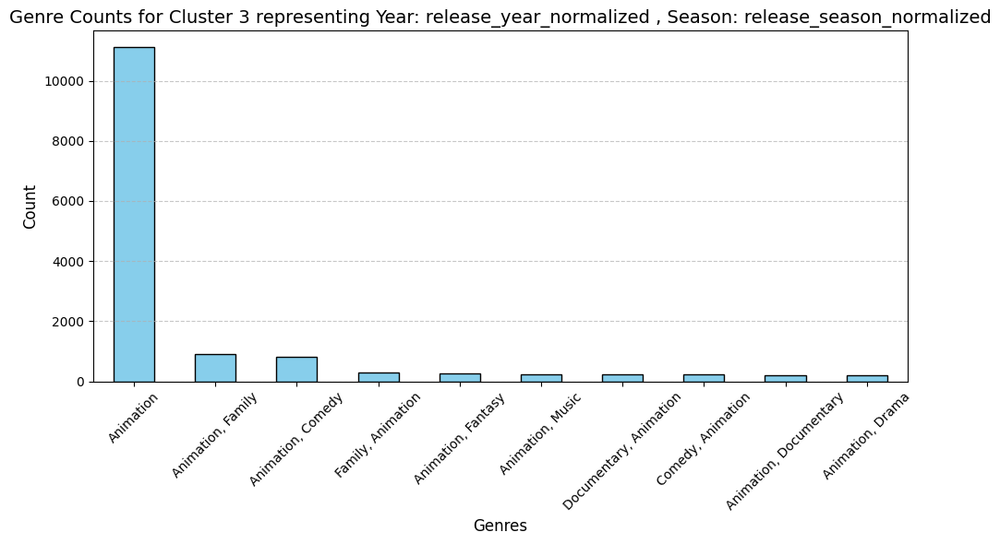


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
1992,The Enchanted Drawing,"Animation, Comedy, Fantasy",A cartoonist defies reality when he draws obje...,No Language,Short,Fall,Fall,6.423,0.0
17842,Animated Cotton,Animation,It might not take you long to cotton on to the...,No Language,Short,Fall,Fall,4.000,0.0
9882,The Magic Hoop,"Fantasy, Animation",Émile Cohl mixes live-action and stop-motion a...,No Language,Short,Fall,Fall,4.800,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.400,0.0
6830,Affairs of the Heart,Animation,A near-abstract animation telling a simple rom...,No Language,Short,Fall,Fall,5.500,0.0
6252,Clown and His Dogs,Animation,Short film of 300 individually painted images.,No Language,Short,Fall,Fall,4.700,0.0
1672,The Cameraman's Revenge,Animation,A jilted husband takes his revenge by filming ...,No Language,Short,Fall,Fall,7.198,0.0
46889,He Loves to Be Amused,"Animation, Comedy",Papa Newlywed and his lovely wife looked up at...,No Language,Short,Fall,Fall,0.000,0.0
5138,Drama at the Puppets' House,"Comedy, Animation, Crime",For a short comedy of rare merit this subject ...,No Language,Short,Fall,Fall,6.200,0.0
2248,The Electric Hotel,"Fantasy, Animation",An enthusiastic young couple is astounded with...,No Language,Short,Fall,Fall,6.100,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.0,1,4
1716,0.015504,0.0,1,4
1992,0.062016,0.0,1,4
2248,0.085271,0.0,1,4
5010,0.085271,0.0,1,4
5138,0.085271,0.0,1,4
6252,0.015504,0.0,1,4
6767,0.015504,0.0,1,4
6830,0.093023,0.0,1,4
8477,0.085271,0.0,1,4


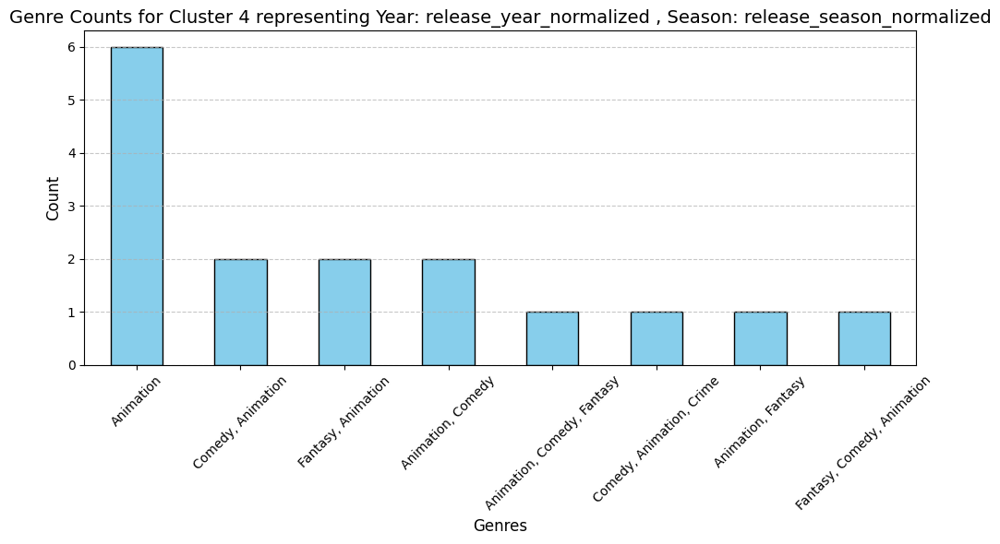


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
19101,The Master of a Fashionable Game,"Fantasy, Comedy, Animation",The film presents a drawing room meeting of en...,No Language,Short,Spring,Spring,3.000,0.0
13217,The Mysterious Fine Arts,Animation,In this film several objects make paintings on...,No Language,Short,Spring,Spring,5.000,0.0
6761,The Beautiful Leukanida,"Drama, Animation",Two insects fight over the hand of a beautiful...,No Language,Short,Spring,Spring,6.200,0.0
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.600,0.0
20582,The Strong Arm Squad of the Future,Animation,The Strong Arm Squad of the Future originated ...,No Language,Short,Spring,Spring,6.000,0.0
20552,"Petites causes, grands effets!","Drama, Animation",French animation from O'Galop is a pretty inte...,No Language,Short,Spring,Spring,4.000,0.0
12593,Les Métamorphoses Comiques,Animation,An animation where real life objects turn into...,French,Short,Spring,Spring,5.500,0.0
13862,Floral Frameworks,Animation,There have been numerous studies of plants and...,No Language,Short,Spring,Spring,4.500,0.0
1990,Little Nemo,"Animation, Comedy","Cartoon figures announce, via comic strip ball...",English,Short,Spring,Spring,6.273,0.0
10366,Le circuit de l'alcool,Animation,This one is another warning to the French publ...,No Language,Short,Spring,Spring,5.500,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,5
3598,0.100775,0.333333,1,5
6761,0.116279,0.333333,1,5
10366,0.116279,0.333333,1,5
12281,0.100775,0.333333,1,5
12282,0.100775,0.333333,1,5
12593,0.116279,0.333333,1,5
13208,0.100775,0.333333,1,5
13213,0.100775,0.333333,1,5
13217,0.100775,0.333333,1,5


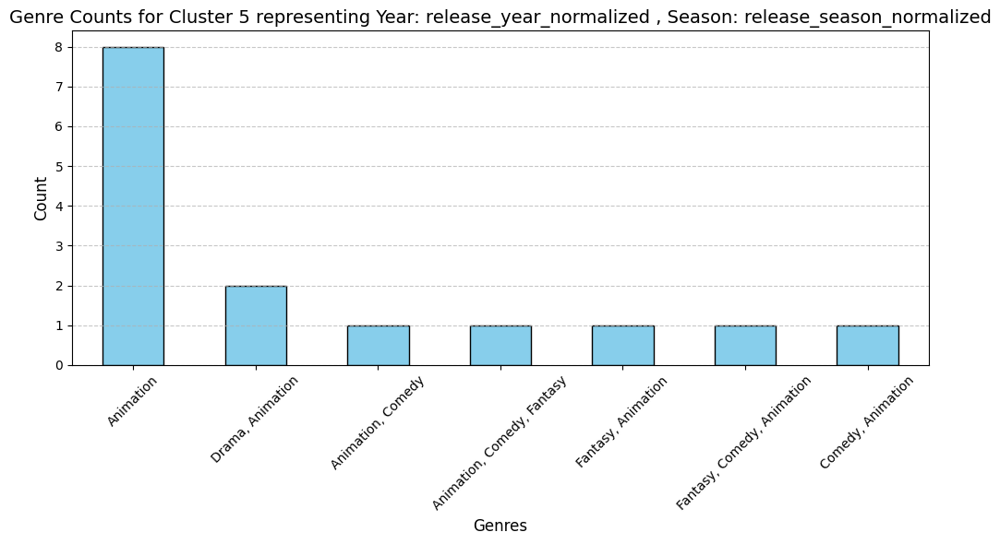


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9761,Le Jeu du Volant,Animation,Praxinoscope animations of a girl in a blue dr...,No Language,Short,Spring,Spring,4.500,0.0
9772,Le Steeple-chase,Animation,Praxinoscope animation of an equestrian riding...,No Language,Short,Spring,Spring,4.250,0.0
9755,Les Papillons,Animation,Praxinoscope animation of a butterfly flutteri...,No Language,Short,Spring,Spring,4.000,0.0
9770,La Nageuse,Animation,Praxinoscope animation of a swimmer. Series 2...,No Language,Short,Spring,Spring,3.750,0.0
11561,L'Hercule,Animation,Praxinoscope animation of man jugging a iron. ...,No Language,Short,Spring,Spring,3.000,0.0
9759,Le Fumeur,Animation,Praxinoscope animation of a man sitting backwa...,No Language,Short,Spring,Spring,4.250,0.0
13143,Le Moulin à Eau,Animation,Praxinoscope animation of the water mill. Seri...,No Language,Short,Spring,Spring,3.500,0.0
9756,Le Trapèze,Animation,Praxinoscope animation of a man spinning aroun...,No Language,Short,Spring,Spring,5.000,0.0
7018,"Zim, Boum, Boum",Animation,Praxinoscope animation of a green-suited boy w...,No Language,Short,Spring,Spring,4.125,0.0
9757,La Charmeuse,Animation,Praxinoscope animation of a girl charming a fl...,No Language,Short,Spring,Spring,5.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,6
4592,0.0,0.333333,1,6
7015,0.0,0.333333,1,6
7018,0.0,0.333333,1,6
8487,0.0,0.333333,1,6
8508,0.0,0.333333,1,6
9755,0.0,0.333333,1,6
9756,0.0,0.333333,1,6
9757,0.0,0.333333,1,6
9758,0.0,0.333333,1,6


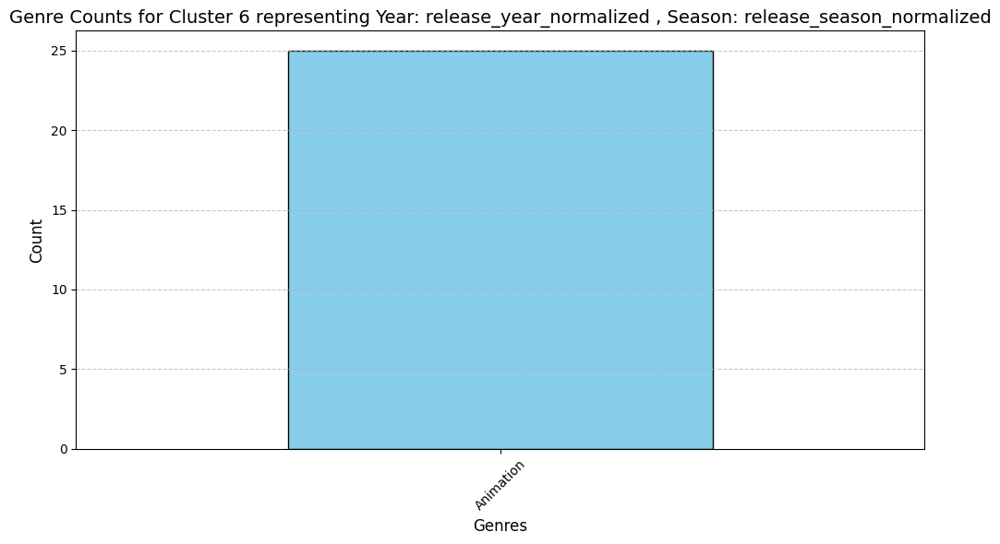

DBSCAN with eps=0.2, min_samples=15 | Silhouette Score: 0.836, DB Index: 1.923 ,clusters : 8
Plot Title: DBSCAN Clustering on year_season_features (eps=0.2, min_samples=15)
Explained Variance Ratios (3 Components): [0.76853076 0.19813845 0.02631835]
Total Explained Variance: 0.9929875638929571


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


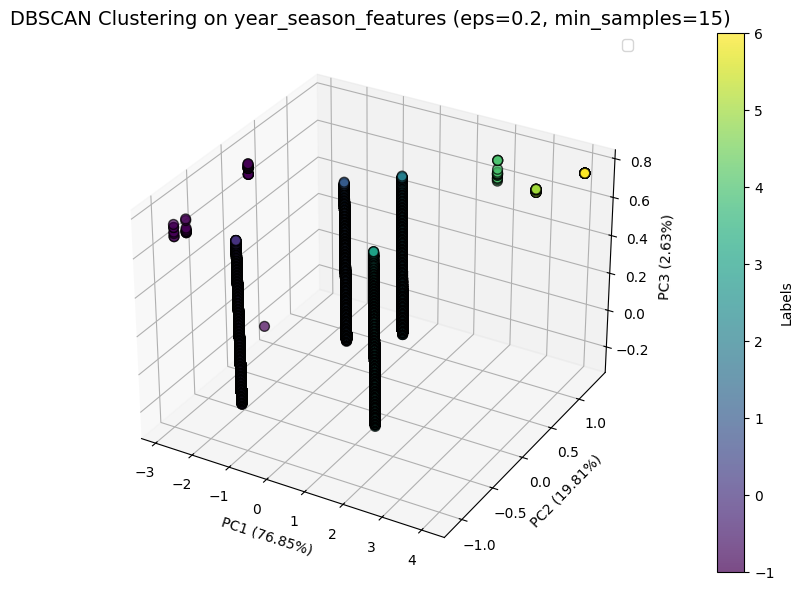

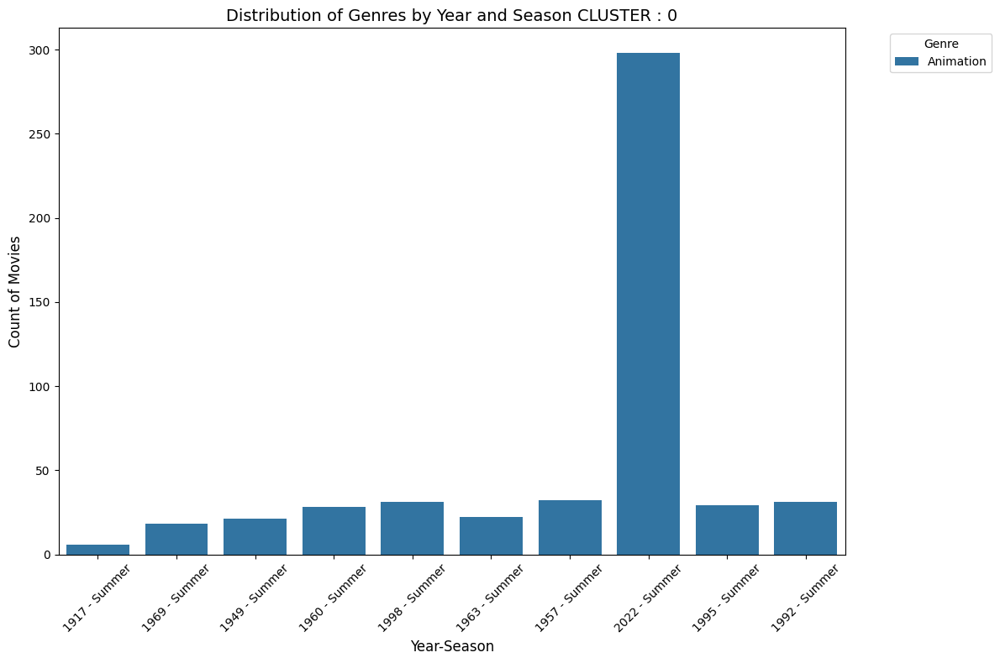

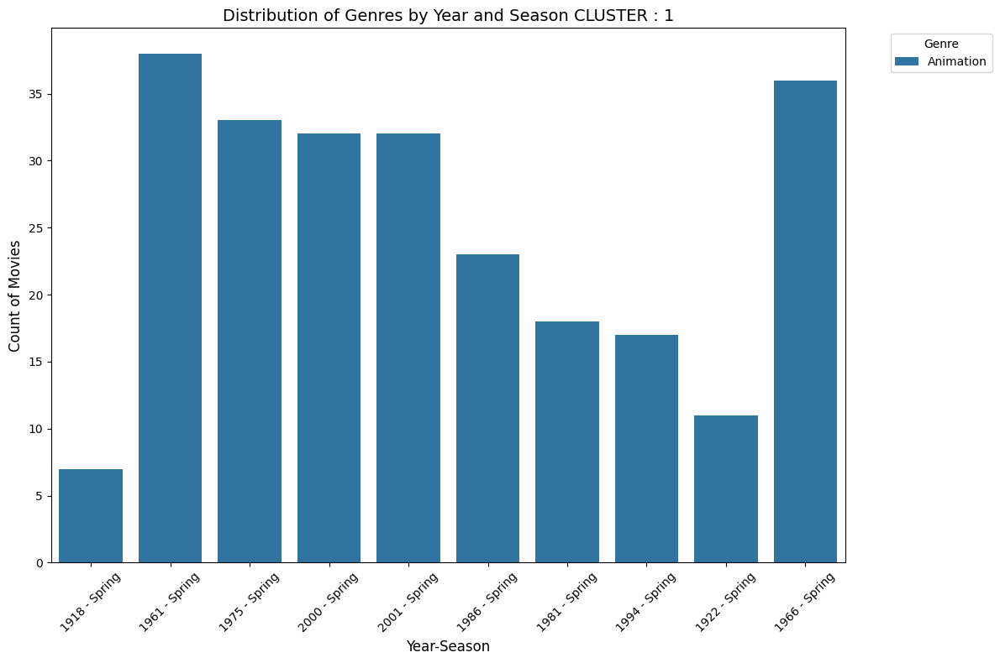

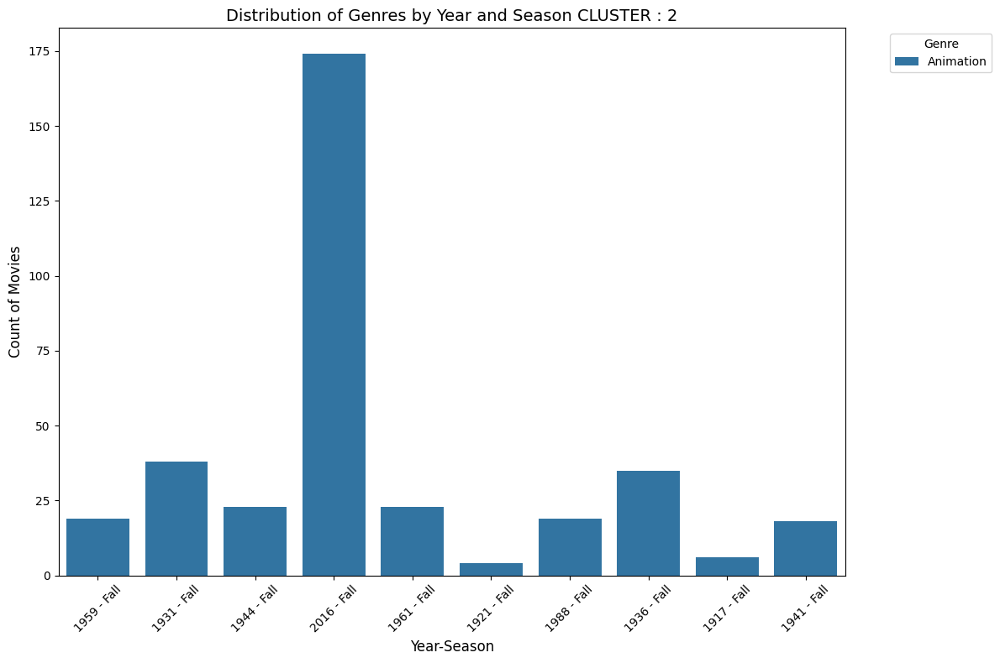

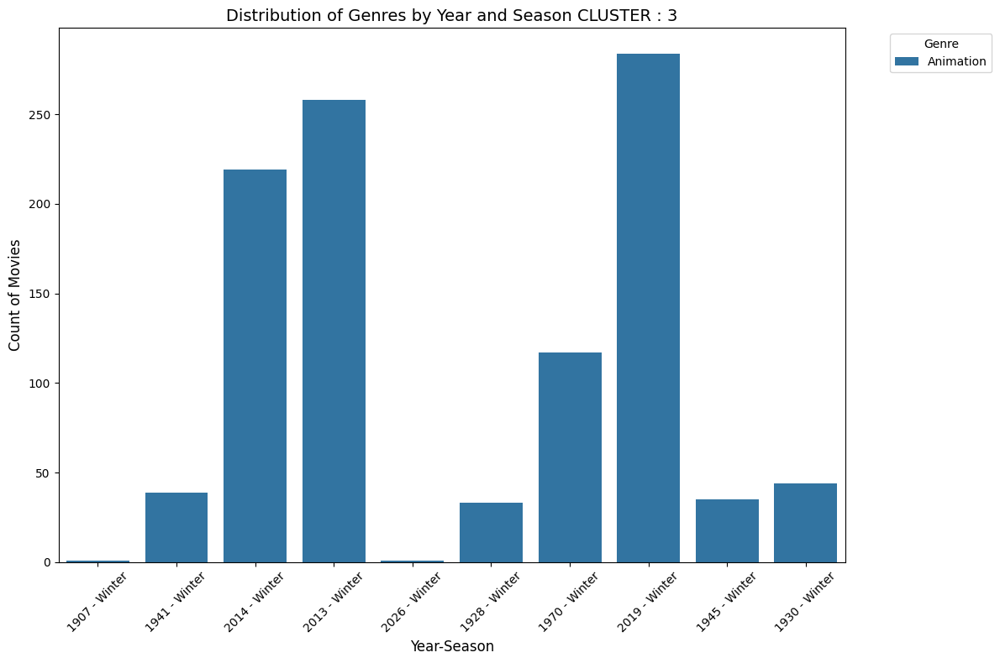

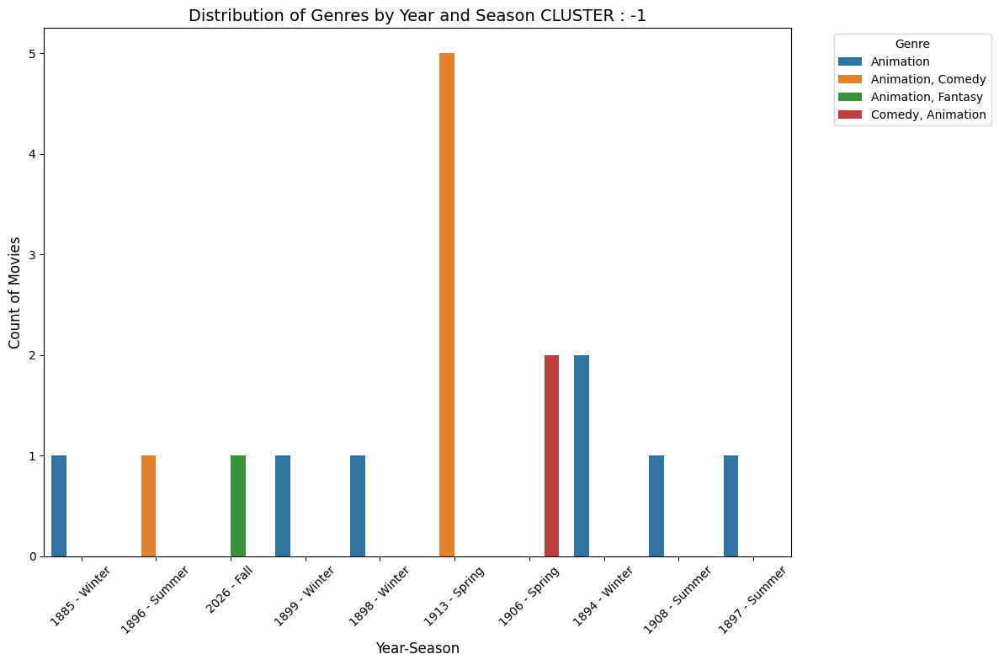

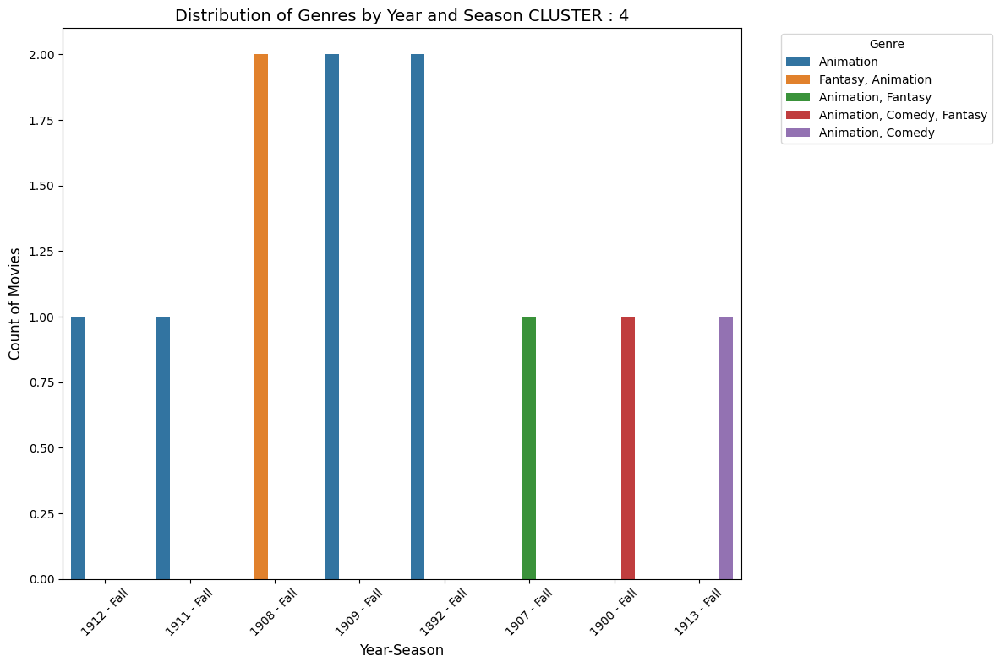

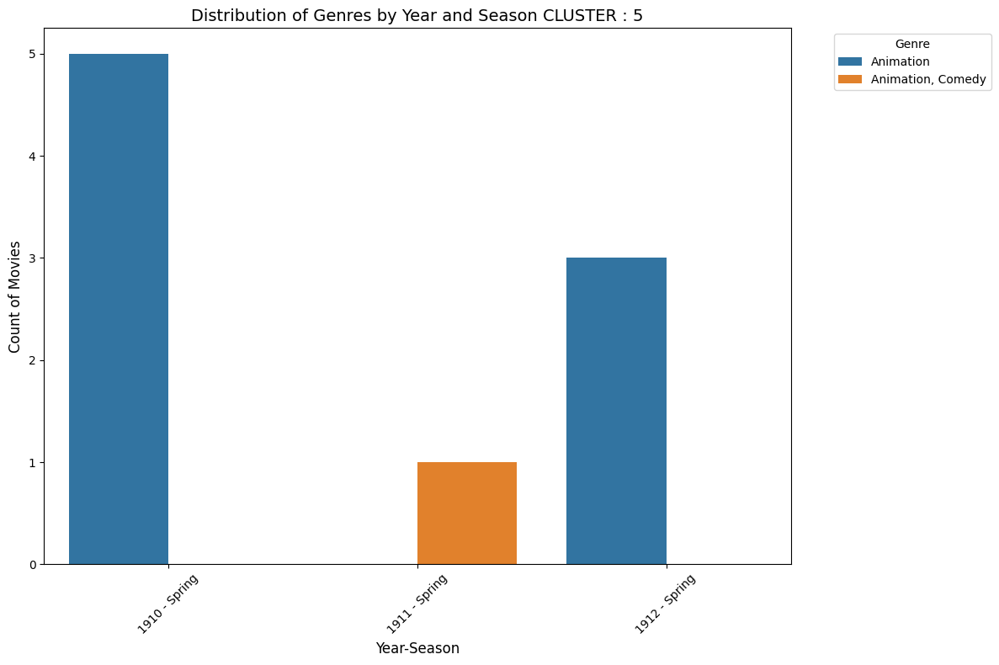

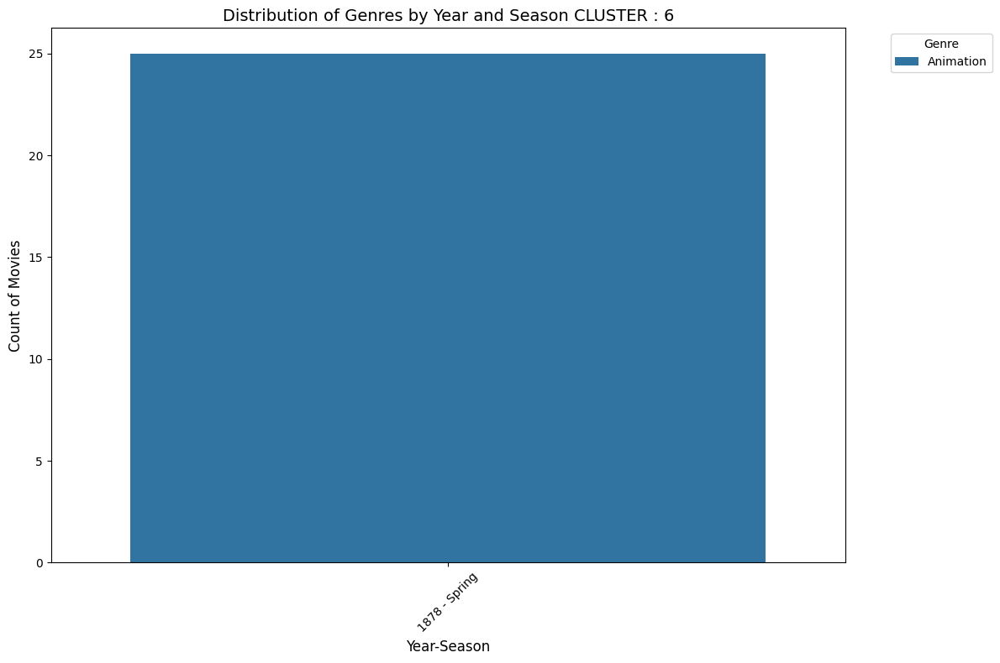

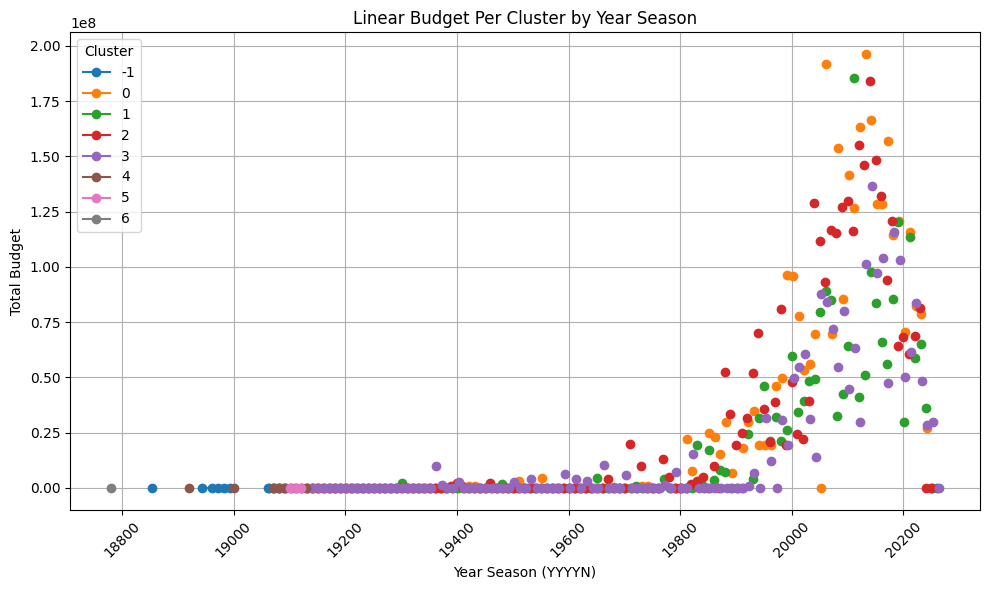

Model 'dbscan0.37' saved to 'saved_models\dbscan0.37.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
22645,Untitled Fire Lord Zuko Project,"Animation, Fantasy",A spin-off of the animated series Avatar: The ...,No Language,Short,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
22645,1.0,0.0,1,-1


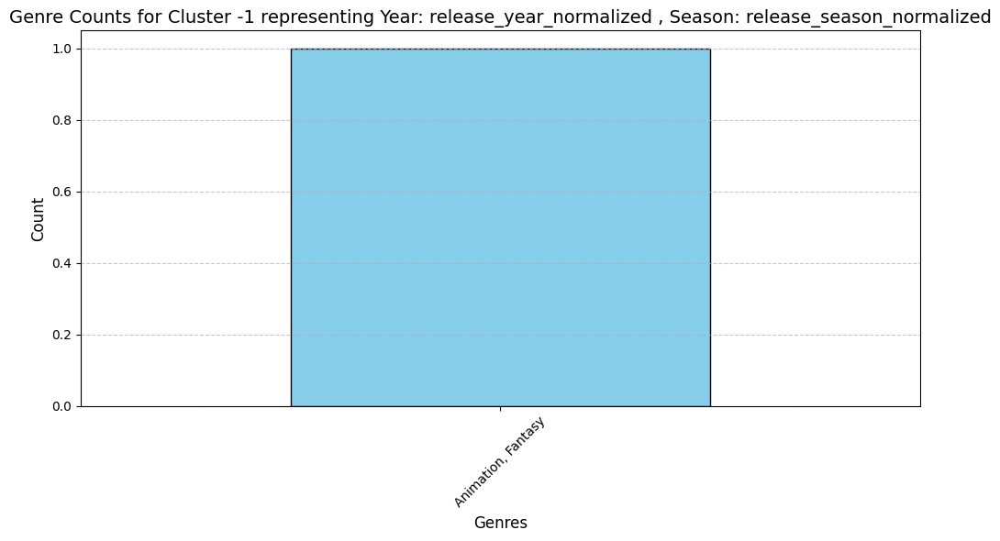


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
7179,Magical Girl Lyrical Nanoha: The Movie 2nd A's,"Drama, Animation, Action, Science Fiction",Six months after the events of Magical Girl Ly...,Japanese,Short,Summer,Summer,6.900,0.0
383,Presto,"Animation, Family, Comedy",Dignity. Poise. Mystery. We expect nothing les...,No Language,Short,Summer,Summer,7.784,0.0
25728,El gigante bueno,Animation,Animated short film that narrates a tree's bio...,Spanish,Short,Summer,Summer,0.000,0.0
9176,Cyborg 009,"Action, Science Fiction, Animation",Unknown,Japanese,Standard,Summer,Summer,5.200,0.0
40220,Алдар-Косе,Animation,Unknown,No Language,Short,Summer,Summer,0.000,0.0
16905,"Wait, Wait, Don't Kill Me","Horror, Comedy, Science Fiction, Animation, Th...","On the hottest day of the year, an unknown vir...",English,Short,Summer,Summer,10.000,0.0
38549,Baribari Densetsu (Movie),"Animation, Action, Drama",Gun Kyoma is an extremely fast 17-year-old bik...,Japanese,Standard,Summer,Summer,0.000,0.0
9199,Skywhales,"Animation, Science Fiction, Drama",A race of aliens living on a floating island p...,English,Short,Summer,Summer,5.600,0.0
1315,Pokémon the Movie: Genesect and the Legend Awa...,"Action, Adventure, Animation, Family",A group of five Genesect have invaded the big ...,Japanese,Standard,Summer,Summer,6.439,0.0
44086,Free and Beautiful,Animation,A poetic animated short film illustrating the ...,No Language,Short,Summer,Summer,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


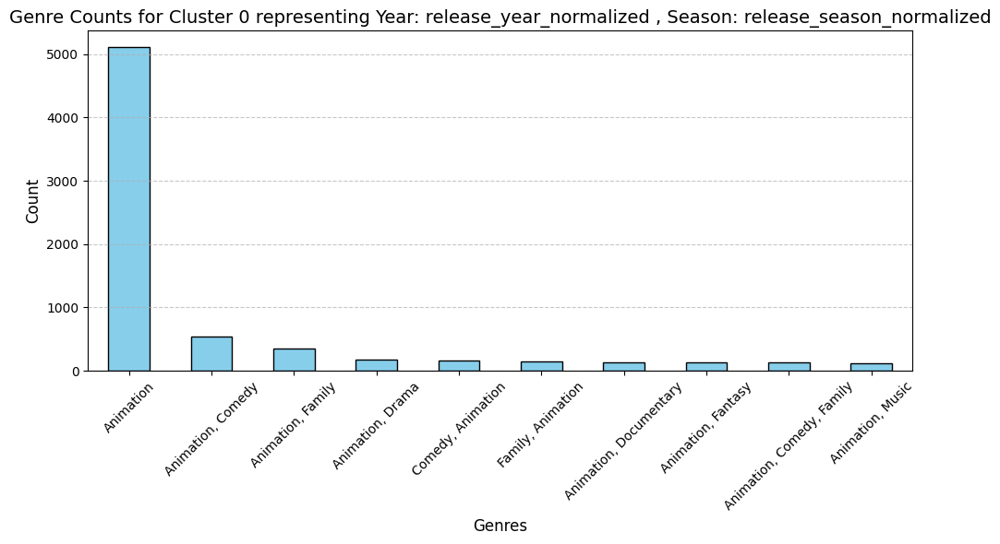


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9777,Dig That Dog,Animation,The story of Percy P. Pettipoint who purchases...,English,Short,Spring,Spring,6.200,0.0
16307,Momentum,"Animation, Comedy","For some it is just an ordinary party snack, b...",English,Short,Spring,Spring,2.000,0.0
39452,Hupikék törpikék 10: A komisz trükkök doboza,Animation,Unknown,No Language,Short,Spring,Spring,0.000,0.0
3035,Tripping the Rift: The Movie,"Animation, Comedy, Science Fiction",What begins for Chode and crew as a routine mi...,English,Standard,Spring,Spring,5.500,0.0
4816,City Hunter Special: The Death of Vicious Crim...,"Animation, Action, Comedy","City Hunter, Saeba Ryo, after months of idlene...",Japanese,Short,Spring,Spring,7.300,0.0
38320,Sliphorn King of Polaroo,Animation,This Swing Symphony cartoon from Walter Lantz ...,English,Short,Spring,Spring,0.000,0.0
44863,Shizunde Iku yo,"Animation, Music",A short animation by Izumi Tanaka,No Language,Short,Spring,Spring,0.000,0.0
12578,College Capers,"Music, Comedy, Animation",The Van Beuren animals singing their way throu...,English,Short,Spring,Spring,5.000,0.0
22171,"Keď nie, tak nie!","Animation, Comedy",Unknown,No Language,Short,Spring,Spring,0.000,0.0
162,The Lorax,"Animation, Family",A 12-year-old boy searches for the one thing t...,English,Standard,Spring,Spring,6.496,19546842.5


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


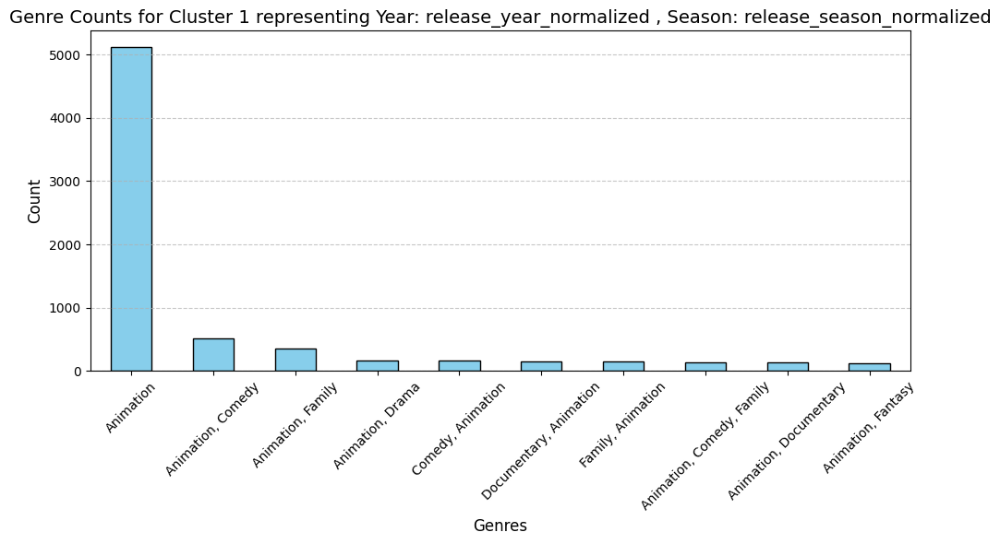


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
46479,Meet My Family,Animation,"Today is a great day, Marvin will finally meet...",French,Short,Fall,Fall,0.0,0.0
23872,Dinner,"Animation, Documentary",What are one week films? They're an assignment...,"English, Japanese",Short,Fall,Fall,0.0,0.0
21340,Looking For Santa,"Animation, Family, Adventure","William, eight years old, is used to getting a...",French,Short,Fall,Fall,6.0,0.0
34173,She Collage,Animation,She Collage is part response to the work of So...,English,Short,Fall,Fall,0.0,0.0
15602,Volt,"Action, Animation",Upcoming superhero animation series.,Bengali,Short,Fall,Fall,7.5,0.0
31067,Burnout,Animation,Unknown,Spanish,Short,Fall,Fall,0.0,0.0
20323,The Rocky Road to Ruin,Animation,"The hero, Handsome Harry, is poor, honest, har...",No Language,Short,Fall,Fall,2.0,0.0
24691,Dream Flight,Animation,Vanya grows up in a truly loving family - he h...,Russian,Short,Fall,Fall,0.0,0.0
38059,Jazztime Tale,"Animation, Family","Family - Set in Harlem in 1919, two girls - on...",English,Short,Fall,Fall,0.0,0.0
21583,To The Bright Side,"Animation, Drama, Comedy",A seven-part anthology film that probes the th...,Mandarin,Standard,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


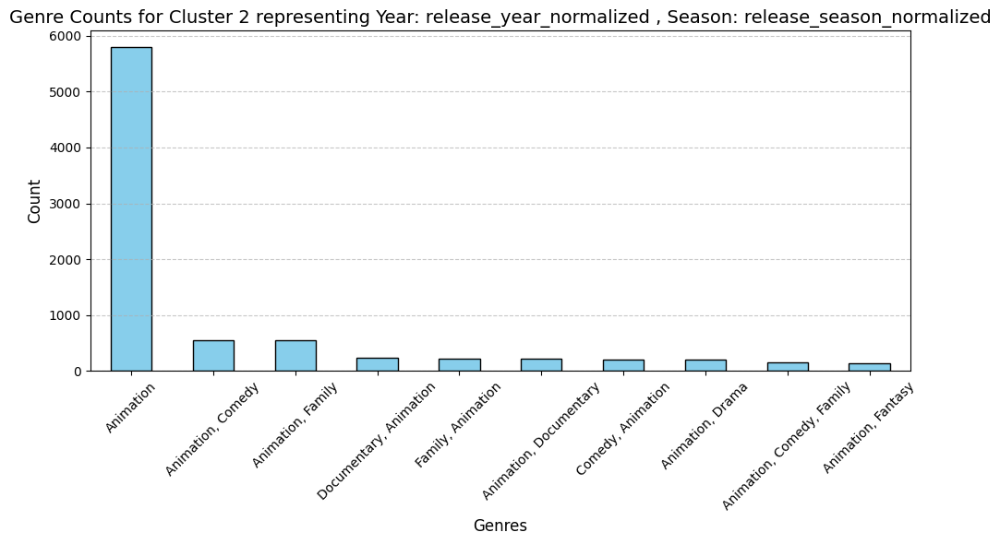


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
26025,Drunken Cherries,Animation,A curious rooster learns the horrors of alcoho...,Russian,Short,Winter,Winter,0.0,0.0
46303,Clown's Necklace,Animation,"I don't even know what this is, a girl wear's ...",No Language,Short,Winter,Winter,0.0,0.0
10001,The Apple Incident,Animation,"Giant apples appear in a city, and when people...",Japanese,Short,Winter,Winter,5.5,0.0
20199,Abductees,"Documentary, Animation",Five tales of alien abduction told using a wid...,No Language,Short,Winter,Winter,7.0,0.0
37438,Metamorpheus,Animation,"Orpheus reconsidered, starting from animations...",Czech,Short,Winter,Winter,0.0,0.0
23649,Prząśniczka,"Animation, Music",Unknown,No Language,Short,Winter,Winter,0.0,0.0
17215,Pets 2,"Animation, Comedy, Family",The hilarious trio of animal pals snuggles up ...,English,Standard,Winter,Winter,1.0,0.0
15768,Ho Down,Animation,An enjoyable animated film done by drawing dir...,English,Short,Winter,Winter,6.0,0.0
17437,Espresso Depresso,Animation,A coffee house calamity involving all types of...,No Language,Short,Winter,Winter,4.0,0.0
30920,"Odd Oddballs, or: Jan Brzechwa’s The Tale of P...",Animation,"The princes and princesses, according to the w...",Polish,Short,Winter,Winter,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


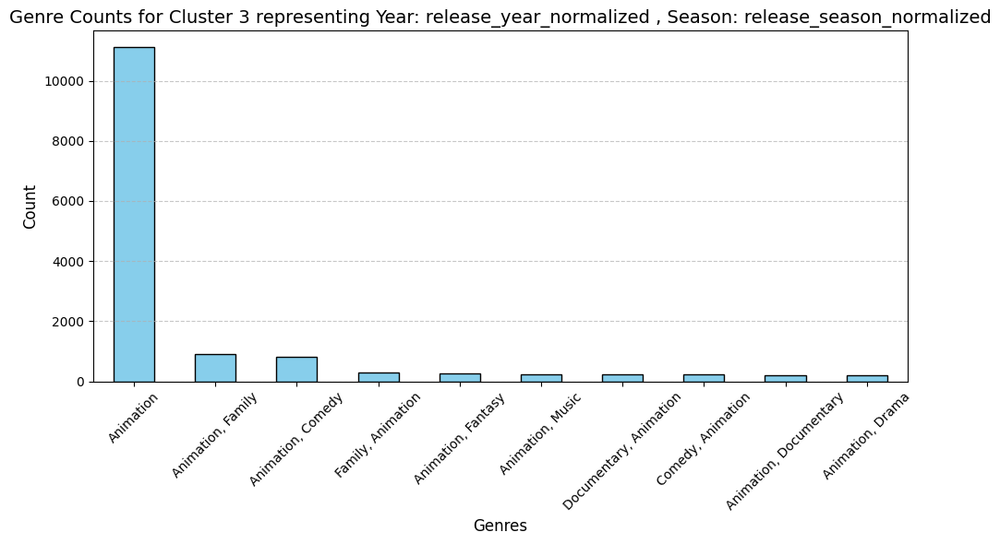


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
24559,Buffon Dance,Animation,Unknown,No Language,Short,Winter,Winter,0.000,0.0
10898,Guillaume Tell,"Animation, Comedy",Unknown,No Language,Short,Summer,Summer,5.000,0.0
3329,L'Homme Machine,Animation,Animated stick drawings representing a man wal...,No Language,Short,Winter,Winter,4.696,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
14682,Tale of the Ark,"Fantasy, Animation","A child dreams of the Bible tale, reenacted by...",No Language,Short,Summer,Summer,4.500,0.0
14428,Le premier cigare,Animation,Unknown,No Language,Short,Summer,Summer,4.500,0.0
5767,The Happy Microbes,"Comedy, Animation",A scientist has acquired a microscope and is s...,No Language,Short,Summer,Summer,4.900,0.0
13274,Comic Mutations,Animation,An old and learned doctor discovers the secret...,No Language,Short,Summer,Summer,5.000,0.0
8113,Lightning Sketches,"Comedy, Animation",An illustrator draws some sketches at lightnin...,No Language,Short,Summer,Summer,3.800,0.0
1486,Fantasmagorie,Animation,"An animated film by French auteur Émile Cohl, ...",No Language,Short,Summer,Summer,6.611,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,4
2365,0.023256,1.000000,0,4
3329,0.007752,1.000000,0,4
4984,0.054264,1.000000,0,4
5767,0.093023,0.666667,0,4
8113,0.077519,0.666667,0,4
9418,0.100775,0.666667,0,4
10494,0.023256,1.000000,0,4
10898,0.031008,0.666667,0,4
13271,0.100775,0.666667,0,4


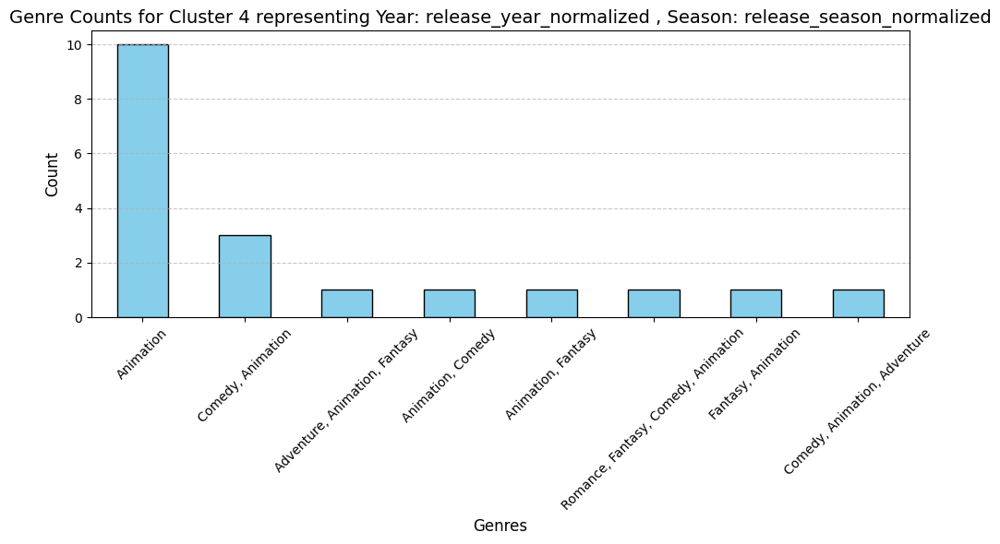


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
17842,Animated Cotton,Animation,It might not take you long to cotton on to the...,No Language,Short,Fall,Fall,4.000,0.0
5010,The Puppet's Nightmare,"Comedy, Animation","A nightmare, sketched out upon a living blackb...",No Language,Short,Fall,Fall,5.800,0.0
19961,Rosalie and Her Phonograph,"Fantasy, Comedy, Animation",A jolly housekeeper brings new meaning to the ...,French,Short,Fall,Fall,4.000,0.0
1992,The Enchanted Drawing,"Animation, Comedy, Fantasy",A cartoonist defies reality when he draws obje...,No Language,Short,Fall,Fall,6.423,0.0
6252,Clown and His Dogs,Animation,Short film of 300 individually painted images.,No Language,Short,Fall,Fall,4.700,0.0
6830,Affairs of the Heart,Animation,A near-abstract animation telling a simple rom...,No Language,Short,Fall,Fall,5.500,0.0
21814,Road Hogs in Toyland,Animation,It's a stop-motion film of various toy cars en...,English,Short,Fall,Fall,0.000,0.0
6767,A Good Beer,Animation,Unknown,No Language,Short,Fall,Fall,4.000,0.0
1716,Poor Pierrot,"Comedy, Animation","One night, Arlequin comes to see his lover Col...",French,Short,Fall,Fall,6.029,0.0
12679,The Sorcerer's Scissors,"Animation, Fantasy","A mix of spectacle, animation and dance, the f...",No Language,Short,Fall,Fall,7.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.0,1,5
1716,0.015504,0.0,1,5
1992,0.062016,0.0,1,5
2248,0.085271,0.0,1,5
5010,0.085271,0.0,1,5
5138,0.085271,0.0,1,5
6252,0.015504,0.0,1,5
6767,0.015504,0.0,1,5
6830,0.093023,0.0,1,5
8477,0.085271,0.0,1,5


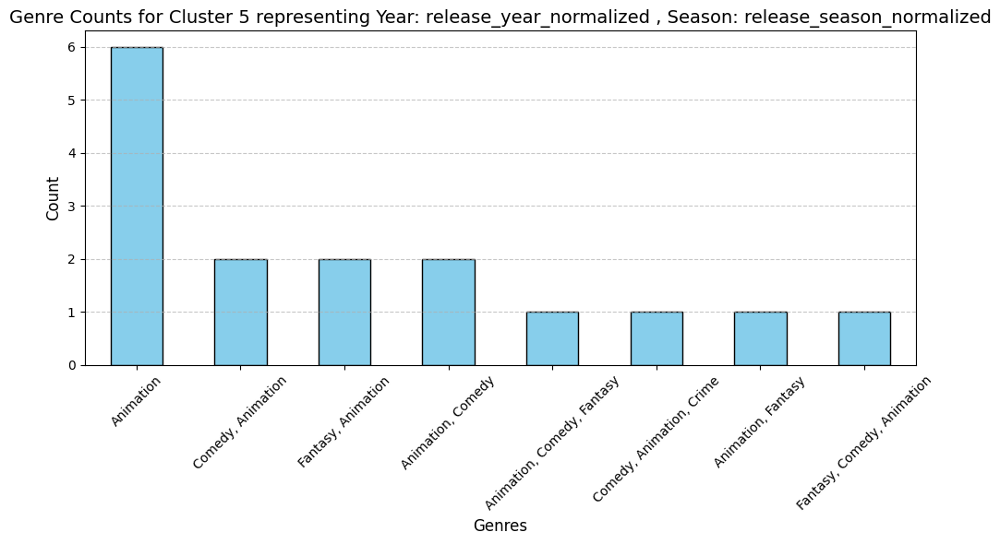


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
12593,Les Métamorphoses Comiques,Animation,An animation where real life objects turn into...,French,Short,Spring,Spring,5.5,0.0
13213,Art's Infancy,Animation,A animation film from Émile Cohl about a painter.,No Language,Short,Spring,Spring,5.5,0.0
13217,The Mysterious Fine Arts,Animation,In this film several objects make paintings on...,No Language,Short,Spring,Spring,5.0,0.0
13208,Petit Chantecler,Animation,Émile Cohl uses stop-motion animation to tell ...,No Language,Short,Spring,Spring,5.5,0.0
35468,Hänschens Soldaten,"Comedy, Animation",A young boy in a sailor suit plays with three ...,No Language,Short,Spring,Spring,0.0,0.0
13862,Floral Frameworks,Animation,There have been numerous studies of plants and...,No Language,Short,Spring,Spring,4.5,0.0
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.6,0.0
6761,The Beautiful Leukanida,"Drama, Animation",Two insects fight over the hand of a beautiful...,No Language,Short,Spring,Spring,6.2,0.0
12282,The Neo-Impressionist Painter,Animation,A painter is seen in his studio with his model...,No Language,Short,Spring,Spring,5.5,0.0
19101,The Master of a Fashionable Game,"Fantasy, Comedy, Animation",The film presents a drawing room meeting of en...,No Language,Short,Spring,Spring,3.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,6
3598,0.100775,0.333333,1,6
6761,0.116279,0.333333,1,6
10366,0.116279,0.333333,1,6
12281,0.100775,0.333333,1,6
12282,0.100775,0.333333,1,6
12593,0.116279,0.333333,1,6
13208,0.100775,0.333333,1,6
13213,0.100775,0.333333,1,6
13217,0.100775,0.333333,1,6


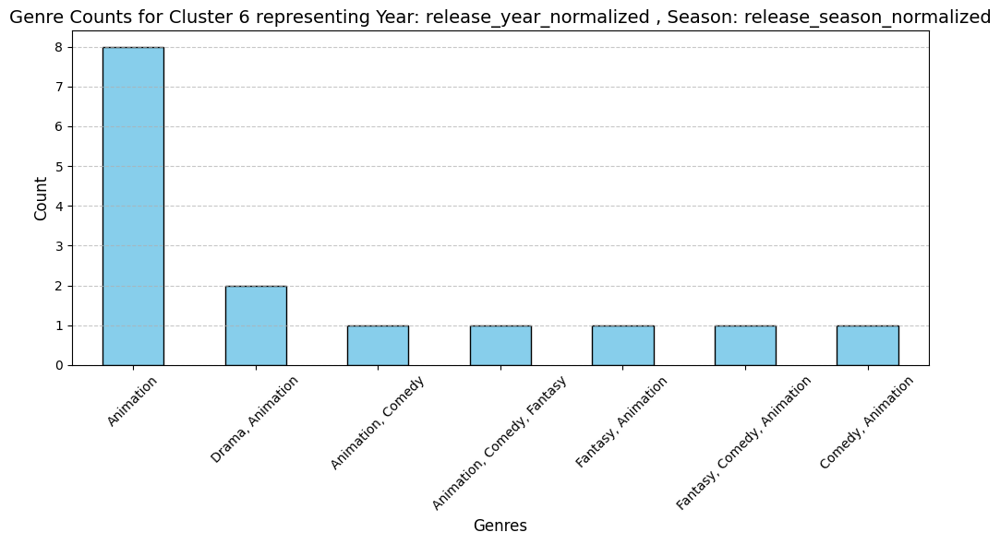


Cluster 7:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
10676,Matrimonial Shoes,Animation,A film about cupid shoes by Émile Cohl.,No Language,Short,Spring,Spring,5.800,0.0
5753,Spanish Clair de Lune,"Romance, Drama, Fantasy, Animation, Comedy",Two lovers perform a fandango dance. A jealous...,No Language,Short,Spring,Spring,5.700,0.0
35104,In the Land of Nod,Animation,Children play with their toys while Grandpa do...,English,Short,Spring,Spring,0.000,0.0
46884,Poor Little Chap He Was Only Dreaming,"Animation, Comedy","When ""Snookums"" started to cry, Da-da thought ...",No Language,Short,Spring,Spring,0.000,0.0
5733,Miniature Theatre,"Comedy, Animation","Three young children set up a table, and on th...",No Language,Short,Spring,Spring,5.000,0.0
2367,Humorous Phases of Funny Faces,"Comedy, Animation",A cartoonist draws faces and figures on a blac...,No Language,Short,Spring,Spring,5.819,0.0
3978,Katsudō Shashin,"Animation, Family",A boy in a cadet's uniform paints a statement ...,No Language,Short,Spring,Spring,5.909,0.0
13273,Monsieur Clown Among the Lilliputians,Animation,Stop-motion film from Émile Cohl has a clown w...,No Language,Short,Spring,Spring,4.500,0.0
6171,The Pumpkin Race,"Comedy, Fantasy, Action, Animation",Early slapstick short from Louis Feuillade inv...,No Language,Short,Spring,Spring,5.500,0.0
46882,Business Must Not Interfere,"Animation, Comedy",This time the trouble is with Snookums and the...,No Language,Short,Spring,Spring,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2367,0.069767,0.333333,1,7
3978,0.077519,0.333333,1,7
5733,0.069767,0.333333,1,7
5753,0.093023,0.333333,1,7
6171,0.077519,0.333333,1,7
7457,0.085271,0.333333,1,7
9861,0.093023,0.333333,1,7
10676,0.093023,0.333333,1,7
11692,0.085271,0.333333,1,7
13273,0.093023,0.333333,1,7


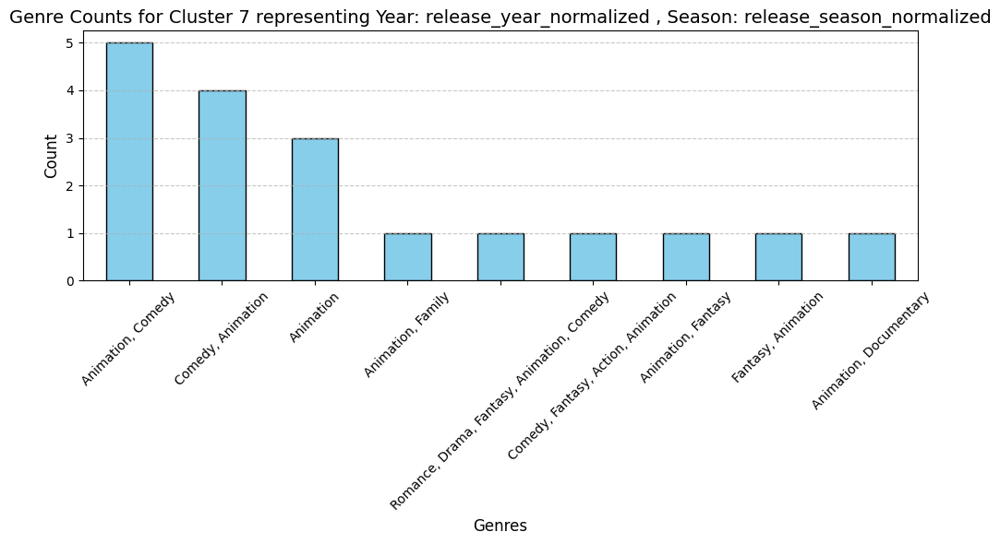


Cluster 8:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9772,Le Steeple-chase,Animation,Praxinoscope animation of an equestrian riding...,No Language,Short,Spring,Spring,4.250,0.0
9761,Le Jeu du Volant,Animation,Praxinoscope animations of a girl in a blue dr...,No Language,Short,Spring,Spring,4.500,0.0
9757,La Charmeuse,Animation,Praxinoscope animation of a girl charming a fl...,No Language,Short,Spring,Spring,5.000,0.0
8508,L'Équilibriste,Animation,Praxinoscope animation of a child laying down ...,No Language,Short,Spring,Spring,4.200,0.0
9859,Le Rotisseur,Animation,Praxinoscope animation of a chef rotating meat...,No Language,Short,Spring,Spring,4.750,0.0
9866,Les Chiens Savants,Animation,Praxinoscope animation of a boy holding a hoop...,No Language,Short,Spring,Spring,4.500,0.0
11558,Les Petits Valseurs,Animation,Praxinoscope animation of kids dancing. Series...,No Language,Short,Spring,Spring,3.333,0.0
13143,Le Moulin à Eau,Animation,Praxinoscope animation of the water mill. Seri...,No Language,Short,Spring,Spring,3.500,0.0
11559,Les Clowns,Animation,Praxinoscope animation of clowns dancing with ...,No Language,Short,Spring,Spring,3.333,0.0
7015,Le Jeu de Corde,Animation,Praxinoscope of a girl in a blue dress skippin...,No Language,Short,Spring,Spring,4.625,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,8
4592,0.0,0.333333,1,8
7015,0.0,0.333333,1,8
7018,0.0,0.333333,1,8
8487,0.0,0.333333,1,8
8508,0.0,0.333333,1,8
9755,0.0,0.333333,1,8
9756,0.0,0.333333,1,8
9757,0.0,0.333333,1,8
9758,0.0,0.333333,1,8


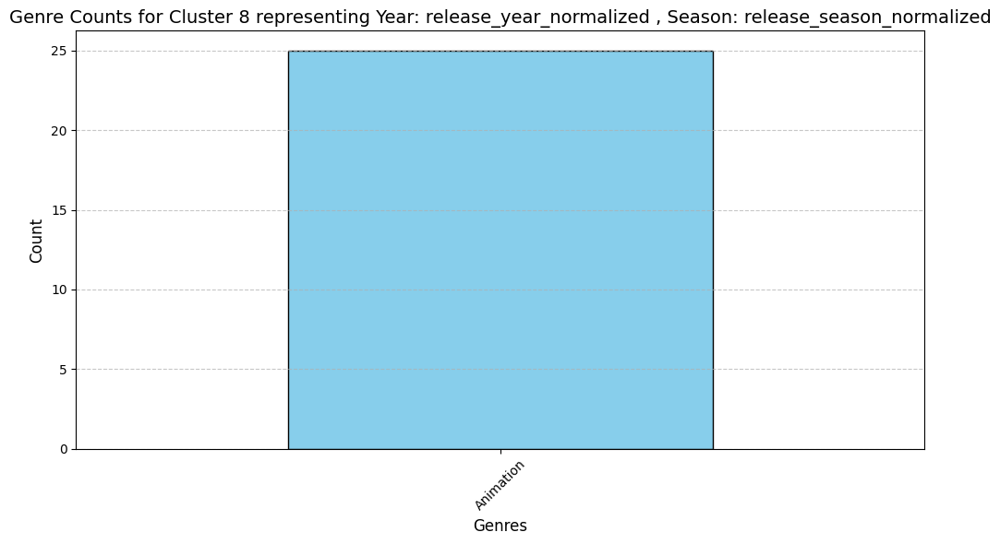

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.37, min_samples=6 | Silhouette Score: 0.829, DB Index: 0.191 ,clusters : 10
Plot Title: DBSCAN Clustering on year_season_features (eps=0.37, min_samples=6)
Explained Variance Ratios (3 Components): [0.77052799 0.19656089 0.02595842]
Total Explained Variance: 0.9930473032913412


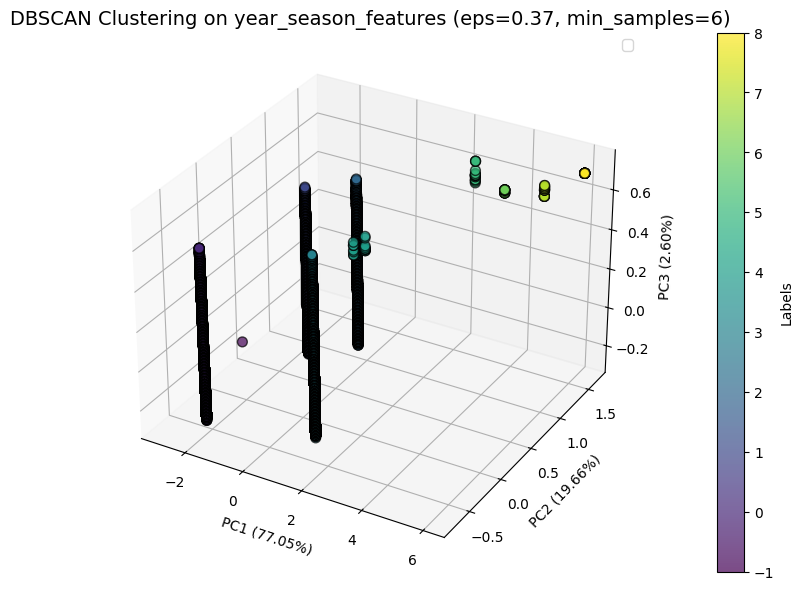

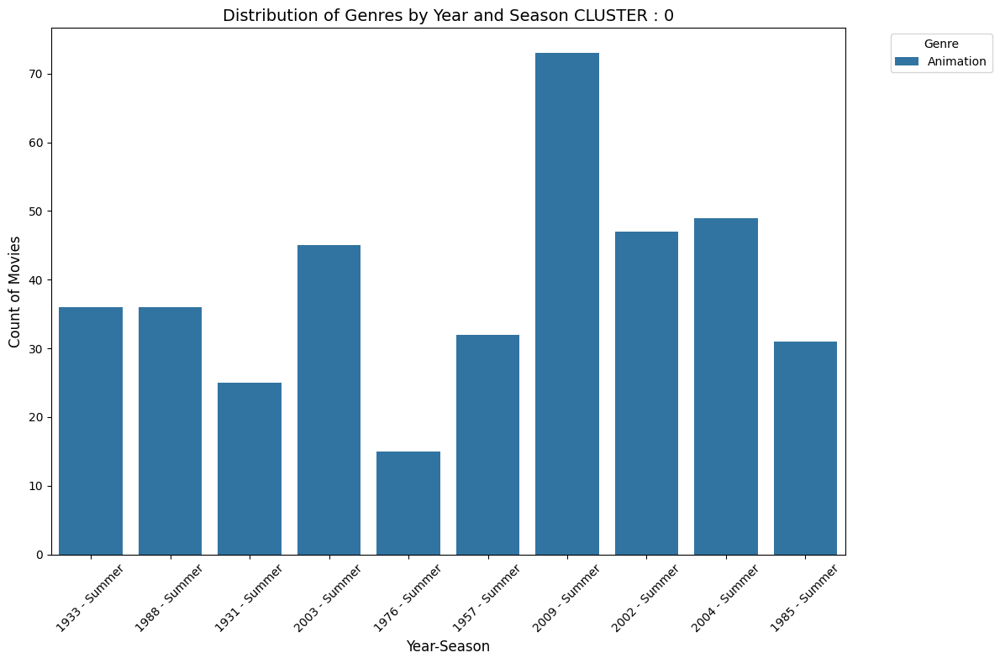

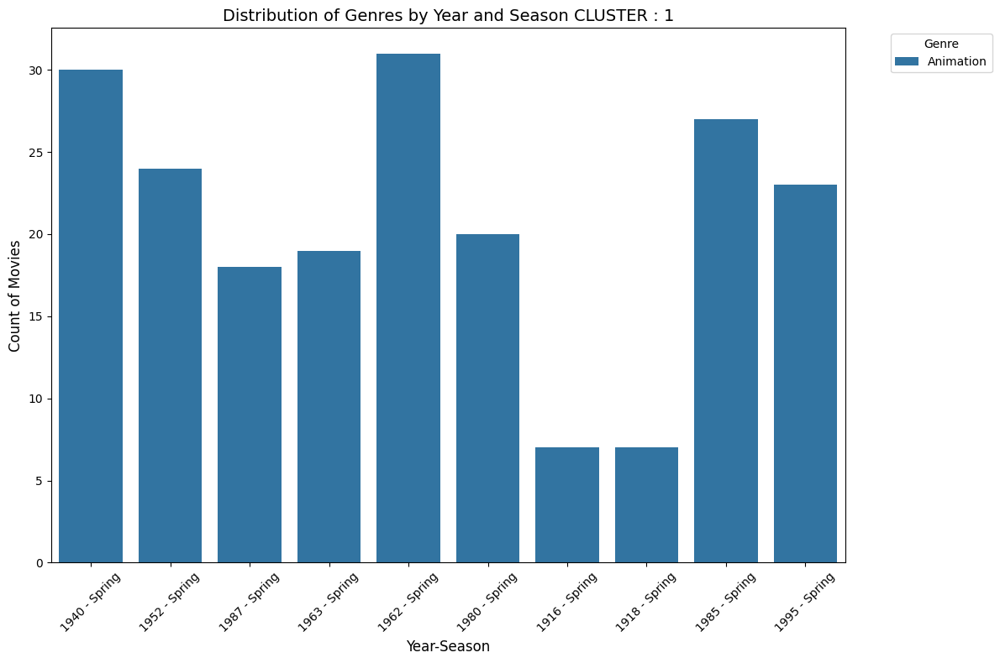

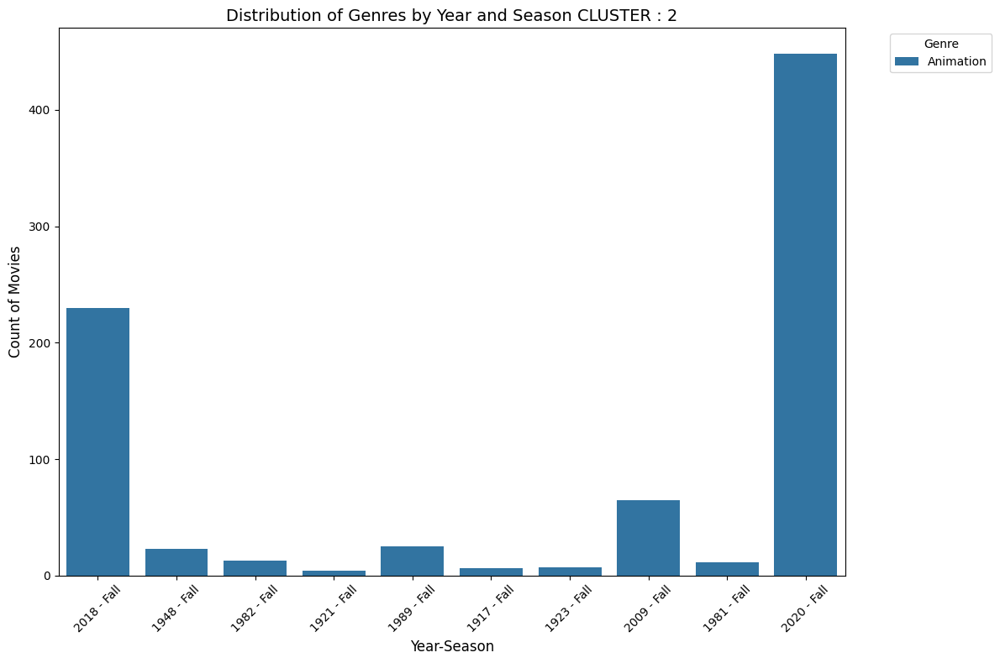

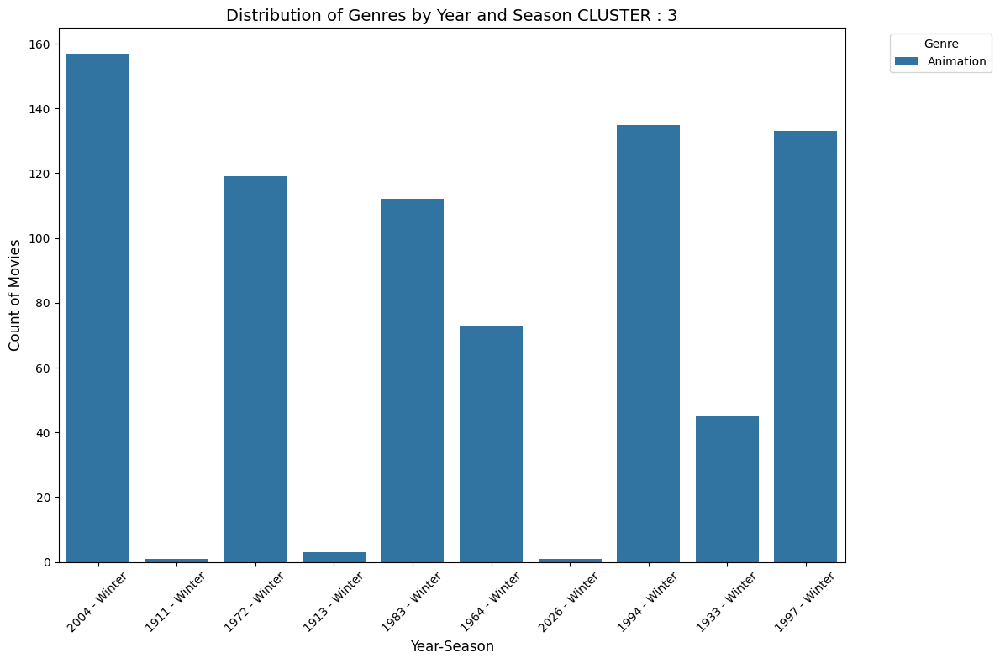

...

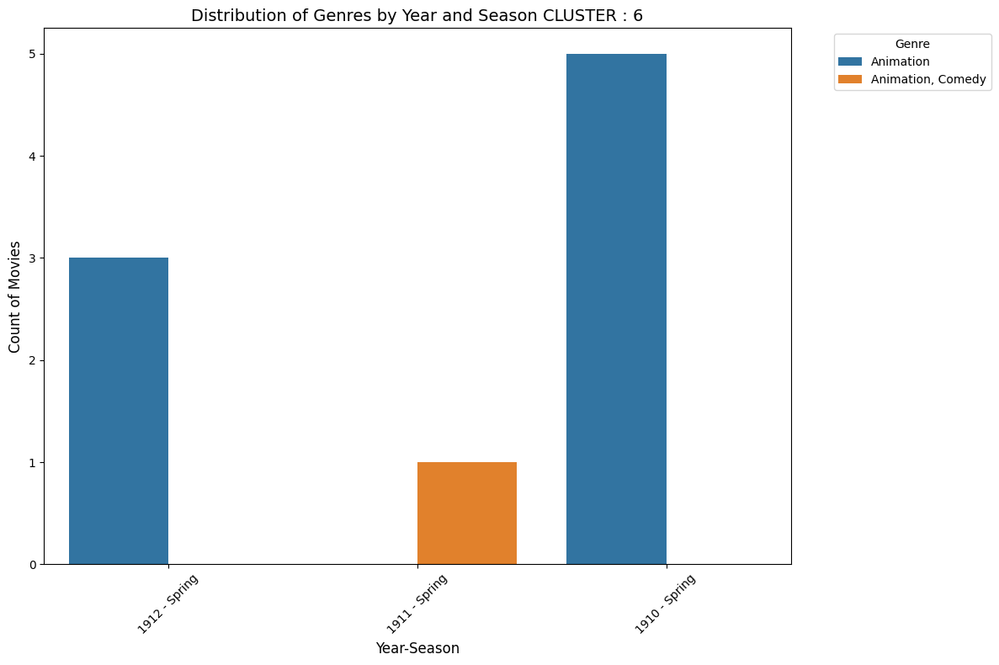

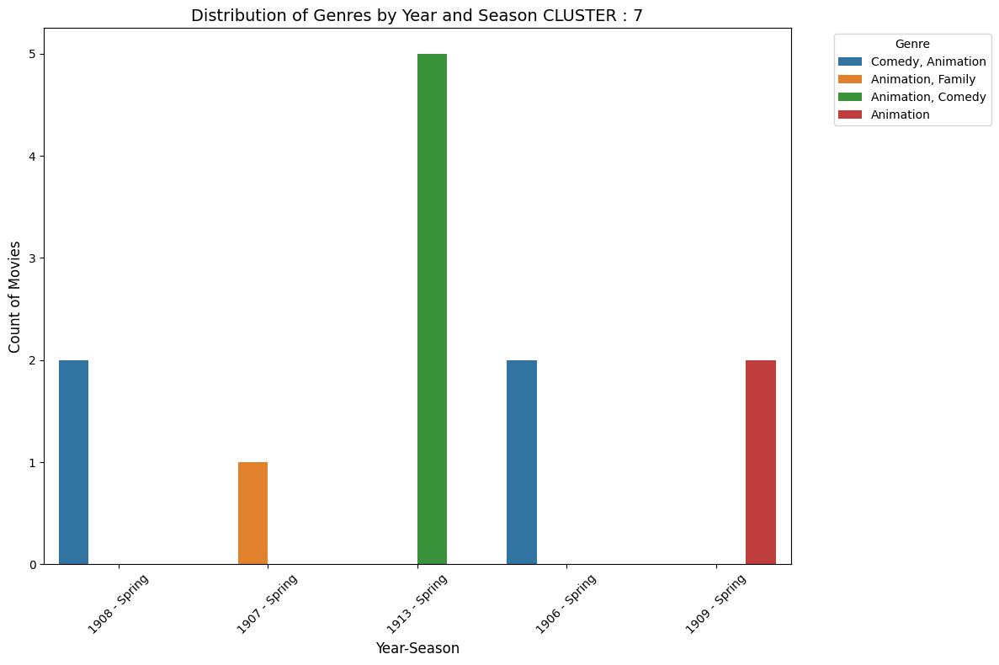

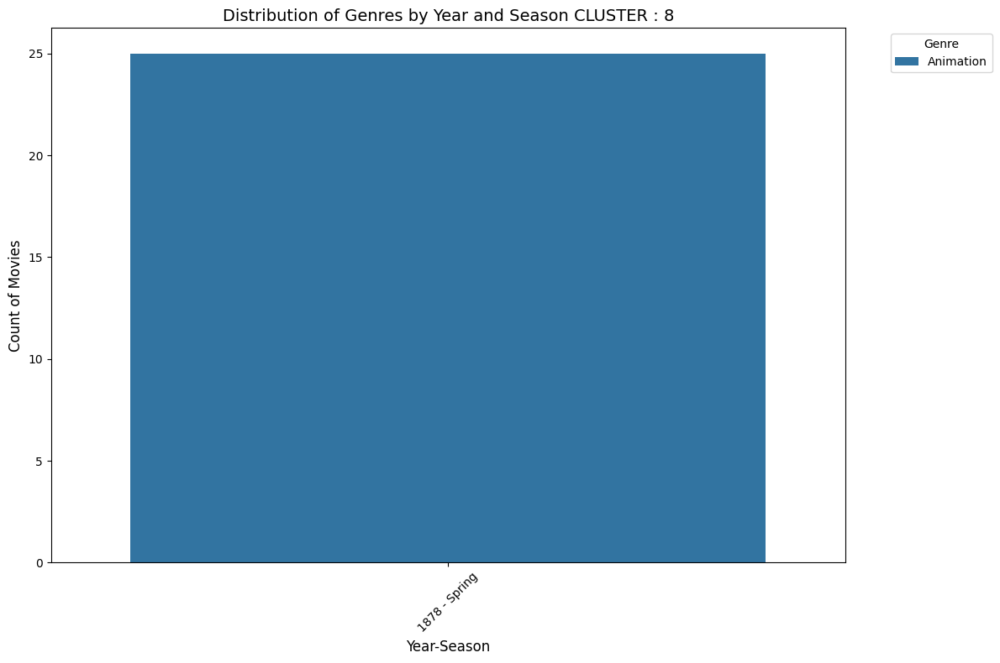

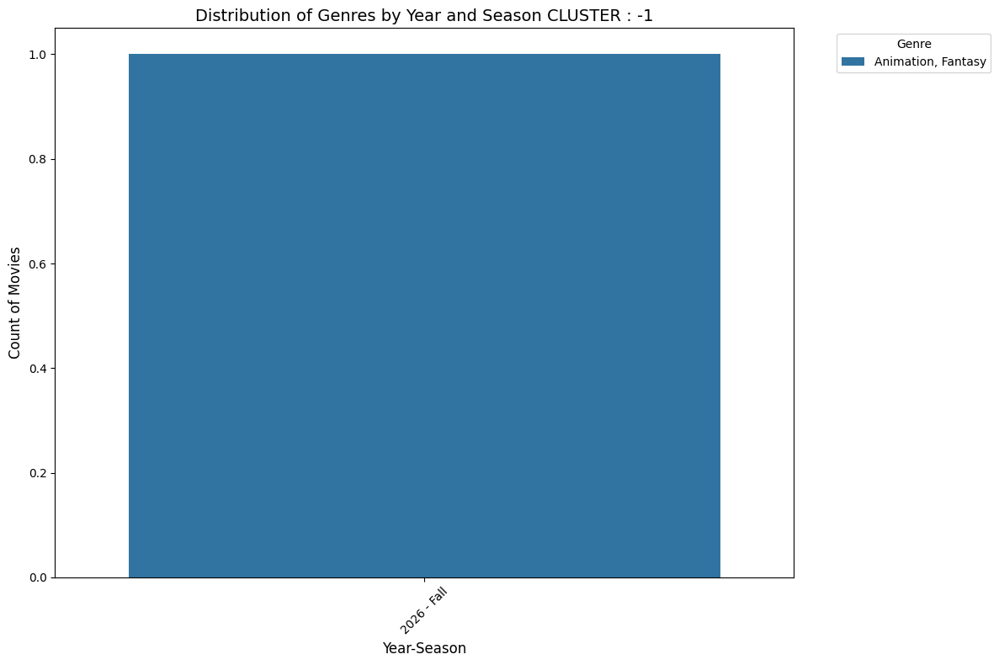

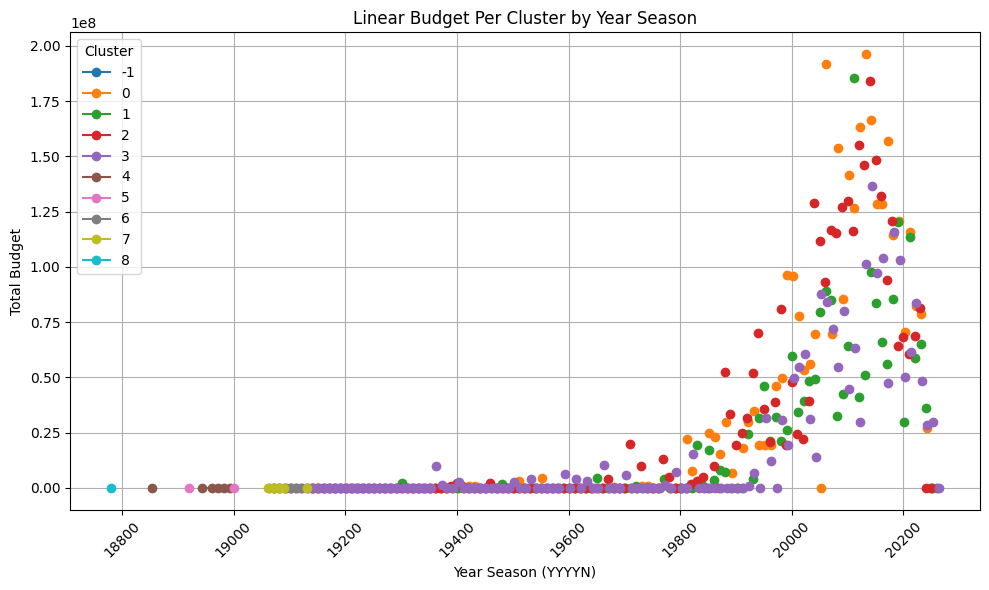

Model 'dbscan0.37' saved to 'saved_models\dbscan0.37.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
22645,Untitled Fire Lord Zuko Project,"Animation, Fantasy",A spin-off of the animated series Avatar: The ...,No Language,Short,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
22645,1.0,0.0,1,-1


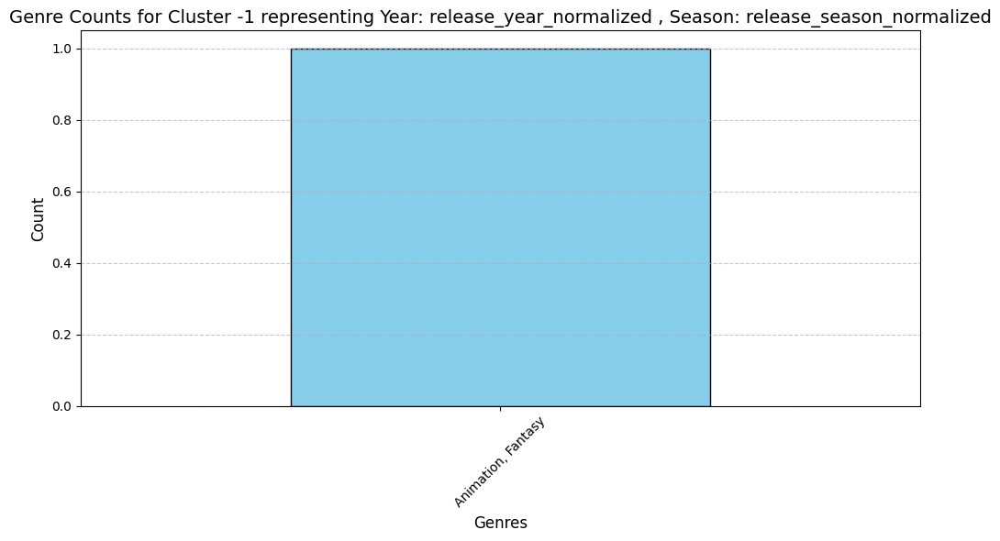


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
46971,Savages,"Animation, Comedy",A rolicking pastiche of blink and you miss ’em...,English,Short,Summer,Summer,0.000,0.0
46384,Needs,Animation,A short film that aims to demonstrate that we ...,Hungarian,Short,Summer,Summer,0.000,0.0
38372,Firemen's Brawl,Animation,Popeye and Bluto are manning a fire station wh...,English,Short,Summer,Summer,0.000,0.0
44224,Giz,Animation,A man lives a routine without rest in a corpor...,Portuguese,Short,Summer,Summer,0.000,0.0
38943,Caillou 26 - Caillou spart Wasser und weitere ...,Animation,Unknown,No Language,Short,Summer,Summer,0.000,0.0
30544,The Collagist,Animation,Animation based on the Collages of Marc Bell.,No Language,Short,Summer,Summer,0.000,0.0
23492,Sailor Moon SuperS: Special,"Animation, Action, Fantasy",A 50-minute special of the anime featuring thr...,Japanese,Standard,Summer,Summer,0.000,0.0
7392,"Pikachu, What's This Key?","Adventure, Animation",Appearing before Pikachu and friends is the ke...,Japanese,Short,Summer,Summer,6.714,0.0
35905,Gutboy: A Badtime Story,"Comedy, Animation",After a hapless fisherman is tricked out of hi...,English,Standard,Summer,Summer,0.000,0.0
48823,Pencil Dance,Animation,A ballet of black and white organic and geomet...,English,Short,Summer,Summer,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


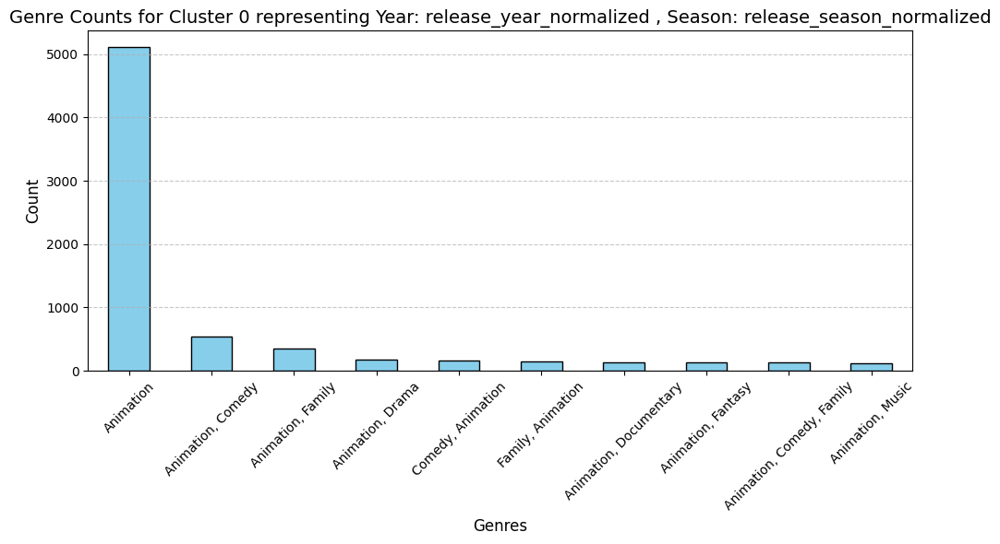


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
37111,Hubert's Brain,Animation,It tells the story of a science geek who befri...,English,Short,Spring,Spring,0.0,0.0
41909,Mexican Baseball,Animation,Gandy Goose and his friend Sourpuss take on th...,English,Short,Spring,Spring,0.0,0.0
48132,Kipper: Fun In The Sun,Animation,There's hot fun in the summertime when Kipper ...,No Language,Standard,Spring,Spring,0.0,0.0
43663,Filter Selfie,Animation,Short film about selfie culture.,No Language,Short,Spring,Spring,0.0,0.0
34149,"Утёнок, который не умел играть в футбол",Animation,Unknown,Russian,Short,Spring,Spring,0.0,0.0
24724,Underground Psycho,"Animation, Thriller, Fantasy","Witness to a murder in a dark, deserted underg...",No Language,Short,Spring,Spring,0.0,0.0
39886,Bulloney,Animation,Flip has been caught in flagranti with the bul...,English,Short,Spring,Spring,0.0,0.0
48996,Broadway Building,"Documentary, Animation",An Eternalism film.,No Language,Short,Spring,Spring,0.0,0.0
26420,Sweet Adeline,Animation,Follow the bouncing ball sing-along,English,Short,Spring,Spring,0.0,0.0
29990,Ana Morphose,Animation,"A little girl, Ana, reads herself to sleep. As...","No Language, Portuguese",Short,Spring,Spring,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


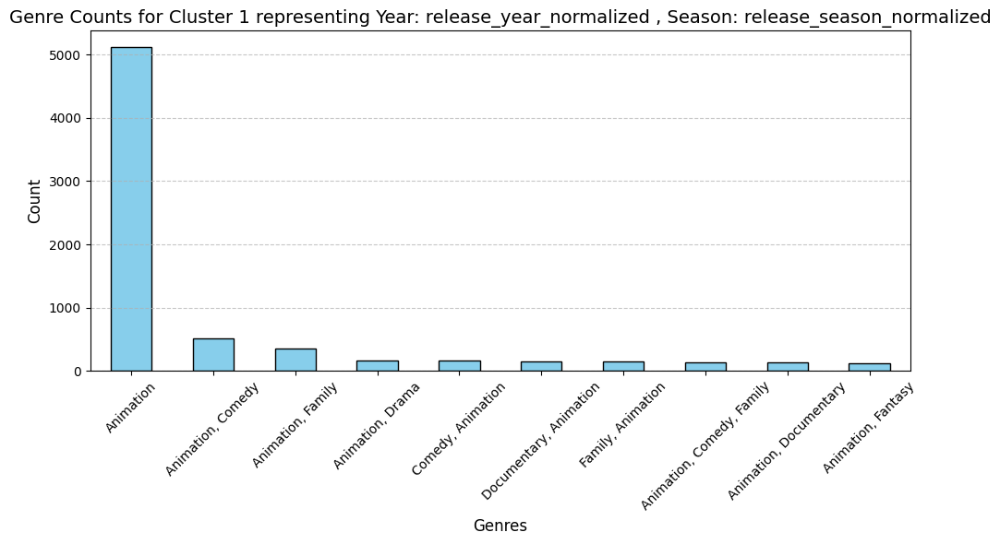


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
37676,Deadly Deposits,Animation,A pathological detective story in which two do...,No Language,Short,Fall,Fall,0.0,0.0
30585,Aetherius,"Animation, Fantasy",The animated short film immerses us in the fas...,Spanish,Short,Fall,Fall,0.0,80.0
40024,Die Oktonauten und der Zitronenhai,"Animation, Family",Unknown,No Language,Short,Fall,Fall,0.0,0.0
44746,Siyavar Ram,Animation,Born during an age when the demon Ravana terro...,Hindi,Short,Fall,Fall,0.0,100000.0
4086,Tragic Story with Happy Ending,"Animation, Drama",A girl whose heart beats faster than normal an...,Portuguese,Short,Fall,Fall,6.7,0.0
48651,me_ory,Animation,fade / appropriate / reconstruct / loop(holes)...,No Language,Short,Fall,Fall,0.0,0.0
6649,The Wanted 18,"Documentary, Animation","Through stop-motion animation, drawings and in...","Arabic, English, Hebrew",Standard,Fall,Fall,6.1,0.0
44002,Idyll,"Animation, Music",A non-narrative story based on Leoš Janáček's ...,No Language,Short,Fall,Fall,0.0,0.0
32439,Kibitz,Animation,Unknown,Korean,Short,Fall,Fall,0.0,0.0
45091,pài-la̍k ē-poo (saturday afternoon),"Documentary, Animation",A half-moon on the blue sky. A quiet offering ...,Japanese,Short,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


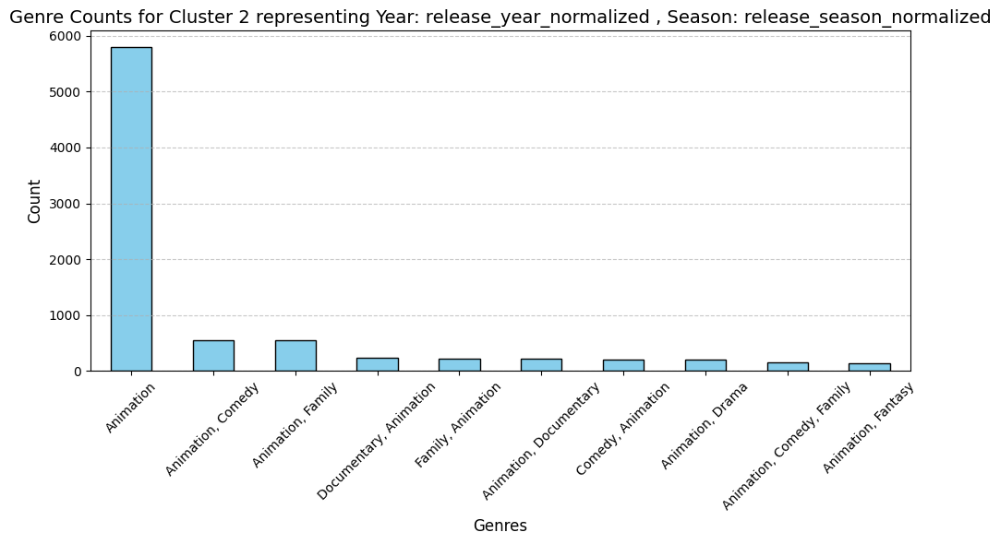


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
19089,The Mobarak,"Animation, Adventure, Comedy",In this modern adaptation of the ancient Persi...,Persian,Standard,Winter,Winter,10.0,0.0
48699,Tayo the Little Bus - Tayo's Vroom Vroom Adven...,"Animation, Family, Action, Adventure","One fine day, when Tayo and other little buses...","English, Korean",Short,Winter,Winter,0.0,0.0
40786,Ola Nā Iwi: Hāloa,Animation,Haloa (pronounced: Haa-lo-ah) tells the story ...,English,Short,Winter,Winter,0.0,0.0
46253,Happy Bogeys,"Animation, Family",Mysterious lifeforms “Happy Bogeys” appear and...,Japanese,Short,Winter,Winter,0.0,0.0
27876,Dear Consumer (Robot Chicken's Full-Assed Chri...,"Animation, Comedy","Thor celebrates Christmas in Asgard, Santa add...",English,Short,Winter,Winter,0.0,0.0
18531,Greatest Heroes and Legends of The Bible: Dani...,Animation,There are many heroes in the Old Testament. So...,English,Standard,Winter,Winter,6.0,0.0
47975,Moon-Face,Animation,"A short animated film, adapted from the Jack L...",Swedish,Short,Winter,Winter,0.0,0.0
7257,Land of the Heads,"Animation, Fantasy, Horror","Emile is an unhappy little vampire, doing a jo...",No Language,Short,Winter,Winter,4.3,0.0
45626,To the Farmhouse,Animation,This stop-motion animation depicts a personal ...,No Language,Short,Winter,Winter,0.0,0.0
30046,Morgenglanze,Animation,Animated private diary revealing the different...,No Language,Short,Winter,Winter,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


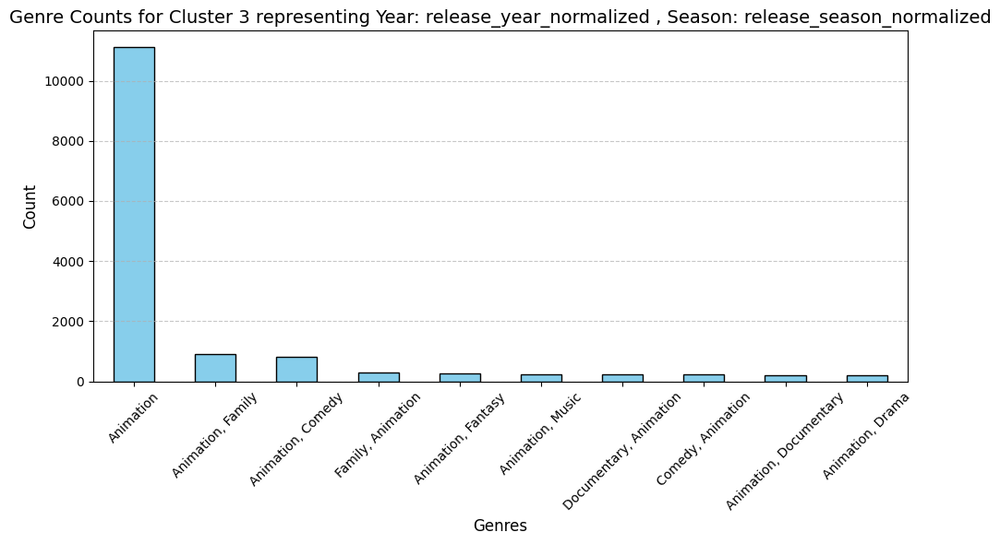


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
24559,Buffon Dance,Animation,Unknown,No Language,Short,Winter,Winter,0.000,0.0
14428,Le premier cigare,Animation,Unknown,No Language,Short,Summer,Summer,4.500,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
4984,Matches: An Appeal,Animation,A thirty-second long stop-motion animated piec...,No Language,Short,Winter,Winter,4.200,0.0
10494,Un rêve au coin du feu,Animation,It is a short film made by Emile Reynaud,No Language,Short,Winter,Winter,3.333,0.0
18372,"And the Villain Still Pursued Her, or, the Aut...","Comedy, Animation, Adventure",A writer of tawdry fiction falls asleep at his...,English,Short,Winter,Winter,6.000,0.0
13272,The Four Little Tailors,"Romance, Fantasy, Comedy, Animation","The opening scene is in a tailor's shop, showi...",No Language,Short,Summer,Summer,4.000,0.0
10898,Guillaume Tell,"Animation, Comedy",Unknown,No Language,Short,Summer,Summer,5.000,0.0
13274,Comic Mutations,Animation,An old and learned doctor discovers the secret...,No Language,Short,Summer,Summer,5.000,0.0
44454,The Magic Fountain Pen,Animation,Unknown,English,Short,Summer,Summer,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,4
2365,0.023256,1.000000,0,4
3329,0.007752,1.000000,0,4
4984,0.054264,1.000000,0,4
5767,0.093023,0.666667,0,4
8113,0.077519,0.666667,0,4
9418,0.100775,0.666667,0,4
10494,0.023256,1.000000,0,4
10898,0.031008,0.666667,0,4
13271,0.100775,0.666667,0,4


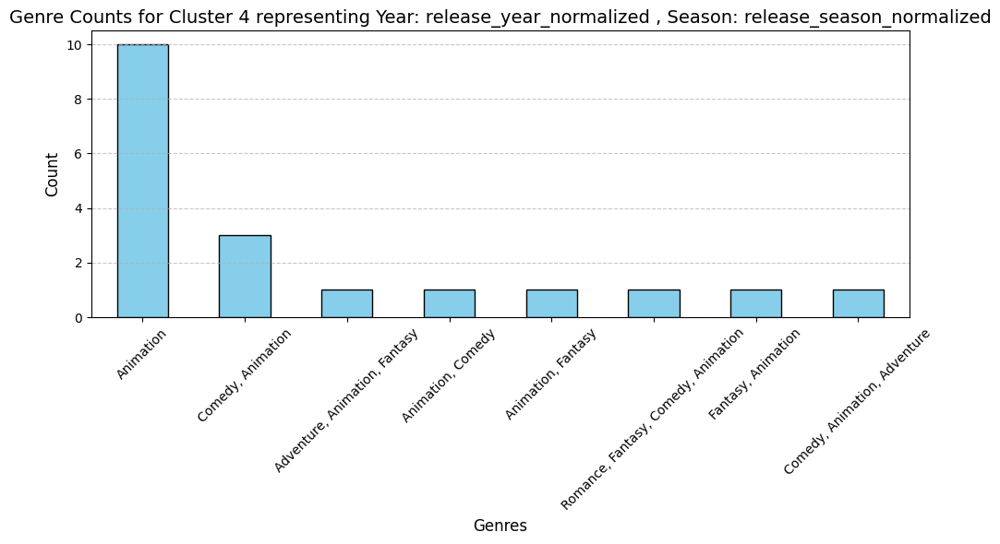


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
1672,The Cameraman's Revenge,Animation,A jilted husband takes his revenge by filming ...,No Language,Short,Fall,Fall,7.198,0.0
46889,He Loves to Be Amused,"Animation, Comedy",Papa Newlywed and his lovely wife looked up at...,No Language,Short,Fall,Fall,0.000,0.0
2248,The Electric Hotel,"Fantasy, Animation",An enthusiastic young couple is astounded with...,No Language,Short,Fall,Fall,6.100,0.0
1716,Poor Pierrot,"Comedy, Animation","One night, Arlequin comes to see his lover Col...",French,Short,Fall,Fall,6.029,0.0
5138,Drama at the Puppets' House,"Comedy, Animation, Crime",For a short comedy of rare merit this subject ...,No Language,Short,Fall,Fall,6.200,0.0
9882,The Magic Hoop,"Fantasy, Animation",Émile Cohl mixes live-action and stop-motion a...,No Language,Short,Fall,Fall,4.800,0.0
21814,Road Hogs in Toyland,Animation,It's a stop-motion film of various toy cars en...,English,Short,Fall,Fall,0.000,0.0
19961,Rosalie and Her Phonograph,"Fantasy, Comedy, Animation",A jolly housekeeper brings new meaning to the ...,French,Short,Fall,Fall,4.000,0.0
6767,A Good Beer,Animation,Unknown,No Language,Short,Fall,Fall,4.000,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.400,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.0,1,5
1716,0.015504,0.0,1,5
1992,0.062016,0.0,1,5
2248,0.085271,0.0,1,5
5010,0.085271,0.0,1,5
5138,0.085271,0.0,1,5
6252,0.015504,0.0,1,5
6767,0.015504,0.0,1,5
6830,0.093023,0.0,1,5
8477,0.085271,0.0,1,5


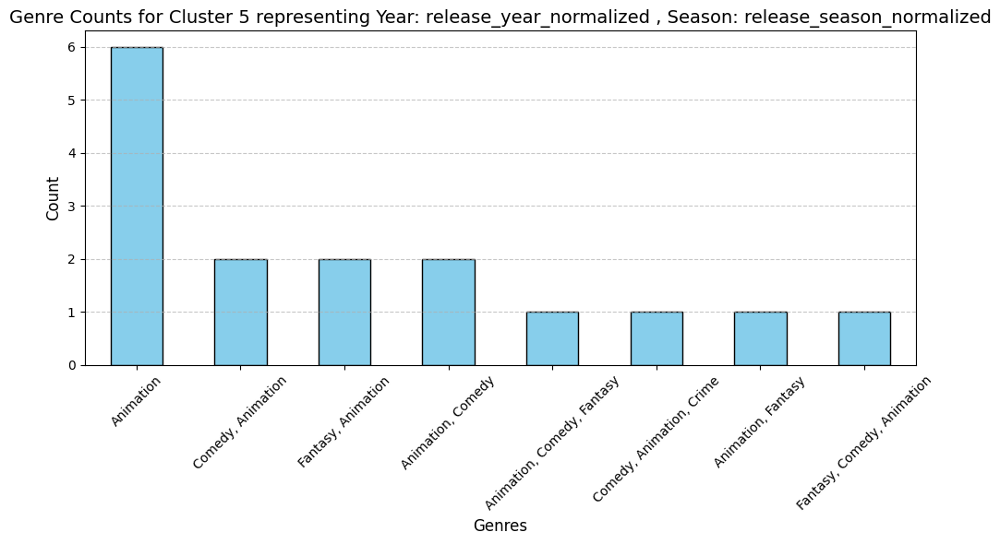


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
6761,The Beautiful Leukanida,"Drama, Animation",Two insects fight over the hand of a beautiful...,No Language,Short,Spring,Spring,6.2,0.0
13862,Floral Frameworks,Animation,There have been numerous studies of plants and...,No Language,Short,Spring,Spring,4.5,0.0
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.6,0.0
20552,"Petites causes, grands effets!","Drama, Animation",French animation from O'Galop is a pretty inte...,No Language,Short,Spring,Spring,4.0,0.0
10366,Le circuit de l'alcool,Animation,This one is another warning to the French publ...,No Language,Short,Spring,Spring,5.5,0.0
13213,Art's Infancy,Animation,A animation film from Émile Cohl about a painter.,No Language,Short,Spring,Spring,5.5,0.0
35468,Hänschens Soldaten,"Comedy, Animation",A young boy in a sailor suit plays with three ...,No Language,Short,Spring,Spring,0.0,0.0
13217,The Mysterious Fine Arts,Animation,In this film several objects make paintings on...,No Language,Short,Spring,Spring,5.0,0.0
12281,A Peace of Coal,"Fantasy, Animation",A British trick film with stop-motion animatio...,No Language,Short,Spring,Spring,4.0,0.0
12593,Les Métamorphoses Comiques,Animation,An animation where real life objects turn into...,French,Short,Spring,Spring,5.5,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,6
3598,0.100775,0.333333,1,6
6761,0.116279,0.333333,1,6
10366,0.116279,0.333333,1,6
12281,0.100775,0.333333,1,6
12282,0.100775,0.333333,1,6
12593,0.116279,0.333333,1,6
13208,0.100775,0.333333,1,6
13213,0.100775,0.333333,1,6
13217,0.100775,0.333333,1,6


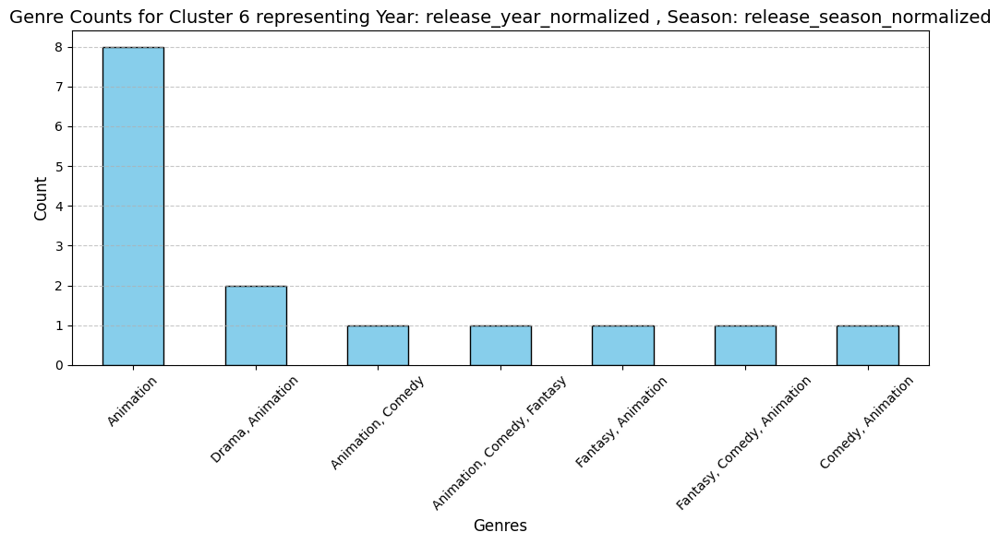


Cluster 7:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
39422,Urban Science: To Demonstrate How Spiders Fly,"Animation, Documentary",This charming short film is surprisingly techn...,"No Language, English",Short,Spring,Spring,0.000,0.0
5733,Miniature Theatre,"Comedy, Animation","Three young children set up a table, and on th...",No Language,Short,Spring,Spring,5.000,0.0
46884,Poor Little Chap He Was Only Dreaming,"Animation, Comedy","When ""Snookums"" started to cry, Da-da thought ...",No Language,Short,Spring,Spring,0.000,0.0
35104,In the Land of Nod,Animation,Children play with their toys while Grandpa do...,English,Short,Spring,Spring,0.000,0.0
6171,The Pumpkin Race,"Comedy, Fantasy, Action, Animation",Early slapstick short from Louis Feuillade inv...,No Language,Short,Spring,Spring,5.500,0.0
46883,He Wants What He Wants When He Wants It,"Animation, Comedy","When ""Snookums"" discovered this break in the p...",No Language,Short,Spring,Spring,0.000,0.0
46881,"When He Wants a Dog, He Wants a Dog","Animation, Comedy",Snookums Newlywed makes acquaintance with a dog.,No Language,Short,Spring,Spring,0.000,0.0
46882,Business Must Not Interfere,"Animation, Comedy",This time the trouble is with Snookums and the...,No Language,Short,Spring,Spring,0.000,0.0
5753,Spanish Clair de Lune,"Romance, Drama, Fantasy, Animation, Comedy",Two lovers perform a fandango dance. A jealous...,No Language,Short,Spring,Spring,5.700,0.0
3978,Katsudō Shashin,"Animation, Family",A boy in a cadet's uniform paints a statement ...,No Language,Short,Spring,Spring,5.909,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2367,0.069767,0.333333,1,7
3978,0.077519,0.333333,1,7
5733,0.069767,0.333333,1,7
5753,0.093023,0.333333,1,7
6171,0.077519,0.333333,1,7
7457,0.085271,0.333333,1,7
9861,0.093023,0.333333,1,7
10676,0.093023,0.333333,1,7
11692,0.085271,0.333333,1,7
13273,0.093023,0.333333,1,7


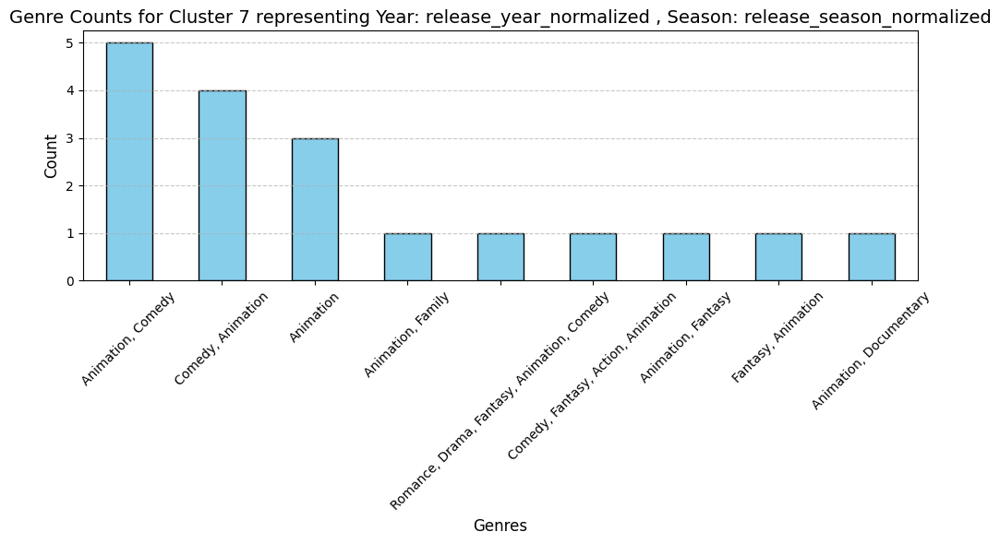


Cluster 8:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
9857,Les Bulles de Savon,Animation,Praxinoscope animation of a girl in a blue dre...,No Language,Short,Spring,Spring,4.750,0.0
11558,Les Petits Valseurs,Animation,Praxinoscope animation of kids dancing. Series...,No Language,Short,Spring,Spring,3.333,0.0
9757,La Charmeuse,Animation,Praxinoscope animation of a girl charming a fl...,No Language,Short,Spring,Spring,5.000,0.0
8508,L'Équilibriste,Animation,Praxinoscope animation of a child laying down ...,No Language,Short,Spring,Spring,4.200,0.0
9866,Les Chiens Savants,Animation,Praxinoscope animation of a boy holding a hoop...,No Language,Short,Spring,Spring,4.500,0.0
9779,The Aquarium,Animation,"Praxinoscope reel, Series 1, number 1",No Language,Short,Spring,Spring,3.250,0.0
9756,Le Trapèze,Animation,Praxinoscope animation of a man spinning aroun...,No Language,Short,Spring,Spring,5.000,0.0
9755,Les Papillons,Animation,Praxinoscope animation of a butterfly flutteri...,No Language,Short,Spring,Spring,4.000,0.0
4592,The Magic Rosette,Animation,Praxinoscope strip of a shifting rosette. Seri...,No Language,Short,Spring,Spring,5.583,0.0
9758,La Balançoire,Animation,Praxinoscope animation of two children playing...,No Language,Short,Spring,Spring,4.500,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,8
4592,0.0,0.333333,1,8
7015,0.0,0.333333,1,8
7018,0.0,0.333333,1,8
8487,0.0,0.333333,1,8
8508,0.0,0.333333,1,8
9755,0.0,0.333333,1,8
9756,0.0,0.333333,1,8
9757,0.0,0.333333,1,8
9758,0.0,0.333333,1,8


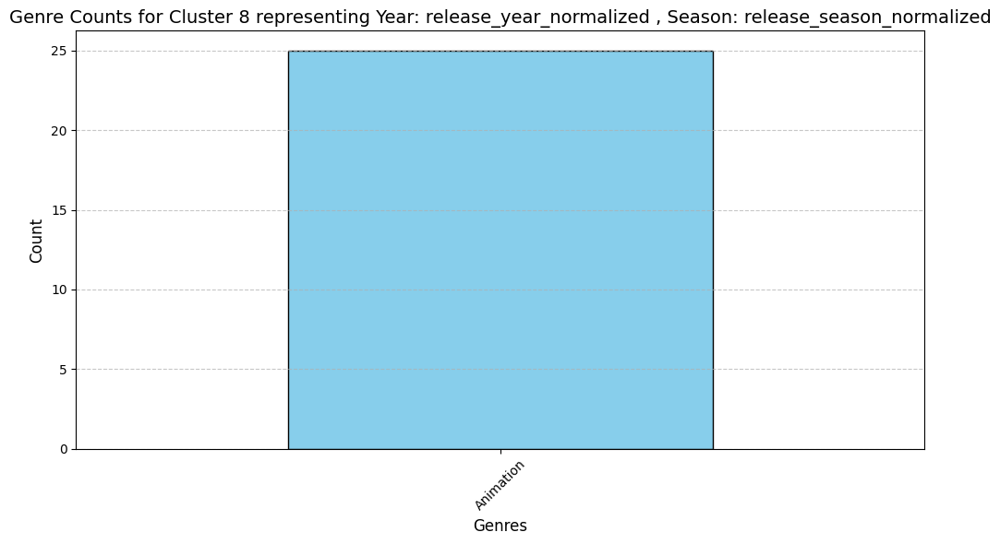

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.37, min_samples=10 | Silhouette Score: 0.815, DB Index: 0.185 ,clusters : 10
Plot Title: DBSCAN Clustering on year_season_features (eps=0.37, min_samples=10)
Explained Variance Ratios (3 Components): [0.77052799 0.19656089 0.02595842]
Total Explained Variance: 0.9930473032913523


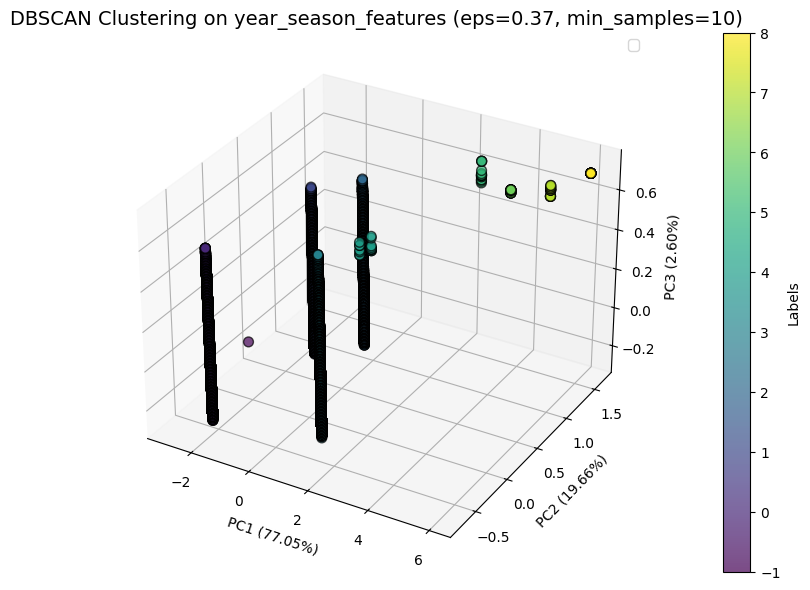

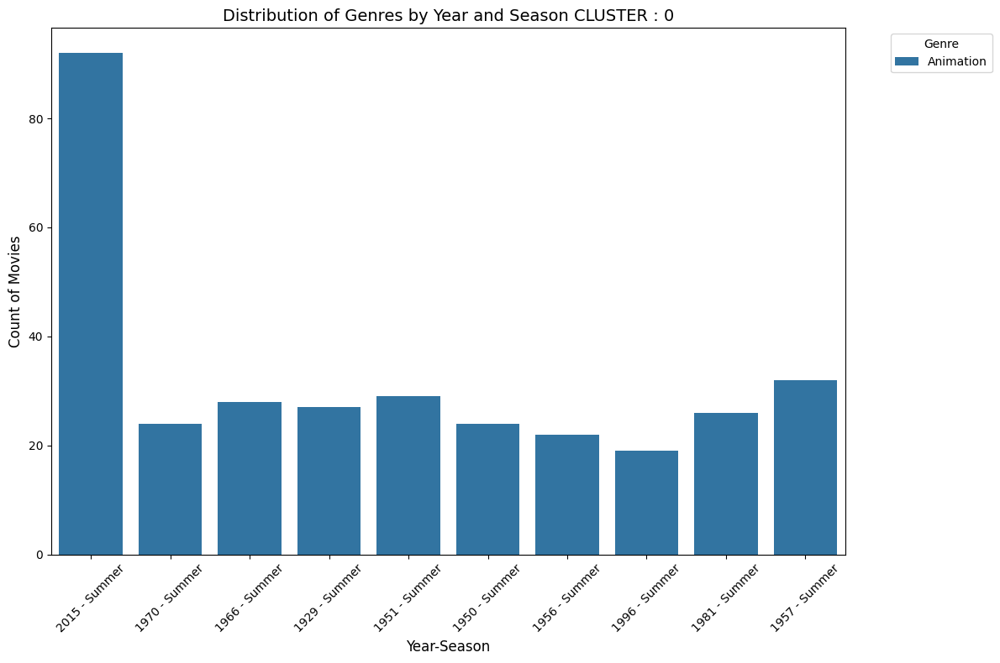

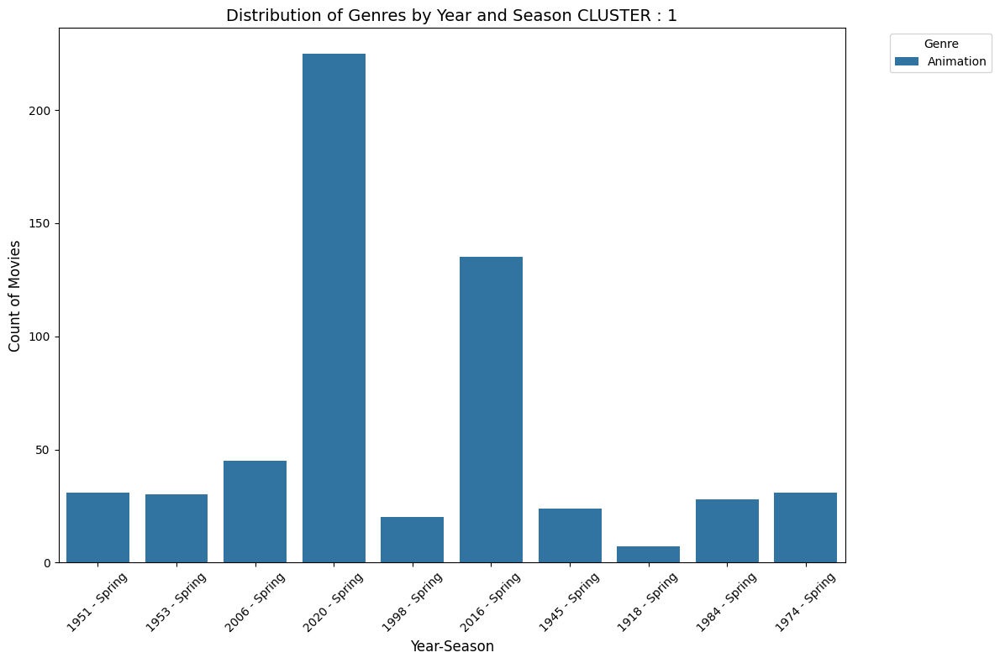

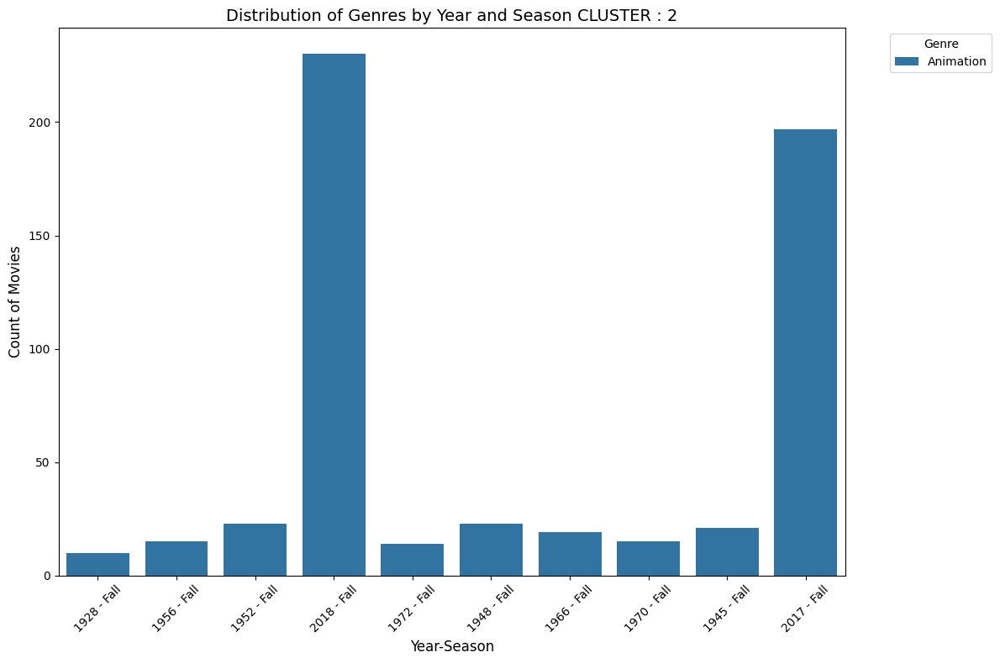

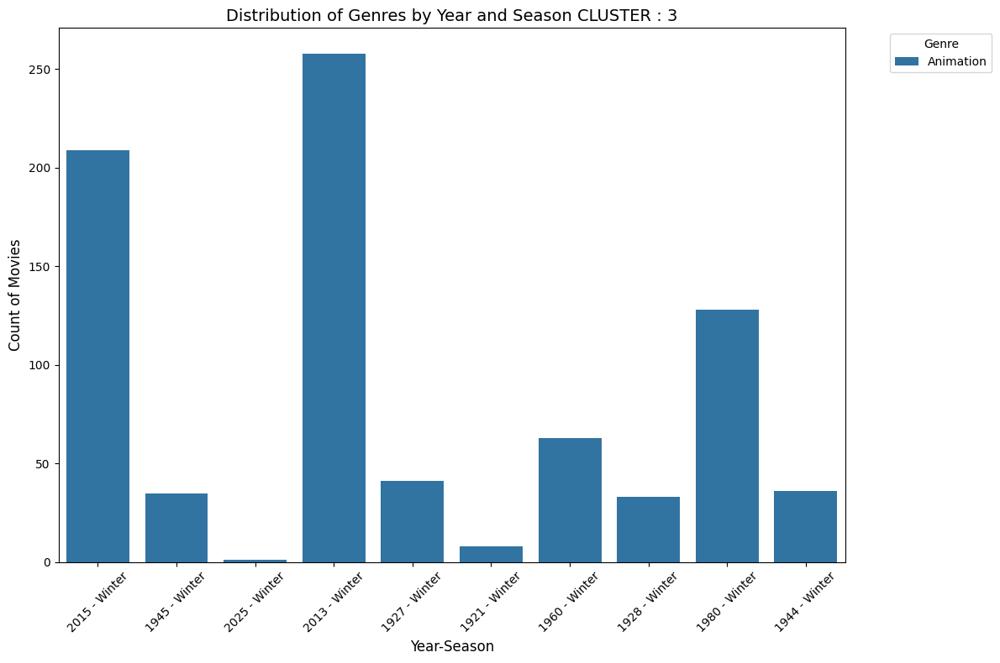

...

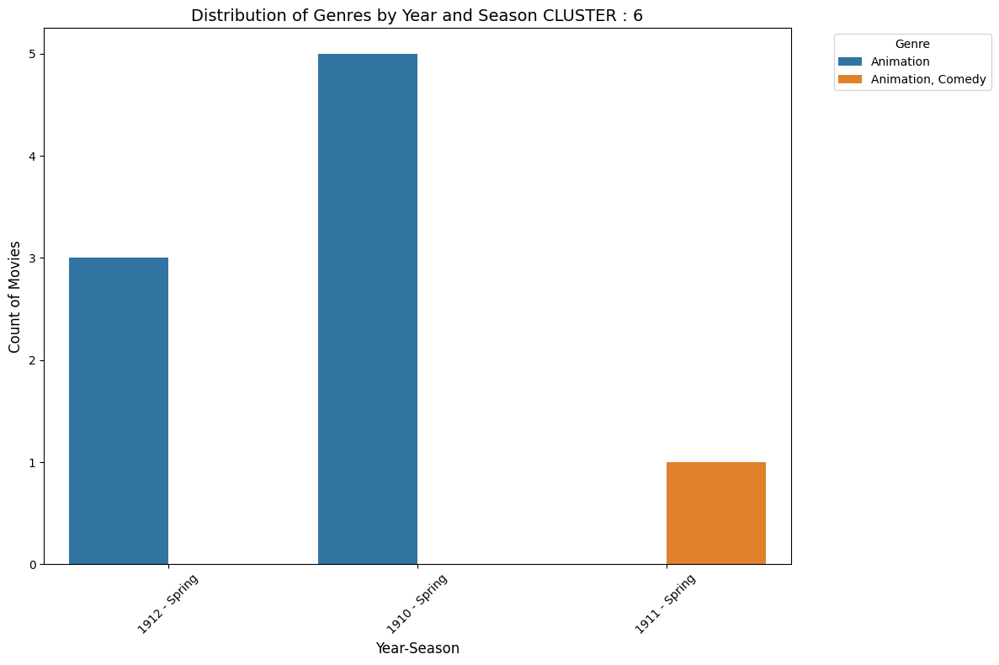

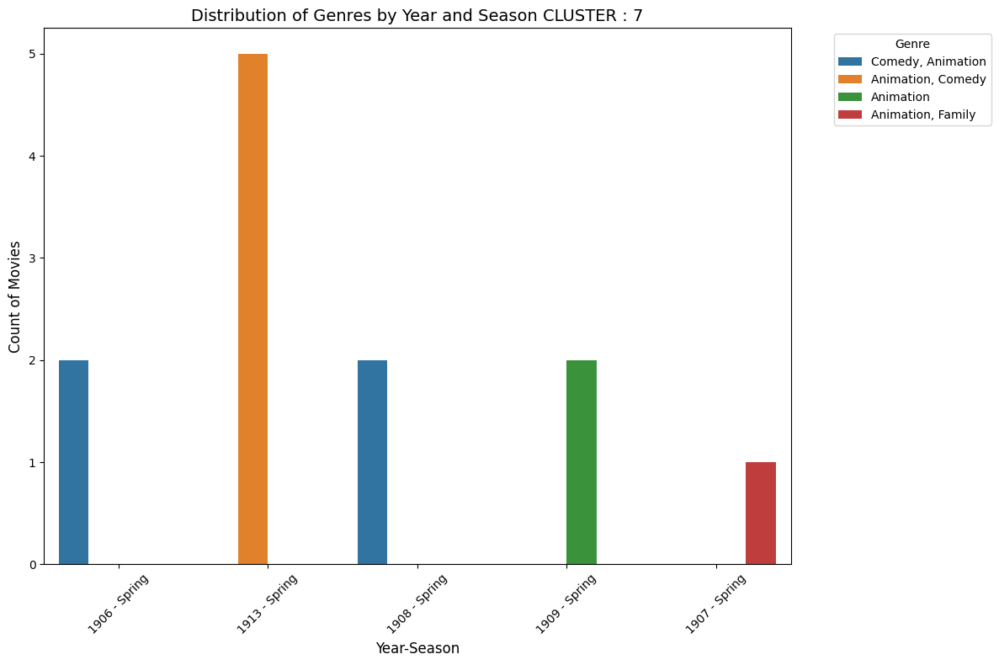

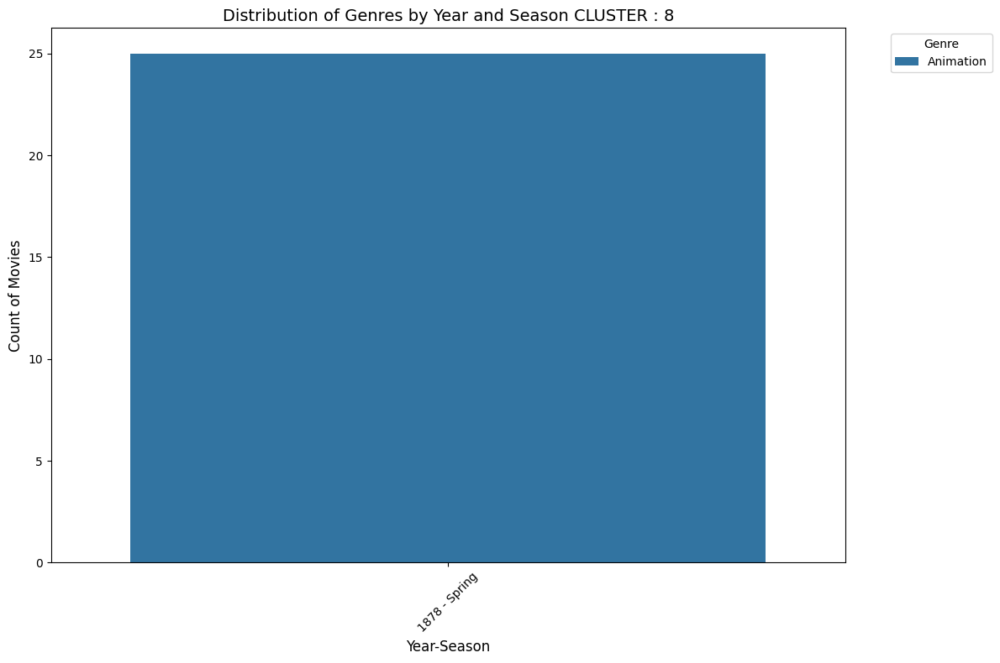

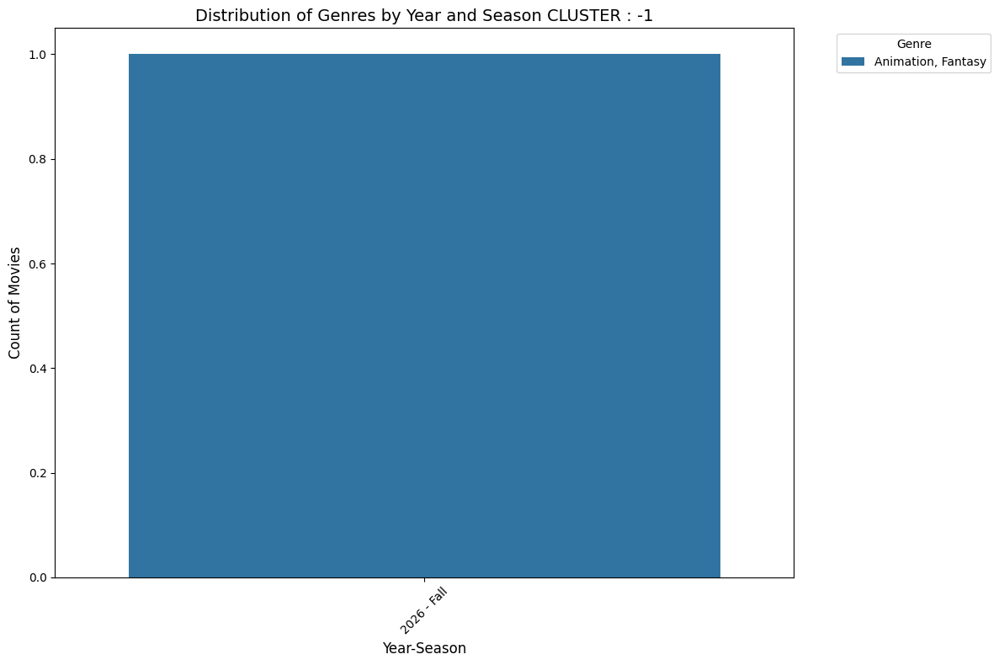

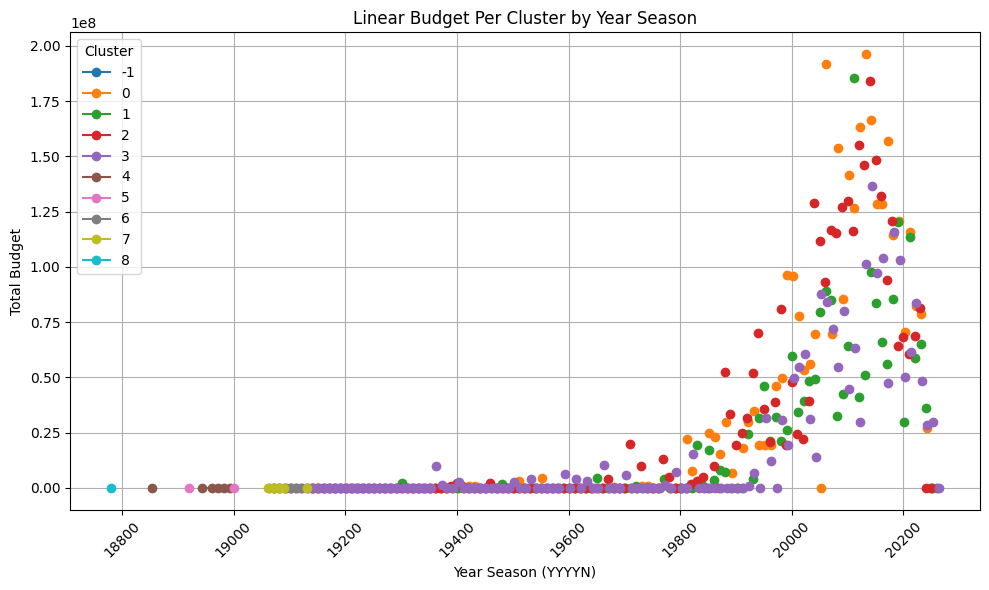

Model 'dbscan0.37' saved to 'saved_models\dbscan0.37.pkl'.

Samples from each DBSCAN cluster:

Cluster -1:


C:\Users\shaahin\AppData\Local\Temp\ipykernel_19996\1810731750.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DBSCAN']=labels


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
22645,Untitled Fire Lord Zuko Project,"Animation, Fantasy",A spin-off of the animated series Avatar: The ...,No Language,Short,Fall,Fall,0.0,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
22645,1.0,0.0,1,-1


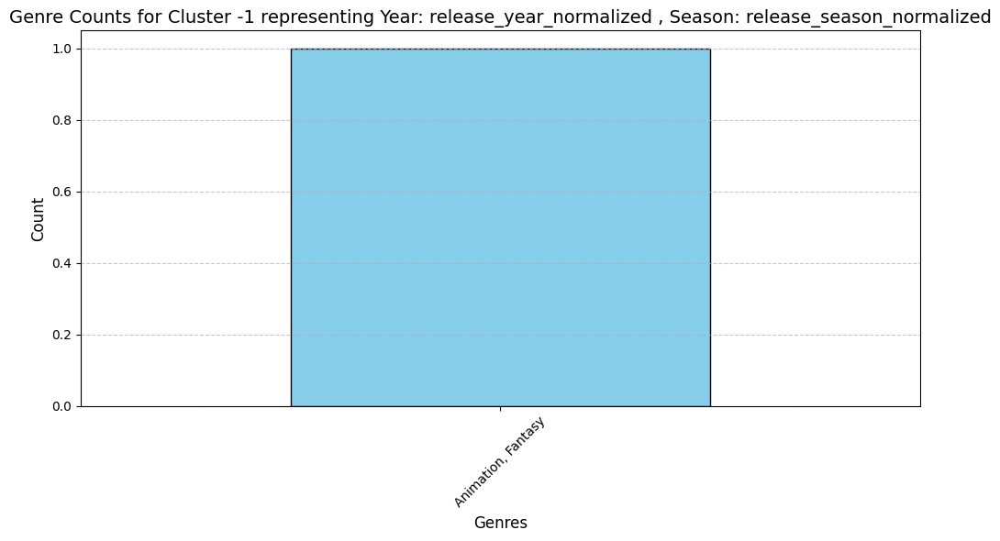


Cluster 0:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
8479,Foster's Home For Imaginary Friends: House of ...,"Animation, Adventure, Comedy, Family, Fantasy,...",Eight-year-old Mac and his imaginary friend Bl...,English,Standard,Summer,Summer,7.600,0.0
2286,Sebastian's Voodoo,"Animation, Horror",A voodoo doll must find the courage to save hi...,No Language,Short,Summer,Summer,6.500,2000.0
33894,Vom mutigen Hans,Animation,Unknown,German,Short,Summer,Summer,0.000,0.0
805,Groot Takes a Bath,"Animation, Family, Comedy, Science Fiction",Everybody needs some alone time to relax and w...,English,Short,Summer,Summer,7.123,0.0
30718,Longhair and Doubledome: Good Wheel Hunting,Animation,This cartoon follows two philosophical cavemen...,English,Short,Summer,Summer,0.000,0.0
25190,Lunar Moth,Animation,This is the story of how the moth helped the m...,No Language,Short,Summer,Summer,0.000,0.0
28811,Miles Davis – What's Love Got to Do with It,"Animation, Music",An astonishing “half abstract night-walk fanta...,No Language,Short,Summer,Summer,0.000,0.0
12420,Time Stranger Kyoko: Leave It to Chocola!,"Animation, Fantasy, Comedy",Preparing a party for her anniversary with the...,Japanese,Short,Summer,Summer,4.000,0.0
3309,The Fire Fighters,Animation,Mickey and others are firemen; they slide down...,English,Short,Summer,Summer,6.100,0.0
15588,Dream of Kafka,Animation,"""Miserable me. Two plates are screwed to my te...",Armenian,Short,Summer,Summer,5.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
0,0.914729,0.666667,0,0
4,0.860465,0.666667,0,0
7,0.751938,0.666667,0,0
10,0.852713,0.666667,0,0
13,0.806202,0.666667,0,0
15,0.875969,0.666667,0,0
17,0.875969,0.666667,0,0
18,0.844961,0.666667,0,0
20,0.891473,0.666667,0,0
23,0.937984,0.666667,0,0


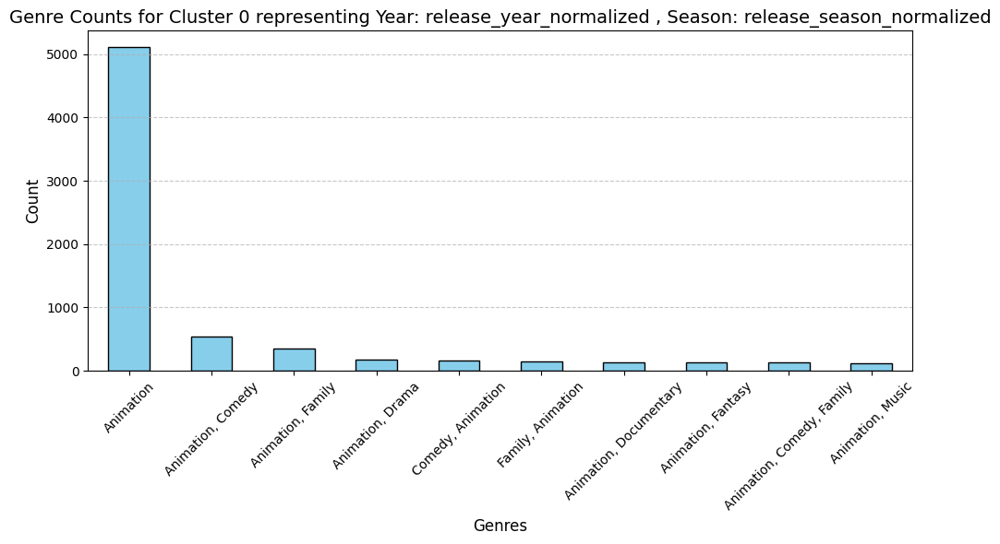


Cluster 1:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
28059,A Big Boy,"Animation, Comedy",It's Paul's birthday and his grand-mother is a...,French,Short,Spring,Spring,0.0,0.0
29604,BabyLearning.tv: Spelling With Colors,Animation,"BabyLearning.tv is a fun, toddler-friendly way...",No Language,Short,Spring,Spring,0.0,0.0
39733,Celestial Navigation,Animation,Beginning with his work for a certain public t...,English,Short,Spring,Spring,0.0,0.0
32819,Dogged Pursuit,"Animation, Action, Comedy","While Ben, Gwen and Max are walking, a robber ...",English,Short,Spring,Spring,0.0,0.0
11837,Pumuckl und der Blaue Klabauter,"Animation, Family, Comedy",Unknown,German,Standard,Spring,Spring,5.8,0.0
45130,Crossing,Animation,It’s nighttime. A group of pedestrians are wai...,No Language,Short,Spring,Spring,0.0,0.0
6483,Grin and Share It,"Animation, Comedy",Butch and Droopy have equal shares in a gold m...,English,Short,Spring,Spring,6.6,0.0
14175,Dexter's Laboratory: The Big Sister,Animation,"When boy genius, Dexter makes experimental coo...",English,Short,Spring,Spring,6.0,0.0
37551,Horses on Mars,"Science Fiction, Animation","Some 3.6 billion years ago, two microbes are p...",English,Short,Spring,Spring,0.0,0.0
10861,As the Tumbleweed Turns,Animation,Hoot Kloot is ordered to evict Widow Watley fr...,English,Short,Spring,Spring,5.7,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1,0.868217,0.333333,1,1
2,0.821705,0.333333,1,1
9,0.806202,0.333333,1,1
21,0.813953,0.333333,1,1
22,0.875969,0.333333,1,1
27,0.829457,0.333333,1,1
33,0.837209,0.333333,1,1
39,0.844961,0.333333,1,1
47,0.852713,0.333333,1,1
58,0.705426,0.333333,1,1


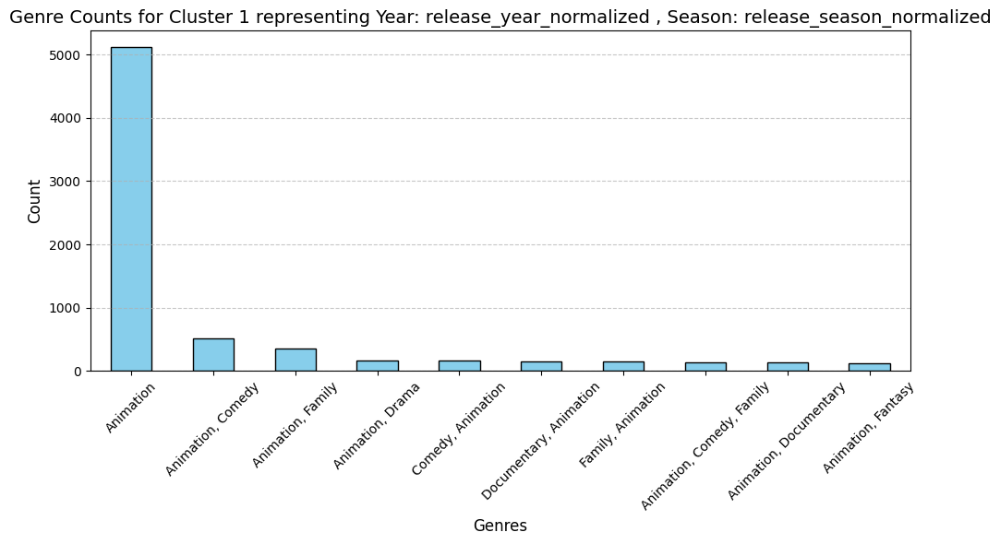


Cluster 2:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
14809,Barbeque,Animation,How do mermaids give birth and where are the l...,English,Short,Fall,Fall,5.000,0.0
45997,Disco Islam,"Science Fiction, Animation","Set in the not-so-distant future, ""Disco Islam...",English,Short,Fall,Fall,0.000,0.0
31286,Mi Prima Águeda,Animation,A young boy lusts over his teenage cousin and ...,Spanish,Short,Fall,Fall,0.000,0.0
34716,Maya De Bij - Het Vreemde Ei,Animation,Unknown,No Language,Short,Fall,Fall,0.000,0.0
5849,Blame!,"Animation, Science Fiction","In the post-apocalyptic future, the complex ne...",Japanese,Short,Fall,Fall,4.700,0.0
481,BURN·E,"Animation, Family, Comedy, Science Fiction",What lengths will a robot undergo to do his jo...,English,Short,Fall,Fall,7.544,0.0
41799,"Ruthe - Shit Happens, Vol. 2","Comedy, Animation",Unknown,German,Short,Fall,Fall,0.000,0.0
5329,Goldilocks and the Jivin' Bears,"Comedy, Animation","The stories of ""Goldilocks"" and ""Little Red Ri...",English,Short,Fall,Fall,5.800,0.0
43607,Giant Bear,Animation,Centered on a confrontation between the last m...,English,Short,Fall,Fall,0.000,0.0
17564,The Kitchen Casanova,Animation,Casanova prepares for his dinner date with Dor...,English,Short,Fall,Fall,6.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
3,0.930233,0.0,1,2
5,0.806202,0.0,1,2
6,0.759690,0.0,1,2
8,0.829457,0.0,1,2
11,0.899225,0.0,1,2
14,0.906977,0.0,1,2
19,0.790698,0.0,1,2
24,0.891473,0.0,1,2
25,0.922481,0.0,1,2
28,0.736434,0.0,1,2


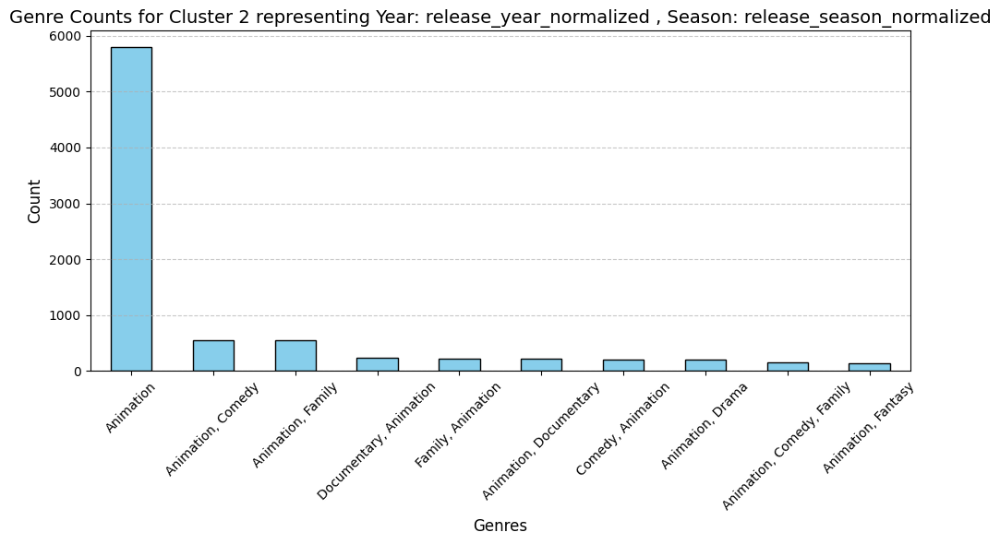


Cluster 3:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
31843,The Merchant of Venice,Animation,"A rich merchant, Antonio is depressed for no g...",English,Short,Winter,Winter,0.000,0.0
12271,Argonauts,"Animation, Adventure, Fantasy",A cartoon version of the voyage of the Argonau...,Russian,Short,Winter,Winter,7.500,0.0
15096,Canada Vignettes: Trading Post,Animation,An animated film about the Hudson's Bay tradin...,English,Short,Winter,Winter,4.000,0.0
12874,Electric Flesh,"Horror, Animation",Stop-motion zombie madness! Heavy Metal and Go...,English,Short,Winter,Winter,7.000,0.0
26249,Flaschko - Der Mann in der Heizdecke,"Animation, Comedy","Flaschko, a man sitting at home, watching TV a...",German,Short,Winter,Winter,0.000,0.0
5646,We're Going on a Bear Hunt,"Animation, Family",We're Going on a Bear Hunt follows the intrepi...,English,Short,Winter,Winter,6.600,0.0
32884,Djune/Idexa,Animation,A hypnotic ode.,No Language,Short,Winter,Winter,0.000,0.0
14609,Problem Pappy,"Animation, Comedy",Popeye's Pappy takes a flagpole sitting job at...,English,Short,Winter,Winter,6.000,0.0
5239,SamSam,"Animation, Family","SamSam, the smallest of the great heroes, has ...",French,Standard,Winter,Winter,4.654,0.0
44171,Kluk dostává filipa,Animation,Unknown,No Language,Short,Winter,Winter,0.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
12,0.922481,1.0,0,3
16,0.937984,1.0,0,3
36,0.953488,1.0,0,3
56,0.906977,1.0,0,3
62,0.868217,1.0,0,3
63,0.310078,1.0,0,3
71,0.968992,1.0,0,3
76,0.410853,1.0,0,3
80,0.798450,1.0,0,3
83,0.945736,1.0,0,3


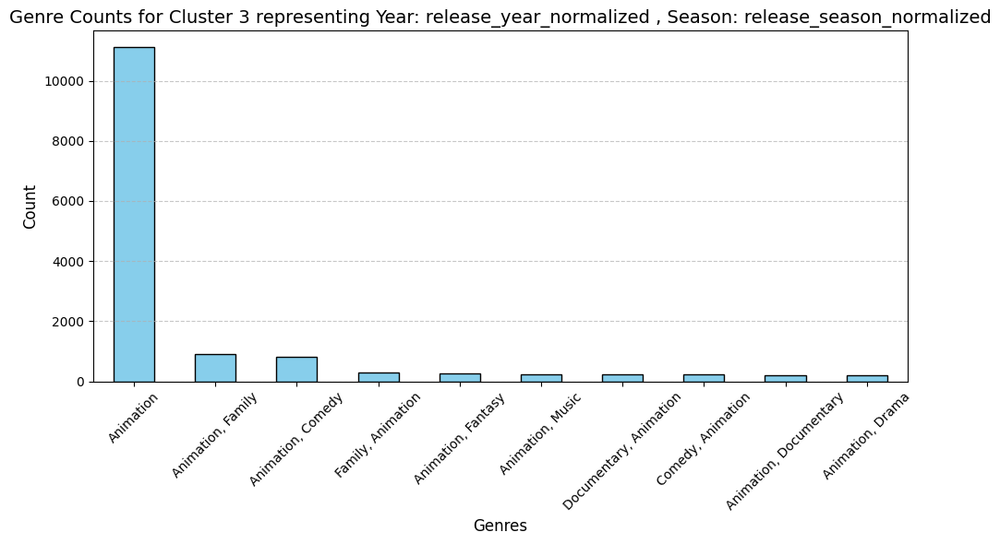


Cluster 4:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
1486,Fantasmagorie,Animation,"An animated film by French auteur Émile Cohl, ...",No Language,Short,Summer,Summer,6.611,0.0
44454,The Magic Fountain Pen,Animation,Unknown,English,Short,Summer,Summer,0.000,0.0
13271,Petit Faust,"Animation, Fantasy",The various parts of Faust are played by puppets.,No Language,Short,Summer,Summer,5.500,0.0
9418,The Twelve Labors of Hercules,"Adventure, Animation, Fantasy",A cut-out animation depicting the Twelve Labou...,No Language,Short,Summer,Summer,5.800,0.0
3329,L'Homme Machine,Animation,Animated stick drawings representing a man wal...,No Language,Short,Winter,Winter,4.696,0.0
24559,Buffon Dance,Animation,Unknown,No Language,Short,Winter,Winter,0.000,0.0
2365,Autour d’une cabine,Animation,The film consists of a series of animations on...,No Language,Short,Winter,Winter,5.833,0.0
16054,Les clowns Price,Animation,Unknown,No Language,Short,Winter,Winter,7.000,0.0
10494,Un rêve au coin du feu,Animation,It is a short film made by Emile Reynaud,No Language,Short,Winter,Winter,3.333,0.0
13272,The Four Little Tailors,"Romance, Fantasy, Comedy, Animation","The opening scene is in a tailor's shop, showi...",No Language,Short,Summer,Summer,4.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1486,0.085271,0.666667,0,4
2365,0.023256,1.000000,0,4
3329,0.007752,1.000000,0,4
4984,0.054264,1.000000,0,4
5767,0.093023,0.666667,0,4
8113,0.077519,0.666667,0,4
9418,0.100775,0.666667,0,4
10494,0.023256,1.000000,0,4
10898,0.031008,0.666667,0,4
13271,0.100775,0.666667,0,4


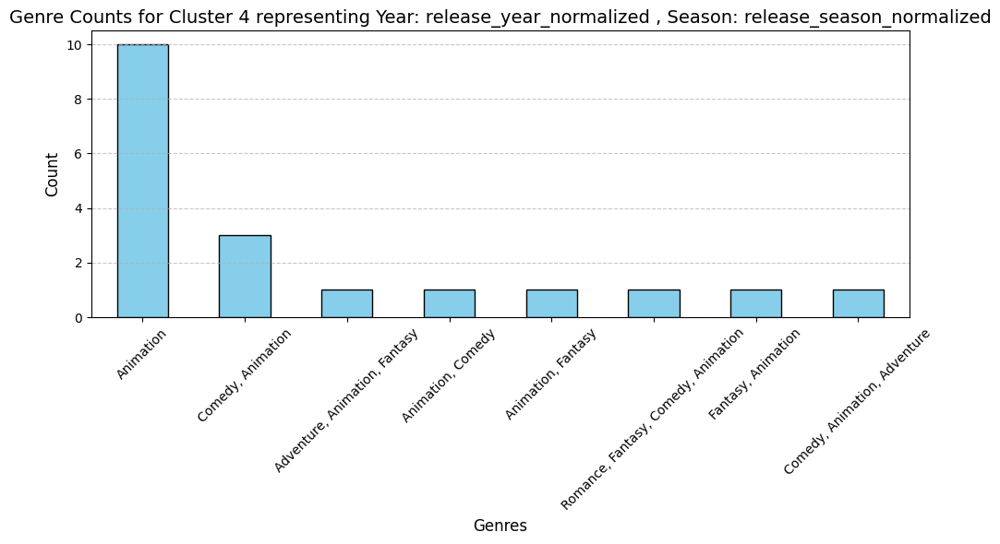


Cluster 5:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
17842,Animated Cotton,Animation,It might not take you long to cotton on to the...,No Language,Short,Fall,Fall,4.000,0.0
6830,Affairs of the Heart,Animation,A near-abstract animation telling a simple rom...,No Language,Short,Fall,Fall,5.500,0.0
9882,The Magic Hoop,"Fantasy, Animation",Émile Cohl mixes live-action and stop-motion a...,No Language,Short,Fall,Fall,4.800,0.0
6767,A Good Beer,Animation,Unknown,No Language,Short,Fall,Fall,4.000,0.0
19961,Rosalie and Her Phonograph,"Fantasy, Comedy, Animation",A jolly housekeeper brings new meaning to the ...,French,Short,Fall,Fall,4.000,0.0
6252,Clown and His Dogs,Animation,Short film of 300 individually painted images.,No Language,Short,Fall,Fall,4.700,0.0
1716,Poor Pierrot,"Comedy, Animation","One night, Arlequin comes to see his lover Col...",French,Short,Fall,Fall,6.029,0.0
5010,The Puppet's Nightmare,"Comedy, Animation","A nightmare, sketched out upon a living blackb...",No Language,Short,Fall,Fall,5.800,0.0
12679,The Sorcerer's Scissors,"Animation, Fantasy","A mix of spectacle, animation and dance, the f...",No Language,Short,Fall,Fall,7.000,0.0
8477,The Little Soldier Who Became a God,"Animation, Comedy",A stop-motion film from Émile Cohl with tin so...,No Language,Short,Fall,Fall,4.400,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1672,0.116279,0.0,1,5
1716,0.015504,0.0,1,5
1992,0.062016,0.0,1,5
2248,0.085271,0.0,1,5
5010,0.085271,0.0,1,5
5138,0.085271,0.0,1,5
6252,0.015504,0.0,1,5
6767,0.015504,0.0,1,5
6830,0.093023,0.0,1,5
8477,0.085271,0.0,1,5


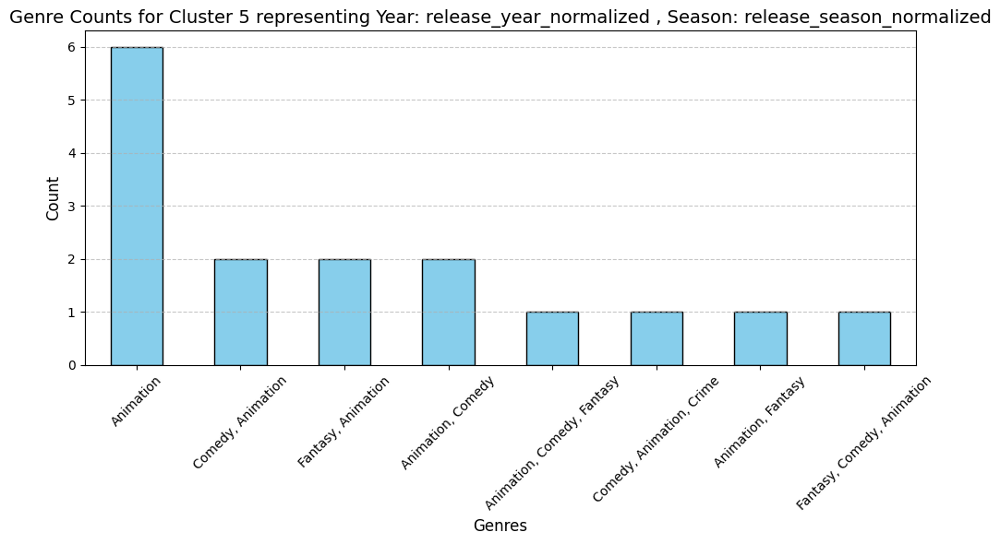


Cluster 6:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
1990,Little Nemo,"Animation, Comedy","Cartoon figures announce, via comic strip ball...",English,Short,Spring,Spring,6.273,0.0
20582,The Strong Arm Squad of the Future,Animation,The Strong Arm Squad of the Future originated ...,No Language,Short,Spring,Spring,6.000,0.0
20552,"Petites causes, grands effets!","Drama, Animation",French animation from O'Galop is a pretty inte...,No Language,Short,Spring,Spring,4.000,0.0
19101,The Master of a Fashionable Game,"Fantasy, Comedy, Animation",The film presents a drawing room meeting of en...,No Language,Short,Spring,Spring,3.000,0.0
12282,The Neo-Impressionist Painter,Animation,A painter is seen in his studio with his model...,No Language,Short,Spring,Spring,5.500,0.0
3598,The Waiter's Dream,"Animation, Comedy, Fantasy",Four customers are having a peaceful game of c...,No Language,Short,Spring,Spring,5.600,0.0
13213,Art's Infancy,Animation,A animation film from Émile Cohl about a painter.,No Language,Short,Spring,Spring,5.500,0.0
12281,A Peace of Coal,"Fantasy, Animation",A British trick film with stop-motion animatio...,No Language,Short,Spring,Spring,4.000,0.0
6761,The Beautiful Leukanida,"Drama, Animation",Two insects fight over the hand of a beautiful...,No Language,Short,Spring,Spring,6.200,0.0
13217,The Mysterious Fine Arts,Animation,In this film several objects make paintings on...,No Language,Short,Spring,Spring,5.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
1990,0.108527,0.333333,1,6
3598,0.100775,0.333333,1,6
6761,0.116279,0.333333,1,6
10366,0.116279,0.333333,1,6
12281,0.100775,0.333333,1,6
12282,0.100775,0.333333,1,6
12593,0.116279,0.333333,1,6
13208,0.100775,0.333333,1,6
13213,0.100775,0.333333,1,6
13217,0.100775,0.333333,1,6


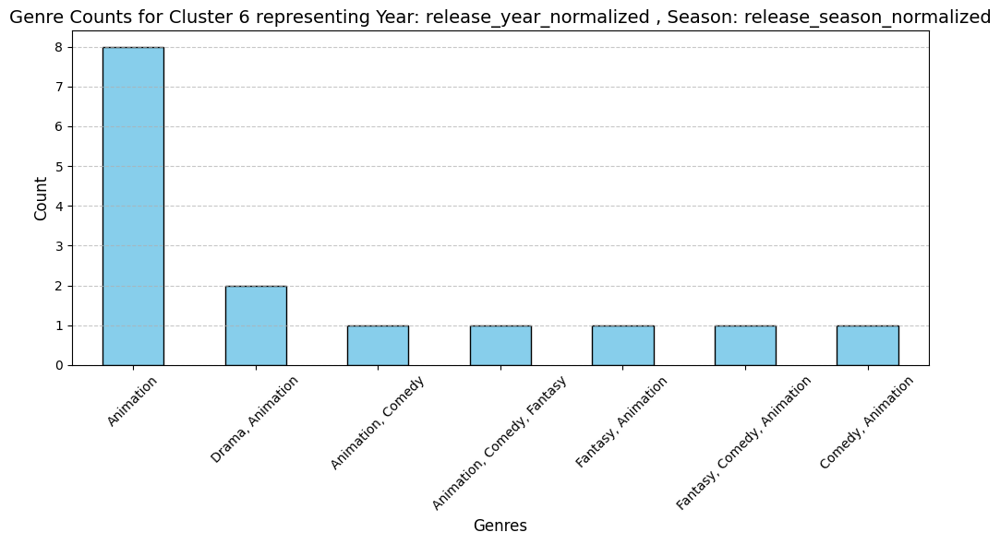


Cluster 7:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
5753,Spanish Clair de Lune,"Romance, Drama, Fantasy, Animation, Comedy",Two lovers perform a fandango dance. A jealous...,No Language,Short,Spring,Spring,5.700,0.0
46885,He Loves to Watch the Flight of Time,"Animation, Comedy",Watching the dial of a taxi-cab is like a fall...,No Language,Short,Spring,Spring,0.000,0.0
2367,Humorous Phases of Funny Faces,"Comedy, Animation",A cartoonist draws faces and figures on a blac...,No Language,Short,Spring,Spring,5.819,0.0
46882,Business Must Not Interfere,"Animation, Comedy",This time the trouble is with Snookums and the...,No Language,Short,Spring,Spring,0.000,0.0
13447,Bewitched Matches,"Fantasy, Animation",Three girls seeking to have their fortunes tol...,No Language,Short,Spring,Spring,5.000,0.0
10676,Matrimonial Shoes,Animation,A film about cupid shoes by Émile Cohl.,No Language,Short,Spring,Spring,5.800,0.0
39422,Urban Science: To Demonstrate How Spiders Fly,"Animation, Documentary",This charming short film is surprisingly techn...,"No Language, English",Short,Spring,Spring,0.000,0.0
9861,Japanese Fantasy,"Animation, Fantasy",This subject presents a remarkably clever seri...,No Language,Short,Spring,Spring,4.500,0.0
6171,The Pumpkin Race,"Comedy, Fantasy, Action, Animation",Early slapstick short from Louis Feuillade inv...,No Language,Short,Spring,Spring,5.500,0.0
7457,The Chinese Shadows,"Comedy, Animation",At the beginning of this film two women come o...,No Language,Short,Spring,Spring,5.000,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
2367,0.069767,0.333333,1,7
3978,0.077519,0.333333,1,7
5733,0.069767,0.333333,1,7
5753,0.093023,0.333333,1,7
6171,0.077519,0.333333,1,7
7457,0.085271,0.333333,1,7
9861,0.093023,0.333333,1,7
10676,0.093023,0.333333,1,7
11692,0.085271,0.333333,1,7
13273,0.093023,0.333333,1,7


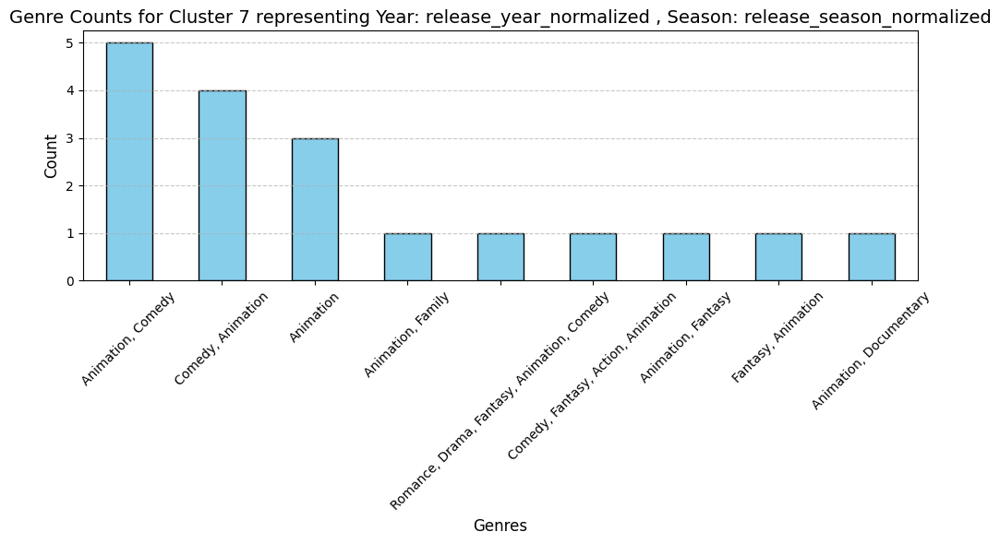


Cluster 8:


,title,genres,overview,spoken_languages,runtime_category,release_season,release_season,vote_average,budget
10580,Le Repas des Poulets,Animation,Praxinoscope animation of a woman feeding chic...,No Language,Short,Spring,Spring,4.000,0.0
13143,Le Moulin à Eau,Animation,Praxinoscope animation of the water mill. Seri...,No Language,Short,Spring,Spring,3.500,0.0
7015,Le Jeu de Corde,Animation,Praxinoscope of a girl in a blue dress skippin...,No Language,Short,Spring,Spring,4.625,0.0
9772,Le Steeple-chase,Animation,Praxinoscope animation of an equestrian riding...,No Language,Short,Spring,Spring,4.250,0.0
4025,The Musician Monkey,Animation,A pre-cinematograph colour animation of the mo...,No Language,Short,Spring,Spring,6.048,153.0
11786,Les Scieurs de Long,Animation,Praxinoscope animation of two workers sawing w...,No Language,Short,Spring,Spring,2.333,0.0
9859,Le Rotisseur,Animation,Praxinoscope animation of a chef rotating meat...,No Language,Short,Spring,Spring,4.750,0.0
7018,"Zim, Boum, Boum",Animation,Praxinoscope animation of a green-suited boy w...,No Language,Short,Spring,Spring,4.125,0.0
11559,Les Clowns,Animation,Praxinoscope animation of clowns dancing with ...,No Language,Short,Spring,Spring,3.333,0.0
4592,The Magic Rosette,Animation,Praxinoscope strip of a shifting rosette. Seri...,No Language,Short,Spring,Spring,5.583,0.0


,release_year_normalized,release_season_normalized,KMEANS,DBSCAN
4025,0.0,0.333333,1,8
4592,0.0,0.333333,1,8
7015,0.0,0.333333,1,8
7018,0.0,0.333333,1,8
8487,0.0,0.333333,1,8
8508,0.0,0.333333,1,8
9755,0.0,0.333333,1,8
9756,0.0,0.333333,1,8
9757,0.0,0.333333,1,8
9758,0.0,0.333333,1,8


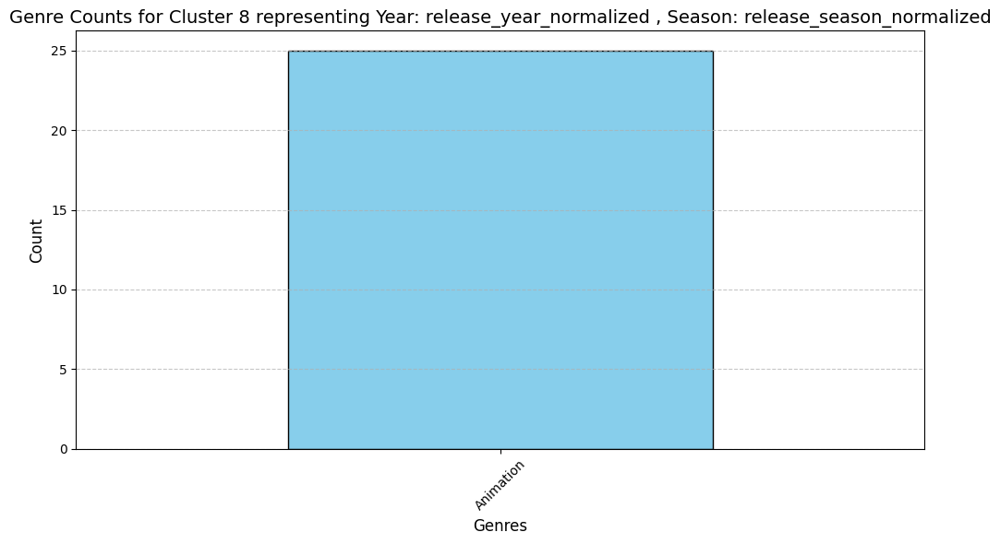

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


DBSCAN with eps=0.37, min_samples=15 | Silhouette Score: 0.815, DB Index: 0.185 ,clusters : 10
Plot Title: DBSCAN Clustering on year_season_features (eps=0.37, min_samples=15)
Explained Variance Ratios (3 Components): [0.77052799 0.19656089 0.02595842]
Total Explained Variance: 0.9930473032913089


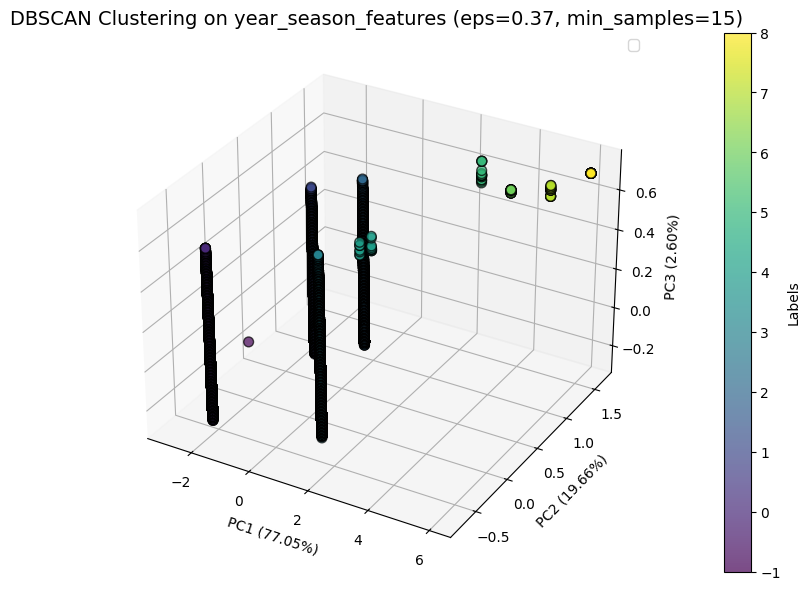

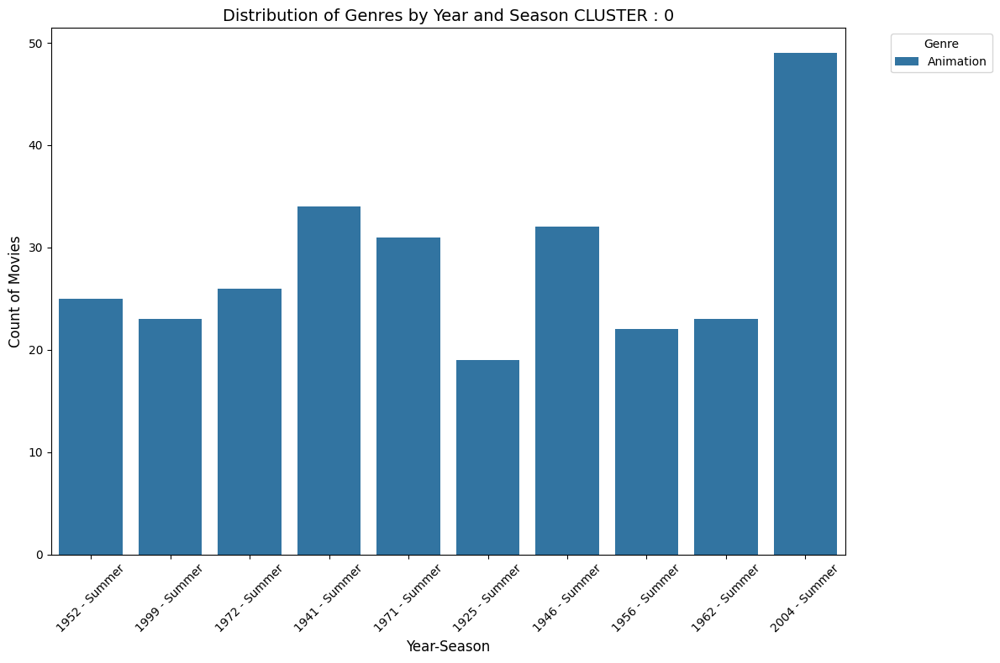

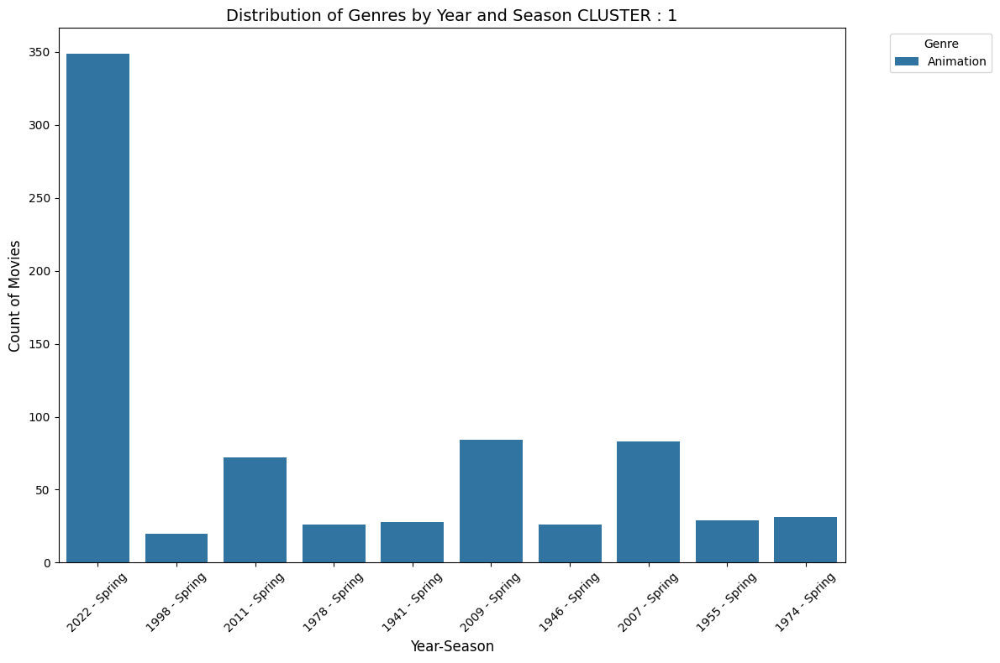

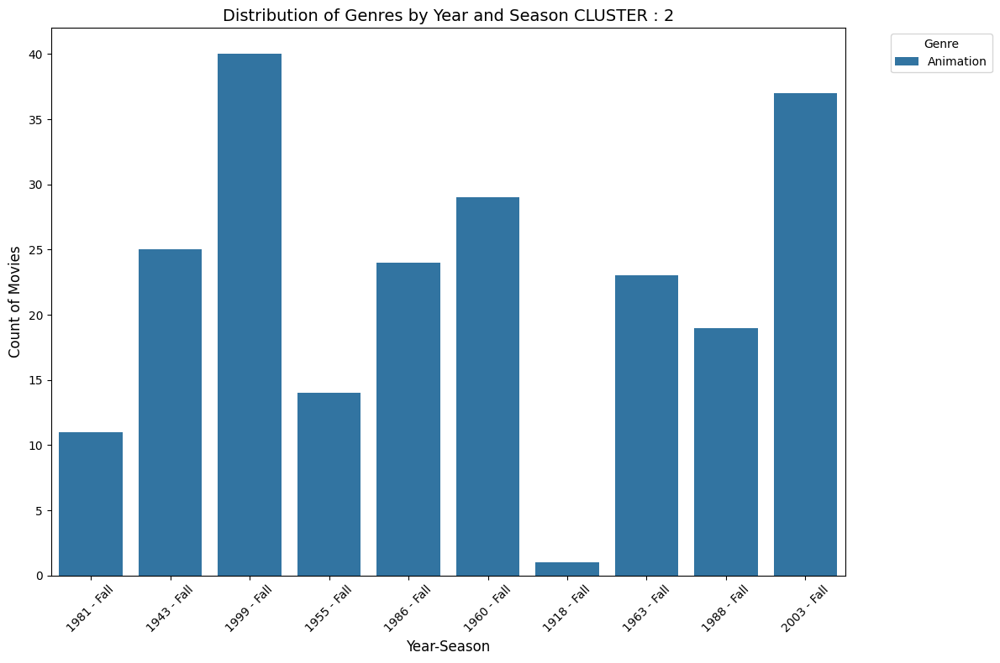

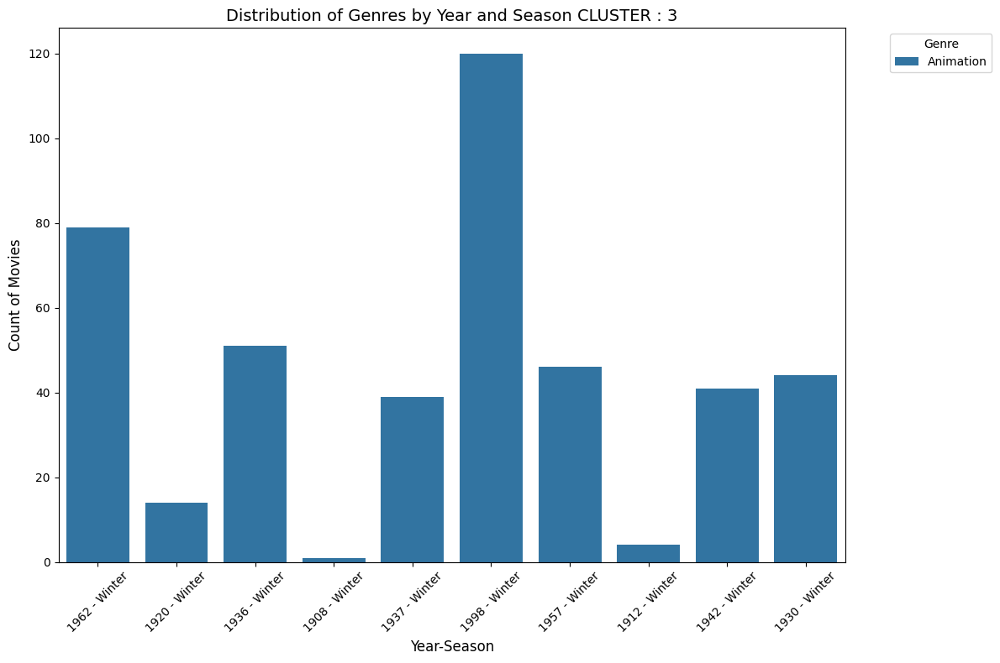

...

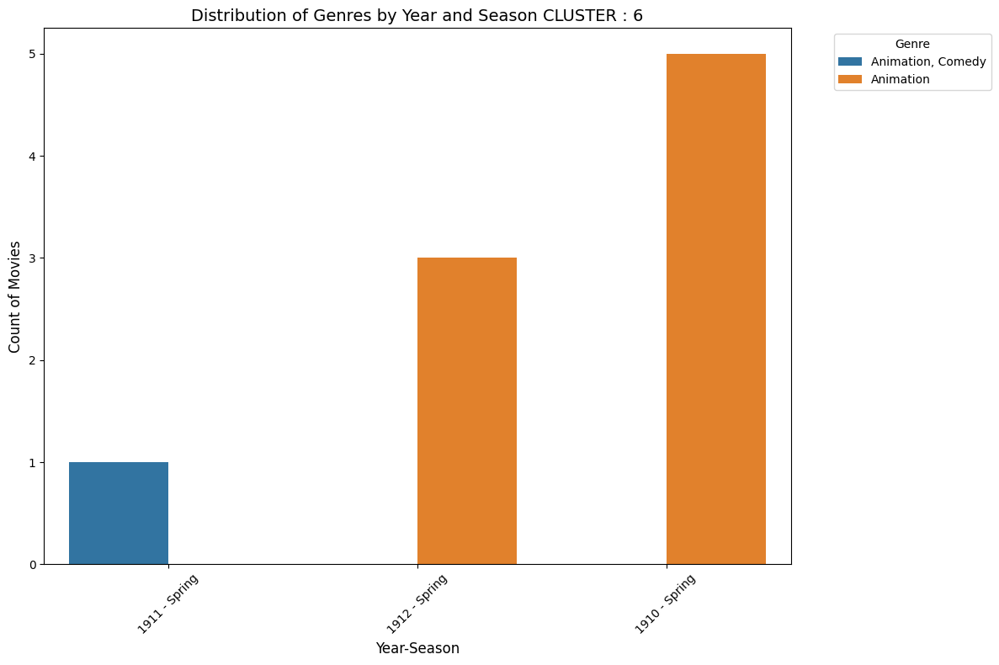

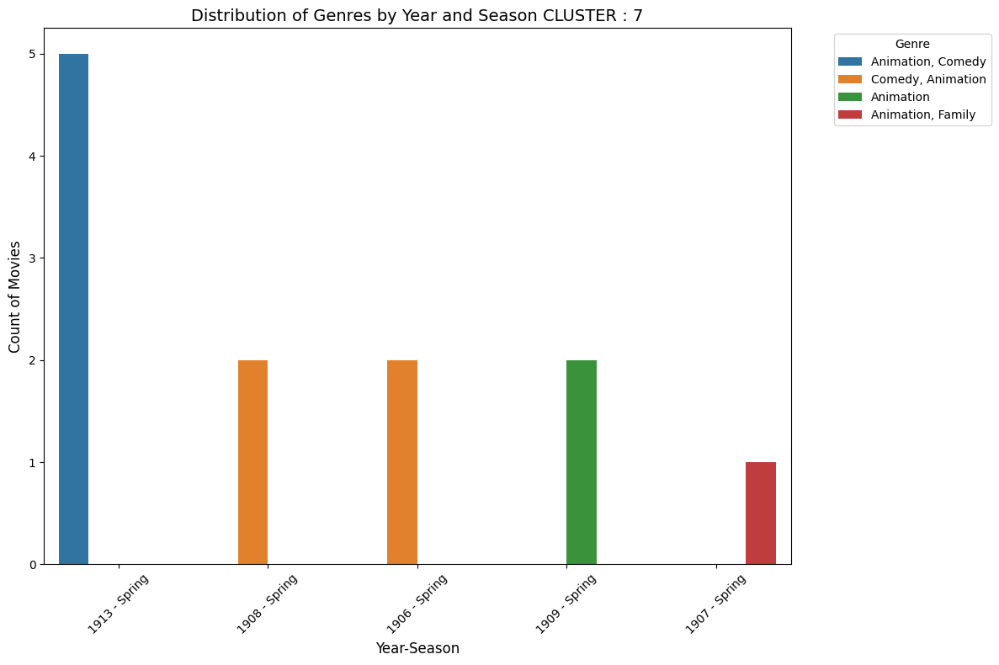

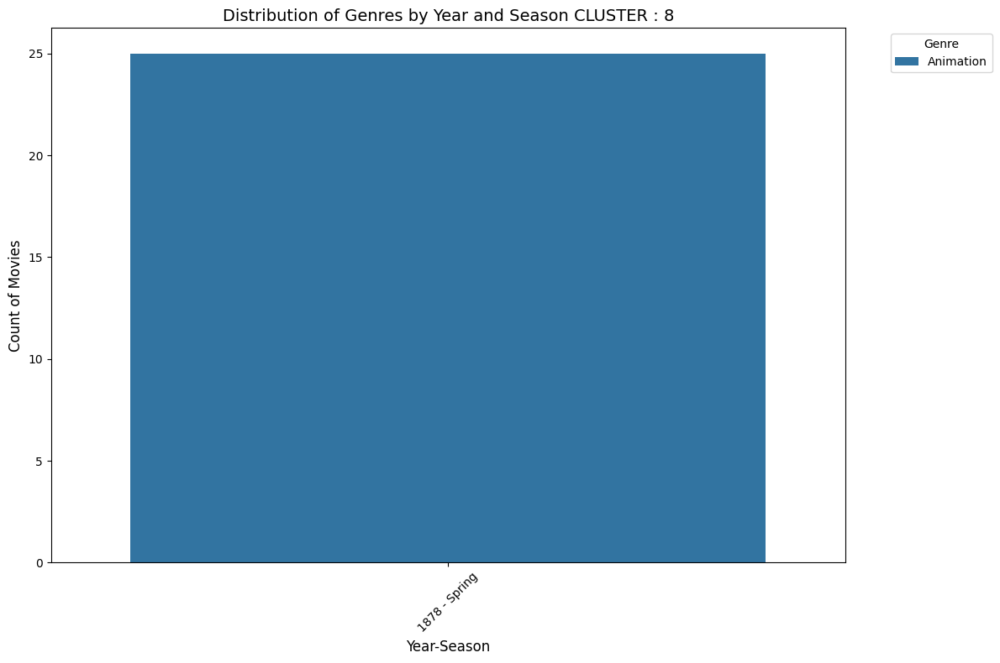

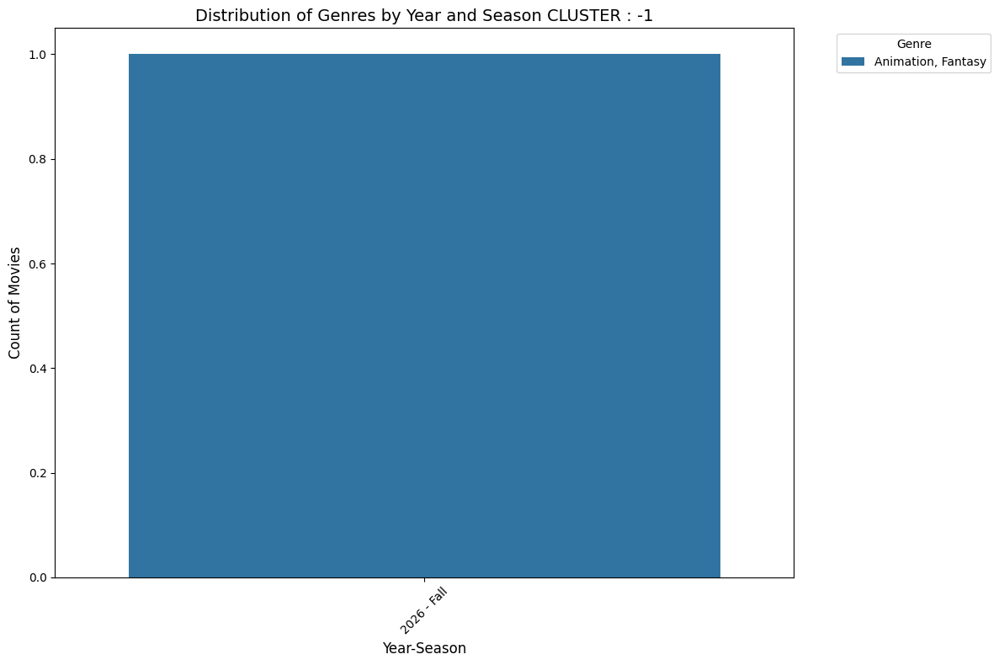

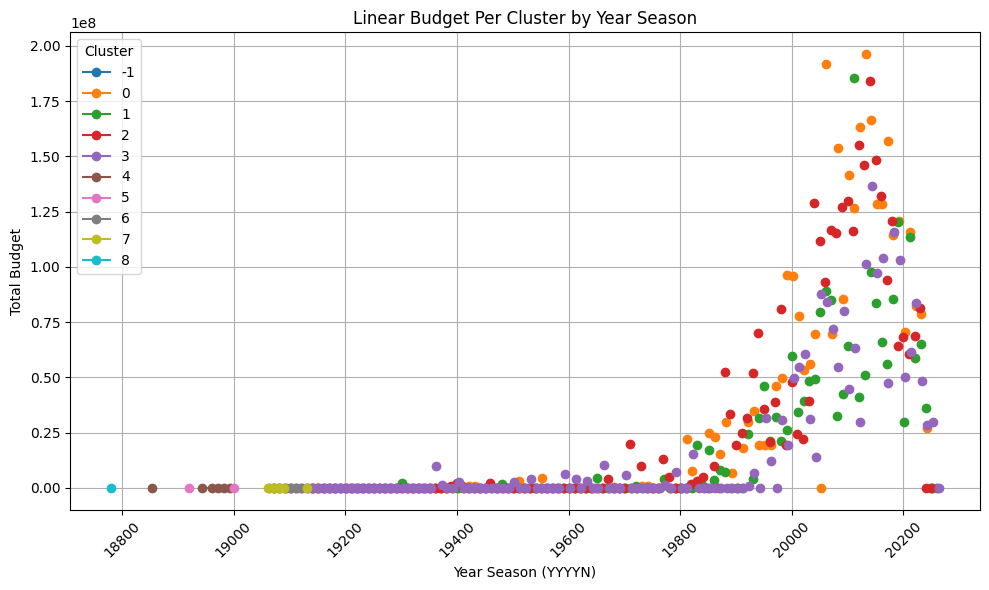

In [113]:
from sklearn.decomposition import PCA
import numpy as np

optimalK={"features":2,
          "year_season_features":2}




epsOptimal={"features":[0.09,0.10,0.2,0.3],
    "year_season_features":[0.014,0.2,0.37]}



for dataset_name, data in datasets.items():

    print(f"Processing dataset: {dataset_name}")
    
    
    
    params = {"n_clusters": optimalK.get(dataset_name)}
    labels, silhouette, db_score,kmeans = run_clustering(data, "KMeans", params)
    if silhouette>0.2:
        data['KMEANS']=labels
        df_cleaned['KMEANS']=labels
        print("Samples from each KMeans cluster:")
        for cluster in sorted(data['KMEANS'].unique()):
            print(f"\nCluster {cluster}:")
            if dataset_name=="features":
                print(f"Cluster Variance for overview_similarity: {df_cleaned[data['KMEANS'] == cluster]['overview_similarity'].var()}")
            
            display(df_cleaned[data['KMEANS'] == cluster][['title','genres','overview','spoken_languages','runtime_category','release_season','vote_average','budget']].sample(n=min(10,df_cleaned[data['KMEANS'] == cluster].shape[0])))
            display(data[data['KMEANS'] == cluster].head(10))
            if dataset_name=="year_season_features":
                colNames=list(data.columns)
                clustername=f"Year: {colNames[0]} , Season: {colNames[1]}"
                plot_genre_counts(df_cleaned,data, cluster, 'genres', 'KMEANS',clustername)
            else:
                plot_genre_counts(df_cleaned,data, cluster, 'genres', 'KMEANS',"")
        evaluation_results.append({
                "Dataset": dataset_name,
                "Algorithm": "KMeans",
                "Params": f"n_clusters={optimalK.get(dataset_name)}",
                "Silhouette Score": silhouette,
                "Davies-Bouldin Index": db_score
            })
        print(f"KMeans with k={optimalK.get(dataset_name)} | Silhouette Score: {silhouette:.3f}, DB Index: {db_score:.3f}, clusters ;{len(data['KMEANS'].unique())}")
        cluster_centers = pd.DataFrame([
        data[labels == cluster].mean(axis=0) for cluster in np.unique(labels)
        ], columns=data.columns)
        visualize_clustering(
                data,
                labels,
                'KMEANS',
                cluster_centers,
                f"KMeans Clustering on {dataset_name} with k={optimalK.get(dataset_name)}"
        )
        if dataset_name=="year_season_features":
            analyze_and_plot_clusters(df_cleaned,'KMEANS','release_year','release_season','genres',list(features.columns))
            plot_linear_budget_per_cluster(df_cleaned,'KMEANS')
    

    #data=data.drop('KMEANS',axis=1)

    
    # DBSCAN خوشه‌بندی با
    eps_values = epsOptimal.get(dataset_name)  # تست کردن سه مقدار مختلف برای eps
    min_samples_values = [6, 10, 15]  # تست کردن سه مقدار مختلف برای حداقل نمونه‌ها
    for eps in eps_values:
        for min_samples in min_samples_values:
            
            params = {"eps": eps, "min_samples": min_samples}
            labels, silhouette, db_score = run_clustering(data, "DBSCAN", params)
            if silhouette>0.2:
                data['DBSCAN']=labels
                df_cleaned['DBSCAN']=labels
                print("\nSamples from each DBSCAN cluster:")
                for cluster in sorted(data['DBSCAN'].unique()):
                    print(f"\nCluster {cluster}:")
                    if dataset_name=="features":
                        print(f"Cluster Variance for overview_similarity: {df_cleaned[data['DBSCAN'] == cluster]['overview_similarity'].var()}")
                    display(df_cleaned[data['DBSCAN'] == cluster][['title','genres','overview','spoken_languages','runtime_category','release_season','release_season','vote_average','budget']].sample(n=min(10,df_cleaned[data['DBSCAN'] == cluster].shape[0])))
                    display(data[data['DBSCAN'] == cluster].head(10))
                    if dataset_name=="year_season_features":
                        colNames=list(data.columns)
                        clustername=f"Year: {colNames[0]} , Season: {colNames[1]}"
                        plot_genre_counts(df_cleaned,data, cluster, 'genres', 'DBSCAN',clustername)
                    else:
                        plot_genre_counts(df_cleaned,data, cluster, 'genres', 'DBSCAN',"")
                evaluation_results.append({
                    "Dataset": dataset_name,
                    "Algorithm": "DBSCAN",
                    "Params": f"eps={eps}, min_samples={min_samples}",
                    "Silhouette Score": silhouette,
                    "Davies-Bouldin Index": db_score
                })
                print(f"DBSCAN with eps={eps}, min_samples={min_samples} | Silhouette Score: {silhouette:.3f}, DB Index: {db_score:.3f} ,clusters : {len(data['DBSCAN'].unique())}")
                cluster_centers = []
                for cluster in data['DBSCAN'].unique():
                    # Select points belonging to the current cluster
                    cluster_points = data[labels == cluster]
                    # Compute the centroid (mean of the points)
                    centroid = np.mean(cluster_points, axis=0).sum()
                    cluster_centers.append(centroid)
                visualize_clustering(
                    data,
                    labels,
                    'DBSCAN',
                    None,
                    f"DBSCAN Clustering on {dataset_name} (eps={eps}, min_samples={min_samples})"
                )
                if dataset_name=="year_season_features":
                    analyze_and_plot_clusters(df_cleaned,'DBSCAN','release_year','release_season','genres',list(features.columns))
                    plot_linear_budget_per_cluster(df_cleaned,'DBSCAN')

            #data=data.drop('DBSCAN',axis=1)

    






In [115]:

# نمایش بهترین نتایج
evaluation_df = pd.DataFrame(evaluation_results)
print("\nBest results:")
print(evaluation_df.sort_values(by="Silhouette Score", ascending=False).head(20))



Best results:
                 Dataset Algorithm                     Params  \
13  year_season_features    DBSCAN    eps=0.2, min_samples=15   
9   year_season_features    DBSCAN  eps=0.014, min_samples=10   
14  year_season_features    DBSCAN    eps=0.37, min_samples=6   
11  year_season_features    DBSCAN     eps=0.2, min_samples=6   
12  year_season_features    DBSCAN    eps=0.2, min_samples=10   
16  year_season_features    DBSCAN   eps=0.37, min_samples=15   
15  year_season_features    DBSCAN   eps=0.37, min_samples=10   
10  year_season_features    DBSCAN  eps=0.014, min_samples=15   
3               features    DBSCAN    eps=0.2, min_samples=15   
4               features    DBSCAN     eps=0.3, min_samples=6   
5               features    DBSCAN    eps=0.3, min_samples=10   
6               features    DBSCAN    eps=0.3, min_samples=15   
2               features    DBSCAN    eps=0.2, min_samples=10   
7   year_season_features    KMeans               n_clusters=2   
8   year_s